<a href="https://colab.research.google.com/github/rajagopalmotivate/DeepLearnIITMA1/blob/master/DCGAN_with_2_different_generators_and_1_Classifier_Good_Nandri_ver11%20intermediate%20output1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

this is ensemble of 2 identical G

this step is to train each G seperately 

once each G generates meaniful results, then ensemble them

the way to train seperate is 
1) seperate train and load weights 
2) train with Avg (same G)


In [1]:
from IPython.display import Image
from keras.utils import plot_model
# Install dependencies
!apt install graphviz
!pip install pydot pydot-ng
!echo "Double check with Python 3"
!python -c "import pydot"

Using TensorFlow backend.


Reading package lists... Done
Building dependency tree       
Reading state information... Done
graphviz is already the newest version (2.40.1-2).
0 upgraded, 0 newly installed, 0 to remove and 8 not upgraded.
Double check with Python 3


In [0]:
# Restart runtime to allow Jupyter to know the changes above
import os
os._exit(0)

In [0]:
from keras.datasets import mnist
from keras.datasets import fashion_mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate, Average
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Model
from keras.optimizers import Adam
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from keras.models import load_model
from google.colab import files
import copy 

In [0]:
def load_dataold():
    (X_train, _), (_, _) = fashion_mnist.load_data()
    X_train = (X_train.astype(np.float32) - 127.5) / 127.5
    X_train = np.expand_dims(X_train, axis=3)
    return X_train

In [0]:
def load_large_data():
    (X_train1, _), (_, _) = mnist.load_data()
    (X_train2, _), (_, _) = fashion_mnist.load_data()
    
    X_trainlarge = np.zeros([10000,56,56],dtype=np.uint8)
    
    for i in range(0, 100):
      for j in range(0, 100):    
          aimage1 = X_train2[i]
          aimage2 = X_train2[j]
          largeimage =  np.zeros([56,56],dtype=np.uint8)
          largeimage[0:56, 0:56] = 40
          largeimage[0:28, 0:28] = aimage2
          largeimage[0:28, 28:56] = aimage1
          X_trainlarge[i*100 + j] = largeimage
 
    
    fig=plt.figure(figsize=(16, 16))
    for i in range(0, 10):
      for j in range(0, 10):
          fig.add_subplot(10, 10, i*10 + j +1)
          plt.imshow(X_trainlarge[i*100 + j + 1000])
  ##plt.show()
    
    print(X_train2.shape)
    print(X_trainlarge.shape)
    
    plt.imshow(aimage1)
    plt.show()  
 
    plt.imshow(aimage2)
    plt.show()
    
    plt.imshow(largeimage, interpolation='none')
    plt.show()
    

    X_trainlarge = (X_trainlarge.astype(np.float32) - 127.5) / 127.5
    X_trainlarge = np.expand_dims(X_trainlarge, axis=3)


    return X_trainlarge

In [0]:
##X_trainlarge = load_large_data()

In [0]:
def load_databydatasetname(datasetname):
  if (datasetname == 1):   
    (X_train, _), (_, _) = mnist.load_data()
  if (datasetname == 2):   
    (X_train, _), (_, _) = fashion_mnist.load_data()
  X_train = (X_train.astype(np.float32) - 127.5) / 127.5
  X_train = np.expand_dims(X_train, axis=3)
  return X_train
  

In [0]:
def build_generator(noise_shape=(100,)):
    input = Input(noise_shape)
    x = Dense(128 * 7 * 7, activation="relu")(input)
    x = Reshape((7, 7, 128))(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = UpSampling2D()(x)
    x = Conv2D(128, kernel_size=3, padding="same")(x)
    x = Activation("relu")(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = UpSampling2D()(x)
    x = Conv2D(64, kernel_size=3, padding="same")(x)
    x = Activation("relu")(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = Conv2D(1, kernel_size=3, padding="same")(x)
    out = Activation("tanh")(x)
    model = Model(input, out)
    print("-- Generator -- ")
    model.summary()
    return model

In [0]:
def build_discriminator(img_shape):
    input = Input(img_shape)
    x =Conv2D(32, kernel_size=3, strides=2, padding="same")(input)
    x = LeakyReLU(alpha=0.2)(x)
    x = Dropout(0.25)(x)
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = ZeroPadding2D(padding=((0, 1), (0, 1)))(x)
    x = (LeakyReLU(alpha=0.2))(x)
    x = Dropout(0.25)(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = Conv2D(128, kernel_size=3, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Dropout(0.25)(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = Conv2D(256, kernel_size=3, strides=1, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Dropout(0.25)(x)
    x = Flatten()(x)
    out = Dense(1, activation='sigmoid')(x)

    model = Model(input, out)
    print("-- Discriminator -- ")
    model.summary()
    return model

In [0]:
def save_imgs(generator, epoch, batch):
    r, c = 5, 5
    noise = np.random.normal(0, 1, (r * c, 100))
    gen_imgs = generator.predict(noise)

    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    ##fig.savefig("images/mnist_%d_%d.png" % (epoch, batch))
    plt.show()
    plt.close()

In [0]:
def build_generator_model():

    gen_optimizer = Adam(lr=0.0002, beta_1=0.5)
 
    generator = build_generator()
    generator.compile(loss='binary_crossentropy', optimizer=gen_optimizer)

  
    return generator

In [0]:


def plotamodel(amodel):
  # Model summary
  print(amodel.summary())

  # Plot model graph
  plot_model(amodel, show_shapes=True, show_layer_names=True, to_file='model.png')
  Image(retina=True, filename='model.png')

In [0]:
def build_classifier_model():

    disc_optimizer = Adam(lr=0.0002, beta_1=0.5)


    discriminator = build_discriminator(img_shape=(28, 28, 1))
    discriminator.compile(loss='binary_crossentropy',
                               optimizer=disc_optimizer,
                               metrics=['accuracy'])


    return  discriminator

In [0]:
def train(generator1, generator2, discriminator, combined, mergedmodel,  epochs=2000, batch_size=128, save_interval=50, modeltotrain=1):

    X_train = load_databydatasetname(2)

    num_examples = X_train.shape[0] / 2
    num_batches = int(num_examples / float(batch_size))
    print('Number of examples: ', num_examples)
    print('Number of Batches: ', num_batches)
    print('Number of epochs: ', epochs)

    half_batch = int(batch_size / 2)
    ##quater_batch = int(half_batch / 2) 

    for epoch in range(epochs + 1):
        for batch in range(num_batches):

            # noise images for the batch
            noise1 = np.random.normal(0, 1, (half_batch, 100))
            fake_images1 = generator1.predict(noise1)
            fake_labels1 = np.zeros((half_batch, 1))
            
           ## noise2 = np.random.normal(0, 1, (half_batch, 100))
            noise2 = copy.deepcopy(noise1)
            fake_images2 = generator2.predict(noise2)
            fake_labels2 = np.zeros((half_batch, 1))
            
            noise2 = copy.deepcopy(noise1)
            fake_images3 = mergedmodel.predict(noise2)
            fake_labels3 = np.zeros((half_batch, 1))            
            
           ## fake_images = np.append(fake_images1 , fake_images2, axis=0)
           ## fake_labels = np.append( fake_labels1 , fake_labels2, axis=0)
            
            if modeltotrain == 1:
              fake_images = fake_images1
              fake_labels = fake_labels1
            if modeltotrain == 2:
              fake_images = fake_images2
              fake_labels = fake_labels2
            if modeltotrain == 3:
              fake_images = fake_images3
              fake_labels = fake_labels3              
            
            if(batch == 0):
              print("G1 output numpy array shape")
              print(fake_images1.shape)
              print("G1+G2 appended numpy array shape")
              print(fake_images.shape)

            # real images for batch
            idx = np.random.randint(0, X_train.shape[0], half_batch)
            real_images = X_train[idx]
            real_labels = np.ones((half_batch, 1))

            # Train the discriminator (real classified as ones and generated as zeros)
            d_loss_real = discriminator.train_on_batch(real_images, real_labels)
            d_loss_fake = discriminator.train_on_batch(fake_images, fake_labels)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            noise = np.random.normal(0, 1, (batch_size, 100))
            # Train the generator
            g_loss = combined.train_on_batch(noise, np.ones((batch_size, 1)))

            # Plot the progress
            print("Epoch %d Batch %d/%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" %
                  (epoch,batch, num_batches, d_loss[0], 100 * d_loss[1], g_loss))

            if batch % 100 == 0:
                 save_imgs(generator1, epoch, batch)
            if batch % 101 == 0:
                 save_imgs(generator2, epoch, batch)
            if batch % 102 == 0:
                 save_imgs(mergedmodel, epoch, batch)
                








In [0]:
def build_combined_model():

    discriminatormymodel = build_classifier_model

    generatormymodel = build_generator_model()
   
    optimizer1 = Adam(lr=0.0002, beta_1=0.5)


    z = Input(shape=(100,))
    img = generatormymodel(z)
    discriminatormymodel.trainable = False
    real = discriminatormymodel(img)
    
    combined = Model(z, real)
    
    combined.compile(loss='binary_crossentropy', optimizer=optimizer1)
    return combined

In [0]:
def getlastlayer(amodel):
  for layer in amodel.layers:
    layerlast = layer
  print(layer)
  print(layer.get_config())
  print(layer.input)
  print(layer.input_shape)
  print(layer.output)
  print('output shape of last is ')
  print(layer.output_shape)
  return layer

In [0]:
def build_models():

    gen1_optimizer = Adam(lr=0.0002, beta_1=0.5)
    gen2_optimizer = Adam(lr=0.0002, beta_1=0.5)
    disc_optimizer = Adam(lr=0.0002, beta_1=0.5)


    discriminator = build_discriminator(img_shape=(28, 28, 1))
    discriminator.compile(loss='binary_crossentropy', optimizer=disc_optimizer,  metrics=['accuracy'])

    generator1 = build_generator()
    
    generator2 = build_generator()

    z = Input(shape=(100,))
    img1 = generator1(z)
    img2 = generator2(z)
    merged = Average(getlastlayer(img1).output, getlastlayer(img2).output)
    
    mergedmodel = Model(z, merged)
    
    discriminator.trainable = False
    real = discriminator(merged)
    combined = Model(z, real)
    
    combined.summary()
    
    generator1.compile(loss='binary_crossentropy', optimizer=gen1_optimizer)
    generator2.compile(loss='binary_crossentropy', optimizer=gen2_optimizer)
    
    combined.compile(loss='binary_crossentropy', optimizer=gen_optimizer)
    return generator, discriminator, combined, mergedmodel

In [0]:
def build_modelsNEW(averagemode = 1, loadpretrainedweights=False):
    z = Input(shape=(100,))
    inputz = z
    x = Dense(128 * 7 * 7, activation="relu")(inputz)
    x = Reshape((7, 7, 128))(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = UpSampling2D()(x)
    x = Conv2D(128, kernel_size=3, padding="same")(x)
    x = Activation("relu")(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = UpSampling2D()(x)
    x = Conv2D(64, kernel_size=3, padding="same")(x)
    x = Activation("relu")(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = Conv2D(1, kernel_size=3, padding="same")(x)
    out = Activation("tanh")(x)    
    generator1 = Model(inputz, out)
    
    inputz2 = z
    x1 = Dense(128 * 7 * 7, activation="relu")(inputz2)
    x1 = Reshape((7, 7, 128))(x1)
    x1 = BatchNormalization(momentum=0.8)(x1)
    x1 = UpSampling2D()(x1)
    x1 = Conv2D(128, kernel_size=3, padding="same")(x1)
    x1 = Activation("relu")(x1)
    x1 = BatchNormalization(momentum=0.8)(x1)
    x1 = UpSampling2D()(x1)
    x1 = Conv2D(64, kernel_size=3, padding="same")(x1)
    x1 = Activation("relu")(x1)
    x1 = BatchNormalization(momentum=0.8)(x1)
    x1 = Conv2D(1, kernel_size=3, padding="same")(x1)
    out1 = Activation("tanh")(x1)    
    generator2 = Model(inputz2, out1)
    
    
    img1 = generator1(z)
    img2 = generator2(z)
    
    
    aoptimizer = Adam(lr=0.0002, beta_1=0.5)   
    discriminator = build_discriminator(img_shape=(28, 28, 1))
    discriminator.compile(loss='binary_crossentropy', optimizer=aoptimizer,  metrics=['accuracy'])
    
    if(averagemode == 1):
          models = [generator1, generator1]
    if(averagemode == 2):
          models = [generator2, generator2]
    if(averagemode == 3):
          models = [generator1, generator2]


  ##  models = [generator1, generator2]
 ##   models = [generator1, generator1]
    outputs = [model.outputs[0] for model in models]
    merged = Average()(outputs)
    
    mergedmodel = Model(z, merged)
    
    discriminator.trainable = False
    real = discriminator(merged)
    combined = Model(z, real)
        

    
    if(loadpretrainedweights==True):
    #  generator1 = generator1.load_weights('generatorTrainedepoch2.h5')
    #  generator2 = generator2.load_weights('generator2Trainedepoch2.h5')
      generator1 = load_model('generator1fmnist.h5')
      generator2 = load_model('generator2fmnist.h5')
      

    generator1.compile(loss='binary_crossentropy', optimizer=aoptimizer)
    generator2.compile(loss='binary_crossentropy', optimizer=aoptimizer)  
    combined.compile(loss='binary_crossentropy', optimizer=aoptimizer) 
  
    #plotamodel(mergedmodel)
    plotamodel(combined)
    
    return generator1, generator2, discriminator, combined ,  mergedmodel

In [18]:
generator1, generator2, discriminator, combined , mergedmodel = build_modelsNEW( averagemode = 1 ,  loadpretrainedweights=False)


    
    

    


-- Discriminator -- 
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 14, 14, 32)        320       
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 14, 14, 32)        0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 7, 7, 64)          18496     
_________________________________________________________________
zero_padding2d_2 (ZeroPaddin (None, 8, 8, 64)          0         
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 8, 8, 64)          

In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1)

In [0]:
#train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1, modeltotrain=2)

In [0]:
!rm -rf generatorTrainedepoch2.h5

generator1.save('generator1fminst2.h5')



In [21]:
generator1, generator2, discriminator, combined , mergedmodel = build_modelsNEW( averagemode = 2 ,  loadpretrainedweights=False)


-- Discriminator -- 
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_33 (Conv2D)           (None, 14, 14, 32)        320       
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 14, 14, 32)        0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 7, 7, 64)          18496     
_________________________________________________________________
zero_padding2d_3 (ZeroPaddin (None, 8, 8, 64)          0         
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 8, 8, 64)          

Number of examples:  30000.0
Number of Batches:  937
Number of epochs:  2
G1 output numpy array shape
(16, 28, 28, 1)
G1+G2 appended numpy array shape
(16, 28, 28, 1)


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch 0 Batch 0/937 [D loss: 0.856992, acc.: 40.62%] [G loss: 0.650713]


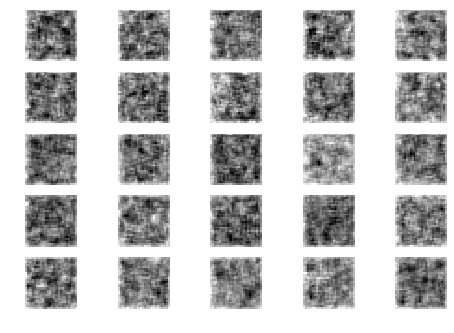

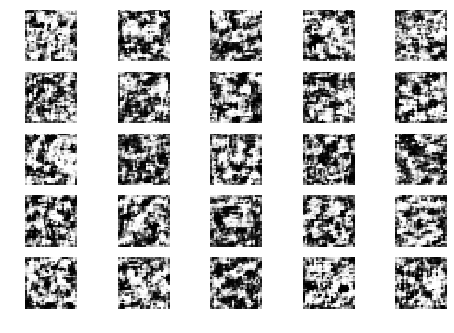

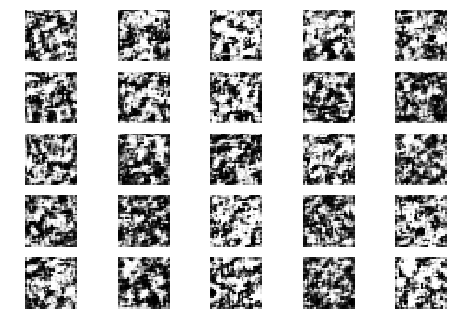

Epoch 0 Batch 1/937 [D loss: 0.779687, acc.: 43.75%] [G loss: 0.672330]
Epoch 0 Batch 2/937 [D loss: 0.564039, acc.: 65.62%] [G loss: 0.890363]
Epoch 0 Batch 3/937 [D loss: 0.617889, acc.: 65.62%] [G loss: 0.938948]
Epoch 0 Batch 4/937 [D loss: 0.618526, acc.: 62.50%] [G loss: 0.886648]
Epoch 0 Batch 5/937 [D loss: 0.386840, acc.: 84.38%] [G loss: 1.177889]
Epoch 0 Batch 6/937 [D loss: 0.454393, acc.: 78.12%] [G loss: 1.324649]
Epoch 0 Batch 7/937 [D loss: 0.400415, acc.: 84.38%] [G loss: 1.278526]
Epoch 0 Batch 8/937 [D loss: 0.500051, acc.: 78.12%] [G loss: 1.405422]
Epoch 0 Batch 9/937 [D loss: 0.465288, acc.: 84.38%] [G loss: 1.354209]
Epoch 0 Batch 10/937 [D loss: 0.392907, acc.: 84.38%] [G loss: 1.455445]
Epoch 0 Batch 11/937 [D loss: 0.475388, acc.: 84.38%] [G loss: 1.365821]
Epoch 0 Batch 12/937 [D loss: 0.336548, acc.: 84.38%] [G loss: 1.601428]
Epoch 0 Batch 13/937 [D loss: 0.363867, acc.: 87.50%] [G loss: 1.524690]
Epoch 0 Batch 14/937 [D loss: 0.393180, acc.: 90.62%] [G los

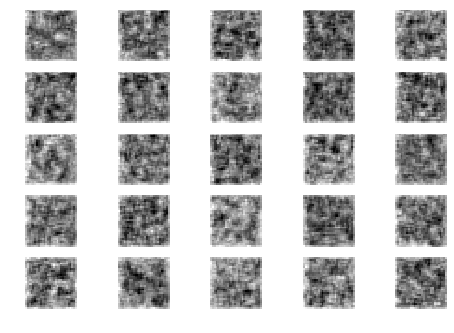

Epoch 0 Batch 101/937 [D loss: 0.856638, acc.: 50.00%] [G loss: 1.612584]


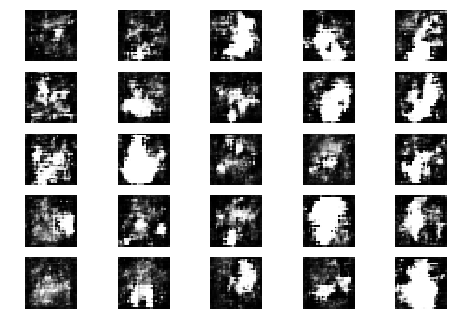

Epoch 0 Batch 102/937 [D loss: 0.723170, acc.: 59.38%] [G loss: 1.405045]


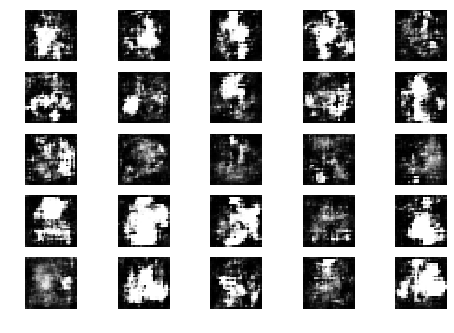

Epoch 0 Batch 103/937 [D loss: 0.445763, acc.: 81.25%] [G loss: 1.191424]
Epoch 0 Batch 104/937 [D loss: 0.580026, acc.: 71.88%] [G loss: 1.669510]
Epoch 0 Batch 105/937 [D loss: 0.440295, acc.: 84.38%] [G loss: 1.478427]
Epoch 0 Batch 106/937 [D loss: 0.394418, acc.: 81.25%] [G loss: 1.600768]
Epoch 0 Batch 107/937 [D loss: 0.607884, acc.: 65.62%] [G loss: 1.213625]
Epoch 0 Batch 108/937 [D loss: 0.755501, acc.: 59.38%] [G loss: 1.557994]
Epoch 0 Batch 109/937 [D loss: 0.547402, acc.: 71.88%] [G loss: 2.168946]
Epoch 0 Batch 110/937 [D loss: 0.619181, acc.: 68.75%] [G loss: 1.797380]
Epoch 0 Batch 111/937 [D loss: 0.631500, acc.: 65.62%] [G loss: 1.733756]
Epoch 0 Batch 112/937 [D loss: 0.603461, acc.: 65.62%] [G loss: 1.951348]
Epoch 0 Batch 113/937 [D loss: 0.803698, acc.: 46.88%] [G loss: 1.789197]
Epoch 0 Batch 114/937 [D loss: 0.583807, acc.: 71.88%] [G loss: 1.650673]
Epoch 0 Batch 115/937 [D loss: 0.787512, acc.: 53.12%] [G loss: 1.933999]
Epoch 0 Batch 116/937 [D loss: 0.76428

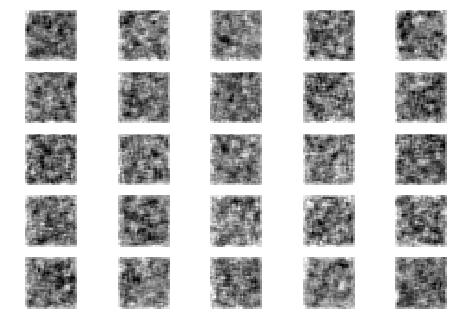

Epoch 0 Batch 201/937 [D loss: 0.739347, acc.: 62.50%] [G loss: 1.957968]
Epoch 0 Batch 202/937 [D loss: 0.534758, acc.: 71.88%] [G loss: 2.135490]


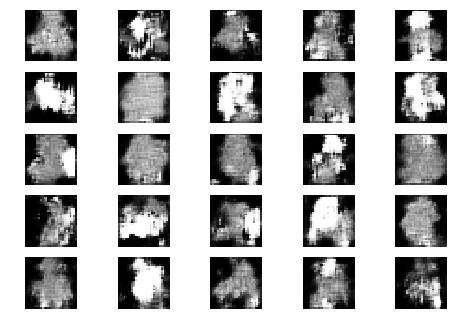

Epoch 0 Batch 203/937 [D loss: 0.555231, acc.: 71.88%] [G loss: 1.795230]
Epoch 0 Batch 204/937 [D loss: 0.985481, acc.: 43.75%] [G loss: 1.340361]


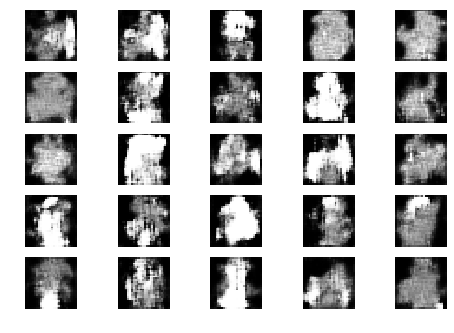

Epoch 0 Batch 205/937 [D loss: 0.560263, acc.: 81.25%] [G loss: 1.751532]
Epoch 0 Batch 206/937 [D loss: 0.719283, acc.: 62.50%] [G loss: 1.816558]
Epoch 0 Batch 207/937 [D loss: 0.601104, acc.: 71.88%] [G loss: 1.287746]
Epoch 0 Batch 208/937 [D loss: 0.603867, acc.: 62.50%] [G loss: 1.429651]
Epoch 0 Batch 209/937 [D loss: 0.519549, acc.: 81.25%] [G loss: 1.608262]
Epoch 0 Batch 210/937 [D loss: 0.333213, acc.: 90.62%] [G loss: 1.440666]
Epoch 0 Batch 211/937 [D loss: 0.570936, acc.: 75.00%] [G loss: 1.755867]
Epoch 0 Batch 212/937 [D loss: 0.729200, acc.: 59.38%] [G loss: 1.497924]
Epoch 0 Batch 213/937 [D loss: 0.752047, acc.: 59.38%] [G loss: 1.634454]
Epoch 0 Batch 214/937 [D loss: 0.513281, acc.: 87.50%] [G loss: 1.974384]
Epoch 0 Batch 215/937 [D loss: 0.515151, acc.: 75.00%] [G loss: 1.778036]
Epoch 0 Batch 216/937 [D loss: 0.933485, acc.: 46.88%] [G loss: 1.440121]
Epoch 0 Batch 217/937 [D loss: 0.661754, acc.: 62.50%] [G loss: 1.695198]
Epoch 0 Batch 218/937 [D loss: 0.60924

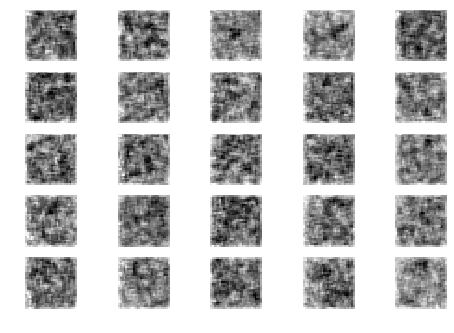

Epoch 0 Batch 301/937 [D loss: 0.723179, acc.: 65.62%] [G loss: 1.837055]
Epoch 0 Batch 302/937 [D loss: 0.541234, acc.: 71.88%] [G loss: 1.952233]
Epoch 0 Batch 303/937 [D loss: 0.472085, acc.: 84.38%] [G loss: 1.534567]


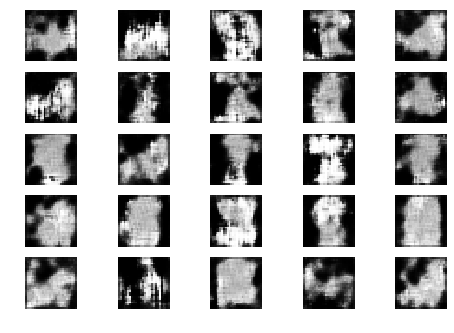

Epoch 0 Batch 304/937 [D loss: 0.628597, acc.: 62.50%] [G loss: 1.445586]
Epoch 0 Batch 305/937 [D loss: 0.640791, acc.: 59.38%] [G loss: 1.205422]
Epoch 0 Batch 306/937 [D loss: 0.667819, acc.: 65.62%] [G loss: 1.283801]


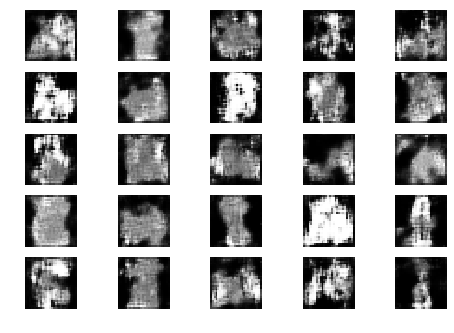

Epoch 0 Batch 307/937 [D loss: 0.825904, acc.: 56.25%] [G loss: 1.232761]
Epoch 0 Batch 308/937 [D loss: 0.389134, acc.: 87.50%] [G loss: 1.231787]
Epoch 0 Batch 309/937 [D loss: 0.835513, acc.: 43.75%] [G loss: 1.409598]
Epoch 0 Batch 310/937 [D loss: 0.557305, acc.: 65.62%] [G loss: 1.430419]
Epoch 0 Batch 311/937 [D loss: 1.134697, acc.: 31.25%] [G loss: 1.853638]
Epoch 0 Batch 312/937 [D loss: 0.757999, acc.: 68.75%] [G loss: 1.468012]
Epoch 0 Batch 313/937 [D loss: 0.365236, acc.: 81.25%] [G loss: 1.489772]
Epoch 0 Batch 314/937 [D loss: 0.455470, acc.: 75.00%] [G loss: 1.400289]
Epoch 0 Batch 315/937 [D loss: 0.424765, acc.: 87.50%] [G loss: 1.526900]
Epoch 0 Batch 316/937 [D loss: 0.662101, acc.: 59.38%] [G loss: 1.205643]
Epoch 0 Batch 317/937 [D loss: 0.440713, acc.: 81.25%] [G loss: 1.132786]
Epoch 0 Batch 318/937 [D loss: 0.689436, acc.: 62.50%] [G loss: 1.057972]
Epoch 0 Batch 319/937 [D loss: 0.565680, acc.: 65.62%] [G loss: 1.080048]
Epoch 0 Batch 320/937 [D loss: 0.49275

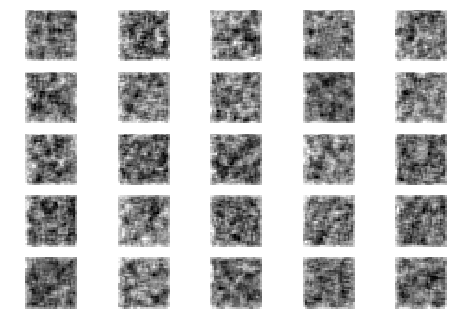

Epoch 0 Batch 401/937 [D loss: 0.511765, acc.: 84.38%] [G loss: 1.454909]
Epoch 0 Batch 402/937 [D loss: 0.762224, acc.: 56.25%] [G loss: 1.389261]
Epoch 0 Batch 403/937 [D loss: 0.848456, acc.: 53.12%] [G loss: 1.299143]
Epoch 0 Batch 404/937 [D loss: 0.547391, acc.: 68.75%] [G loss: 1.308767]


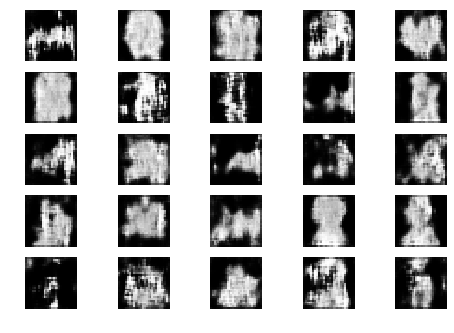

Epoch 0 Batch 405/937 [D loss: 0.508010, acc.: 71.88%] [G loss: 0.999729]
Epoch 0 Batch 406/937 [D loss: 0.642008, acc.: 71.88%] [G loss: 1.224044]
Epoch 0 Batch 407/937 [D loss: 0.651530, acc.: 56.25%] [G loss: 1.137991]
Epoch 0 Batch 408/937 [D loss: 1.019060, acc.: 37.50%] [G loss: 1.147319]


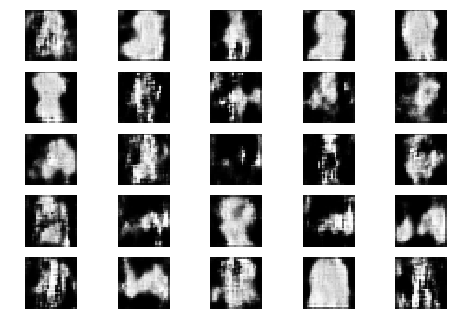

Epoch 0 Batch 409/937 [D loss: 0.488414, acc.: 78.12%] [G loss: 1.317448]
Epoch 0 Batch 410/937 [D loss: 0.612776, acc.: 62.50%] [G loss: 1.250278]
Epoch 0 Batch 411/937 [D loss: 0.705127, acc.: 53.12%] [G loss: 1.402772]
Epoch 0 Batch 412/937 [D loss: 0.731426, acc.: 59.38%] [G loss: 1.078205]
Epoch 0 Batch 413/937 [D loss: 0.710776, acc.: 53.12%] [G loss: 1.596397]
Epoch 0 Batch 414/937 [D loss: 0.637522, acc.: 75.00%] [G loss: 1.630442]
Epoch 0 Batch 415/937 [D loss: 0.757294, acc.: 56.25%] [G loss: 1.105420]
Epoch 0 Batch 416/937 [D loss: 0.587125, acc.: 62.50%] [G loss: 1.172887]
Epoch 0 Batch 417/937 [D loss: 0.521394, acc.: 68.75%] [G loss: 1.517832]
Epoch 0 Batch 418/937 [D loss: 0.721993, acc.: 62.50%] [G loss: 1.357705]
Epoch 0 Batch 419/937 [D loss: 0.622601, acc.: 62.50%] [G loss: 1.330070]
Epoch 0 Batch 420/937 [D loss: 0.524538, acc.: 65.62%] [G loss: 1.585018]
Epoch 0 Batch 421/937 [D loss: 0.597283, acc.: 62.50%] [G loss: 1.632452]
Epoch 0 Batch 422/937 [D loss: 0.51470

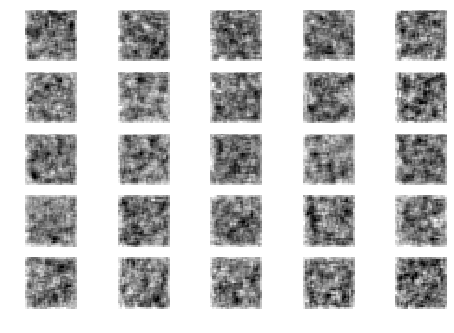

Epoch 0 Batch 501/937 [D loss: 0.676458, acc.: 56.25%] [G loss: 1.372803]
Epoch 0 Batch 502/937 [D loss: 0.654322, acc.: 75.00%] [G loss: 1.230771]
Epoch 0 Batch 503/937 [D loss: 0.740333, acc.: 59.38%] [G loss: 1.570932]
Epoch 0 Batch 504/937 [D loss: 0.682342, acc.: 65.62%] [G loss: 1.383543]
Epoch 0 Batch 505/937 [D loss: 0.416823, acc.: 81.25%] [G loss: 1.443441]


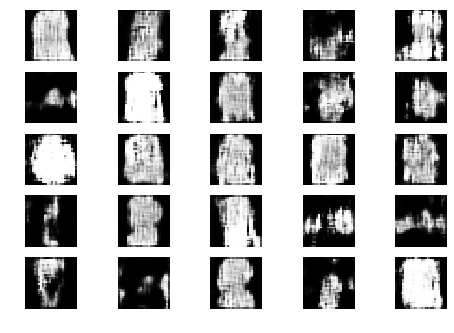

Epoch 0 Batch 506/937 [D loss: 0.572617, acc.: 71.88%] [G loss: 0.973114]
Epoch 0 Batch 507/937 [D loss: 0.582414, acc.: 65.62%] [G loss: 1.298640]
Epoch 0 Batch 508/937 [D loss: 0.575618, acc.: 68.75%] [G loss: 1.328317]
Epoch 0 Batch 509/937 [D loss: 0.589016, acc.: 65.62%] [G loss: 1.576414]
Epoch 0 Batch 510/937 [D loss: 0.514085, acc.: 75.00%] [G loss: 1.528281]


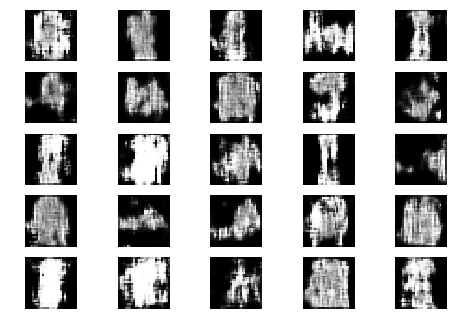

Epoch 0 Batch 511/937 [D loss: 0.520421, acc.: 75.00%] [G loss: 1.408370]
Epoch 0 Batch 512/937 [D loss: 0.771497, acc.: 50.00%] [G loss: 1.139720]
Epoch 0 Batch 513/937 [D loss: 0.582342, acc.: 59.38%] [G loss: 1.310280]
Epoch 0 Batch 514/937 [D loss: 0.599909, acc.: 68.75%] [G loss: 1.320704]
Epoch 0 Batch 515/937 [D loss: 0.598899, acc.: 62.50%] [G loss: 1.268176]
Epoch 0 Batch 516/937 [D loss: 0.490671, acc.: 71.88%] [G loss: 1.241652]
Epoch 0 Batch 517/937 [D loss: 0.745451, acc.: 50.00%] [G loss: 1.267099]
Epoch 0 Batch 518/937 [D loss: 0.978510, acc.: 43.75%] [G loss: 1.357567]
Epoch 0 Batch 519/937 [D loss: 0.645869, acc.: 71.88%] [G loss: 1.215803]
Epoch 0 Batch 520/937 [D loss: 0.794910, acc.: 68.75%] [G loss: 1.100843]
Epoch 0 Batch 521/937 [D loss: 0.520891, acc.: 71.88%] [G loss: 1.282867]
Epoch 0 Batch 522/937 [D loss: 0.514837, acc.: 62.50%] [G loss: 1.102218]
Epoch 0 Batch 523/937 [D loss: 0.623734, acc.: 65.62%] [G loss: 1.219507]
Epoch 0 Batch 524/937 [D loss: 0.73013

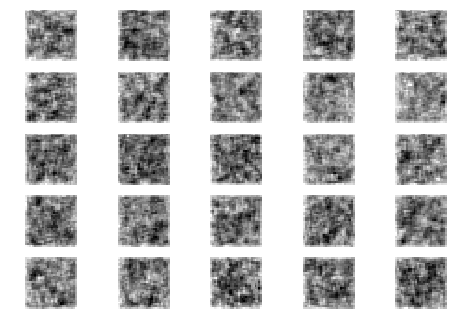

Epoch 0 Batch 601/937 [D loss: 0.556675, acc.: 75.00%] [G loss: 1.231207]
Epoch 0 Batch 602/937 [D loss: 0.660088, acc.: 71.88%] [G loss: 1.335169]
Epoch 0 Batch 603/937 [D loss: 0.745138, acc.: 50.00%] [G loss: 1.025077]
Epoch 0 Batch 604/937 [D loss: 0.431579, acc.: 84.38%] [G loss: 1.295268]
Epoch 0 Batch 605/937 [D loss: 0.368147, acc.: 81.25%] [G loss: 1.221630]
Epoch 0 Batch 606/937 [D loss: 0.532821, acc.: 75.00%] [G loss: 1.433565]


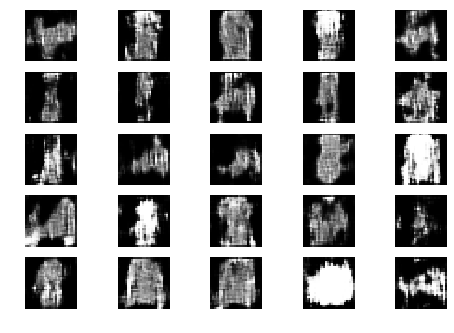

Epoch 0 Batch 607/937 [D loss: 0.477955, acc.: 71.88%] [G loss: 1.132225]
Epoch 0 Batch 608/937 [D loss: 0.549224, acc.: 65.62%] [G loss: 1.253885]
Epoch 0 Batch 609/937 [D loss: 0.727336, acc.: 62.50%] [G loss: 1.316605]
Epoch 0 Batch 610/937 [D loss: 0.525145, acc.: 71.88%] [G loss: 0.887935]
Epoch 0 Batch 611/937 [D loss: 0.610731, acc.: 59.38%] [G loss: 1.151026]
Epoch 0 Batch 612/937 [D loss: 0.380482, acc.: 84.38%] [G loss: 1.397074]


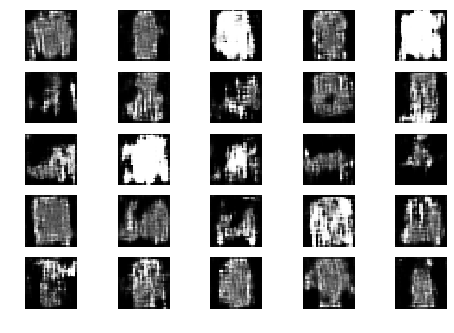

Epoch 0 Batch 613/937 [D loss: 0.409687, acc.: 81.25%] [G loss: 1.514321]
Epoch 0 Batch 614/937 [D loss: 0.639457, acc.: 65.62%] [G loss: 1.238626]
Epoch 0 Batch 615/937 [D loss: 0.418205, acc.: 87.50%] [G loss: 1.257085]
Epoch 0 Batch 616/937 [D loss: 0.640204, acc.: 65.62%] [G loss: 1.412439]
Epoch 0 Batch 617/937 [D loss: 0.518984, acc.: 75.00%] [G loss: 1.326995]
Epoch 0 Batch 618/937 [D loss: 0.617531, acc.: 65.62%] [G loss: 1.203607]
Epoch 0 Batch 619/937 [D loss: 0.664169, acc.: 62.50%] [G loss: 1.400285]
Epoch 0 Batch 620/937 [D loss: 0.485822, acc.: 71.88%] [G loss: 1.381666]
Epoch 0 Batch 621/937 [D loss: 0.481260, acc.: 65.62%] [G loss: 1.281111]
Epoch 0 Batch 622/937 [D loss: 0.755807, acc.: 56.25%] [G loss: 1.230232]
Epoch 0 Batch 623/937 [D loss: 0.598442, acc.: 65.62%] [G loss: 1.327162]
Epoch 0 Batch 624/937 [D loss: 0.796962, acc.: 46.88%] [G loss: 1.465869]
Epoch 0 Batch 625/937 [D loss: 0.725277, acc.: 59.38%] [G loss: 1.401459]
Epoch 0 Batch 626/937 [D loss: 0.57814

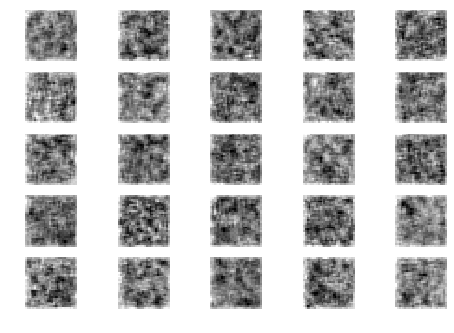

Epoch 0 Batch 701/937 [D loss: 0.644243, acc.: 65.62%] [G loss: 1.250963]
Epoch 0 Batch 702/937 [D loss: 0.697714, acc.: 59.38%] [G loss: 1.459071]
Epoch 0 Batch 703/937 [D loss: 0.429676, acc.: 87.50%] [G loss: 1.558293]
Epoch 0 Batch 704/937 [D loss: 0.810226, acc.: 53.12%] [G loss: 1.499507]
Epoch 0 Batch 705/937 [D loss: 0.580784, acc.: 68.75%] [G loss: 1.098536]
Epoch 0 Batch 706/937 [D loss: 0.406627, acc.: 81.25%] [G loss: 1.323107]
Epoch 0 Batch 707/937 [D loss: 0.732981, acc.: 56.25%] [G loss: 1.092851]


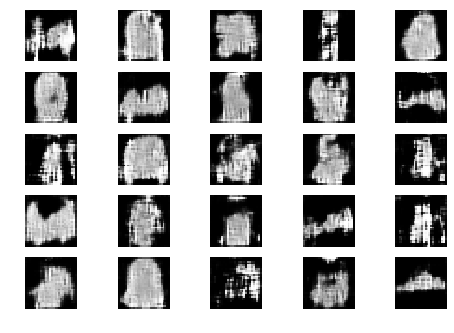

Epoch 0 Batch 708/937 [D loss: 0.529984, acc.: 68.75%] [G loss: 1.336328]
Epoch 0 Batch 709/937 [D loss: 0.581600, acc.: 62.50%] [G loss: 1.519524]
Epoch 0 Batch 710/937 [D loss: 0.529506, acc.: 71.88%] [G loss: 1.405061]
Epoch 0 Batch 711/937 [D loss: 0.578919, acc.: 78.12%] [G loss: 1.329831]
Epoch 0 Batch 712/937 [D loss: 0.772188, acc.: 56.25%] [G loss: 1.150843]
Epoch 0 Batch 713/937 [D loss: 0.496002, acc.: 68.75%] [G loss: 1.691822]
Epoch 0 Batch 714/937 [D loss: 0.603154, acc.: 78.12%] [G loss: 1.512938]


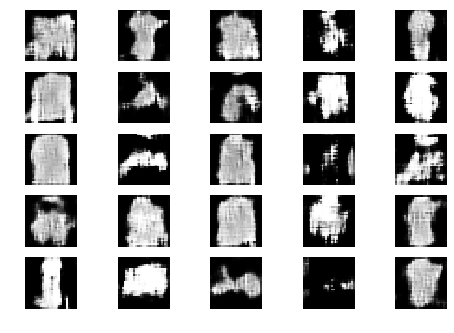

Epoch 0 Batch 715/937 [D loss: 0.553993, acc.: 65.62%] [G loss: 1.847306]
Epoch 0 Batch 716/937 [D loss: 0.557698, acc.: 75.00%] [G loss: 1.852916]
Epoch 0 Batch 717/937 [D loss: 0.372659, acc.: 84.38%] [G loss: 1.825122]
Epoch 0 Batch 718/937 [D loss: 0.953760, acc.: 46.88%] [G loss: 1.547189]
Epoch 0 Batch 719/937 [D loss: 0.731879, acc.: 59.38%] [G loss: 1.522160]
Epoch 0 Batch 720/937 [D loss: 0.509973, acc.: 75.00%] [G loss: 1.314867]
Epoch 0 Batch 721/937 [D loss: 0.699700, acc.: 62.50%] [G loss: 1.515681]
Epoch 0 Batch 722/937 [D loss: 0.498901, acc.: 81.25%] [G loss: 1.339187]
Epoch 0 Batch 723/937 [D loss: 0.525463, acc.: 68.75%] [G loss: 1.305330]
Epoch 0 Batch 724/937 [D loss: 0.518392, acc.: 68.75%] [G loss: 1.730222]
Epoch 0 Batch 725/937 [D loss: 0.577755, acc.: 62.50%] [G loss: 1.472176]
Epoch 0 Batch 726/937 [D loss: 0.506669, acc.: 84.38%] [G loss: 1.307219]
Epoch 0 Batch 727/937 [D loss: 0.647613, acc.: 62.50%] [G loss: 1.616841]
Epoch 0 Batch 728/937 [D loss: 0.42541

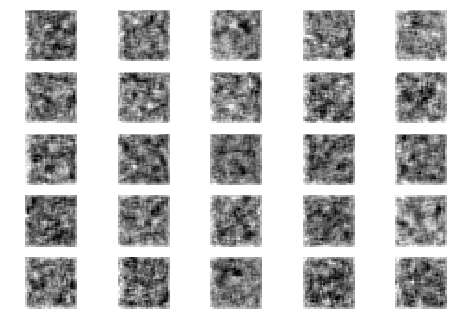

Epoch 0 Batch 801/937 [D loss: 0.669750, acc.: 56.25%] [G loss: 1.650377]
Epoch 0 Batch 802/937 [D loss: 0.540502, acc.: 78.12%] [G loss: 1.604446]
Epoch 0 Batch 803/937 [D loss: 0.724189, acc.: 53.12%] [G loss: 1.602293]
Epoch 0 Batch 804/937 [D loss: 0.686973, acc.: 62.50%] [G loss: 1.935586]
Epoch 0 Batch 805/937 [D loss: 0.517556, acc.: 71.88%] [G loss: 1.429254]
Epoch 0 Batch 806/937 [D loss: 0.768876, acc.: 46.88%] [G loss: 1.688641]
Epoch 0 Batch 807/937 [D loss: 0.441215, acc.: 81.25%] [G loss: 1.869026]
Epoch 0 Batch 808/937 [D loss: 0.435927, acc.: 87.50%] [G loss: 1.707451]


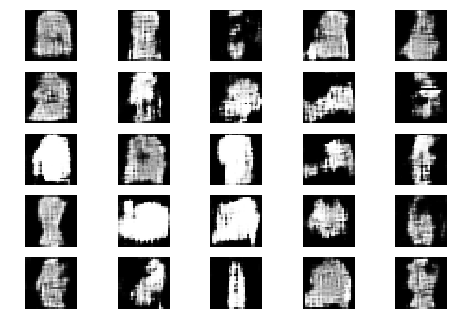

Epoch 0 Batch 809/937 [D loss: 0.729947, acc.: 53.12%] [G loss: 1.328855]
Epoch 0 Batch 810/937 [D loss: 0.627413, acc.: 68.75%] [G loss: 1.678193]
Epoch 0 Batch 811/937 [D loss: 0.620625, acc.: 65.62%] [G loss: 1.533800]
Epoch 0 Batch 812/937 [D loss: 0.544498, acc.: 78.12%] [G loss: 1.463768]
Epoch 0 Batch 813/937 [D loss: 0.458085, acc.: 87.50%] [G loss: 1.469833]
Epoch 0 Batch 814/937 [D loss: 0.531616, acc.: 71.88%] [G loss: 1.797282]
Epoch 0 Batch 815/937 [D loss: 0.552305, acc.: 75.00%] [G loss: 1.456315]
Epoch 0 Batch 816/937 [D loss: 0.626692, acc.: 65.62%] [G loss: 1.224665]


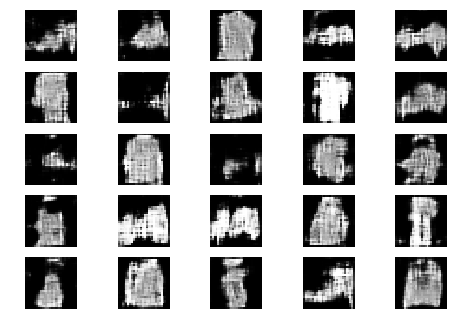

Epoch 0 Batch 817/937 [D loss: 0.534770, acc.: 71.88%] [G loss: 1.429532]
Epoch 0 Batch 818/937 [D loss: 0.473994, acc.: 78.12%] [G loss: 1.881637]
Epoch 0 Batch 819/937 [D loss: 0.616544, acc.: 59.38%] [G loss: 1.348220]
Epoch 0 Batch 820/937 [D loss: 0.513637, acc.: 78.12%] [G loss: 1.540906]
Epoch 0 Batch 821/937 [D loss: 0.750365, acc.: 65.62%] [G loss: 1.320623]
Epoch 0 Batch 822/937 [D loss: 0.393879, acc.: 81.25%] [G loss: 1.417759]
Epoch 0 Batch 823/937 [D loss: 0.548145, acc.: 71.88%] [G loss: 1.111048]
Epoch 0 Batch 824/937 [D loss: 0.459504, acc.: 81.25%] [G loss: 1.253218]
Epoch 0 Batch 825/937 [D loss: 0.608095, acc.: 65.62%] [G loss: 1.167940]
Epoch 0 Batch 826/937 [D loss: 0.582921, acc.: 68.75%] [G loss: 1.221145]
Epoch 0 Batch 827/937 [D loss: 0.468873, acc.: 75.00%] [G loss: 1.132085]
Epoch 0 Batch 828/937 [D loss: 0.459813, acc.: 75.00%] [G loss: 1.228819]
Epoch 0 Batch 829/937 [D loss: 0.420051, acc.: 87.50%] [G loss: 1.285998]
Epoch 0 Batch 830/937 [D loss: 0.75132

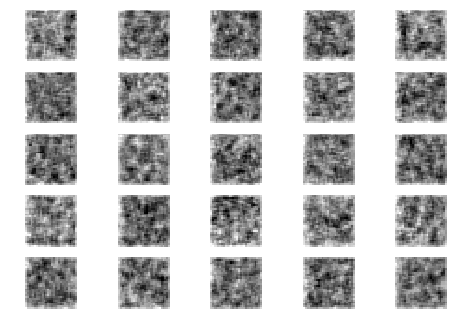

Epoch 0 Batch 901/937 [D loss: 0.378985, acc.: 81.25%] [G loss: 1.712231]
Epoch 0 Batch 902/937 [D loss: 0.596926, acc.: 65.62%] [G loss: 1.850999]
Epoch 0 Batch 903/937 [D loss: 0.592069, acc.: 71.88%] [G loss: 1.862231]
Epoch 0 Batch 904/937 [D loss: 0.490371, acc.: 78.12%] [G loss: 1.568064]
Epoch 0 Batch 905/937 [D loss: 0.390713, acc.: 75.00%] [G loss: 1.857091]
Epoch 0 Batch 906/937 [D loss: 0.482147, acc.: 75.00%] [G loss: 1.556595]
Epoch 0 Batch 907/937 [D loss: 0.542057, acc.: 75.00%] [G loss: 1.554388]
Epoch 0 Batch 908/937 [D loss: 0.534286, acc.: 71.88%] [G loss: 1.706262]
Epoch 0 Batch 909/937 [D loss: 0.583878, acc.: 62.50%] [G loss: 1.511668]


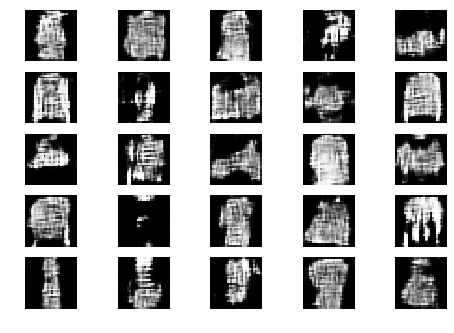

Epoch 0 Batch 910/937 [D loss: 0.614216, acc.: 68.75%] [G loss: 1.555278]
Epoch 0 Batch 911/937 [D loss: 0.757539, acc.: 56.25%] [G loss: 1.709858]
Epoch 0 Batch 912/937 [D loss: 0.727216, acc.: 68.75%] [G loss: 1.570433]
Epoch 0 Batch 913/937 [D loss: 0.502734, acc.: 71.88%] [G loss: 2.027959]
Epoch 0 Batch 914/937 [D loss: 0.538518, acc.: 71.88%] [G loss: 2.041936]
Epoch 0 Batch 915/937 [D loss: 0.615319, acc.: 56.25%] [G loss: 1.778793]
Epoch 0 Batch 916/937 [D loss: 0.454843, acc.: 78.12%] [G loss: 1.558756]
Epoch 0 Batch 917/937 [D loss: 0.440586, acc.: 84.38%] [G loss: 1.582930]
Epoch 0 Batch 918/937 [D loss: 0.369387, acc.: 84.38%] [G loss: 1.595746]


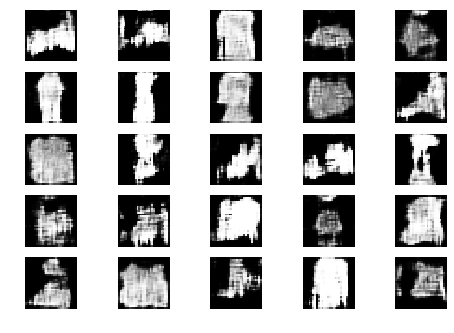

Epoch 0 Batch 919/937 [D loss: 0.543832, acc.: 65.62%] [G loss: 1.472878]
Epoch 0 Batch 920/937 [D loss: 0.531624, acc.: 71.88%] [G loss: 1.617297]
Epoch 0 Batch 921/937 [D loss: 0.394460, acc.: 90.62%] [G loss: 1.611333]
Epoch 0 Batch 922/937 [D loss: 0.735254, acc.: 62.50%] [G loss: 1.633683]
Epoch 0 Batch 923/937 [D loss: 0.760513, acc.: 56.25%] [G loss: 1.291295]
Epoch 0 Batch 924/937 [D loss: 0.342307, acc.: 84.38%] [G loss: 1.878992]
Epoch 0 Batch 925/937 [D loss: 0.477400, acc.: 75.00%] [G loss: 1.533813]
Epoch 0 Batch 926/937 [D loss: 0.764607, acc.: 50.00%] [G loss: 1.405289]
Epoch 0 Batch 927/937 [D loss: 0.572100, acc.: 65.62%] [G loss: 1.249917]
Epoch 0 Batch 928/937 [D loss: 0.497767, acc.: 65.62%] [G loss: 1.665159]
Epoch 0 Batch 929/937 [D loss: 0.404592, acc.: 87.50%] [G loss: 1.664710]
Epoch 0 Batch 930/937 [D loss: 0.271750, acc.: 96.88%] [G loss: 1.856829]
Epoch 0 Batch 931/937 [D loss: 0.446325, acc.: 81.25%] [G loss: 1.236396]
Epoch 0 Batch 932/937 [D loss: 0.44448

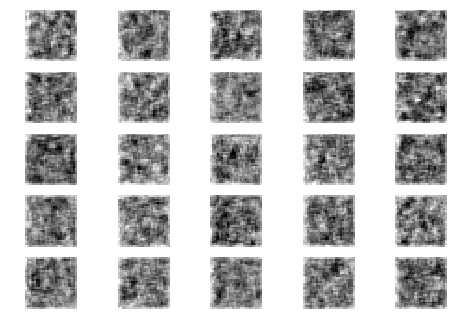

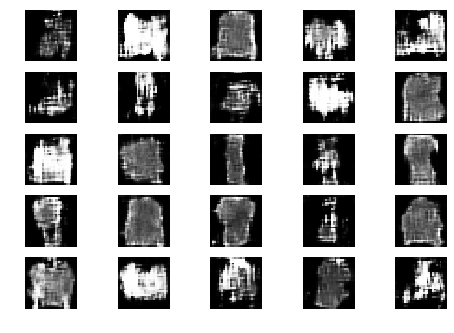

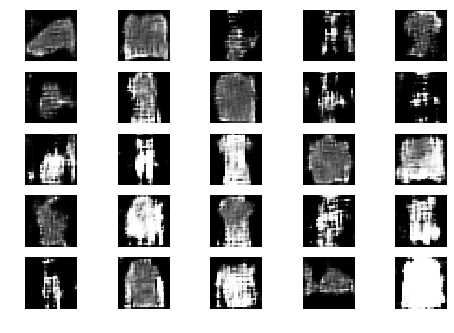

Epoch 1 Batch 1/937 [D loss: 0.415160, acc.: 81.25%] [G loss: 1.969802]
Epoch 1 Batch 2/937 [D loss: 0.549418, acc.: 71.88%] [G loss: 1.724741]
Epoch 1 Batch 3/937 [D loss: 0.543043, acc.: 71.88%] [G loss: 1.423769]
Epoch 1 Batch 4/937 [D loss: 0.528438, acc.: 71.88%] [G loss: 1.218892]
Epoch 1 Batch 5/937 [D loss: 0.555048, acc.: 68.75%] [G loss: 1.249091]
Epoch 1 Batch 6/937 [D loss: 0.361314, acc.: 87.50%] [G loss: 1.474799]
Epoch 1 Batch 7/937 [D loss: 0.572493, acc.: 65.62%] [G loss: 1.897592]
Epoch 1 Batch 8/937 [D loss: 0.536085, acc.: 68.75%] [G loss: 1.608492]
Epoch 1 Batch 9/937 [D loss: 0.759738, acc.: 56.25%] [G loss: 1.275319]
Epoch 1 Batch 10/937 [D loss: 0.764691, acc.: 59.38%] [G loss: 1.941497]
Epoch 1 Batch 11/937 [D loss: 0.425452, acc.: 78.12%] [G loss: 1.398292]
Epoch 1 Batch 12/937 [D loss: 0.912057, acc.: 43.75%] [G loss: 1.330154]
Epoch 1 Batch 13/937 [D loss: 0.470055, acc.: 78.12%] [G loss: 1.451181]
Epoch 1 Batch 14/937 [D loss: 0.493580, acc.: 81.25%] [G los

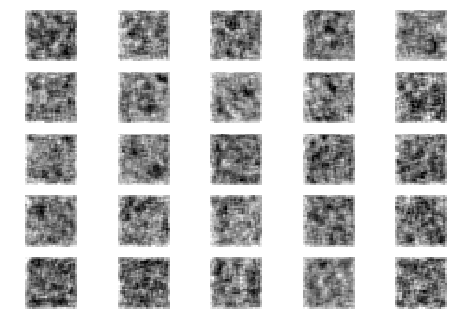

Epoch 1 Batch 101/937 [D loss: 0.470839, acc.: 84.38%] [G loss: 1.304606]


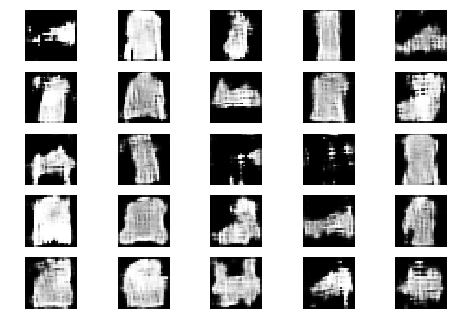

Epoch 1 Batch 102/937 [D loss: 0.474468, acc.: 84.38%] [G loss: 1.533224]


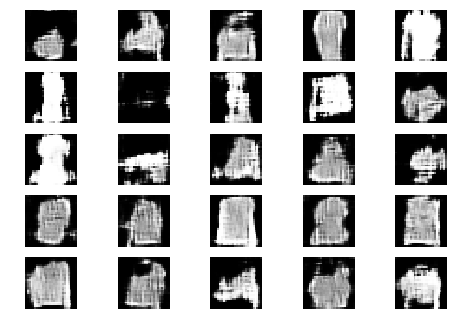

Epoch 1 Batch 103/937 [D loss: 0.697359, acc.: 75.00%] [G loss: 1.380131]
Epoch 1 Batch 104/937 [D loss: 0.423090, acc.: 71.88%] [G loss: 1.375964]
Epoch 1 Batch 105/937 [D loss: 0.454018, acc.: 75.00%] [G loss: 1.603740]
Epoch 1 Batch 106/937 [D loss: 0.646230, acc.: 65.62%] [G loss: 1.404318]
Epoch 1 Batch 107/937 [D loss: 0.570945, acc.: 65.62%] [G loss: 1.158837]
Epoch 1 Batch 108/937 [D loss: 0.624324, acc.: 75.00%] [G loss: 1.291228]
Epoch 1 Batch 109/937 [D loss: 0.426526, acc.: 87.50%] [G loss: 1.573653]
Epoch 1 Batch 110/937 [D loss: 0.564715, acc.: 68.75%] [G loss: 1.709680]
Epoch 1 Batch 111/937 [D loss: 0.626213, acc.: 68.75%] [G loss: 1.379366]
Epoch 1 Batch 112/937 [D loss: 0.371022, acc.: 84.38%] [G loss: 1.429830]
Epoch 1 Batch 113/937 [D loss: 0.459596, acc.: 75.00%] [G loss: 1.521530]
Epoch 1 Batch 114/937 [D loss: 0.390949, acc.: 81.25%] [G loss: 1.630461]
Epoch 1 Batch 115/937 [D loss: 0.572911, acc.: 78.12%] [G loss: 1.683741]
Epoch 1 Batch 116/937 [D loss: 0.68507

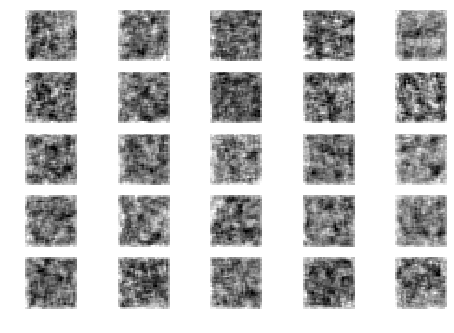

Epoch 1 Batch 201/937 [D loss: 0.584004, acc.: 56.25%] [G loss: 1.720456]
Epoch 1 Batch 202/937 [D loss: 0.636179, acc.: 65.62%] [G loss: 1.122064]


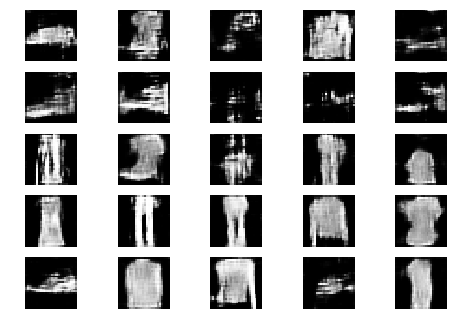

Epoch 1 Batch 203/937 [D loss: 0.437672, acc.: 87.50%] [G loss: 1.733805]
Epoch 1 Batch 204/937 [D loss: 0.680724, acc.: 65.62%] [G loss: 0.969129]


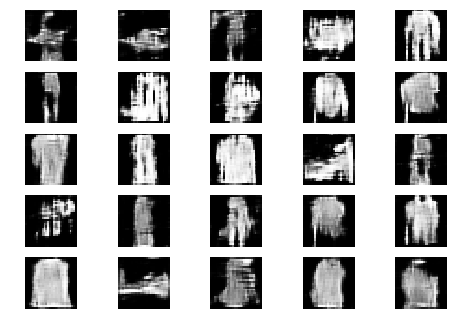

Epoch 1 Batch 205/937 [D loss: 0.372836, acc.: 81.25%] [G loss: 1.016994]
Epoch 1 Batch 206/937 [D loss: 0.559541, acc.: 71.88%] [G loss: 1.483824]
Epoch 1 Batch 207/937 [D loss: 0.739215, acc.: 56.25%] [G loss: 1.502386]
Epoch 1 Batch 208/937 [D loss: 0.526511, acc.: 75.00%] [G loss: 1.434042]
Epoch 1 Batch 209/937 [D loss: 0.393351, acc.: 90.62%] [G loss: 1.503545]
Epoch 1 Batch 210/937 [D loss: 0.605916, acc.: 71.88%] [G loss: 1.710039]
Epoch 1 Batch 211/937 [D loss: 0.573861, acc.: 65.62%] [G loss: 1.194513]
Epoch 1 Batch 212/937 [D loss: 0.795157, acc.: 46.88%] [G loss: 1.213464]
Epoch 1 Batch 213/937 [D loss: 0.543827, acc.: 81.25%] [G loss: 1.421701]
Epoch 1 Batch 214/937 [D loss: 0.575888, acc.: 65.62%] [G loss: 1.682070]
Epoch 1 Batch 215/937 [D loss: 0.609854, acc.: 62.50%] [G loss: 1.959028]
Epoch 1 Batch 216/937 [D loss: 0.618296, acc.: 65.62%] [G loss: 1.593544]
Epoch 1 Batch 217/937 [D loss: 0.474822, acc.: 78.12%] [G loss: 1.355583]
Epoch 1 Batch 218/937 [D loss: 0.60019

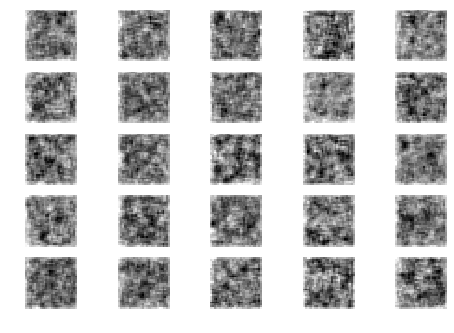

Epoch 1 Batch 301/937 [D loss: 0.579422, acc.: 65.62%] [G loss: 1.367391]
Epoch 1 Batch 302/937 [D loss: 0.552707, acc.: 65.62%] [G loss: 1.428388]
Epoch 1 Batch 303/937 [D loss: 0.666741, acc.: 59.38%] [G loss: 1.035575]


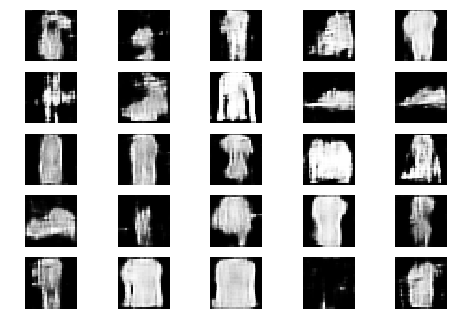

Epoch 1 Batch 304/937 [D loss: 0.394789, acc.: 81.25%] [G loss: 1.105169]
Epoch 1 Batch 305/937 [D loss: 0.583430, acc.: 75.00%] [G loss: 1.048462]
Epoch 1 Batch 306/937 [D loss: 0.614816, acc.: 62.50%] [G loss: 1.121017]


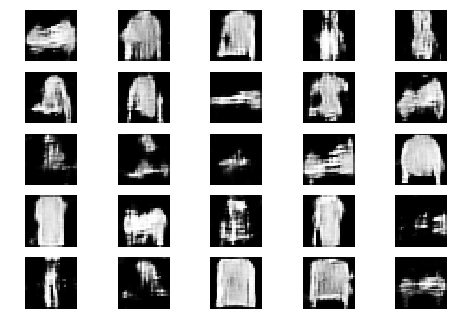

Epoch 1 Batch 307/937 [D loss: 0.607005, acc.: 68.75%] [G loss: 1.426199]
Epoch 1 Batch 308/937 [D loss: 1.005271, acc.: 46.88%] [G loss: 1.317068]
Epoch 1 Batch 309/937 [D loss: 0.662253, acc.: 75.00%] [G loss: 1.167459]
Epoch 1 Batch 310/937 [D loss: 0.596120, acc.: 65.62%] [G loss: 1.412956]
Epoch 1 Batch 311/937 [D loss: 0.723755, acc.: 62.50%] [G loss: 1.862475]
Epoch 1 Batch 312/937 [D loss: 0.824452, acc.: 50.00%] [G loss: 1.459071]
Epoch 1 Batch 313/937 [D loss: 0.800349, acc.: 56.25%] [G loss: 1.462999]
Epoch 1 Batch 314/937 [D loss: 0.697652, acc.: 59.38%] [G loss: 1.174697]
Epoch 1 Batch 315/937 [D loss: 0.639326, acc.: 71.88%] [G loss: 1.133479]
Epoch 1 Batch 316/937 [D loss: 0.602376, acc.: 75.00%] [G loss: 1.420621]
Epoch 1 Batch 317/937 [D loss: 0.661526, acc.: 65.62%] [G loss: 1.368061]
Epoch 1 Batch 318/937 [D loss: 0.605463, acc.: 59.38%] [G loss: 1.483235]
Epoch 1 Batch 319/937 [D loss: 0.693326, acc.: 62.50%] [G loss: 1.455279]
Epoch 1 Batch 320/937 [D loss: 0.49570

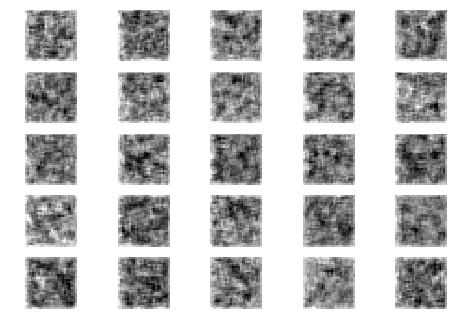

Epoch 1 Batch 401/937 [D loss: 0.738707, acc.: 53.12%] [G loss: 0.935601]
Epoch 1 Batch 402/937 [D loss: 0.619079, acc.: 59.38%] [G loss: 1.024095]
Epoch 1 Batch 403/937 [D loss: 0.767224, acc.: 53.12%] [G loss: 1.508485]
Epoch 1 Batch 404/937 [D loss: 0.631362, acc.: 62.50%] [G loss: 1.498958]


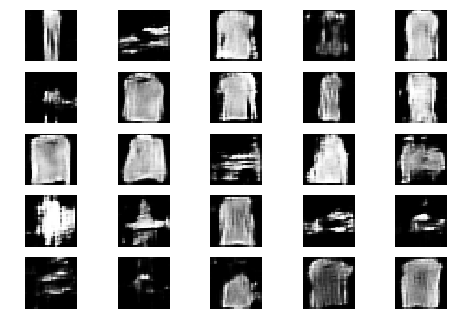

Epoch 1 Batch 405/937 [D loss: 0.640935, acc.: 62.50%] [G loss: 1.493064]
Epoch 1 Batch 406/937 [D loss: 0.731170, acc.: 59.38%] [G loss: 1.377332]
Epoch 1 Batch 407/937 [D loss: 0.694344, acc.: 71.88%] [G loss: 1.481171]
Epoch 1 Batch 408/937 [D loss: 0.732253, acc.: 59.38%] [G loss: 1.613625]


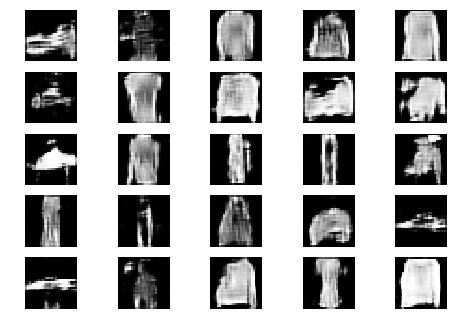

Epoch 1 Batch 409/937 [D loss: 0.513014, acc.: 71.88%] [G loss: 1.469171]
Epoch 1 Batch 410/937 [D loss: 0.730096, acc.: 62.50%] [G loss: 1.072826]
Epoch 1 Batch 411/937 [D loss: 0.620644, acc.: 75.00%] [G loss: 0.986840]
Epoch 1 Batch 412/937 [D loss: 0.457568, acc.: 78.12%] [G loss: 1.121693]
Epoch 1 Batch 413/937 [D loss: 0.638650, acc.: 71.88%] [G loss: 1.287066]
Epoch 1 Batch 414/937 [D loss: 0.884849, acc.: 50.00%] [G loss: 1.375281]
Epoch 1 Batch 415/937 [D loss: 0.456736, acc.: 81.25%] [G loss: 1.269494]
Epoch 1 Batch 416/937 [D loss: 0.586457, acc.: 62.50%] [G loss: 1.602695]
Epoch 1 Batch 417/937 [D loss: 0.637869, acc.: 62.50%] [G loss: 1.505275]
Epoch 1 Batch 418/937 [D loss: 0.557079, acc.: 75.00%] [G loss: 1.225456]
Epoch 1 Batch 419/937 [D loss: 0.607007, acc.: 65.62%] [G loss: 1.370502]
Epoch 1 Batch 420/937 [D loss: 0.612363, acc.: 68.75%] [G loss: 1.496175]
Epoch 1 Batch 421/937 [D loss: 0.732468, acc.: 53.12%] [G loss: 1.238232]
Epoch 1 Batch 422/937 [D loss: 0.86314

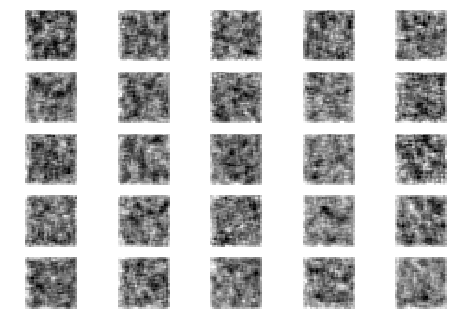

Epoch 1 Batch 501/937 [D loss: 0.522458, acc.: 68.75%] [G loss: 1.031858]
Epoch 1 Batch 502/937 [D loss: 0.484862, acc.: 75.00%] [G loss: 1.183609]
Epoch 1 Batch 503/937 [D loss: 0.602573, acc.: 71.88%] [G loss: 1.504550]
Epoch 1 Batch 504/937 [D loss: 0.631318, acc.: 65.62%] [G loss: 1.288998]
Epoch 1 Batch 505/937 [D loss: 0.673606, acc.: 68.75%] [G loss: 1.513312]


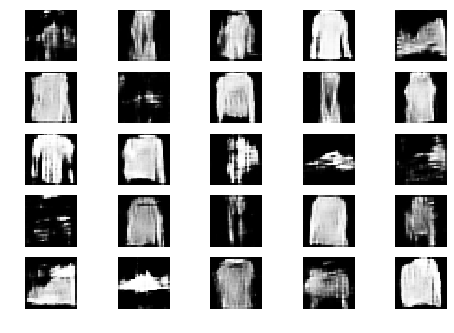

Epoch 1 Batch 506/937 [D loss: 0.555277, acc.: 68.75%] [G loss: 1.639693]
Epoch 1 Batch 507/937 [D loss: 0.779006, acc.: 46.88%] [G loss: 0.945683]
Epoch 1 Batch 508/937 [D loss: 0.817385, acc.: 62.50%] [G loss: 1.247374]
Epoch 1 Batch 509/937 [D loss: 0.519238, acc.: 78.12%] [G loss: 0.981402]
Epoch 1 Batch 510/937 [D loss: 0.929368, acc.: 56.25%] [G loss: 0.968325]


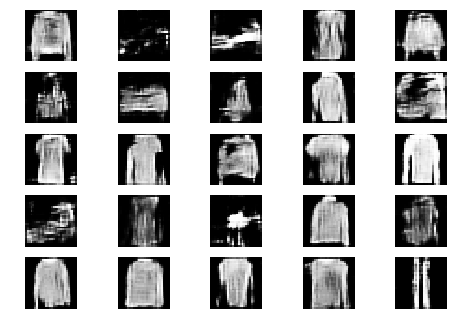

Epoch 1 Batch 511/937 [D loss: 0.505150, acc.: 75.00%] [G loss: 1.352003]
Epoch 1 Batch 512/937 [D loss: 0.755948, acc.: 50.00%] [G loss: 1.503232]
Epoch 1 Batch 513/937 [D loss: 0.603156, acc.: 68.75%] [G loss: 1.349939]
Epoch 1 Batch 514/937 [D loss: 0.635687, acc.: 68.75%] [G loss: 1.439797]
Epoch 1 Batch 515/937 [D loss: 0.570370, acc.: 68.75%] [G loss: 1.376164]
Epoch 1 Batch 516/937 [D loss: 0.871587, acc.: 56.25%] [G loss: 1.362573]
Epoch 1 Batch 517/937 [D loss: 0.792527, acc.: 53.12%] [G loss: 1.296335]
Epoch 1 Batch 518/937 [D loss: 0.633370, acc.: 62.50%] [G loss: 1.267736]
Epoch 1 Batch 519/937 [D loss: 0.723320, acc.: 56.25%] [G loss: 1.229738]
Epoch 1 Batch 520/937 [D loss: 0.680189, acc.: 68.75%] [G loss: 1.360486]
Epoch 1 Batch 521/937 [D loss: 0.512349, acc.: 68.75%] [G loss: 0.974346]
Epoch 1 Batch 522/937 [D loss: 0.685567, acc.: 53.12%] [G loss: 1.264371]
Epoch 1 Batch 523/937 [D loss: 0.695636, acc.: 59.38%] [G loss: 1.107080]
Epoch 1 Batch 524/937 [D loss: 0.84306

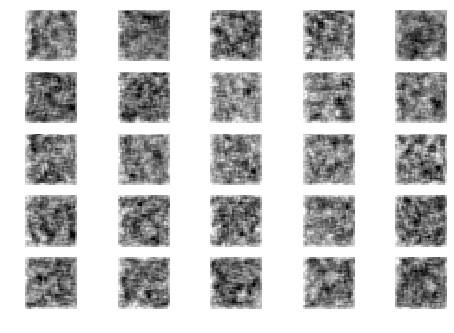

Epoch 1 Batch 601/937 [D loss: 1.001855, acc.: 31.25%] [G loss: 1.262807]
Epoch 1 Batch 602/937 [D loss: 0.462002, acc.: 81.25%] [G loss: 1.315568]
Epoch 1 Batch 603/937 [D loss: 0.667085, acc.: 65.62%] [G loss: 1.500913]
Epoch 1 Batch 604/937 [D loss: 0.480370, acc.: 78.12%] [G loss: 1.218533]
Epoch 1 Batch 605/937 [D loss: 0.865484, acc.: 40.62%] [G loss: 1.376821]
Epoch 1 Batch 606/937 [D loss: 0.698698, acc.: 62.50%] [G loss: 1.068318]


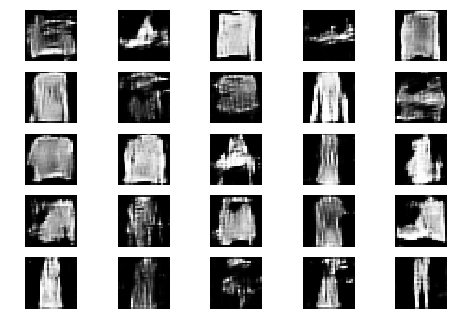

Epoch 1 Batch 607/937 [D loss: 0.526519, acc.: 71.88%] [G loss: 1.177647]
Epoch 1 Batch 608/937 [D loss: 0.528243, acc.: 65.62%] [G loss: 1.122187]
Epoch 1 Batch 609/937 [D loss: 0.531568, acc.: 71.88%] [G loss: 1.098098]
Epoch 1 Batch 610/937 [D loss: 0.706120, acc.: 56.25%] [G loss: 1.058000]
Epoch 1 Batch 611/937 [D loss: 0.477883, acc.: 78.12%] [G loss: 1.314936]
Epoch 1 Batch 612/937 [D loss: 0.580029, acc.: 68.75%] [G loss: 1.057785]


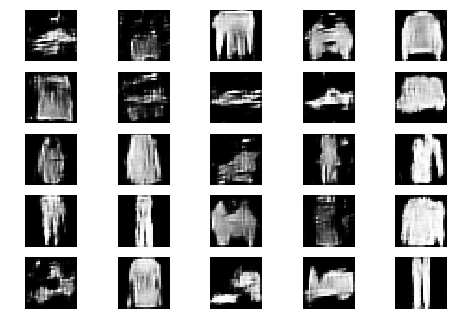

Epoch 1 Batch 613/937 [D loss: 0.481047, acc.: 78.12%] [G loss: 1.446589]
Epoch 1 Batch 614/937 [D loss: 0.776317, acc.: 56.25%] [G loss: 1.168212]
Epoch 1 Batch 615/937 [D loss: 0.458095, acc.: 81.25%] [G loss: 0.977344]
Epoch 1 Batch 616/937 [D loss: 0.788389, acc.: 56.25%] [G loss: 1.464292]
Epoch 1 Batch 617/937 [D loss: 0.550280, acc.: 71.88%] [G loss: 1.555700]
Epoch 1 Batch 618/937 [D loss: 0.848112, acc.: 50.00%] [G loss: 1.258984]
Epoch 1 Batch 619/937 [D loss: 0.647915, acc.: 62.50%] [G loss: 1.560071]
Epoch 1 Batch 620/937 [D loss: 0.583269, acc.: 65.62%] [G loss: 1.091840]
Epoch 1 Batch 621/937 [D loss: 0.461397, acc.: 81.25%] [G loss: 1.074440]
Epoch 1 Batch 622/937 [D loss: 0.477126, acc.: 78.12%] [G loss: 1.262231]
Epoch 1 Batch 623/937 [D loss: 0.784257, acc.: 56.25%] [G loss: 1.280755]
Epoch 1 Batch 624/937 [D loss: 0.727352, acc.: 50.00%] [G loss: 1.124597]
Epoch 1 Batch 625/937 [D loss: 0.678210, acc.: 62.50%] [G loss: 1.292261]
Epoch 1 Batch 626/937 [D loss: 0.87640

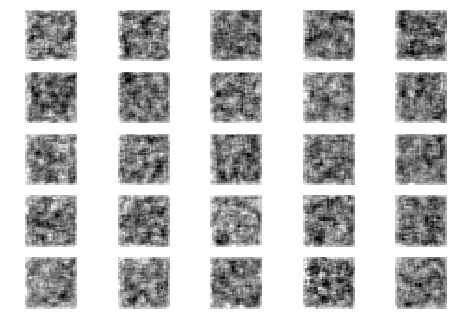

Epoch 1 Batch 701/937 [D loss: 0.590424, acc.: 65.62%] [G loss: 1.224678]
Epoch 1 Batch 702/937 [D loss: 0.589725, acc.: 62.50%] [G loss: 1.209654]
Epoch 1 Batch 703/937 [D loss: 0.595236, acc.: 65.62%] [G loss: 1.247492]
Epoch 1 Batch 704/937 [D loss: 0.707559, acc.: 62.50%] [G loss: 1.179680]
Epoch 1 Batch 705/937 [D loss: 0.488693, acc.: 71.88%] [G loss: 1.210745]
Epoch 1 Batch 706/937 [D loss: 0.807510, acc.: 65.62%] [G loss: 1.092986]
Epoch 1 Batch 707/937 [D loss: 0.651839, acc.: 53.12%] [G loss: 1.346005]


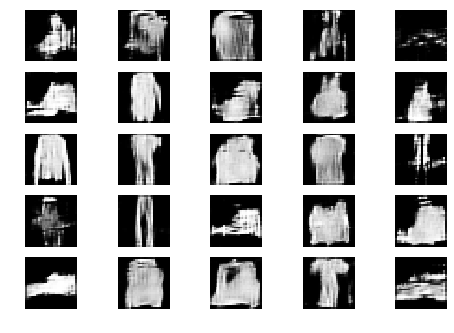

Epoch 1 Batch 708/937 [D loss: 0.497929, acc.: 81.25%] [G loss: 1.384643]
Epoch 1 Batch 709/937 [D loss: 0.713538, acc.: 59.38%] [G loss: 1.254663]
Epoch 1 Batch 710/937 [D loss: 0.692840, acc.: 62.50%] [G loss: 1.345176]
Epoch 1 Batch 711/937 [D loss: 0.639372, acc.: 65.62%] [G loss: 1.297192]
Epoch 1 Batch 712/937 [D loss: 0.562813, acc.: 71.88%] [G loss: 1.223825]
Epoch 1 Batch 713/937 [D loss: 0.520492, acc.: 78.12%] [G loss: 1.610476]
Epoch 1 Batch 714/937 [D loss: 0.834548, acc.: 46.88%] [G loss: 1.233570]


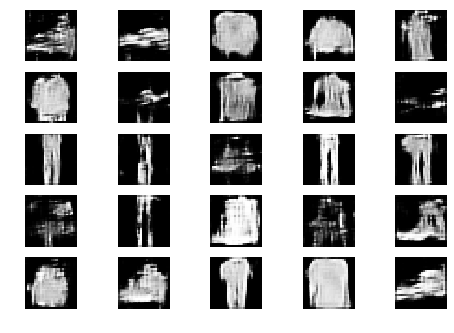

Epoch 1 Batch 715/937 [D loss: 0.706205, acc.: 59.38%] [G loss: 1.026133]
Epoch 1 Batch 716/937 [D loss: 0.446111, acc.: 75.00%] [G loss: 1.111842]
Epoch 1 Batch 717/937 [D loss: 0.641116, acc.: 65.62%] [G loss: 1.166583]
Epoch 1 Batch 718/937 [D loss: 0.496150, acc.: 75.00%] [G loss: 1.138143]
Epoch 1 Batch 719/937 [D loss: 0.637275, acc.: 65.62%] [G loss: 1.090796]
Epoch 1 Batch 720/937 [D loss: 0.485274, acc.: 71.88%] [G loss: 1.242556]
Epoch 1 Batch 721/937 [D loss: 0.545917, acc.: 71.88%] [G loss: 1.053645]
Epoch 1 Batch 722/937 [D loss: 0.518964, acc.: 68.75%] [G loss: 1.196924]
Epoch 1 Batch 723/937 [D loss: 0.536904, acc.: 71.88%] [G loss: 1.336225]
Epoch 1 Batch 724/937 [D loss: 0.767444, acc.: 59.38%] [G loss: 1.185580]
Epoch 1 Batch 725/937 [D loss: 0.550249, acc.: 71.88%] [G loss: 1.015922]
Epoch 1 Batch 726/937 [D loss: 0.673251, acc.: 68.75%] [G loss: 1.175576]
Epoch 1 Batch 727/937 [D loss: 0.737962, acc.: 68.75%] [G loss: 1.268764]
Epoch 1 Batch 728/937 [D loss: 0.49859

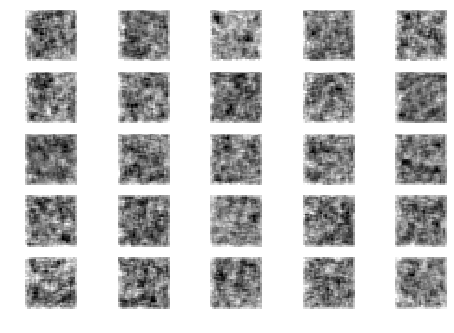

Epoch 1 Batch 801/937 [D loss: 0.620157, acc.: 68.75%] [G loss: 1.070399]
Epoch 1 Batch 802/937 [D loss: 0.392222, acc.: 78.12%] [G loss: 1.134325]
Epoch 1 Batch 803/937 [D loss: 0.440254, acc.: 81.25%] [G loss: 1.143070]
Epoch 1 Batch 804/937 [D loss: 0.703700, acc.: 53.12%] [G loss: 1.194458]
Epoch 1 Batch 805/937 [D loss: 0.766960, acc.: 59.38%] [G loss: 1.173645]
Epoch 1 Batch 806/937 [D loss: 0.650836, acc.: 59.38%] [G loss: 1.164757]
Epoch 1 Batch 807/937 [D loss: 0.611613, acc.: 68.75%] [G loss: 1.469166]
Epoch 1 Batch 808/937 [D loss: 0.711359, acc.: 59.38%] [G loss: 1.169990]


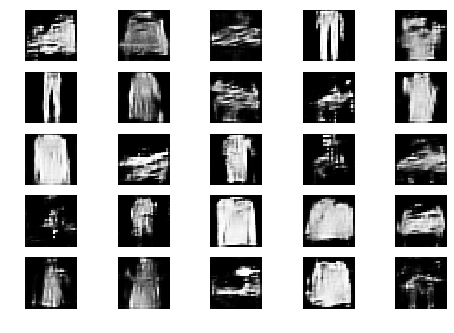

Epoch 1 Batch 809/937 [D loss: 0.698306, acc.: 56.25%] [G loss: 1.234581]
Epoch 1 Batch 810/937 [D loss: 0.678770, acc.: 62.50%] [G loss: 1.468844]
Epoch 1 Batch 811/937 [D loss: 0.688518, acc.: 62.50%] [G loss: 1.143985]
Epoch 1 Batch 812/937 [D loss: 0.925658, acc.: 43.75%] [G loss: 1.079251]
Epoch 1 Batch 813/937 [D loss: 0.701612, acc.: 59.38%] [G loss: 1.248813]
Epoch 1 Batch 814/937 [D loss: 0.564423, acc.: 71.88%] [G loss: 1.326275]
Epoch 1 Batch 815/937 [D loss: 0.440660, acc.: 84.38%] [G loss: 1.194282]
Epoch 1 Batch 816/937 [D loss: 0.805907, acc.: 53.12%] [G loss: 1.020675]


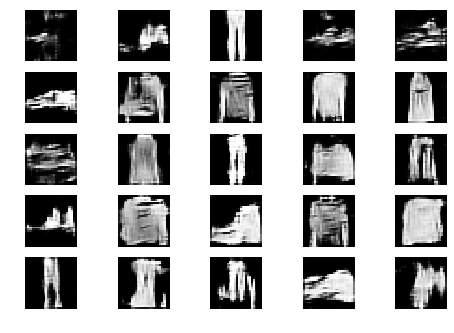

Epoch 1 Batch 817/937 [D loss: 0.564811, acc.: 68.75%] [G loss: 1.441318]
Epoch 1 Batch 818/937 [D loss: 0.541363, acc.: 75.00%] [G loss: 1.184290]
Epoch 1 Batch 819/937 [D loss: 0.562367, acc.: 68.75%] [G loss: 1.383691]
Epoch 1 Batch 820/937 [D loss: 0.530420, acc.: 81.25%] [G loss: 1.113506]
Epoch 1 Batch 821/937 [D loss: 0.547451, acc.: 68.75%] [G loss: 0.972491]
Epoch 1 Batch 822/937 [D loss: 0.635309, acc.: 59.38%] [G loss: 1.100433]
Epoch 1 Batch 823/937 [D loss: 0.599728, acc.: 68.75%] [G loss: 1.394407]
Epoch 1 Batch 824/937 [D loss: 0.668826, acc.: 59.38%] [G loss: 1.577296]
Epoch 1 Batch 825/937 [D loss: 0.514237, acc.: 75.00%] [G loss: 1.495544]
Epoch 1 Batch 826/937 [D loss: 0.741896, acc.: 56.25%] [G loss: 1.382730]
Epoch 1 Batch 827/937 [D loss: 0.565368, acc.: 75.00%] [G loss: 1.546625]
Epoch 1 Batch 828/937 [D loss: 0.640956, acc.: 65.62%] [G loss: 1.637978]
Epoch 1 Batch 829/937 [D loss: 0.520467, acc.: 75.00%] [G loss: 1.299835]
Epoch 1 Batch 830/937 [D loss: 0.60848

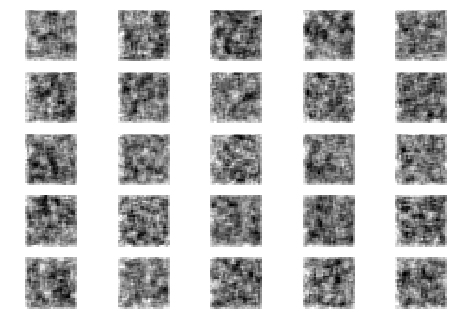

Epoch 1 Batch 901/937 [D loss: 0.678830, acc.: 62.50%] [G loss: 1.107121]
Epoch 1 Batch 902/937 [D loss: 0.761590, acc.: 53.12%] [G loss: 1.063581]
Epoch 1 Batch 903/937 [D loss: 0.772725, acc.: 56.25%] [G loss: 1.059345]
Epoch 1 Batch 904/937 [D loss: 0.613195, acc.: 59.38%] [G loss: 1.396987]
Epoch 1 Batch 905/937 [D loss: 0.727913, acc.: 65.62%] [G loss: 0.964386]
Epoch 1 Batch 906/937 [D loss: 0.697692, acc.: 71.88%] [G loss: 0.961812]
Epoch 1 Batch 907/937 [D loss: 0.585538, acc.: 65.62%] [G loss: 1.138434]
Epoch 1 Batch 908/937 [D loss: 0.712419, acc.: 46.88%] [G loss: 1.239969]
Epoch 1 Batch 909/937 [D loss: 0.645989, acc.: 62.50%] [G loss: 1.191191]


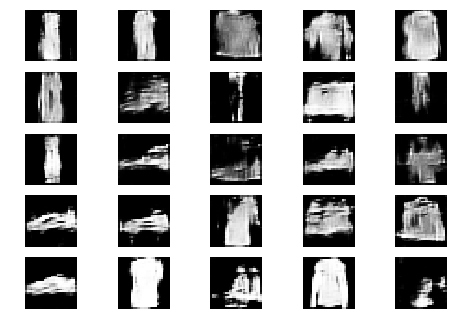

Epoch 1 Batch 910/937 [D loss: 0.455307, acc.: 78.12%] [G loss: 1.274934]
Epoch 1 Batch 911/937 [D loss: 0.716968, acc.: 53.12%] [G loss: 1.315474]
Epoch 1 Batch 912/937 [D loss: 0.544041, acc.: 78.12%] [G loss: 1.173574]
Epoch 1 Batch 913/937 [D loss: 0.569401, acc.: 68.75%] [G loss: 1.335368]
Epoch 1 Batch 914/937 [D loss: 0.595331, acc.: 71.88%] [G loss: 1.151215]
Epoch 1 Batch 915/937 [D loss: 0.632813, acc.: 71.88%] [G loss: 1.096075]
Epoch 1 Batch 916/937 [D loss: 0.582983, acc.: 65.62%] [G loss: 1.388047]
Epoch 1 Batch 917/937 [D loss: 0.520126, acc.: 65.62%] [G loss: 1.562885]
Epoch 1 Batch 918/937 [D loss: 0.697378, acc.: 65.62%] [G loss: 1.361824]


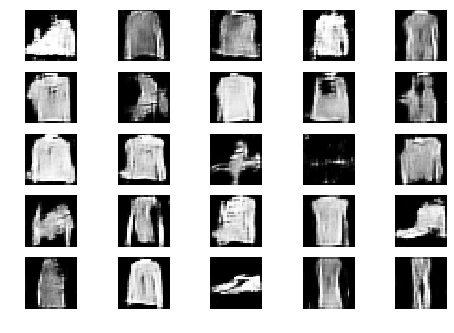

Epoch 1 Batch 919/937 [D loss: 0.526991, acc.: 78.12%] [G loss: 1.016793]
Epoch 1 Batch 920/937 [D loss: 0.730514, acc.: 59.38%] [G loss: 0.997343]
Epoch 1 Batch 921/937 [D loss: 0.668888, acc.: 65.62%] [G loss: 0.903669]
Epoch 1 Batch 922/937 [D loss: 0.564526, acc.: 78.12%] [G loss: 0.882189]
Epoch 1 Batch 923/937 [D loss: 0.711109, acc.: 56.25%] [G loss: 1.289816]
Epoch 1 Batch 924/937 [D loss: 0.573160, acc.: 62.50%] [G loss: 1.139592]
Epoch 1 Batch 925/937 [D loss: 0.670739, acc.: 62.50%] [G loss: 0.882405]
Epoch 1 Batch 926/937 [D loss: 0.571475, acc.: 71.88%] [G loss: 1.316792]
Epoch 1 Batch 927/937 [D loss: 0.582022, acc.: 62.50%] [G loss: 1.290299]
Epoch 1 Batch 928/937 [D loss: 0.598151, acc.: 62.50%] [G loss: 1.261483]
Epoch 1 Batch 929/937 [D loss: 0.741319, acc.: 62.50%] [G loss: 1.363649]
Epoch 1 Batch 930/937 [D loss: 0.632149, acc.: 65.62%] [G loss: 1.120575]
Epoch 1 Batch 931/937 [D loss: 0.538245, acc.: 78.12%] [G loss: 1.449554]
Epoch 1 Batch 932/937 [D loss: 0.61552

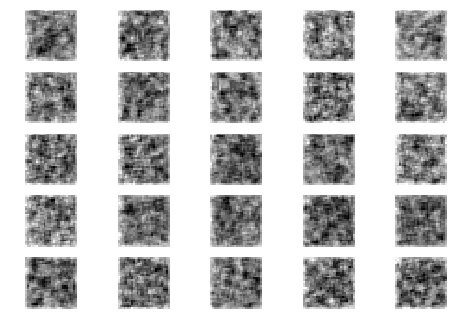

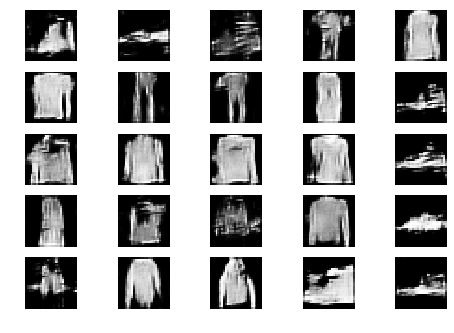

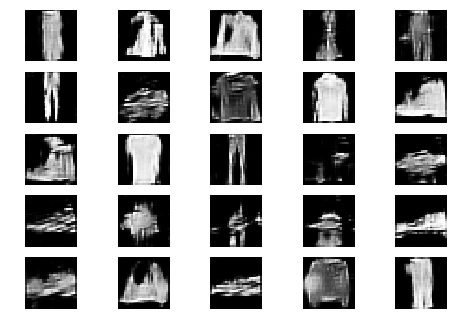

Epoch 2 Batch 1/937 [D loss: 0.368652, acc.: 90.62%] [G loss: 1.326967]
Epoch 2 Batch 2/937 [D loss: 0.799918, acc.: 56.25%] [G loss: 1.070068]
Epoch 2 Batch 3/937 [D loss: 0.499023, acc.: 75.00%] [G loss: 0.976331]
Epoch 2 Batch 4/937 [D loss: 0.483464, acc.: 87.50%] [G loss: 1.130294]
Epoch 2 Batch 5/937 [D loss: 0.617247, acc.: 68.75%] [G loss: 1.139859]
Epoch 2 Batch 6/937 [D loss: 0.611225, acc.: 56.25%] [G loss: 1.261240]
Epoch 2 Batch 7/937 [D loss: 0.570666, acc.: 68.75%] [G loss: 0.991358]
Epoch 2 Batch 8/937 [D loss: 0.720076, acc.: 56.25%] [G loss: 0.955196]
Epoch 2 Batch 9/937 [D loss: 0.745953, acc.: 56.25%] [G loss: 1.146270]
Epoch 2 Batch 10/937 [D loss: 0.558397, acc.: 71.88%] [G loss: 1.123734]
Epoch 2 Batch 11/937 [D loss: 0.459411, acc.: 75.00%] [G loss: 1.066369]
Epoch 2 Batch 12/937 [D loss: 0.753788, acc.: 50.00%] [G loss: 0.855419]
Epoch 2 Batch 13/937 [D loss: 0.417214, acc.: 81.25%] [G loss: 1.172441]
Epoch 2 Batch 14/937 [D loss: 0.469139, acc.: 71.88%] [G los

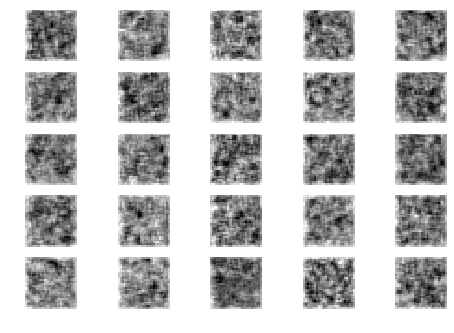

Epoch 2 Batch 101/937 [D loss: 0.506975, acc.: 71.88%] [G loss: 1.146964]


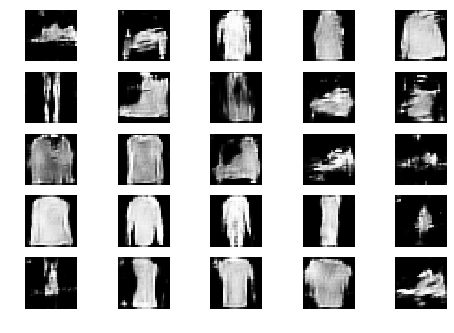

Epoch 2 Batch 102/937 [D loss: 0.556581, acc.: 68.75%] [G loss: 1.285278]


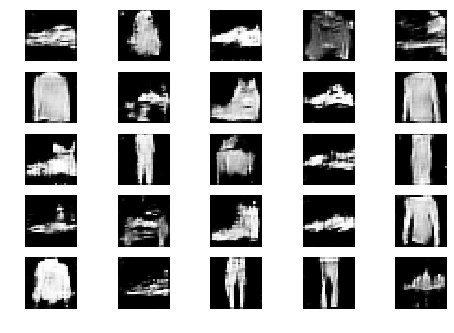

Epoch 2 Batch 103/937 [D loss: 0.721181, acc.: 56.25%] [G loss: 0.961623]
Epoch 2 Batch 104/937 [D loss: 0.711167, acc.: 59.38%] [G loss: 1.203926]
Epoch 2 Batch 105/937 [D loss: 0.868992, acc.: 46.88%] [G loss: 1.349448]
Epoch 2 Batch 106/937 [D loss: 0.616902, acc.: 68.75%] [G loss: 1.389623]
Epoch 2 Batch 107/937 [D loss: 0.680347, acc.: 65.62%] [G loss: 1.002033]
Epoch 2 Batch 108/937 [D loss: 0.759739, acc.: 53.12%] [G loss: 1.194537]
Epoch 2 Batch 109/937 [D loss: 0.619762, acc.: 62.50%] [G loss: 0.940154]
Epoch 2 Batch 110/937 [D loss: 0.723828, acc.: 56.25%] [G loss: 1.349512]
Epoch 2 Batch 111/937 [D loss: 0.630922, acc.: 62.50%] [G loss: 1.304392]
Epoch 2 Batch 112/937 [D loss: 0.477100, acc.: 78.12%] [G loss: 1.037430]
Epoch 2 Batch 113/937 [D loss: 0.595137, acc.: 62.50%] [G loss: 1.062360]
Epoch 2 Batch 114/937 [D loss: 0.611478, acc.: 53.12%] [G loss: 1.176096]
Epoch 2 Batch 115/937 [D loss: 0.723026, acc.: 62.50%] [G loss: 1.255510]
Epoch 2 Batch 116/937 [D loss: 0.88657

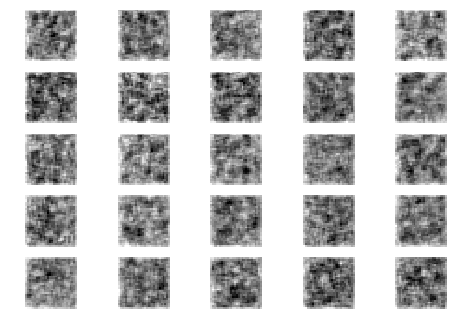

Epoch 2 Batch 201/937 [D loss: 0.821405, acc.: 50.00%] [G loss: 1.247490]
Epoch 2 Batch 202/937 [D loss: 0.685829, acc.: 59.38%] [G loss: 0.989557]


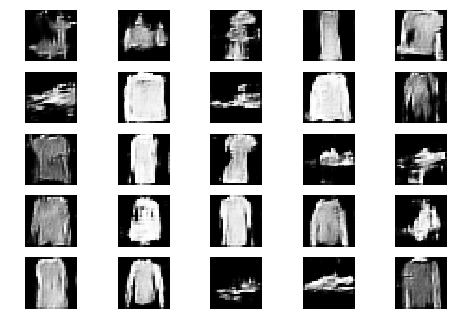

Epoch 2 Batch 203/937 [D loss: 0.605322, acc.: 62.50%] [G loss: 1.032442]
Epoch 2 Batch 204/937 [D loss: 0.561433, acc.: 71.88%] [G loss: 1.037001]


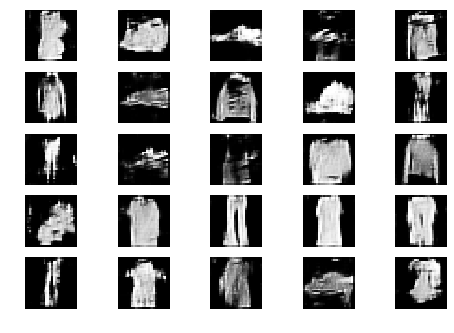

Epoch 2 Batch 205/937 [D loss: 0.654377, acc.: 59.38%] [G loss: 1.281568]
Epoch 2 Batch 206/937 [D loss: 0.487602, acc.: 81.25%] [G loss: 1.132355]
Epoch 2 Batch 207/937 [D loss: 0.606337, acc.: 68.75%] [G loss: 1.124289]
Epoch 2 Batch 208/937 [D loss: 0.765438, acc.: 56.25%] [G loss: 1.337527]
Epoch 2 Batch 209/937 [D loss: 0.462388, acc.: 78.12%] [G loss: 0.806934]
Epoch 2 Batch 210/937 [D loss: 0.776517, acc.: 46.88%] [G loss: 1.008965]
Epoch 2 Batch 211/937 [D loss: 0.611886, acc.: 65.62%] [G loss: 1.101810]
Epoch 2 Batch 212/937 [D loss: 0.546275, acc.: 71.88%] [G loss: 0.913615]
Epoch 2 Batch 213/937 [D loss: 0.654741, acc.: 65.62%] [G loss: 1.130260]
Epoch 2 Batch 214/937 [D loss: 0.864746, acc.: 53.12%] [G loss: 1.119359]
Epoch 2 Batch 215/937 [D loss: 0.674935, acc.: 62.50%] [G loss: 1.102141]
Epoch 2 Batch 216/937 [D loss: 0.405237, acc.: 90.62%] [G loss: 1.257537]
Epoch 2 Batch 217/937 [D loss: 0.704015, acc.: 62.50%] [G loss: 0.960400]
Epoch 2 Batch 218/937 [D loss: 0.65072

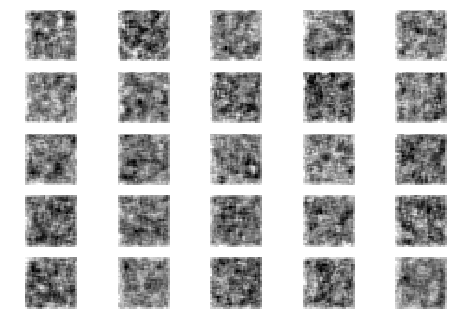

Epoch 2 Batch 301/937 [D loss: 0.644228, acc.: 56.25%] [G loss: 0.965725]
Epoch 2 Batch 302/937 [D loss: 0.621707, acc.: 65.62%] [G loss: 1.264215]
Epoch 2 Batch 303/937 [D loss: 0.534954, acc.: 68.75%] [G loss: 1.364520]


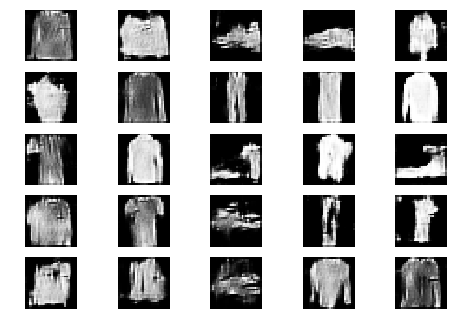

Epoch 2 Batch 304/937 [D loss: 0.506340, acc.: 75.00%] [G loss: 1.061669]
Epoch 2 Batch 305/937 [D loss: 0.643947, acc.: 62.50%] [G loss: 1.157820]
Epoch 2 Batch 306/937 [D loss: 0.672574, acc.: 50.00%] [G loss: 1.133023]


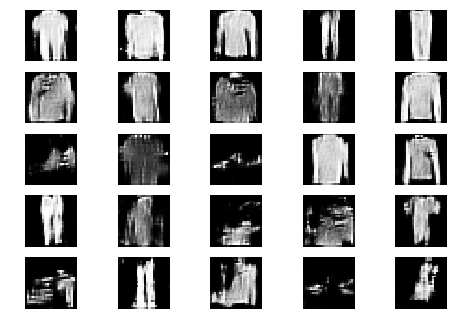

Epoch 2 Batch 307/937 [D loss: 0.820777, acc.: 50.00%] [G loss: 1.053022]
Epoch 2 Batch 308/937 [D loss: 0.725040, acc.: 53.12%] [G loss: 0.851548]
Epoch 2 Batch 309/937 [D loss: 0.500338, acc.: 84.38%] [G loss: 1.030178]
Epoch 2 Batch 310/937 [D loss: 0.567601, acc.: 75.00%] [G loss: 1.325128]
Epoch 2 Batch 311/937 [D loss: 0.839392, acc.: 59.38%] [G loss: 1.172730]
Epoch 2 Batch 312/937 [D loss: 0.601200, acc.: 65.62%] [G loss: 1.263362]
Epoch 2 Batch 313/937 [D loss: 0.790334, acc.: 53.12%] [G loss: 1.181725]
Epoch 2 Batch 314/937 [D loss: 0.531333, acc.: 75.00%] [G loss: 0.958530]
Epoch 2 Batch 315/937 [D loss: 0.744906, acc.: 59.38%] [G loss: 1.321947]
Epoch 2 Batch 316/937 [D loss: 0.666970, acc.: 53.12%] [G loss: 1.357040]
Epoch 2 Batch 317/937 [D loss: 0.673553, acc.: 71.88%] [G loss: 1.283080]
Epoch 2 Batch 318/937 [D loss: 0.718584, acc.: 56.25%] [G loss: 0.799800]
Epoch 2 Batch 319/937 [D loss: 0.570585, acc.: 65.62%] [G loss: 1.299837]
Epoch 2 Batch 320/937 [D loss: 0.72732

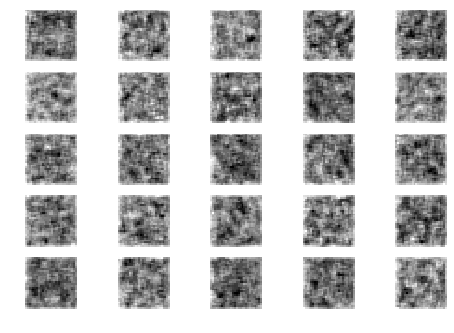

Epoch 2 Batch 401/937 [D loss: 0.514052, acc.: 75.00%] [G loss: 1.330138]
Epoch 2 Batch 402/937 [D loss: 0.471715, acc.: 75.00%] [G loss: 1.138792]
Epoch 2 Batch 403/937 [D loss: 0.638324, acc.: 62.50%] [G loss: 1.161355]
Epoch 2 Batch 404/937 [D loss: 0.697207, acc.: 56.25%] [G loss: 1.161708]


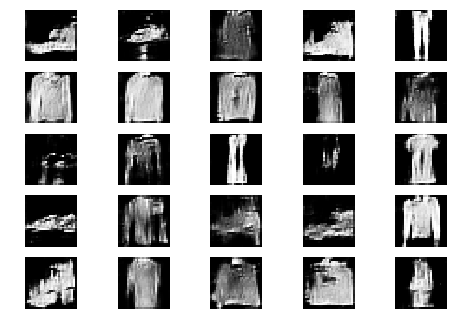

Epoch 2 Batch 405/937 [D loss: 0.668486, acc.: 59.38%] [G loss: 1.188628]
Epoch 2 Batch 406/937 [D loss: 0.784032, acc.: 59.38%] [G loss: 1.141971]
Epoch 2 Batch 407/937 [D loss: 0.760915, acc.: 56.25%] [G loss: 1.408325]
Epoch 2 Batch 408/937 [D loss: 0.646496, acc.: 62.50%] [G loss: 1.040768]


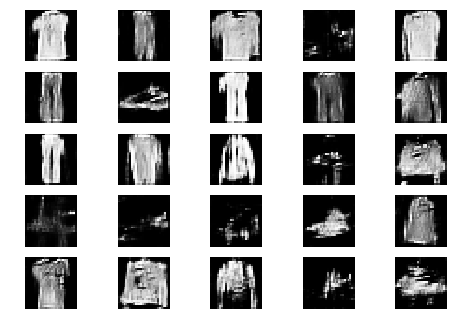

Epoch 2 Batch 409/937 [D loss: 0.679122, acc.: 65.62%] [G loss: 1.274553]
Epoch 2 Batch 410/937 [D loss: 0.612402, acc.: 68.75%] [G loss: 1.274708]
Epoch 2 Batch 411/937 [D loss: 0.358934, acc.: 90.62%] [G loss: 1.202757]
Epoch 2 Batch 412/937 [D loss: 0.565529, acc.: 75.00%] [G loss: 0.980660]
Epoch 2 Batch 413/937 [D loss: 0.651483, acc.: 65.62%] [G loss: 0.890538]
Epoch 2 Batch 414/937 [D loss: 0.465828, acc.: 78.12%] [G loss: 1.155878]
Epoch 2 Batch 415/937 [D loss: 0.697338, acc.: 68.75%] [G loss: 1.187498]
Epoch 2 Batch 416/937 [D loss: 0.691456, acc.: 59.38%] [G loss: 0.957171]
Epoch 2 Batch 417/937 [D loss: 0.830791, acc.: 43.75%] [G loss: 1.200718]
Epoch 2 Batch 418/937 [D loss: 0.582456, acc.: 68.75%] [G loss: 1.070277]
Epoch 2 Batch 419/937 [D loss: 0.471361, acc.: 78.12%] [G loss: 1.229920]
Epoch 2 Batch 420/937 [D loss: 0.848804, acc.: 53.12%] [G loss: 1.035749]
Epoch 2 Batch 421/937 [D loss: 0.600445, acc.: 65.62%] [G loss: 0.952184]
Epoch 2 Batch 422/937 [D loss: 0.76520

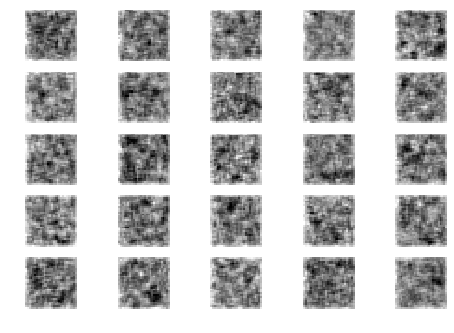

Epoch 2 Batch 501/937 [D loss: 0.722078, acc.: 56.25%] [G loss: 0.964632]
Epoch 2 Batch 502/937 [D loss: 0.643539, acc.: 59.38%] [G loss: 1.150166]
Epoch 2 Batch 503/937 [D loss: 0.551360, acc.: 75.00%] [G loss: 0.928869]
Epoch 2 Batch 504/937 [D loss: 0.666243, acc.: 56.25%] [G loss: 1.247083]
Epoch 2 Batch 505/937 [D loss: 0.460414, acc.: 78.12%] [G loss: 1.235648]


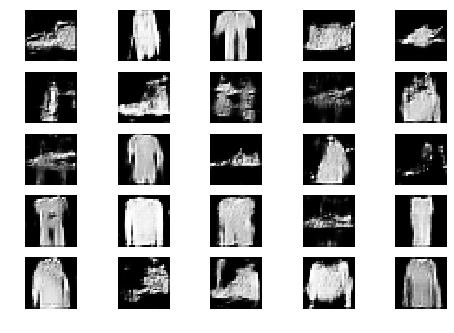

Epoch 2 Batch 506/937 [D loss: 0.636269, acc.: 68.75%] [G loss: 0.969567]
Epoch 2 Batch 507/937 [D loss: 0.733422, acc.: 59.38%] [G loss: 1.015922]
Epoch 2 Batch 508/937 [D loss: 0.699615, acc.: 59.38%] [G loss: 1.061894]
Epoch 2 Batch 509/937 [D loss: 0.543286, acc.: 65.62%] [G loss: 1.230503]
Epoch 2 Batch 510/937 [D loss: 0.725855, acc.: 59.38%] [G loss: 1.096897]


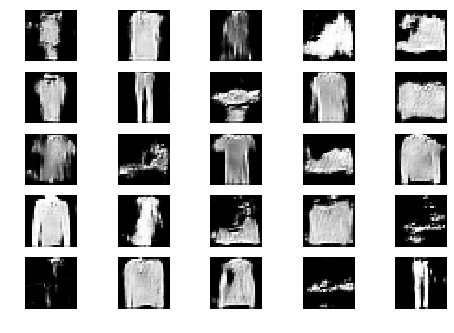

Epoch 2 Batch 511/937 [D loss: 0.571851, acc.: 68.75%] [G loss: 1.037166]
Epoch 2 Batch 512/937 [D loss: 0.632939, acc.: 53.12%] [G loss: 1.117123]
Epoch 2 Batch 513/937 [D loss: 0.650754, acc.: 53.12%] [G loss: 1.071598]
Epoch 2 Batch 514/937 [D loss: 0.650342, acc.: 59.38%] [G loss: 1.081273]
Epoch 2 Batch 515/937 [D loss: 0.765115, acc.: 56.25%] [G loss: 0.861259]
Epoch 2 Batch 516/937 [D loss: 0.598112, acc.: 62.50%] [G loss: 1.004361]
Epoch 2 Batch 517/937 [D loss: 0.613990, acc.: 62.50%] [G loss: 1.168229]
Epoch 2 Batch 518/937 [D loss: 0.517006, acc.: 81.25%] [G loss: 1.119162]
Epoch 2 Batch 519/937 [D loss: 0.672400, acc.: 71.88%] [G loss: 1.227019]
Epoch 2 Batch 520/937 [D loss: 0.708915, acc.: 53.12%] [G loss: 1.260507]
Epoch 2 Batch 521/937 [D loss: 0.639139, acc.: 71.88%] [G loss: 1.184988]
Epoch 2 Batch 522/937 [D loss: 0.679021, acc.: 62.50%] [G loss: 1.341825]
Epoch 2 Batch 523/937 [D loss: 0.759592, acc.: 65.62%] [G loss: 0.945724]
Epoch 2 Batch 524/937 [D loss: 0.61912

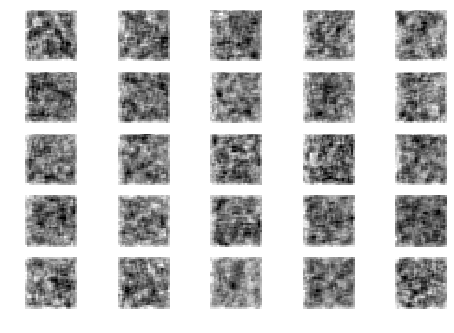

Epoch 2 Batch 601/937 [D loss: 0.438509, acc.: 87.50%] [G loss: 1.115363]
Epoch 2 Batch 602/937 [D loss: 0.587886, acc.: 75.00%] [G loss: 1.006007]
Epoch 2 Batch 603/937 [D loss: 0.726813, acc.: 56.25%] [G loss: 0.955698]
Epoch 2 Batch 604/937 [D loss: 0.532154, acc.: 68.75%] [G loss: 0.955272]
Epoch 2 Batch 605/937 [D loss: 0.722776, acc.: 46.88%] [G loss: 1.064501]
Epoch 2 Batch 606/937 [D loss: 0.706402, acc.: 59.38%] [G loss: 1.054283]


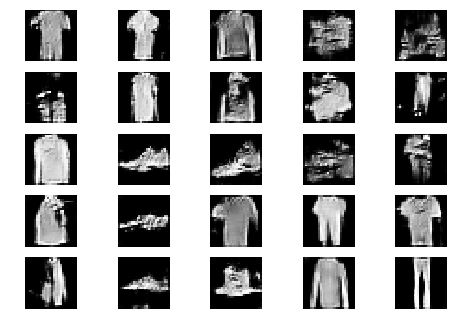

Epoch 2 Batch 607/937 [D loss: 0.672000, acc.: 59.38%] [G loss: 1.112851]
Epoch 2 Batch 608/937 [D loss: 0.667969, acc.: 65.62%] [G loss: 1.262899]
Epoch 2 Batch 609/937 [D loss: 0.500571, acc.: 65.62%] [G loss: 1.162141]
Epoch 2 Batch 610/937 [D loss: 0.623508, acc.: 56.25%] [G loss: 1.028419]
Epoch 2 Batch 611/937 [D loss: 0.595274, acc.: 68.75%] [G loss: 1.184990]
Epoch 2 Batch 612/937 [D loss: 0.631427, acc.: 71.88%] [G loss: 1.050422]


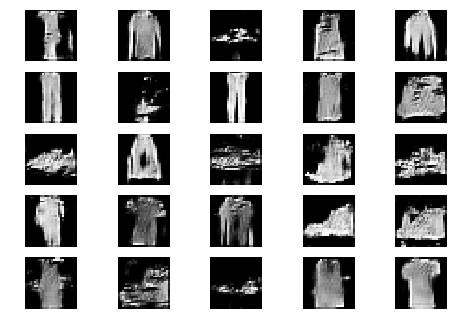

Epoch 2 Batch 613/937 [D loss: 0.579209, acc.: 71.88%] [G loss: 0.846409]
Epoch 2 Batch 614/937 [D loss: 0.776124, acc.: 46.88%] [G loss: 1.206985]
Epoch 2 Batch 615/937 [D loss: 0.644772, acc.: 65.62%] [G loss: 1.376824]
Epoch 2 Batch 616/937 [D loss: 0.622395, acc.: 68.75%] [G loss: 1.051538]
Epoch 2 Batch 617/937 [D loss: 0.672316, acc.: 68.75%] [G loss: 1.076754]
Epoch 2 Batch 618/937 [D loss: 0.736850, acc.: 56.25%] [G loss: 1.215180]
Epoch 2 Batch 619/937 [D loss: 0.602068, acc.: 65.62%] [G loss: 0.929930]
Epoch 2 Batch 620/937 [D loss: 0.694483, acc.: 53.12%] [G loss: 1.042636]
Epoch 2 Batch 621/937 [D loss: 0.816871, acc.: 50.00%] [G loss: 1.496905]
Epoch 2 Batch 622/937 [D loss: 0.747452, acc.: 53.12%] [G loss: 1.447386]
Epoch 2 Batch 623/937 [D loss: 0.716563, acc.: 62.50%] [G loss: 1.104641]
Epoch 2 Batch 624/937 [D loss: 0.824482, acc.: 43.75%] [G loss: 0.883971]
Epoch 2 Batch 625/937 [D loss: 0.608070, acc.: 68.75%] [G loss: 1.189607]
Epoch 2 Batch 626/937 [D loss: 0.73353

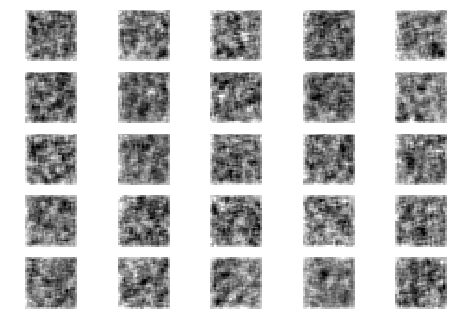

Epoch 2 Batch 701/937 [D loss: 0.769830, acc.: 59.38%] [G loss: 1.017856]
Epoch 2 Batch 702/937 [D loss: 0.597217, acc.: 68.75%] [G loss: 1.113540]
Epoch 2 Batch 703/937 [D loss: 0.622881, acc.: 71.88%] [G loss: 1.149648]
Epoch 2 Batch 704/937 [D loss: 0.676209, acc.: 59.38%] [G loss: 1.122443]
Epoch 2 Batch 705/937 [D loss: 0.612600, acc.: 59.38%] [G loss: 1.159492]
Epoch 2 Batch 706/937 [D loss: 0.802361, acc.: 50.00%] [G loss: 1.377071]
Epoch 2 Batch 707/937 [D loss: 0.548158, acc.: 78.12%] [G loss: 1.075118]


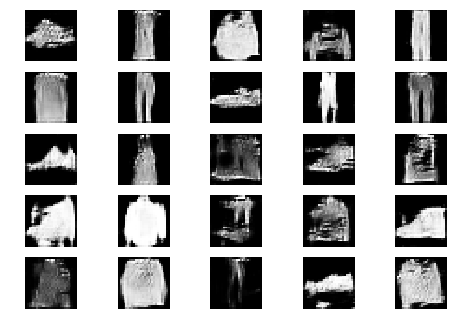

Epoch 2 Batch 708/937 [D loss: 0.518665, acc.: 81.25%] [G loss: 0.808587]
Epoch 2 Batch 709/937 [D loss: 0.693425, acc.: 65.62%] [G loss: 1.222494]
Epoch 2 Batch 710/937 [D loss: 0.642179, acc.: 59.38%] [G loss: 1.149662]
Epoch 2 Batch 711/937 [D loss: 0.821567, acc.: 46.88%] [G loss: 1.054531]
Epoch 2 Batch 712/937 [D loss: 0.719734, acc.: 65.62%] [G loss: 0.914953]
Epoch 2 Batch 713/937 [D loss: 0.700546, acc.: 50.00%] [G loss: 0.931905]
Epoch 2 Batch 714/937 [D loss: 0.546365, acc.: 71.88%] [G loss: 1.214137]


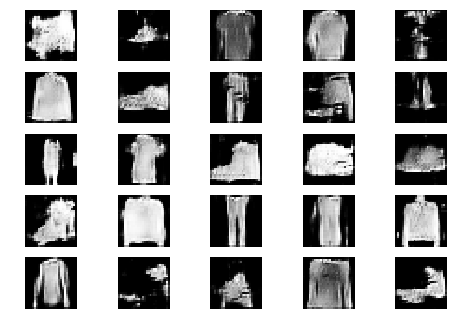

Epoch 2 Batch 715/937 [D loss: 0.662430, acc.: 68.75%] [G loss: 0.968035]
Epoch 2 Batch 716/937 [D loss: 0.647218, acc.: 59.38%] [G loss: 1.139871]
Epoch 2 Batch 717/937 [D loss: 0.711121, acc.: 56.25%] [G loss: 0.883041]
Epoch 2 Batch 718/937 [D loss: 0.574223, acc.: 65.62%] [G loss: 0.996836]
Epoch 2 Batch 719/937 [D loss: 0.631832, acc.: 75.00%] [G loss: 0.947030]
Epoch 2 Batch 720/937 [D loss: 0.678023, acc.: 56.25%] [G loss: 1.271940]
Epoch 2 Batch 721/937 [D loss: 0.672580, acc.: 65.62%] [G loss: 1.227237]
Epoch 2 Batch 722/937 [D loss: 0.639922, acc.: 62.50%] [G loss: 1.307493]
Epoch 2 Batch 723/937 [D loss: 0.687840, acc.: 50.00%] [G loss: 1.128054]
Epoch 2 Batch 724/937 [D loss: 0.775393, acc.: 56.25%] [G loss: 1.195601]
Epoch 2 Batch 725/937 [D loss: 0.795323, acc.: 56.25%] [G loss: 1.299393]
Epoch 2 Batch 726/937 [D loss: 0.731030, acc.: 53.12%] [G loss: 1.050934]
Epoch 2 Batch 727/937 [D loss: 0.679751, acc.: 59.38%] [G loss: 1.080494]
Epoch 2 Batch 728/937 [D loss: 0.52188

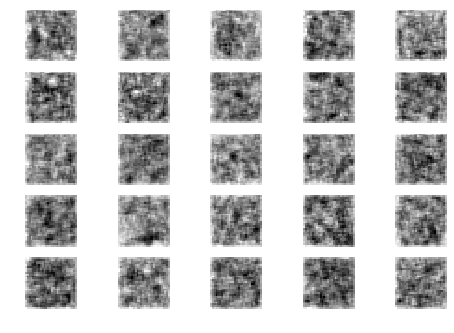

Epoch 2 Batch 801/937 [D loss: 0.661543, acc.: 65.62%] [G loss: 1.088889]
Epoch 2 Batch 802/937 [D loss: 0.651027, acc.: 65.62%] [G loss: 0.945491]
Epoch 2 Batch 803/937 [D loss: 0.705057, acc.: 59.38%] [G loss: 1.047385]
Epoch 2 Batch 804/937 [D loss: 0.780262, acc.: 65.62%] [G loss: 1.034397]
Epoch 2 Batch 805/937 [D loss: 0.577987, acc.: 71.88%] [G loss: 1.232632]
Epoch 2 Batch 806/937 [D loss: 0.642176, acc.: 65.62%] [G loss: 1.127559]
Epoch 2 Batch 807/937 [D loss: 0.545516, acc.: 68.75%] [G loss: 1.122111]
Epoch 2 Batch 808/937 [D loss: 0.688790, acc.: 56.25%] [G loss: 0.972527]


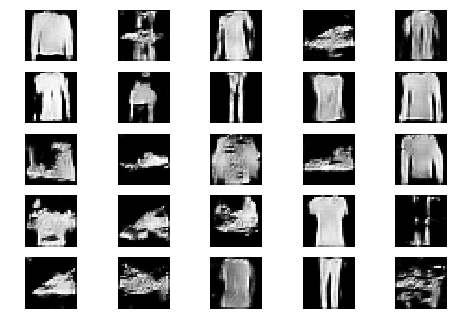

Epoch 2 Batch 809/937 [D loss: 0.781744, acc.: 56.25%] [G loss: 1.151446]
Epoch 2 Batch 810/937 [D loss: 0.716921, acc.: 53.12%] [G loss: 1.066115]
Epoch 2 Batch 811/937 [D loss: 0.473956, acc.: 75.00%] [G loss: 1.100425]
Epoch 2 Batch 812/937 [D loss: 0.684684, acc.: 59.38%] [G loss: 0.938071]
Epoch 2 Batch 813/937 [D loss: 0.751208, acc.: 53.12%] [G loss: 1.097283]
Epoch 2 Batch 814/937 [D loss: 0.695624, acc.: 46.88%] [G loss: 1.183098]
Epoch 2 Batch 815/937 [D loss: 0.504954, acc.: 84.38%] [G loss: 0.982819]
Epoch 2 Batch 816/937 [D loss: 0.573566, acc.: 68.75%] [G loss: 0.981795]


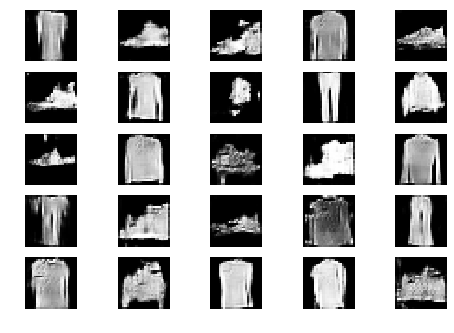

Epoch 2 Batch 817/937 [D loss: 0.560405, acc.: 65.62%] [G loss: 1.066192]
Epoch 2 Batch 818/937 [D loss: 0.549822, acc.: 75.00%] [G loss: 1.158568]
Epoch 2 Batch 819/937 [D loss: 0.677231, acc.: 62.50%] [G loss: 1.128091]
Epoch 2 Batch 820/937 [D loss: 0.601029, acc.: 68.75%] [G loss: 0.995770]
Epoch 2 Batch 821/937 [D loss: 0.715573, acc.: 56.25%] [G loss: 1.000366]
Epoch 2 Batch 822/937 [D loss: 0.500445, acc.: 81.25%] [G loss: 1.022325]
Epoch 2 Batch 823/937 [D loss: 0.641053, acc.: 68.75%] [G loss: 1.108639]
Epoch 2 Batch 824/937 [D loss: 0.543599, acc.: 71.88%] [G loss: 0.949421]
Epoch 2 Batch 825/937 [D loss: 0.596537, acc.: 68.75%] [G loss: 1.158180]
Epoch 2 Batch 826/937 [D loss: 0.575339, acc.: 75.00%] [G loss: 1.154665]
Epoch 2 Batch 827/937 [D loss: 0.637220, acc.: 62.50%] [G loss: 1.069768]
Epoch 2 Batch 828/937 [D loss: 0.810456, acc.: 43.75%] [G loss: 1.297370]
Epoch 2 Batch 829/937 [D loss: 0.652811, acc.: 62.50%] [G loss: 1.247295]
Epoch 2 Batch 830/937 [D loss: 0.54318

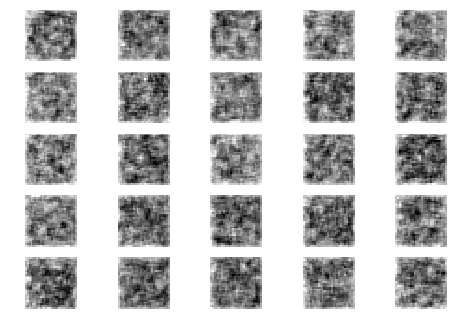

Epoch 2 Batch 901/937 [D loss: 0.718202, acc.: 53.12%] [G loss: 1.270396]
Epoch 2 Batch 902/937 [D loss: 0.444103, acc.: 84.38%] [G loss: 1.211681]
Epoch 2 Batch 903/937 [D loss: 0.539765, acc.: 75.00%] [G loss: 0.932921]
Epoch 2 Batch 904/937 [D loss: 0.544325, acc.: 75.00%] [G loss: 1.076994]
Epoch 2 Batch 905/937 [D loss: 0.639845, acc.: 56.25%] [G loss: 0.831734]
Epoch 2 Batch 906/937 [D loss: 0.592720, acc.: 59.38%] [G loss: 1.220222]
Epoch 2 Batch 907/937 [D loss: 0.569569, acc.: 68.75%] [G loss: 0.910610]
Epoch 2 Batch 908/937 [D loss: 0.561049, acc.: 78.12%] [G loss: 1.330057]
Epoch 2 Batch 909/937 [D loss: 0.662197, acc.: 53.12%] [G loss: 1.110106]


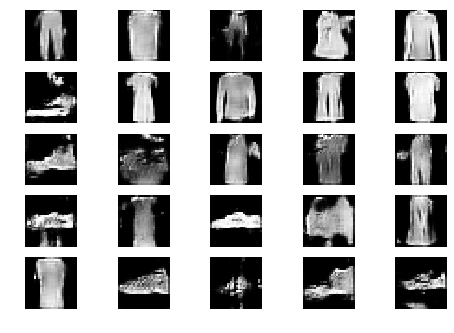

Epoch 2 Batch 910/937 [D loss: 0.674068, acc.: 65.62%] [G loss: 1.024858]
Epoch 2 Batch 911/937 [D loss: 0.570201, acc.: 71.88%] [G loss: 1.006769]
Epoch 2 Batch 912/937 [D loss: 0.673081, acc.: 65.62%] [G loss: 0.928462]
Epoch 2 Batch 913/937 [D loss: 0.616122, acc.: 59.38%] [G loss: 1.168071]
Epoch 2 Batch 914/937 [D loss: 0.609940, acc.: 65.62%] [G loss: 0.876000]
Epoch 2 Batch 915/937 [D loss: 0.594156, acc.: 68.75%] [G loss: 1.386103]
Epoch 2 Batch 916/937 [D loss: 0.565009, acc.: 71.88%] [G loss: 1.399935]
Epoch 2 Batch 917/937 [D loss: 0.687890, acc.: 56.25%] [G loss: 1.002549]
Epoch 2 Batch 918/937 [D loss: 0.641232, acc.: 59.38%] [G loss: 1.246123]


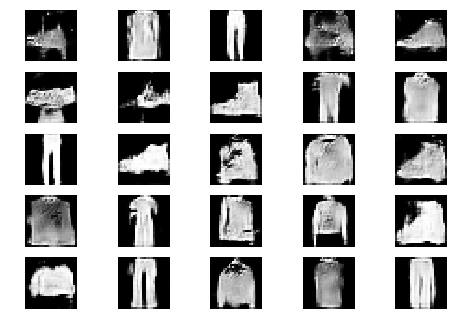

Epoch 2 Batch 919/937 [D loss: 0.629352, acc.: 62.50%] [G loss: 1.198940]
Epoch 2 Batch 920/937 [D loss: 0.707626, acc.: 56.25%] [G loss: 1.132097]
Epoch 2 Batch 921/937 [D loss: 0.754272, acc.: 53.12%] [G loss: 0.958242]
Epoch 2 Batch 922/937 [D loss: 0.642555, acc.: 68.75%] [G loss: 1.119914]
Epoch 2 Batch 923/937 [D loss: 0.614486, acc.: 71.88%] [G loss: 1.202473]
Epoch 2 Batch 924/937 [D loss: 0.561326, acc.: 68.75%] [G loss: 1.103409]
Epoch 2 Batch 925/937 [D loss: 0.695742, acc.: 59.38%] [G loss: 1.116551]
Epoch 2 Batch 926/937 [D loss: 0.583113, acc.: 71.88%] [G loss: 1.123581]
Epoch 2 Batch 927/937 [D loss: 0.570624, acc.: 68.75%] [G loss: 1.212500]
Epoch 2 Batch 928/937 [D loss: 0.592528, acc.: 65.62%] [G loss: 0.814724]
Epoch 2 Batch 929/937 [D loss: 0.735581, acc.: 53.12%] [G loss: 1.113829]
Epoch 2 Batch 930/937 [D loss: 0.693806, acc.: 62.50%] [G loss: 1.138463]
Epoch 2 Batch 931/937 [D loss: 0.641402, acc.: 68.75%] [G loss: 0.972274]
Epoch 2 Batch 932/937 [D loss: 0.53205

In [22]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=5, modeltotrain=2)

In [0]:
!rm -rf generator2Trainedepoch2.h5

generator2.save('generator2fmnist.h5')

In [0]:
!ls -al


total 77252
drwxr-xr-x 1 root root     4096 Dec  5 10:16 .
drwxr-xr-x 1 root root     4096 Dec  5 05:42 ..
-rw-r--r-- 1 root root 22256168 Dec  5 08:34 combined1.h5
drwxr-xr-x 1 root root     4096 Dec  3 17:43 .config
-rw-r--r-- 1 root root 15348832 Dec  5 08:34 discriminator1.h5
-rw-r--r-- 1 root root    55406 Dec  5 09:40 generator1.h5
-rw-r--r-- 1 root root    55407 Dec  5 08:35 generator1.h5.1
-rw-r--r-- 1 root root 10336800 Dec  5 08:35 generator1.h5.2
-rw-r--r-- 1 root root 10336800 Dec  5 10:16 generator2Trainedepoch2.h5
-rw-r--r-- 1 root root 10336800 Dec  5 09:05 generatorTrained1.h5
-rw-r--r-- 1 root root 10336800 Dec  5 09:46 generatorTrainedepoch2.h5
drwxr-xr-x 2 root root     4096 Dec  3 17:43 sample_data


In [0]:
!ls -al

total 87352
drwxr-xr-x 1 root root     4096 Dec  5 10:25 .
drwxr-xr-x 1 root root     4096 Dec  5 05:42 ..
-rw-r--r-- 1 root root 22256168 Dec  5 08:34 combined1.h5
drwxr-xr-x 1 root root     4096 Dec  3 17:43 .config
-rw-r--r-- 1 root root 15348832 Dec  5 08:34 discriminator1.h5
-rw-r--r-- 1 root root    55406 Dec  5 09:40 generator1.h5
-rw-r--r-- 1 root root    55407 Dec  5 08:35 generator1.h5.1
-rw-r--r-- 1 root root 10336800 Dec  5 08:35 generator1.h5.2
-rw-r--r-- 1 root root 10336800 Dec  5 10:16 generator2Trainedepoch2.h5
-rw-r--r-- 1 root root 10336800 Dec  5 09:05 generatorTrained1.h5
-rw-r--r-- 1 root root 10336800 Dec  5 10:25 generatorTrainedepoch2git.h5
-rw-r--r-- 1 root root 10336800 Dec  5 09:46 generatorTrainedepoch2.h5
drwxr-xr-x 2 root root     4096 Dec  3 17:43 sample_data


In [0]:
!wget https://github.com/rajagopalmotivate/try1/raw/master/generatorTrainedepoch2git.h5

--2018-12-05 10:25:55--  https://github.com/rajagopalmotivate/try1/raw/master/generatorTrainedepoch2git.h5
Resolving github.com (github.com)... 192.30.253.113, 192.30.253.112
Connecting to github.com (github.com)|192.30.253.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rajagopalmotivate/try1/master/generatorTrainedepoch2git.h5 [following]
--2018-12-05 10:25:56--  https://raw.githubusercontent.com/rajagopalmotivate/try1/master/generatorTrainedepoch2git.h5
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10336800 (9.9M) [application/octet-stream]
Saving to: ‘generatorTrainedepoch2git.h5’

generatorTrainedepo 100%[===================>]   9.86M  18.8MB/s    in 0.5s    

2018-12-05 10:25:56 (18.8 MB

In [0]:
generator1, generator2, discriminator, combined , mergedmodel = build_modelsNEW( averagemode = 3 ,  loadpretrainedweights=True)


-- Discriminator -- 
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_16 (InputLayer)        (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_77 (Conv2D)           (None, 14, 14, 32)        320       
_________________________________________________________________
leaky_re_lu_29 (LeakyReLU)   (None, 14, 14, 32)        0         
_________________________________________________________________
dropout_29 (Dropout)         (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_78 (Conv2D)           (None, 7, 7, 64)          18496     
_________________________________________________________________
zero_padding2d_8 (ZeroPaddin (None, 8, 8, 64)          0         
_________________________________________________________________
leaky_re_lu_30 (LeakyReLU)   (None, 8, 8, 64)          

Number of examples:  30000.0
Number of Batches:  937
Number of epochs:  2
G1 output numpy array shape
(16, 28, 28, 1)
G1+G2 appended numpy array shape
(16, 28, 28, 1)


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch 0 Batch 0/937 [D loss: 1.041863, acc.: 34.38%] [G loss: 0.490128]


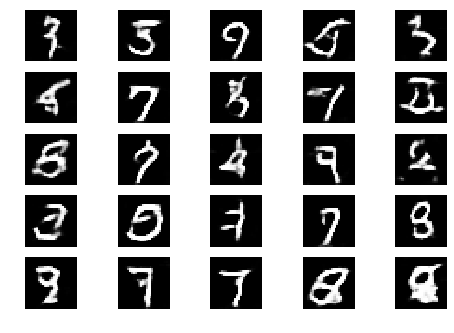

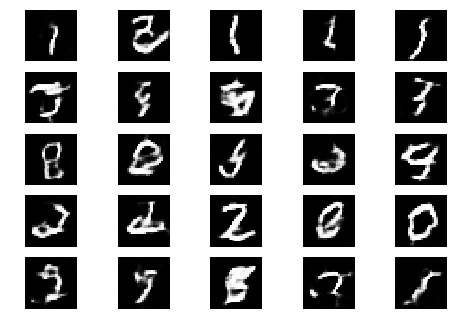

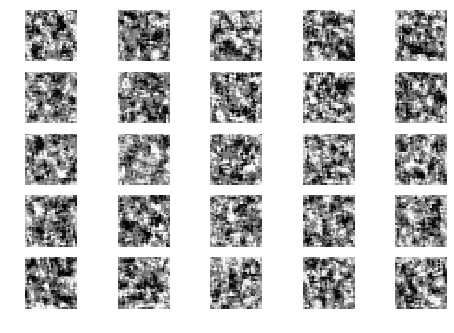

Epoch 0 Batch 1/937 [D loss: 0.813199, acc.: 59.38%] [G loss: 0.644902]
Epoch 0 Batch 2/937 [D loss: 0.782473, acc.: 50.00%] [G loss: 0.708490]
Epoch 0 Batch 3/937 [D loss: 0.760561, acc.: 40.62%] [G loss: 0.625345]
Epoch 0 Batch 4/937 [D loss: 0.856345, acc.: 34.38%] [G loss: 0.704447]
Epoch 0 Batch 5/937 [D loss: 0.921363, acc.: 40.62%] [G loss: 0.613419]
Epoch 0 Batch 6/937 [D loss: 0.865450, acc.: 43.75%] [G loss: 0.612325]
Epoch 0 Batch 7/937 [D loss: 0.995623, acc.: 28.12%] [G loss: 0.689220]
Epoch 0 Batch 8/937 [D loss: 0.806714, acc.: 43.75%] [G loss: 0.610640]
Epoch 0 Batch 9/937 [D loss: 0.842366, acc.: 46.88%] [G loss: 0.547156]
Epoch 0 Batch 10/937 [D loss: 0.706503, acc.: 59.38%] [G loss: 0.548654]
Epoch 0 Batch 11/937 [D loss: 0.830096, acc.: 43.75%] [G loss: 0.438725]
Epoch 0 Batch 12/937 [D loss: 0.844636, acc.: 34.38%] [G loss: 0.537977]
Epoch 0 Batch 13/937 [D loss: 0.845098, acc.: 40.62%] [G loss: 0.541538]
Epoch 0 Batch 14/937 [D loss: 0.821959, acc.: 28.12%] [G los

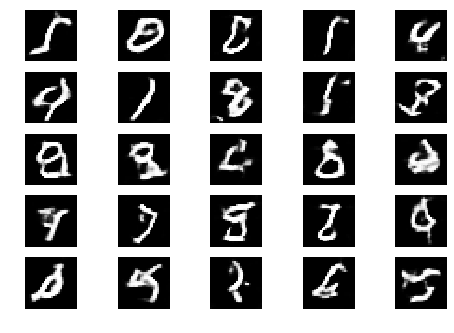

Epoch 0 Batch 101/937 [D loss: 0.710934, acc.: 71.88%] [G loss: 0.095940]


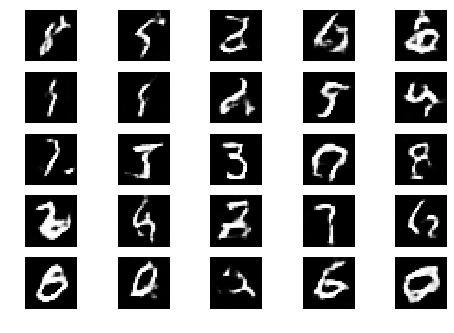

Epoch 0 Batch 102/937 [D loss: 0.818511, acc.: 43.75%] [G loss: 0.101357]


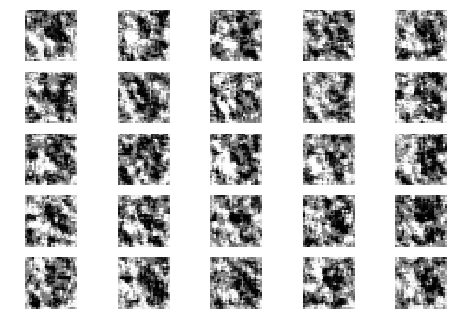

Epoch 0 Batch 103/937 [D loss: 0.679494, acc.: 56.25%] [G loss: 0.073129]
Epoch 0 Batch 104/937 [D loss: 0.753505, acc.: 50.00%] [G loss: 0.091461]
Epoch 0 Batch 105/937 [D loss: 0.936901, acc.: 37.50%] [G loss: 0.072823]
Epoch 0 Batch 106/937 [D loss: 0.793954, acc.: 50.00%] [G loss: 0.061744]
Epoch 0 Batch 107/937 [D loss: 1.017811, acc.: 37.50%] [G loss: 0.119069]
Epoch 0 Batch 108/937 [D loss: 0.796917, acc.: 50.00%] [G loss: 0.071623]
Epoch 0 Batch 109/937 [D loss: 0.702043, acc.: 56.25%] [G loss: 0.073603]
Epoch 0 Batch 110/937 [D loss: 0.835349, acc.: 43.75%] [G loss: 0.083764]
Epoch 0 Batch 111/937 [D loss: 0.811669, acc.: 43.75%] [G loss: 0.076635]
Epoch 0 Batch 112/937 [D loss: 0.730589, acc.: 53.12%] [G loss: 0.107426]
Epoch 0 Batch 113/937 [D loss: 0.940328, acc.: 46.88%] [G loss: 0.081600]
Epoch 0 Batch 114/937 [D loss: 0.699143, acc.: 62.50%] [G loss: 0.100378]
Epoch 0 Batch 115/937 [D loss: 0.650327, acc.: 65.62%] [G loss: 0.089807]
Epoch 0 Batch 116/937 [D loss: 1.00034

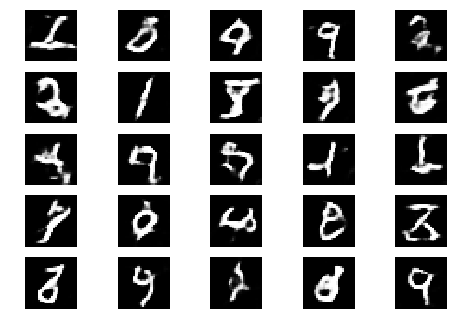

Epoch 0 Batch 201/937 [D loss: 0.739613, acc.: 43.75%] [G loss: 0.039456]
Epoch 0 Batch 202/937 [D loss: 0.700721, acc.: 53.12%] [G loss: 0.035755]


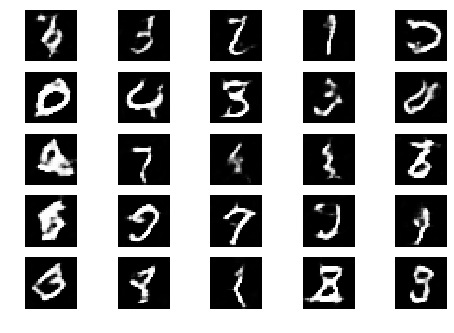

Epoch 0 Batch 203/937 [D loss: 0.853846, acc.: 50.00%] [G loss: 0.047161]
Epoch 0 Batch 204/937 [D loss: 0.805881, acc.: 37.50%] [G loss: 0.042543]


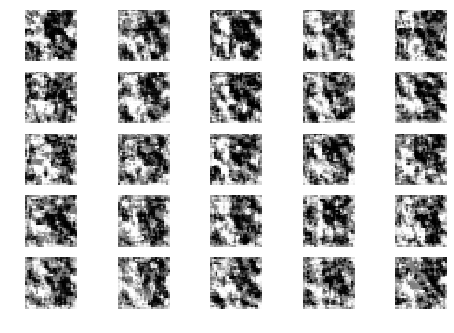

Epoch 0 Batch 205/937 [D loss: 0.851817, acc.: 40.62%] [G loss: 0.052494]
Epoch 0 Batch 206/937 [D loss: 0.772594, acc.: 46.88%] [G loss: 0.045741]
Epoch 0 Batch 207/937 [D loss: 0.864362, acc.: 46.88%] [G loss: 0.045828]
Epoch 0 Batch 208/937 [D loss: 0.730174, acc.: 50.00%] [G loss: 0.041221]
Epoch 0 Batch 209/937 [D loss: 0.692284, acc.: 59.38%] [G loss: 0.045316]
Epoch 0 Batch 210/937 [D loss: 0.663433, acc.: 62.50%] [G loss: 0.033332]
Epoch 0 Batch 211/937 [D loss: 0.762261, acc.: 43.75%] [G loss: 0.037283]
Epoch 0 Batch 212/937 [D loss: 0.645864, acc.: 59.38%] [G loss: 0.036770]
Epoch 0 Batch 213/937 [D loss: 0.693933, acc.: 59.38%] [G loss: 0.036687]
Epoch 0 Batch 214/937 [D loss: 0.823665, acc.: 37.50%] [G loss: 0.027735]
Epoch 0 Batch 215/937 [D loss: 0.809056, acc.: 46.88%] [G loss: 0.047465]
Epoch 0 Batch 216/937 [D loss: 0.835519, acc.: 43.75%] [G loss: 0.030383]
Epoch 0 Batch 217/937 [D loss: 0.532545, acc.: 78.12%] [G loss: 0.038300]
Epoch 0 Batch 218/937 [D loss: 0.86348

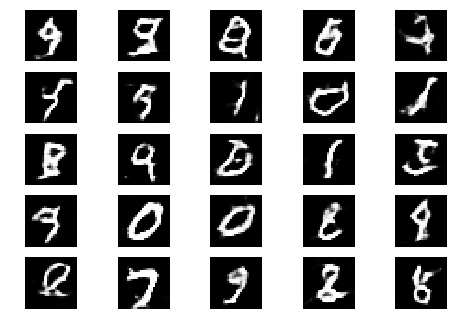

Epoch 0 Batch 301/937 [D loss: 0.681253, acc.: 62.50%] [G loss: 0.028421]
Epoch 0 Batch 302/937 [D loss: 0.846848, acc.: 37.50%] [G loss: 0.019543]
Epoch 0 Batch 303/937 [D loss: 0.593872, acc.: 71.88%] [G loss: 0.019898]


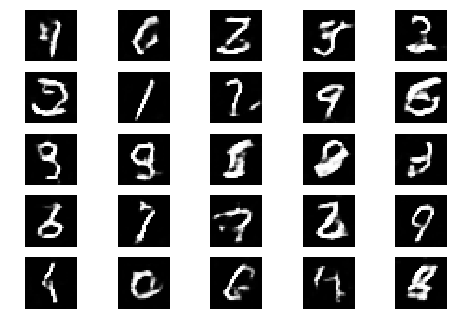

Epoch 0 Batch 304/937 [D loss: 0.794351, acc.: 56.25%] [G loss: 0.021858]
Epoch 0 Batch 305/937 [D loss: 0.831684, acc.: 53.12%] [G loss: 0.017502]
Epoch 0 Batch 306/937 [D loss: 0.822563, acc.: 37.50%] [G loss: 0.023529]


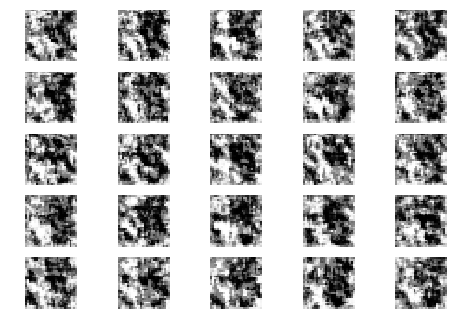

Epoch 0 Batch 307/937 [D loss: 0.768742, acc.: 59.38%] [G loss: 0.016690]
Epoch 0 Batch 308/937 [D loss: 0.660080, acc.: 59.38%] [G loss: 0.016981]
Epoch 0 Batch 309/937 [D loss: 0.794844, acc.: 43.75%] [G loss: 0.014622]
Epoch 0 Batch 310/937 [D loss: 0.682697, acc.: 62.50%] [G loss: 0.016366]
Epoch 0 Batch 311/937 [D loss: 0.788223, acc.: 50.00%] [G loss: 0.015252]
Epoch 0 Batch 312/937 [D loss: 0.764956, acc.: 46.88%] [G loss: 0.013349]
Epoch 0 Batch 313/937 [D loss: 0.608313, acc.: 78.12%] [G loss: 0.015186]
Epoch 0 Batch 314/937 [D loss: 0.750059, acc.: 56.25%] [G loss: 0.014120]
Epoch 0 Batch 315/937 [D loss: 0.901438, acc.: 53.12%] [G loss: 0.015712]
Epoch 0 Batch 316/937 [D loss: 0.798556, acc.: 46.88%] [G loss: 0.014408]
Epoch 0 Batch 317/937 [D loss: 0.790482, acc.: 59.38%] [G loss: 0.016344]
Epoch 0 Batch 318/937 [D loss: 0.783101, acc.: 50.00%] [G loss: 0.013355]
Epoch 0 Batch 319/937 [D loss: 0.679698, acc.: 56.25%] [G loss: 0.015757]
Epoch 0 Batch 320/937 [D loss: 0.82775

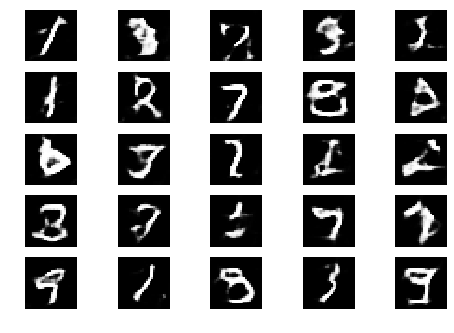

Epoch 0 Batch 401/937 [D loss: 0.755269, acc.: 50.00%] [G loss: 0.020080]
Epoch 0 Batch 402/937 [D loss: 0.669788, acc.: 59.38%] [G loss: 0.018533]
Epoch 0 Batch 403/937 [D loss: 0.724538, acc.: 56.25%] [G loss: 0.012353]
Epoch 0 Batch 404/937 [D loss: 0.677008, acc.: 56.25%] [G loss: 0.012881]


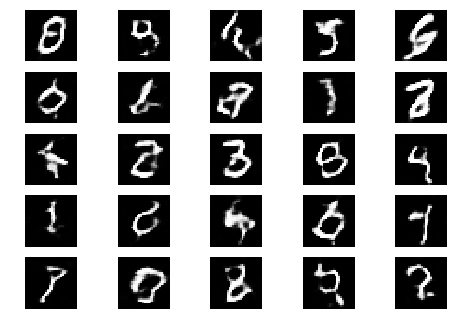

Epoch 0 Batch 405/937 [D loss: 0.765147, acc.: 50.00%] [G loss: 0.013330]
Epoch 0 Batch 406/937 [D loss: 0.842922, acc.: 53.12%] [G loss: 0.011987]
Epoch 0 Batch 407/937 [D loss: 0.724696, acc.: 46.88%] [G loss: 0.008978]
Epoch 0 Batch 408/937 [D loss: 0.786944, acc.: 50.00%] [G loss: 0.010009]


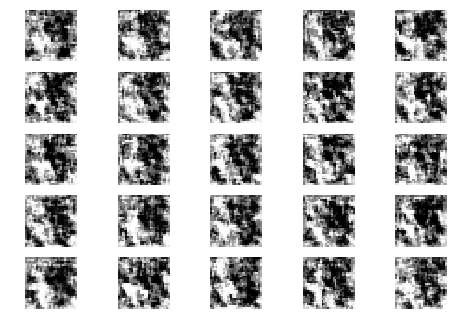

Epoch 0 Batch 409/937 [D loss: 0.826876, acc.: 56.25%] [G loss: 0.011941]
Epoch 0 Batch 410/937 [D loss: 0.759339, acc.: 50.00%] [G loss: 0.010320]
Epoch 0 Batch 411/937 [D loss: 0.761401, acc.: 50.00%] [G loss: 0.011378]
Epoch 0 Batch 412/937 [D loss: 0.699045, acc.: 56.25%] [G loss: 0.009617]
Epoch 0 Batch 413/937 [D loss: 0.609499, acc.: 65.62%] [G loss: 0.014115]
Epoch 0 Batch 414/937 [D loss: 0.686303, acc.: 62.50%] [G loss: 0.012877]
Epoch 0 Batch 415/937 [D loss: 0.619434, acc.: 62.50%] [G loss: 0.010054]
Epoch 0 Batch 416/937 [D loss: 0.654513, acc.: 65.62%] [G loss: 0.012523]
Epoch 0 Batch 417/937 [D loss: 0.964049, acc.: 28.12%] [G loss: 0.009938]
Epoch 0 Batch 418/937 [D loss: 0.526391, acc.: 75.00%] [G loss: 0.007409]
Epoch 0 Batch 419/937 [D loss: 0.598769, acc.: 62.50%] [G loss: 0.008600]
Epoch 0 Batch 420/937 [D loss: 0.685395, acc.: 59.38%] [G loss: 0.009279]
Epoch 0 Batch 421/937 [D loss: 0.775031, acc.: 62.50%] [G loss: 0.007896]
Epoch 0 Batch 422/937 [D loss: 0.65271

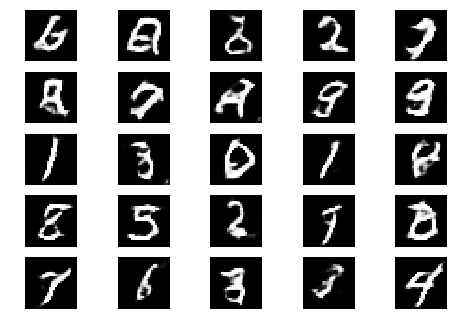

Epoch 0 Batch 501/937 [D loss: 0.898941, acc.: 53.12%] [G loss: 0.003168]
Epoch 0 Batch 502/937 [D loss: 0.628945, acc.: 71.88%] [G loss: 0.003363]
Epoch 0 Batch 503/937 [D loss: 0.829130, acc.: 50.00%] [G loss: 0.003077]
Epoch 0 Batch 504/937 [D loss: 0.644633, acc.: 68.75%] [G loss: 0.002587]
Epoch 0 Batch 505/937 [D loss: 0.923572, acc.: 37.50%] [G loss: 0.003427]


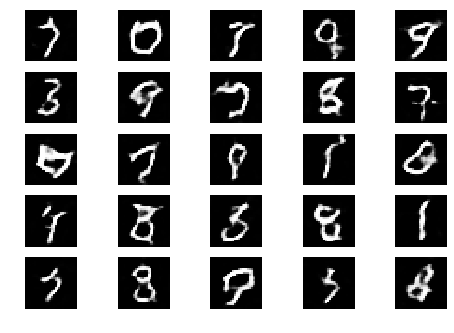

Epoch 0 Batch 506/937 [D loss: 0.769154, acc.: 53.12%] [G loss: 0.004452]
Epoch 0 Batch 507/937 [D loss: 0.742170, acc.: 59.38%] [G loss: 0.004810]
Epoch 0 Batch 508/937 [D loss: 0.638001, acc.: 53.12%] [G loss: 0.003838]
Epoch 0 Batch 509/937 [D loss: 0.780364, acc.: 50.00%] [G loss: 0.005582]
Epoch 0 Batch 510/937 [D loss: 0.688637, acc.: 56.25%] [G loss: 0.005123]


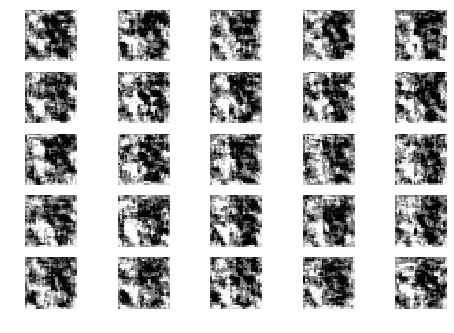

Epoch 0 Batch 511/937 [D loss: 0.796506, acc.: 56.25%] [G loss: 0.005384]
Epoch 0 Batch 512/937 [D loss: 0.651349, acc.: 68.75%] [G loss: 0.004488]
Epoch 0 Batch 513/937 [D loss: 0.861514, acc.: 53.12%] [G loss: 0.005252]
Epoch 0 Batch 514/937 [D loss: 0.564664, acc.: 75.00%] [G loss: 0.003378]
Epoch 0 Batch 515/937 [D loss: 0.692971, acc.: 46.88%] [G loss: 0.003880]
Epoch 0 Batch 516/937 [D loss: 0.765075, acc.: 53.12%] [G loss: 0.004637]
Epoch 0 Batch 517/937 [D loss: 0.553761, acc.: 71.88%] [G loss: 0.004099]
Epoch 0 Batch 518/937 [D loss: 0.669615, acc.: 59.38%] [G loss: 0.004138]
Epoch 0 Batch 519/937 [D loss: 0.628043, acc.: 65.62%] [G loss: 0.003841]
Epoch 0 Batch 520/937 [D loss: 0.780721, acc.: 46.88%] [G loss: 0.004236]
Epoch 0 Batch 521/937 [D loss: 0.699414, acc.: 62.50%] [G loss: 0.003945]
Epoch 0 Batch 522/937 [D loss: 0.684037, acc.: 56.25%] [G loss: 0.005777]
Epoch 0 Batch 523/937 [D loss: 0.678070, acc.: 62.50%] [G loss: 0.006105]
Epoch 0 Batch 524/937 [D loss: 0.73693

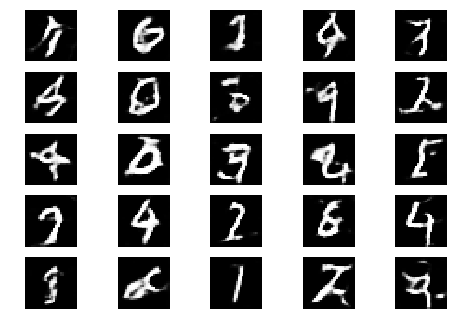

Epoch 0 Batch 601/937 [D loss: 0.902234, acc.: 43.75%] [G loss: 0.001956]
Epoch 0 Batch 602/937 [D loss: 0.862755, acc.: 46.88%] [G loss: 0.002180]
Epoch 0 Batch 603/937 [D loss: 0.692676, acc.: 59.38%] [G loss: 0.002192]
Epoch 0 Batch 604/937 [D loss: 0.681488, acc.: 68.75%] [G loss: 0.001585]
Epoch 0 Batch 605/937 [D loss: 0.701978, acc.: 62.50%] [G loss: 0.002490]
Epoch 0 Batch 606/937 [D loss: 0.600153, acc.: 62.50%] [G loss: 0.001925]


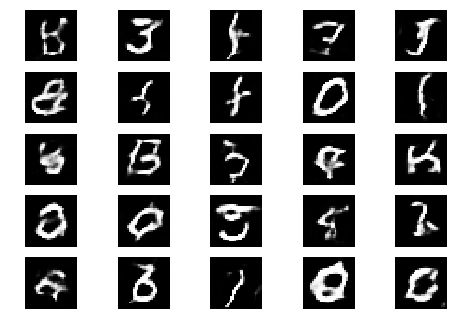

Epoch 0 Batch 607/937 [D loss: 0.610619, acc.: 53.12%] [G loss: 0.002388]
Epoch 0 Batch 608/937 [D loss: 0.453393, acc.: 81.25%] [G loss: 0.001906]
Epoch 0 Batch 609/937 [D loss: 0.780823, acc.: 46.88%] [G loss: 0.001606]
Epoch 0 Batch 610/937 [D loss: 0.736440, acc.: 65.62%] [G loss: 0.002235]
Epoch 0 Batch 611/937 [D loss: 0.713736, acc.: 59.38%] [G loss: 0.002078]
Epoch 0 Batch 612/937 [D loss: 0.615627, acc.: 71.88%] [G loss: 0.001846]


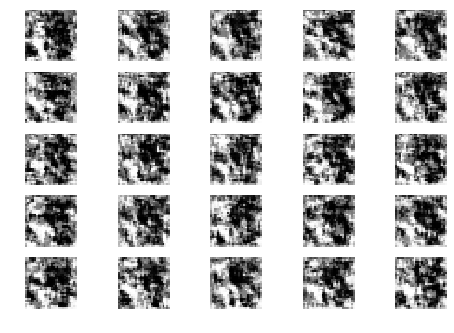

Epoch 0 Batch 613/937 [D loss: 0.840540, acc.: 40.62%] [G loss: 0.002501]
Epoch 0 Batch 614/937 [D loss: 0.703375, acc.: 68.75%] [G loss: 0.002012]
Epoch 0 Batch 615/937 [D loss: 0.739654, acc.: 56.25%] [G loss: 0.001797]
Epoch 0 Batch 616/937 [D loss: 0.919613, acc.: 43.75%] [G loss: 0.001996]
Epoch 0 Batch 617/937 [D loss: 0.931075, acc.: 43.75%] [G loss: 0.001539]
Epoch 0 Batch 618/937 [D loss: 0.847820, acc.: 43.75%] [G loss: 0.002062]
Epoch 0 Batch 619/937 [D loss: 0.535907, acc.: 71.88%] [G loss: 0.002706]
Epoch 0 Batch 620/937 [D loss: 0.576991, acc.: 75.00%] [G loss: 0.001926]
Epoch 0 Batch 621/937 [D loss: 0.885228, acc.: 37.50%] [G loss: 0.001512]
Epoch 0 Batch 622/937 [D loss: 0.677229, acc.: 53.12%] [G loss: 0.001581]
Epoch 0 Batch 623/937 [D loss: 0.751363, acc.: 65.62%] [G loss: 0.002170]
Epoch 0 Batch 624/937 [D loss: 0.657860, acc.: 62.50%] [G loss: 0.001969]
Epoch 0 Batch 625/937 [D loss: 0.688005, acc.: 53.12%] [G loss: 0.002182]
Epoch 0 Batch 626/937 [D loss: 0.53553

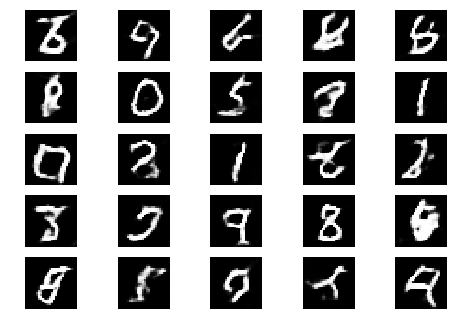

Epoch 0 Batch 701/937 [D loss: 0.871957, acc.: 40.62%] [G loss: 0.002990]
Epoch 0 Batch 702/937 [D loss: 0.871437, acc.: 34.38%] [G loss: 0.002851]
Epoch 0 Batch 703/937 [D loss: 0.627422, acc.: 59.38%] [G loss: 0.002192]
Epoch 0 Batch 704/937 [D loss: 1.084067, acc.: 28.12%] [G loss: 0.002415]
Epoch 0 Batch 705/937 [D loss: 0.671139, acc.: 50.00%] [G loss: 0.001857]
Epoch 0 Batch 706/937 [D loss: 0.699470, acc.: 68.75%] [G loss: 0.003007]
Epoch 0 Batch 707/937 [D loss: 0.624081, acc.: 71.88%] [G loss: 0.001993]


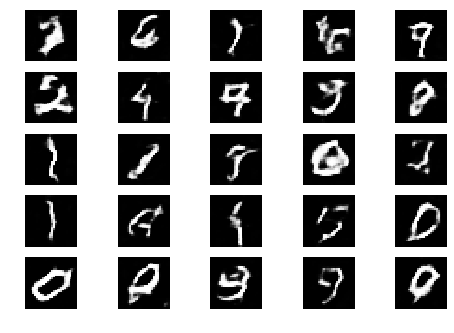

Epoch 0 Batch 708/937 [D loss: 0.719275, acc.: 59.38%] [G loss: 0.002059]
Epoch 0 Batch 709/937 [D loss: 0.471564, acc.: 78.12%] [G loss: 0.001814]
Epoch 0 Batch 710/937 [D loss: 0.681632, acc.: 56.25%] [G loss: 0.002825]
Epoch 0 Batch 711/937 [D loss: 0.520396, acc.: 75.00%] [G loss: 0.002085]
Epoch 0 Batch 712/937 [D loss: 0.850672, acc.: 43.75%] [G loss: 0.002168]
Epoch 0 Batch 713/937 [D loss: 0.736659, acc.: 59.38%] [G loss: 0.002370]
Epoch 0 Batch 714/937 [D loss: 0.657066, acc.: 62.50%] [G loss: 0.002191]


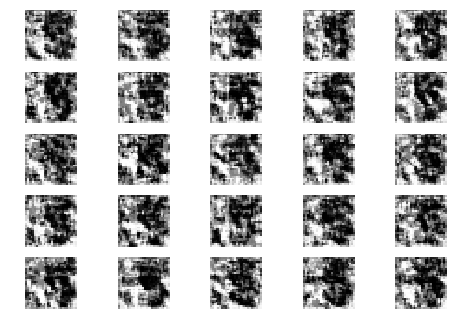

Epoch 0 Batch 715/937 [D loss: 0.736876, acc.: 53.12%] [G loss: 0.002255]
Epoch 0 Batch 716/937 [D loss: 0.780284, acc.: 40.62%] [G loss: 0.001453]
Epoch 0 Batch 717/937 [D loss: 0.631165, acc.: 62.50%] [G loss: 0.002595]
Epoch 0 Batch 718/937 [D loss: 0.600361, acc.: 59.38%] [G loss: 0.002052]
Epoch 0 Batch 719/937 [D loss: 0.985212, acc.: 50.00%] [G loss: 0.002072]
Epoch 0 Batch 720/937 [D loss: 0.804224, acc.: 53.12%] [G loss: 0.002005]
Epoch 0 Batch 721/937 [D loss: 0.808478, acc.: 46.88%] [G loss: 0.002214]
Epoch 0 Batch 722/937 [D loss: 0.823070, acc.: 56.25%] [G loss: 0.002267]
Epoch 0 Batch 723/937 [D loss: 0.637390, acc.: 68.75%] [G loss: 0.001999]
Epoch 0 Batch 724/937 [D loss: 0.431724, acc.: 75.00%] [G loss: 0.001576]
Epoch 0 Batch 725/937 [D loss: 0.576864, acc.: 68.75%] [G loss: 0.001857]
Epoch 0 Batch 726/937 [D loss: 0.571586, acc.: 71.88%] [G loss: 0.001692]
Epoch 0 Batch 727/937 [D loss: 0.544630, acc.: 71.88%] [G loss: 0.001743]
Epoch 0 Batch 728/937 [D loss: 0.76045

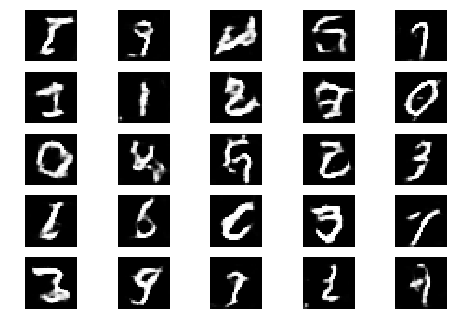

Epoch 0 Batch 801/937 [D loss: 0.651225, acc.: 56.25%] [G loss: 0.000655]
Epoch 0 Batch 802/937 [D loss: 1.003294, acc.: 40.62%] [G loss: 0.000519]
Epoch 0 Batch 803/937 [D loss: 0.571269, acc.: 68.75%] [G loss: 0.000713]
Epoch 0 Batch 804/937 [D loss: 0.698603, acc.: 46.88%] [G loss: 0.000544]
Epoch 0 Batch 805/937 [D loss: 0.795183, acc.: 53.12%] [G loss: 0.000701]
Epoch 0 Batch 806/937 [D loss: 0.460430, acc.: 84.38%] [G loss: 0.000746]
Epoch 0 Batch 807/937 [D loss: 0.641566, acc.: 59.38%] [G loss: 0.000812]
Epoch 0 Batch 808/937 [D loss: 0.647684, acc.: 62.50%] [G loss: 0.000812]


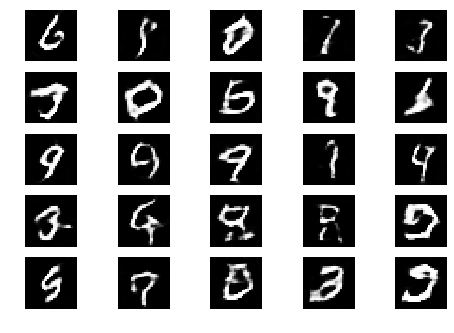

Epoch 0 Batch 809/937 [D loss: 0.711043, acc.: 65.62%] [G loss: 0.000816]
Epoch 0 Batch 810/937 [D loss: 0.678923, acc.: 62.50%] [G loss: 0.000733]
Epoch 0 Batch 811/937 [D loss: 0.697818, acc.: 62.50%] [G loss: 0.000985]
Epoch 0 Batch 812/937 [D loss: 0.696896, acc.: 50.00%] [G loss: 0.000772]
Epoch 0 Batch 813/937 [D loss: 0.776209, acc.: 56.25%] [G loss: 0.000816]
Epoch 0 Batch 814/937 [D loss: 0.566206, acc.: 65.62%] [G loss: 0.000746]
Epoch 0 Batch 815/937 [D loss: 0.433534, acc.: 78.12%] [G loss: 0.000484]
Epoch 0 Batch 816/937 [D loss: 0.875059, acc.: 46.88%] [G loss: 0.000689]


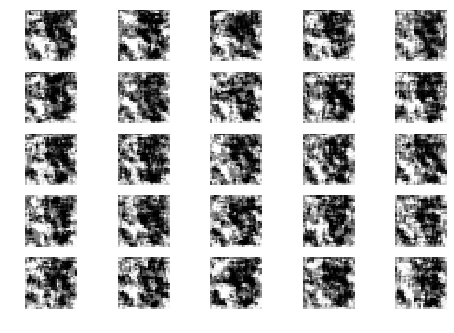

Epoch 0 Batch 817/937 [D loss: 0.562876, acc.: 62.50%] [G loss: 0.000868]
Epoch 0 Batch 818/937 [D loss: 0.769255, acc.: 37.50%] [G loss: 0.000622]
Epoch 0 Batch 819/937 [D loss: 0.697555, acc.: 56.25%] [G loss: 0.000608]
Epoch 0 Batch 820/937 [D loss: 0.701978, acc.: 53.12%] [G loss: 0.000988]
Epoch 0 Batch 821/937 [D loss: 0.506166, acc.: 68.75%] [G loss: 0.001063]
Epoch 0 Batch 822/937 [D loss: 0.574586, acc.: 62.50%] [G loss: 0.000715]
Epoch 0 Batch 823/937 [D loss: 0.751736, acc.: 46.88%] [G loss: 0.000776]
Epoch 0 Batch 824/937 [D loss: 0.551381, acc.: 75.00%] [G loss: 0.000799]
Epoch 0 Batch 825/937 [D loss: 0.498735, acc.: 81.25%] [G loss: 0.000995]
Epoch 0 Batch 826/937 [D loss: 0.620409, acc.: 68.75%] [G loss: 0.000507]
Epoch 0 Batch 827/937 [D loss: 0.657062, acc.: 56.25%] [G loss: 0.001146]
Epoch 0 Batch 828/937 [D loss: 0.637059, acc.: 62.50%] [G loss: 0.000555]
Epoch 0 Batch 829/937 [D loss: 0.859898, acc.: 56.25%] [G loss: 0.000615]
Epoch 0 Batch 830/937 [D loss: 0.80428

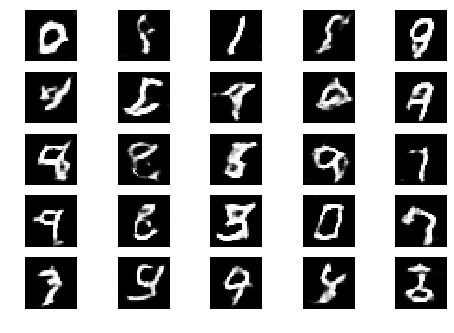

Epoch 0 Batch 901/937 [D loss: 0.357950, acc.: 87.50%] [G loss: 0.000639]
Epoch 0 Batch 902/937 [D loss: 0.711422, acc.: 62.50%] [G loss: 0.000523]
Epoch 0 Batch 903/937 [D loss: 0.555598, acc.: 78.12%] [G loss: 0.000655]
Epoch 0 Batch 904/937 [D loss: 0.438480, acc.: 81.25%] [G loss: 0.000723]
Epoch 0 Batch 905/937 [D loss: 0.792825, acc.: 40.62%] [G loss: 0.000598]
Epoch 0 Batch 906/937 [D loss: 0.558249, acc.: 62.50%] [G loss: 0.000504]
Epoch 0 Batch 907/937 [D loss: 0.594608, acc.: 65.62%] [G loss: 0.000525]
Epoch 0 Batch 908/937 [D loss: 0.432991, acc.: 81.25%] [G loss: 0.000607]
Epoch 0 Batch 909/937 [D loss: 0.386631, acc.: 87.50%] [G loss: 0.000568]


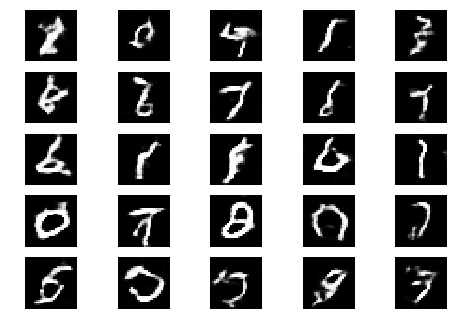

Epoch 0 Batch 910/937 [D loss: 0.757269, acc.: 56.25%] [G loss: 0.000751]
Epoch 0 Batch 911/937 [D loss: 0.750323, acc.: 53.12%] [G loss: 0.000412]
Epoch 0 Batch 912/937 [D loss: 0.625191, acc.: 68.75%] [G loss: 0.000447]
Epoch 0 Batch 913/937 [D loss: 0.742750, acc.: 62.50%] [G loss: 0.000405]
Epoch 0 Batch 914/937 [D loss: 0.439622, acc.: 81.25%] [G loss: 0.000447]
Epoch 0 Batch 915/937 [D loss: 0.640792, acc.: 62.50%] [G loss: 0.000545]
Epoch 0 Batch 916/937 [D loss: 0.743810, acc.: 46.88%] [G loss: 0.000637]
Epoch 0 Batch 917/937 [D loss: 0.532044, acc.: 75.00%] [G loss: 0.000364]
Epoch 0 Batch 918/937 [D loss: 0.576228, acc.: 65.62%] [G loss: 0.000798]


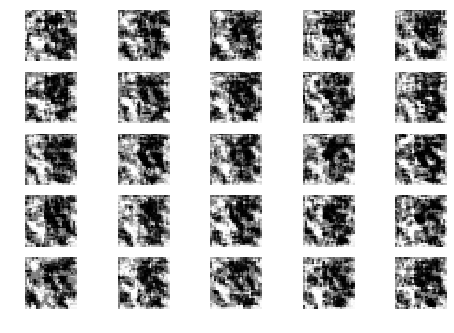

Epoch 0 Batch 919/937 [D loss: 0.601061, acc.: 62.50%] [G loss: 0.000690]
Epoch 0 Batch 920/937 [D loss: 0.572578, acc.: 71.88%] [G loss: 0.000583]
Epoch 0 Batch 921/937 [D loss: 0.871131, acc.: 43.75%] [G loss: 0.000698]
Epoch 0 Batch 922/937 [D loss: 0.511756, acc.: 62.50%] [G loss: 0.000591]
Epoch 0 Batch 923/937 [D loss: 0.579431, acc.: 56.25%] [G loss: 0.000541]
Epoch 0 Batch 924/937 [D loss: 1.049672, acc.: 40.62%] [G loss: 0.000816]
Epoch 0 Batch 925/937 [D loss: 0.615556, acc.: 65.62%] [G loss: 0.000669]
Epoch 0 Batch 926/937 [D loss: 0.641577, acc.: 68.75%] [G loss: 0.001000]
Epoch 0 Batch 927/937 [D loss: 0.517728, acc.: 68.75%] [G loss: 0.000425]
Epoch 0 Batch 928/937 [D loss: 0.465851, acc.: 78.12%] [G loss: 0.000844]
Epoch 0 Batch 929/937 [D loss: 0.466714, acc.: 81.25%] [G loss: 0.000479]
Epoch 0 Batch 930/937 [D loss: 0.583637, acc.: 56.25%] [G loss: 0.000556]
Epoch 0 Batch 931/937 [D loss: 1.024160, acc.: 43.75%] [G loss: 0.000733]
Epoch 0 Batch 932/937 [D loss: 0.40036

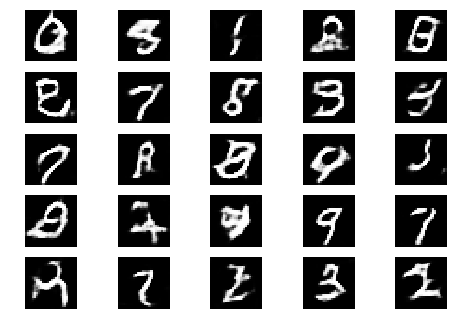

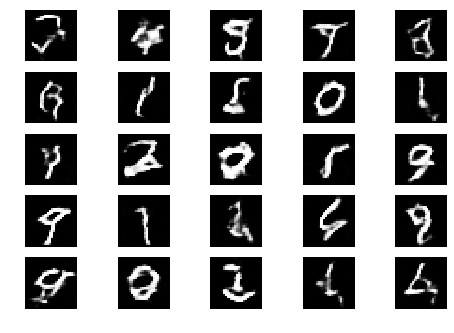

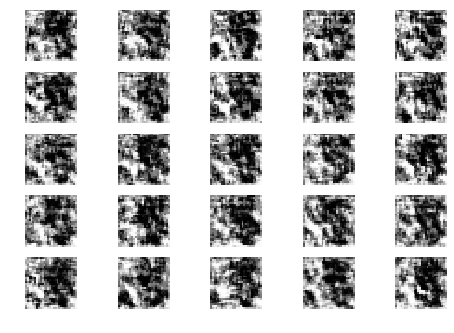

Epoch 1 Batch 1/937 [D loss: 0.491583, acc.: 78.12%] [G loss: 0.000859]
Epoch 1 Batch 2/937 [D loss: 0.584872, acc.: 78.12%] [G loss: 0.001019]
Epoch 1 Batch 3/937 [D loss: 0.640435, acc.: 59.38%] [G loss: 0.000935]
Epoch 1 Batch 4/937 [D loss: 0.406942, acc.: 84.38%] [G loss: 0.000577]
Epoch 1 Batch 5/937 [D loss: 0.701116, acc.: 53.12%] [G loss: 0.000577]
Epoch 1 Batch 6/937 [D loss: 0.769245, acc.: 59.38%] [G loss: 0.000645]
Epoch 1 Batch 7/937 [D loss: 0.538741, acc.: 68.75%] [G loss: 0.000582]
Epoch 1 Batch 8/937 [D loss: 0.566406, acc.: 65.62%] [G loss: 0.000683]
Epoch 1 Batch 9/937 [D loss: 0.477429, acc.: 81.25%] [G loss: 0.000522]
Epoch 1 Batch 10/937 [D loss: 0.955270, acc.: 43.75%] [G loss: 0.000578]
Epoch 1 Batch 11/937 [D loss: 0.877905, acc.: 34.38%] [G loss: 0.000788]
Epoch 1 Batch 12/937 [D loss: 0.642117, acc.: 68.75%] [G loss: 0.000743]
Epoch 1 Batch 13/937 [D loss: 0.580647, acc.: 75.00%] [G loss: 0.000555]
Epoch 1 Batch 14/937 [D loss: 1.033095, acc.: 28.12%] [G los

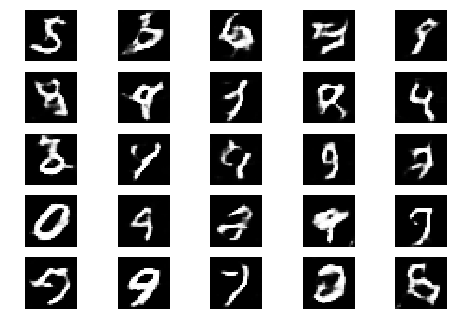

Epoch 1 Batch 101/937 [D loss: 0.482117, acc.: 81.25%] [G loss: 0.000491]


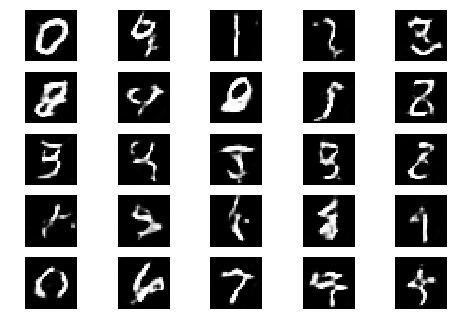

Epoch 1 Batch 102/937 [D loss: 0.693367, acc.: 56.25%] [G loss: 0.000300]


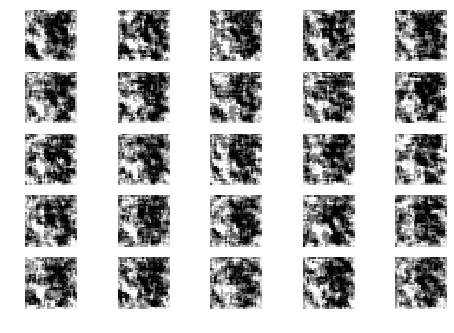

Epoch 1 Batch 103/937 [D loss: 0.263448, acc.: 90.62%] [G loss: 0.000370]
Epoch 1 Batch 104/937 [D loss: 0.536549, acc.: 71.88%] [G loss: 0.000324]
Epoch 1 Batch 105/937 [D loss: 0.408607, acc.: 87.50%] [G loss: 0.000569]
Epoch 1 Batch 106/937 [D loss: 0.789871, acc.: 43.75%] [G loss: 0.000464]
Epoch 1 Batch 107/937 [D loss: 0.613067, acc.: 68.75%] [G loss: 0.000406]
Epoch 1 Batch 108/937 [D loss: 0.520900, acc.: 78.12%] [G loss: 0.000417]
Epoch 1 Batch 109/937 [D loss: 0.781157, acc.: 62.50%] [G loss: 0.000617]
Epoch 1 Batch 110/937 [D loss: 0.511775, acc.: 78.12%] [G loss: 0.000522]
Epoch 1 Batch 111/937 [D loss: 0.401042, acc.: 84.38%] [G loss: 0.000334]
Epoch 1 Batch 112/937 [D loss: 0.557337, acc.: 68.75%] [G loss: 0.000361]
Epoch 1 Batch 113/937 [D loss: 0.954768, acc.: 46.88%] [G loss: 0.000408]
Epoch 1 Batch 114/937 [D loss: 0.363527, acc.: 78.12%] [G loss: 0.000491]
Epoch 1 Batch 115/937 [D loss: 0.379239, acc.: 87.50%] [G loss: 0.000418]
Epoch 1 Batch 116/937 [D loss: 1.23614

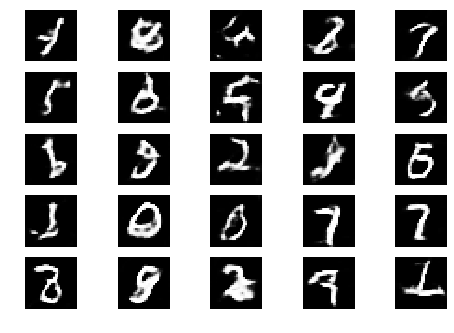

Epoch 1 Batch 201/937 [D loss: 0.436964, acc.: 81.25%] [G loss: 0.000159]
Epoch 1 Batch 202/937 [D loss: 0.451599, acc.: 78.12%] [G loss: 0.000091]


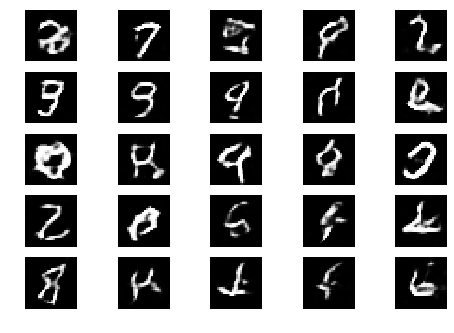

Epoch 1 Batch 203/937 [D loss: 0.402684, acc.: 84.38%] [G loss: 0.000214]
Epoch 1 Batch 204/937 [D loss: 0.585091, acc.: 65.62%] [G loss: 0.000287]


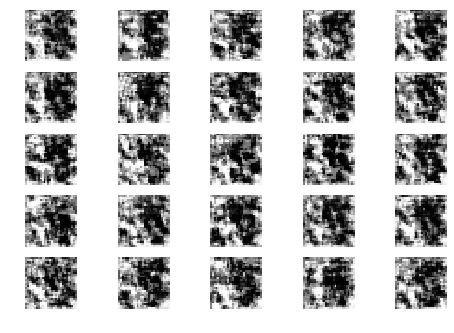

Epoch 1 Batch 205/937 [D loss: 0.318899, acc.: 93.75%] [G loss: 0.000174]
Epoch 1 Batch 206/937 [D loss: 0.456659, acc.: 78.12%] [G loss: 0.000146]
Epoch 1 Batch 207/937 [D loss: 0.791485, acc.: 62.50%] [G loss: 0.000122]
Epoch 1 Batch 208/937 [D loss: 1.287225, acc.: 12.50%] [G loss: 0.000152]
Epoch 1 Batch 209/937 [D loss: 0.661314, acc.: 59.38%] [G loss: 0.000124]
Epoch 1 Batch 210/937 [D loss: 0.650756, acc.: 71.88%] [G loss: 0.000248]
Epoch 1 Batch 211/937 [D loss: 0.577432, acc.: 65.62%] [G loss: 0.000160]
Epoch 1 Batch 212/937 [D loss: 0.272799, acc.: 96.88%] [G loss: 0.000150]
Epoch 1 Batch 213/937 [D loss: 0.614906, acc.: 62.50%] [G loss: 0.000158]
Epoch 1 Batch 214/937 [D loss: 0.661247, acc.: 59.38%] [G loss: 0.000091]
Epoch 1 Batch 215/937 [D loss: 0.602728, acc.: 62.50%] [G loss: 0.000192]
Epoch 1 Batch 216/937 [D loss: 0.575778, acc.: 68.75%] [G loss: 0.000193]
Epoch 1 Batch 217/937 [D loss: 0.262099, acc.: 96.88%] [G loss: 0.000259]
Epoch 1 Batch 218/937 [D loss: 0.52768

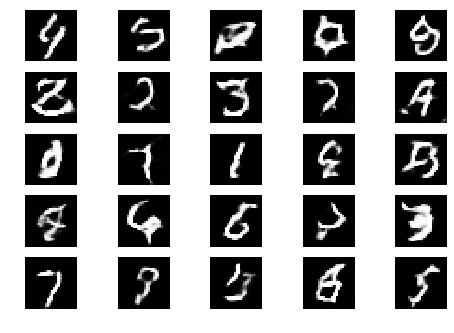

Epoch 1 Batch 301/937 [D loss: 0.654366, acc.: 68.75%] [G loss: 0.000297]
Epoch 1 Batch 302/937 [D loss: 0.601361, acc.: 71.88%] [G loss: 0.000100]
Epoch 1 Batch 303/937 [D loss: 0.320137, acc.: 87.50%] [G loss: 0.000076]


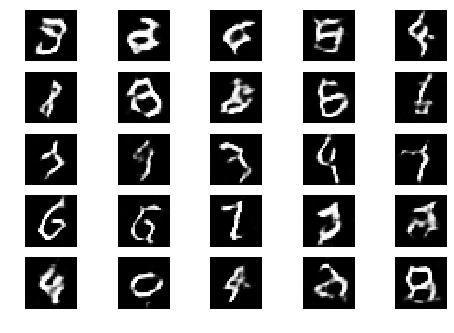

Epoch 1 Batch 304/937 [D loss: 0.539950, acc.: 68.75%] [G loss: 0.000101]
Epoch 1 Batch 305/937 [D loss: 0.829621, acc.: 59.38%] [G loss: 0.000114]
Epoch 1 Batch 306/937 [D loss: 0.579987, acc.: 65.62%] [G loss: 0.000054]


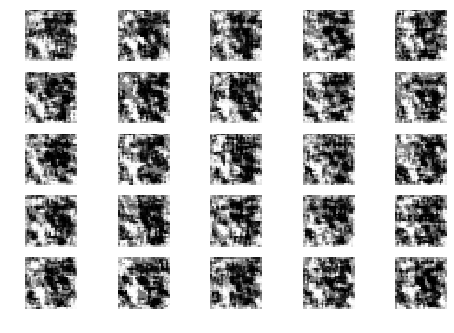

Epoch 1 Batch 307/937 [D loss: 0.681698, acc.: 68.75%] [G loss: 0.000113]
Epoch 1 Batch 308/937 [D loss: 0.349377, acc.: 84.38%] [G loss: 0.000075]
Epoch 1 Batch 309/937 [D loss: 0.525955, acc.: 78.12%] [G loss: 0.000083]
Epoch 1 Batch 310/937 [D loss: 0.298109, acc.: 93.75%] [G loss: 0.000086]
Epoch 1 Batch 311/937 [D loss: 0.588313, acc.: 81.25%] [G loss: 0.000114]
Epoch 1 Batch 312/937 [D loss: 0.487582, acc.: 90.62%] [G loss: 0.000119]
Epoch 1 Batch 313/937 [D loss: 1.053898, acc.: 50.00%] [G loss: 0.000119]
Epoch 1 Batch 314/937 [D loss: 0.882267, acc.: 56.25%] [G loss: 0.000128]
Epoch 1 Batch 315/937 [D loss: 0.553510, acc.: 65.62%] [G loss: 0.000120]
Epoch 1 Batch 316/937 [D loss: 0.431024, acc.: 84.38%] [G loss: 0.000075]
Epoch 1 Batch 317/937 [D loss: 0.330177, acc.: 90.62%] [G loss: 0.000089]
Epoch 1 Batch 318/937 [D loss: 0.411369, acc.: 75.00%] [G loss: 0.000160]
Epoch 1 Batch 319/937 [D loss: 0.608109, acc.: 62.50%] [G loss: 0.000134]
Epoch 1 Batch 320/937 [D loss: 0.19471

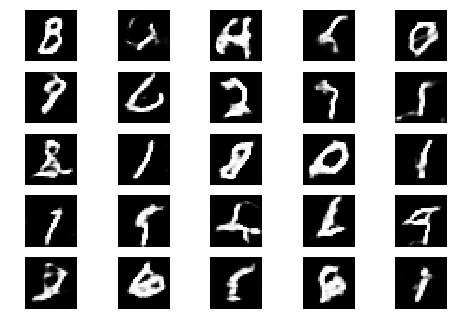

Epoch 1 Batch 401/937 [D loss: 0.765729, acc.: 53.12%] [G loss: 0.000097]
Epoch 1 Batch 402/937 [D loss: 0.605217, acc.: 71.88%] [G loss: 0.000080]
Epoch 1 Batch 403/937 [D loss: 0.603256, acc.: 68.75%] [G loss: 0.000135]
Epoch 1 Batch 404/937 [D loss: 0.475678, acc.: 75.00%] [G loss: 0.000090]


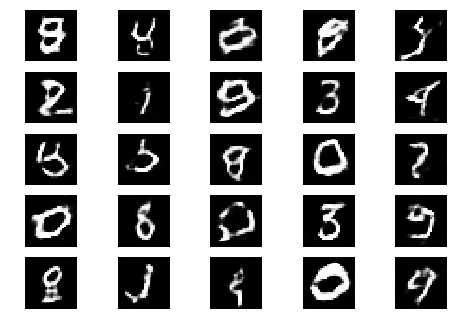

Epoch 1 Batch 405/937 [D loss: 0.545999, acc.: 71.88%] [G loss: 0.000117]
Epoch 1 Batch 406/937 [D loss: 0.330008, acc.: 93.75%] [G loss: 0.000083]
Epoch 1 Batch 407/937 [D loss: 0.332547, acc.: 93.75%] [G loss: 0.000065]
Epoch 1 Batch 408/937 [D loss: 0.199016, acc.: 96.88%] [G loss: 0.000052]


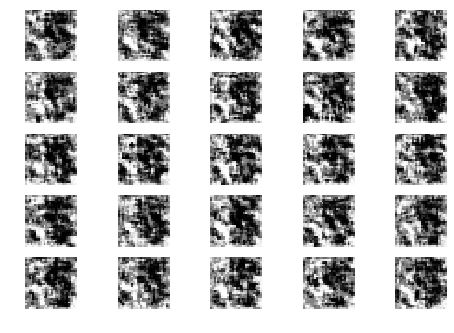

Epoch 1 Batch 409/937 [D loss: 0.398499, acc.: 84.38%] [G loss: 0.000049]
Epoch 1 Batch 410/937 [D loss: 0.807855, acc.: 46.88%] [G loss: 0.000053]
Epoch 1 Batch 411/937 [D loss: 0.783041, acc.: 59.38%] [G loss: 0.000077]
Epoch 1 Batch 412/937 [D loss: 0.566233, acc.: 68.75%] [G loss: 0.000090]
Epoch 1 Batch 413/937 [D loss: 0.458963, acc.: 81.25%] [G loss: 0.000084]
Epoch 1 Batch 414/937 [D loss: 0.664845, acc.: 65.62%] [G loss: 0.000068]
Epoch 1 Batch 415/937 [D loss: 0.729399, acc.: 56.25%] [G loss: 0.000076]
Epoch 1 Batch 416/937 [D loss: 0.490121, acc.: 68.75%] [G loss: 0.000144]
Epoch 1 Batch 417/937 [D loss: 0.476943, acc.: 75.00%] [G loss: 0.000268]
Epoch 1 Batch 418/937 [D loss: 0.455967, acc.: 84.38%] [G loss: 0.000070]
Epoch 1 Batch 419/937 [D loss: 0.888334, acc.: 50.00%] [G loss: 0.000072]
Epoch 1 Batch 420/937 [D loss: 0.404226, acc.: 81.25%] [G loss: 0.000075]
Epoch 1 Batch 421/937 [D loss: 0.963830, acc.: 50.00%] [G loss: 0.000087]
Epoch 1 Batch 422/937 [D loss: 0.61706

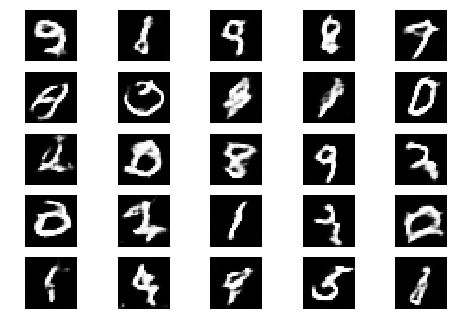

Epoch 1 Batch 501/937 [D loss: 0.513452, acc.: 78.12%] [G loss: 0.000047]
Epoch 1 Batch 502/937 [D loss: 0.377251, acc.: 78.12%] [G loss: 0.000050]
Epoch 1 Batch 503/937 [D loss: 0.436793, acc.: 75.00%] [G loss: 0.000047]
Epoch 1 Batch 504/937 [D loss: 0.307231, acc.: 90.62%] [G loss: 0.000025]
Epoch 1 Batch 505/937 [D loss: 1.087207, acc.: 34.38%] [G loss: 0.000027]


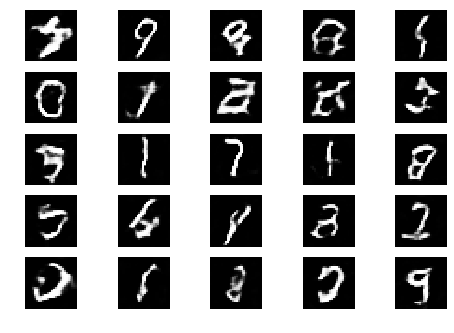

Epoch 1 Batch 506/937 [D loss: 0.740837, acc.: 59.38%] [G loss: 0.000028]
Epoch 1 Batch 507/937 [D loss: 0.383577, acc.: 87.50%] [G loss: 0.000047]
Epoch 1 Batch 508/937 [D loss: 0.275083, acc.: 90.62%] [G loss: 0.000050]
Epoch 1 Batch 509/937 [D loss: 0.622983, acc.: 68.75%] [G loss: 0.000033]
Epoch 1 Batch 510/937 [D loss: 0.333490, acc.: 90.62%] [G loss: 0.000040]


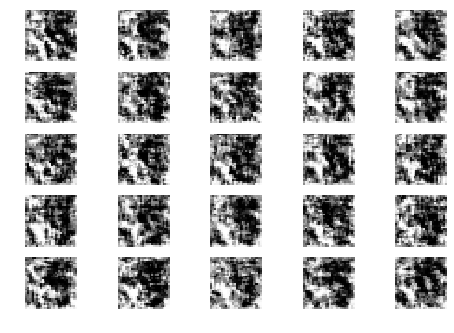

Epoch 1 Batch 511/937 [D loss: 0.771868, acc.: 56.25%] [G loss: 0.000042]
Epoch 1 Batch 512/937 [D loss: 0.319441, acc.: 90.62%] [G loss: 0.000035]
Epoch 1 Batch 513/937 [D loss: 0.315142, acc.: 93.75%] [G loss: 0.000047]
Epoch 1 Batch 514/937 [D loss: 0.364862, acc.: 87.50%] [G loss: 0.000021]
Epoch 1 Batch 515/937 [D loss: 0.626140, acc.: 65.62%] [G loss: 0.000025]
Epoch 1 Batch 516/937 [D loss: 0.379583, acc.: 87.50%] [G loss: 0.000024]
Epoch 1 Batch 517/937 [D loss: 0.500643, acc.: 75.00%] [G loss: 0.000032]
Epoch 1 Batch 518/937 [D loss: 0.534668, acc.: 75.00%] [G loss: 0.000021]
Epoch 1 Batch 519/937 [D loss: 0.499845, acc.: 71.88%] [G loss: 0.000030]
Epoch 1 Batch 520/937 [D loss: 0.655417, acc.: 62.50%] [G loss: 0.000026]
Epoch 1 Batch 521/937 [D loss: 0.597436, acc.: 68.75%] [G loss: 0.000029]
Epoch 1 Batch 522/937 [D loss: 0.416732, acc.: 90.62%] [G loss: 0.000040]
Epoch 1 Batch 523/937 [D loss: 0.569593, acc.: 65.62%] [G loss: 0.000045]
Epoch 1 Batch 524/937 [D loss: 0.84717

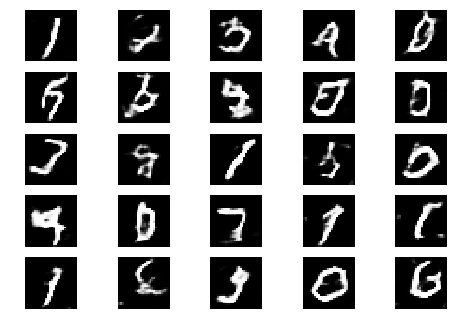

Epoch 1 Batch 601/937 [D loss: 0.112089, acc.: 100.00%] [G loss: 0.000007]
Epoch 1 Batch 602/937 [D loss: 0.211578, acc.: 96.88%] [G loss: 0.000013]
Epoch 1 Batch 603/937 [D loss: 0.562171, acc.: 75.00%] [G loss: 0.000005]
Epoch 1 Batch 604/937 [D loss: 0.926550, acc.: 59.38%] [G loss: 0.000010]
Epoch 1 Batch 605/937 [D loss: 0.483189, acc.: 81.25%] [G loss: 0.000017]
Epoch 1 Batch 606/937 [D loss: 0.595302, acc.: 68.75%] [G loss: 0.000010]


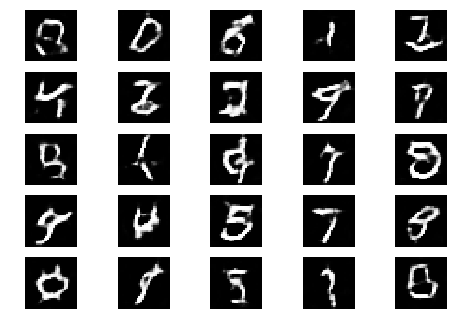

Epoch 1 Batch 607/937 [D loss: 0.786845, acc.: 53.12%] [G loss: 0.000004]
Epoch 1 Batch 608/937 [D loss: 0.261231, acc.: 90.62%] [G loss: 0.000012]
Epoch 1 Batch 609/937 [D loss: 0.228849, acc.: 90.62%] [G loss: 0.000008]
Epoch 1 Batch 610/937 [D loss: 0.581891, acc.: 68.75%] [G loss: 0.000032]
Epoch 1 Batch 611/937 [D loss: 1.129241, acc.: 34.38%] [G loss: 0.000020]
Epoch 1 Batch 612/937 [D loss: 0.133948, acc.: 96.88%] [G loss: 0.000006]


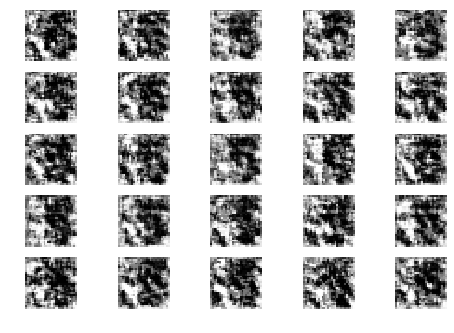

Epoch 1 Batch 613/937 [D loss: 0.430174, acc.: 87.50%] [G loss: 0.000009]
Epoch 1 Batch 614/937 [D loss: 0.241164, acc.: 90.62%] [G loss: 0.000010]
Epoch 1 Batch 615/937 [D loss: 0.830888, acc.: 53.12%] [G loss: 0.000006]
Epoch 1 Batch 616/937 [D loss: 1.160384, acc.: 40.62%] [G loss: 0.000011]
Epoch 1 Batch 617/937 [D loss: 0.163904, acc.: 100.00%] [G loss: 0.000017]
Epoch 1 Batch 618/937 [D loss: 0.213729, acc.: 90.62%] [G loss: 0.000017]
Epoch 1 Batch 619/937 [D loss: 0.314099, acc.: 84.38%] [G loss: 0.000013]
Epoch 1 Batch 620/937 [D loss: 0.503085, acc.: 75.00%] [G loss: 0.000014]
Epoch 1 Batch 621/937 [D loss: 0.243220, acc.: 87.50%] [G loss: 0.000012]
Epoch 1 Batch 622/937 [D loss: 0.405020, acc.: 78.12%] [G loss: 0.000010]
Epoch 1 Batch 623/937 [D loss: 0.871309, acc.: 50.00%] [G loss: 0.000007]
Epoch 1 Batch 624/937 [D loss: 1.335135, acc.: 46.88%] [G loss: 0.000006]
Epoch 1 Batch 625/937 [D loss: 0.333401, acc.: 87.50%] [G loss: 0.000018]
Epoch 1 Batch 626/937 [D loss: 0.3458

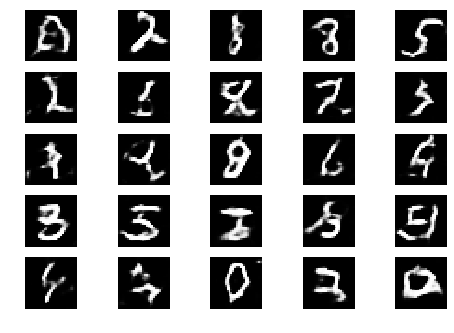

Epoch 1 Batch 701/937 [D loss: 0.368648, acc.: 87.50%] [G loss: 0.000010]
Epoch 1 Batch 702/937 [D loss: 0.965258, acc.: 40.62%] [G loss: 0.000013]
Epoch 1 Batch 703/937 [D loss: 0.201259, acc.: 96.88%] [G loss: 0.000006]
Epoch 1 Batch 704/937 [D loss: 0.474095, acc.: 75.00%] [G loss: 0.000010]
Epoch 1 Batch 705/937 [D loss: 0.138528, acc.: 100.00%] [G loss: 0.000006]
Epoch 1 Batch 706/937 [D loss: 0.273684, acc.: 87.50%] [G loss: 0.000011]
Epoch 1 Batch 707/937 [D loss: 0.228814, acc.: 96.88%] [G loss: 0.000008]


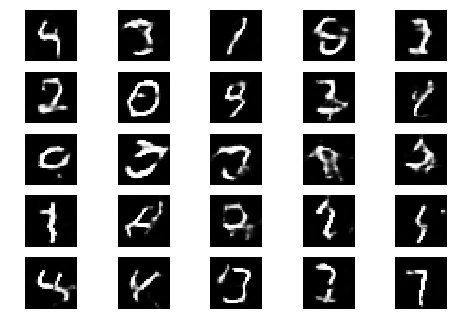

Epoch 1 Batch 708/937 [D loss: 0.133731, acc.: 100.00%] [G loss: 0.000005]
Epoch 1 Batch 709/937 [D loss: 0.238844, acc.: 93.75%] [G loss: 0.000026]
Epoch 1 Batch 710/937 [D loss: 0.146422, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 711/937 [D loss: 0.311538, acc.: 87.50%] [G loss: 0.000003]
Epoch 1 Batch 712/937 [D loss: 0.321134, acc.: 90.62%] [G loss: 0.000004]
Epoch 1 Batch 713/937 [D loss: 0.088247, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 714/937 [D loss: 0.543237, acc.: 62.50%] [G loss: 0.000003]


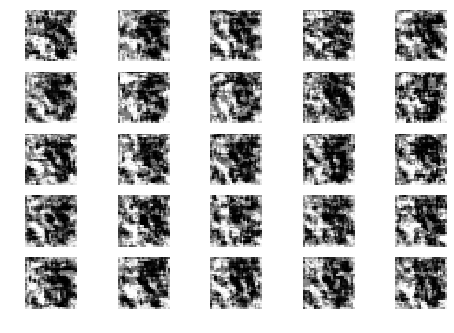

Epoch 1 Batch 715/937 [D loss: 0.665268, acc.: 68.75%] [G loss: 0.000005]
Epoch 1 Batch 716/937 [D loss: 0.055575, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 717/937 [D loss: 0.304491, acc.: 84.38%] [G loss: 0.000003]
Epoch 1 Batch 718/937 [D loss: 1.285763, acc.: 28.12%] [G loss: 0.000005]
Epoch 1 Batch 719/937 [D loss: 0.169383, acc.: 96.88%] [G loss: 0.000005]
Epoch 1 Batch 720/937 [D loss: 0.304115, acc.: 84.38%] [G loss: 0.000004]
Epoch 1 Batch 721/937 [D loss: 0.305781, acc.: 87.50%] [G loss: 0.000004]
Epoch 1 Batch 722/937 [D loss: 0.335760, acc.: 84.38%] [G loss: 0.000003]
Epoch 1 Batch 723/937 [D loss: 0.451886, acc.: 84.38%] [G loss: 0.000004]
Epoch 1 Batch 724/937 [D loss: 0.268631, acc.: 90.62%] [G loss: 0.000020]
Epoch 1 Batch 725/937 [D loss: 0.564062, acc.: 65.62%] [G loss: 0.000010]
Epoch 1 Batch 726/937 [D loss: 0.511814, acc.: 84.38%] [G loss: 0.000008]
Epoch 1 Batch 727/937 [D loss: 0.403660, acc.: 78.12%] [G loss: 0.000004]
Epoch 1 Batch 728/937 [D loss: 0.4673

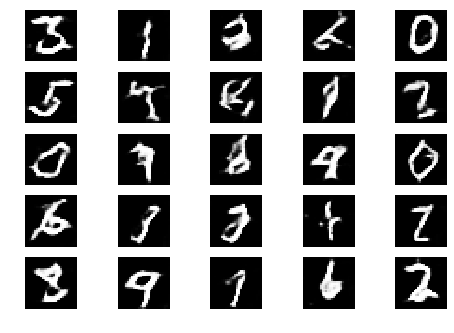

Epoch 1 Batch 801/937 [D loss: 0.318825, acc.: 81.25%] [G loss: 0.000004]
Epoch 1 Batch 802/937 [D loss: 1.662364, acc.: 15.62%] [G loss: 0.000005]
Epoch 1 Batch 803/937 [D loss: 0.190967, acc.: 96.88%] [G loss: 0.000005]
Epoch 1 Batch 804/937 [D loss: 0.383048, acc.: 84.38%] [G loss: 0.000008]
Epoch 1 Batch 805/937 [D loss: 0.399716, acc.: 84.38%] [G loss: 0.000008]
Epoch 1 Batch 806/937 [D loss: 0.336037, acc.: 87.50%] [G loss: 0.000018]
Epoch 1 Batch 807/937 [D loss: 0.162589, acc.: 96.88%] [G loss: 0.000012]
Epoch 1 Batch 808/937 [D loss: 0.394542, acc.: 78.12%] [G loss: 0.000004]


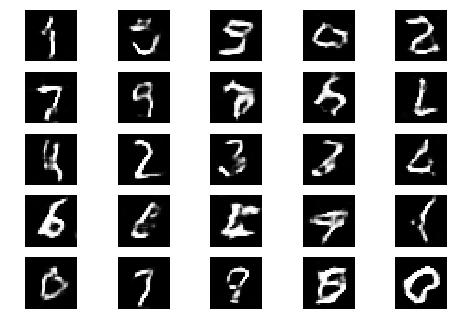

Epoch 1 Batch 809/937 [D loss: 0.205348, acc.: 93.75%] [G loss: 0.000004]
Epoch 1 Batch 810/937 [D loss: 0.577953, acc.: 68.75%] [G loss: 0.000010]
Epoch 1 Batch 811/937 [D loss: 0.615090, acc.: 71.88%] [G loss: 0.000005]
Epoch 1 Batch 812/937 [D loss: 0.389874, acc.: 81.25%] [G loss: 0.000005]
Epoch 1 Batch 813/937 [D loss: 0.301697, acc.: 84.38%] [G loss: 0.000016]
Epoch 1 Batch 814/937 [D loss: 0.477207, acc.: 71.88%] [G loss: 0.000019]
Epoch 1 Batch 815/937 [D loss: 0.471877, acc.: 87.50%] [G loss: 0.000009]
Epoch 1 Batch 816/937 [D loss: 0.681834, acc.: 68.75%] [G loss: 0.000015]


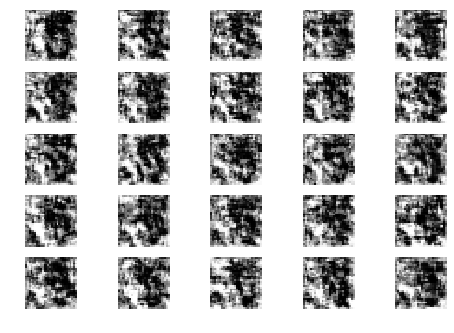

Epoch 1 Batch 817/937 [D loss: 0.306290, acc.: 87.50%] [G loss: 0.000007]
Epoch 1 Batch 818/937 [D loss: 0.336679, acc.: 87.50%] [G loss: 0.000009]
Epoch 1 Batch 819/937 [D loss: 0.625136, acc.: 75.00%] [G loss: 0.000005]
Epoch 1 Batch 820/937 [D loss: 0.258265, acc.: 93.75%] [G loss: 0.000003]
Epoch 1 Batch 821/937 [D loss: 0.251956, acc.: 87.50%] [G loss: 0.000008]
Epoch 1 Batch 822/937 [D loss: 1.450680, acc.: 21.88%] [G loss: 0.000007]
Epoch 1 Batch 823/937 [D loss: 0.409141, acc.: 75.00%] [G loss: 0.000007]
Epoch 1 Batch 824/937 [D loss: 1.420555, acc.: 34.38%] [G loss: 0.000016]
Epoch 1 Batch 825/937 [D loss: 1.042846, acc.: 40.62%] [G loss: 0.000014]
Epoch 1 Batch 826/937 [D loss: 0.656551, acc.: 62.50%] [G loss: 0.000007]
Epoch 1 Batch 827/937 [D loss: 0.714767, acc.: 59.38%] [G loss: 0.000019]
Epoch 1 Batch 828/937 [D loss: 0.435593, acc.: 78.12%] [G loss: 0.000011]
Epoch 1 Batch 829/937 [D loss: 0.625155, acc.: 65.62%] [G loss: 0.000024]
Epoch 1 Batch 830/937 [D loss: 0.33653

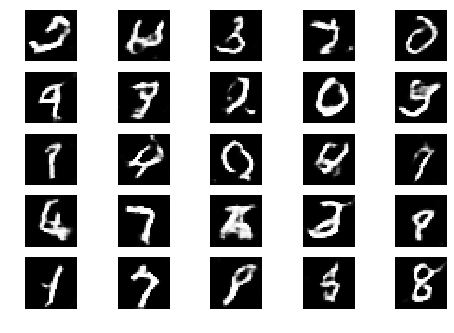

Epoch 1 Batch 901/937 [D loss: 0.232637, acc.: 96.88%] [G loss: 0.000006]
Epoch 1 Batch 902/937 [D loss: 0.124044, acc.: 100.00%] [G loss: 0.000023]
Epoch 1 Batch 903/937 [D loss: 0.084728, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 904/937 [D loss: 1.125364, acc.: 53.12%] [G loss: 0.000004]
Epoch 1 Batch 905/937 [D loss: 0.106060, acc.: 100.00%] [G loss: 0.000008]
Epoch 1 Batch 906/937 [D loss: 0.841778, acc.: 53.12%] [G loss: 0.000010]
Epoch 1 Batch 907/937 [D loss: 0.225992, acc.: 93.75%] [G loss: 0.000001]
Epoch 1 Batch 908/937 [D loss: 0.515824, acc.: 71.88%] [G loss: 0.000002]
Epoch 1 Batch 909/937 [D loss: 0.328049, acc.: 87.50%] [G loss: 0.000003]


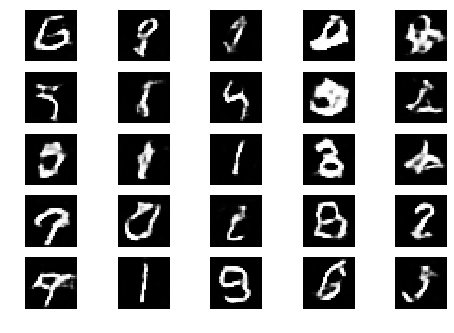

Epoch 1 Batch 910/937 [D loss: 0.562967, acc.: 71.88%] [G loss: 0.000004]
Epoch 1 Batch 911/937 [D loss: 0.179920, acc.: 96.88%] [G loss: 0.000004]
Epoch 1 Batch 912/937 [D loss: 0.256149, acc.: 90.62%] [G loss: 0.000002]
Epoch 1 Batch 913/937 [D loss: 0.038312, acc.: 100.00%] [G loss: 0.000006]
Epoch 1 Batch 914/937 [D loss: 0.250625, acc.: 90.62%] [G loss: 0.000003]
Epoch 1 Batch 915/937 [D loss: 0.482179, acc.: 78.12%] [G loss: 0.000003]
Epoch 1 Batch 916/937 [D loss: 0.062029, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 917/937 [D loss: 0.369659, acc.: 90.62%] [G loss: 0.000008]
Epoch 1 Batch 918/937 [D loss: 0.412966, acc.: 71.88%] [G loss: 0.000009]


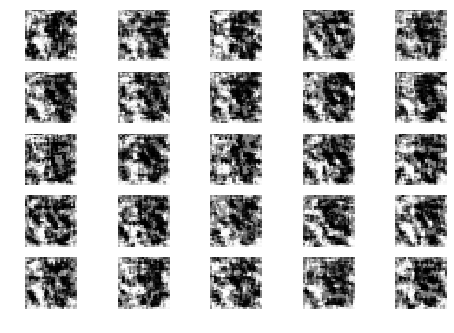

Epoch 1 Batch 919/937 [D loss: 0.537598, acc.: 65.62%] [G loss: 0.000005]
Epoch 1 Batch 920/937 [D loss: 0.543211, acc.: 68.75%] [G loss: 0.000003]
Epoch 1 Batch 921/937 [D loss: 0.348001, acc.: 84.38%] [G loss: 0.000014]
Epoch 1 Batch 922/937 [D loss: 0.224181, acc.: 96.88%] [G loss: 0.000006]
Epoch 1 Batch 923/937 [D loss: 0.592545, acc.: 75.00%] [G loss: 0.000009]
Epoch 1 Batch 924/937 [D loss: 0.124732, acc.: 100.00%] [G loss: 0.000022]
Epoch 1 Batch 925/937 [D loss: 0.292106, acc.: 96.88%] [G loss: 0.000002]
Epoch 1 Batch 926/937 [D loss: 0.802196, acc.: 59.38%] [G loss: 0.000004]
Epoch 1 Batch 927/937 [D loss: 0.685336, acc.: 56.25%] [G loss: 0.000003]
Epoch 1 Batch 928/937 [D loss: 0.390090, acc.: 78.12%] [G loss: 0.000003]
Epoch 1 Batch 929/937 [D loss: 0.130377, acc.: 93.75%] [G loss: 0.000002]
Epoch 1 Batch 930/937 [D loss: 0.633311, acc.: 75.00%] [G loss: 0.000001]
Epoch 1 Batch 931/937 [D loss: 0.269833, acc.: 93.75%] [G loss: 0.000007]
Epoch 1 Batch 932/937 [D loss: 0.5922

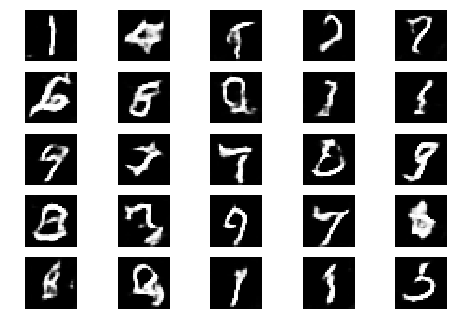

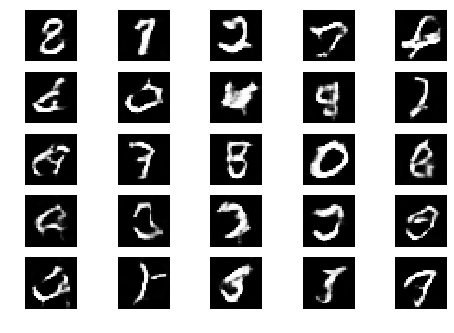

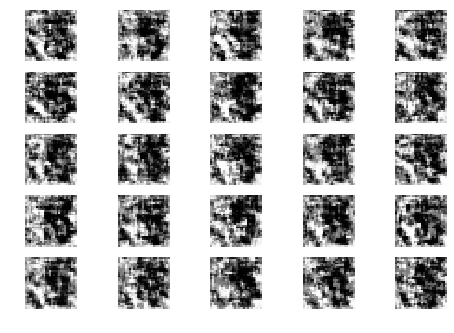

Epoch 2 Batch 1/937 [D loss: 0.062810, acc.: 100.00%] [G loss: 0.000003]
Epoch 2 Batch 2/937 [D loss: 0.171216, acc.: 100.00%] [G loss: 0.000006]
Epoch 2 Batch 3/937 [D loss: 0.180533, acc.: 96.88%] [G loss: 0.000004]
Epoch 2 Batch 4/937 [D loss: 0.509448, acc.: 71.88%] [G loss: 0.000003]
Epoch 2 Batch 5/937 [D loss: 0.996001, acc.: 43.75%] [G loss: 0.000001]
Epoch 2 Batch 6/937 [D loss: 0.428946, acc.: 81.25%] [G loss: 0.000007]
Epoch 2 Batch 7/937 [D loss: 0.126254, acc.: 100.00%] [G loss: 0.000004]
Epoch 2 Batch 8/937 [D loss: 0.576453, acc.: 65.62%] [G loss: 0.000005]
Epoch 2 Batch 9/937 [D loss: 0.781095, acc.: 53.12%] [G loss: 0.000004]
Epoch 2 Batch 10/937 [D loss: 0.282631, acc.: 87.50%] [G loss: 0.000005]
Epoch 2 Batch 11/937 [D loss: 0.209392, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 12/937 [D loss: 0.127325, acc.: 96.88%] [G loss: 0.000009]
Epoch 2 Batch 13/937 [D loss: 0.182396, acc.: 90.62%] [G loss: 0.000003]
Epoch 2 Batch 14/937 [D loss: 0.469990, acc.: 78.12%] [G 

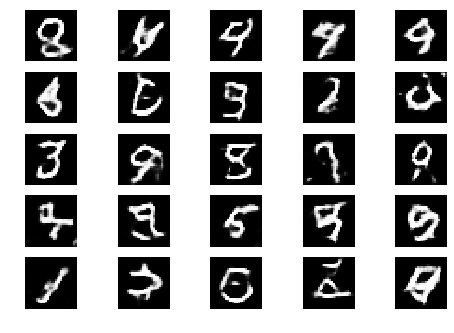

Epoch 2 Batch 101/937 [D loss: 0.308012, acc.: 87.50%] [G loss: 0.000001]


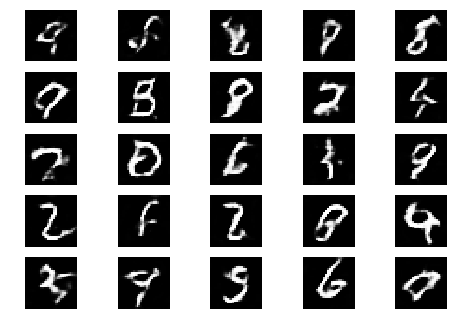

Epoch 2 Batch 102/937 [D loss: 0.465643, acc.: 78.12%] [G loss: 0.000001]


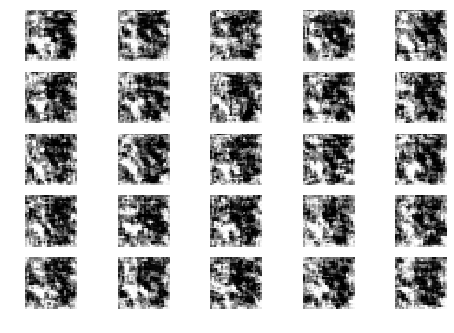

Epoch 2 Batch 103/937 [D loss: 0.495601, acc.: 75.00%] [G loss: 0.000003]
Epoch 2 Batch 104/937 [D loss: 0.497075, acc.: 75.00%] [G loss: 0.000001]
Epoch 2 Batch 105/937 [D loss: 0.228567, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 106/937 [D loss: 0.129514, acc.: 100.00%] [G loss: 0.000004]
Epoch 2 Batch 107/937 [D loss: 0.272556, acc.: 84.38%] [G loss: 0.000001]
Epoch 2 Batch 108/937 [D loss: 0.557855, acc.: 68.75%] [G loss: 0.000001]
Epoch 2 Batch 109/937 [D loss: 0.553005, acc.: 75.00%] [G loss: 0.000002]
Epoch 2 Batch 110/937 [D loss: 0.234403, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 111/937 [D loss: 0.260367, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 112/937 [D loss: 0.223089, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 113/937 [D loss: 0.496511, acc.: 78.12%] [G loss: 0.000000]
Epoch 2 Batch 114/937 [D loss: 0.169408, acc.: 96.88%] [G loss: 0.000002]
Epoch 2 Batch 115/937 [D loss: 0.146999, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 116/937 [D loss: 0.2970

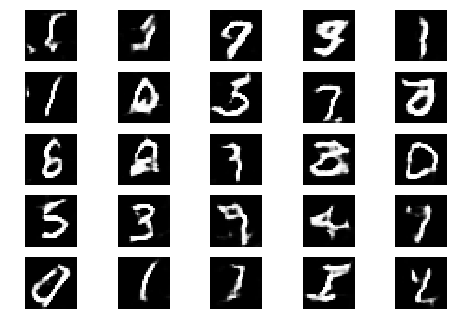

Epoch 2 Batch 201/937 [D loss: 1.206196, acc.: 43.75%] [G loss: 0.000003]
Epoch 2 Batch 202/937 [D loss: 0.216780, acc.: 87.50%] [G loss: 0.000003]


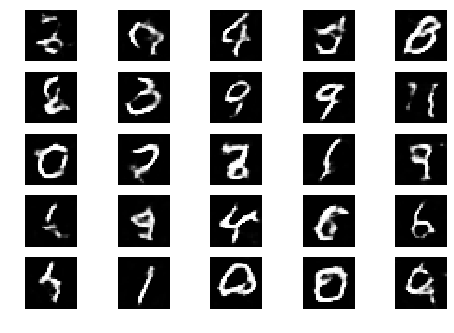

Epoch 2 Batch 203/937 [D loss: 0.574582, acc.: 75.00%] [G loss: 0.000003]
Epoch 2 Batch 204/937 [D loss: 0.261374, acc.: 96.88%] [G loss: 0.000002]


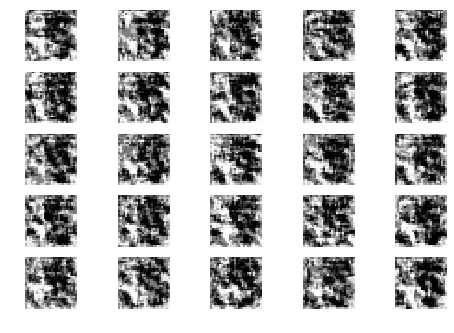

Epoch 2 Batch 205/937 [D loss: 0.740376, acc.: 46.88%] [G loss: 0.000003]
Epoch 2 Batch 206/937 [D loss: 0.490074, acc.: 71.88%] [G loss: 0.000007]
Epoch 2 Batch 207/937 [D loss: 0.900803, acc.: 53.12%] [G loss: 0.000004]
Epoch 2 Batch 208/937 [D loss: 0.501572, acc.: 81.25%] [G loss: 0.000003]
Epoch 2 Batch 209/937 [D loss: 0.218442, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 210/937 [D loss: 0.122258, acc.: 100.00%] [G loss: 0.000005]
Epoch 2 Batch 211/937 [D loss: 0.317110, acc.: 84.38%] [G loss: 0.000001]
Epoch 2 Batch 212/937 [D loss: 0.112639, acc.: 96.88%] [G loss: 0.000003]
Epoch 2 Batch 213/937 [D loss: 0.202902, acc.: 93.75%] [G loss: 0.000003]
Epoch 2 Batch 214/937 [D loss: 0.585017, acc.: 75.00%] [G loss: 0.000003]
Epoch 2 Batch 215/937 [D loss: 0.323403, acc.: 93.75%] [G loss: 0.000002]
Epoch 2 Batch 216/937 [D loss: 0.295339, acc.: 87.50%] [G loss: 0.000002]
Epoch 2 Batch 217/937 [D loss: 0.177824, acc.: 93.75%] [G loss: 0.000002]
Epoch 2 Batch 218/937 [D loss: 0.1560

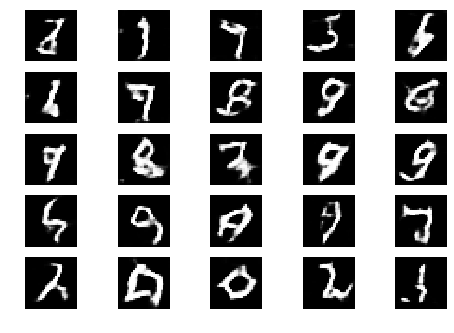

Epoch 2 Batch 301/937 [D loss: 0.275211, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 302/937 [D loss: 0.209583, acc.: 87.50%] [G loss: 0.000001]
Epoch 2 Batch 303/937 [D loss: 0.519493, acc.: 68.75%] [G loss: 0.000001]


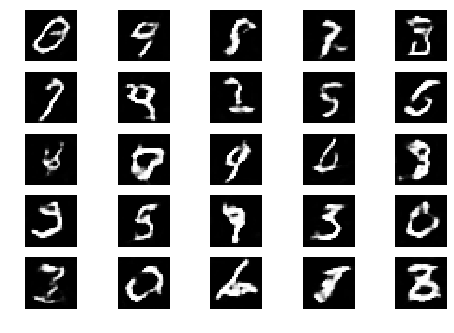

Epoch 2 Batch 304/937 [D loss: 0.094824, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 305/937 [D loss: 0.471134, acc.: 71.88%] [G loss: 0.000001]
Epoch 2 Batch 306/937 [D loss: 0.746786, acc.: 59.38%] [G loss: 0.000001]


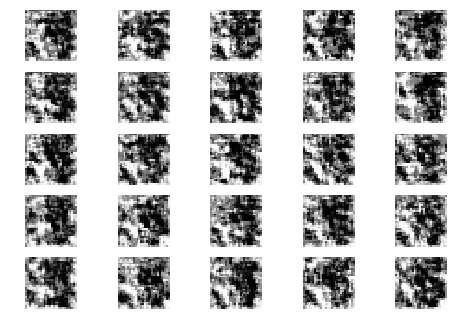

Epoch 2 Batch 307/937 [D loss: 0.143581, acc.: 96.88%] [G loss: 0.000002]
Epoch 2 Batch 308/937 [D loss: 0.169125, acc.: 93.75%] [G loss: 0.000002]
Epoch 2 Batch 309/937 [D loss: 0.494406, acc.: 71.88%] [G loss: 0.000001]
Epoch 2 Batch 310/937 [D loss: 0.382985, acc.: 78.12%] [G loss: 0.000001]
Epoch 2 Batch 311/937 [D loss: 0.172068, acc.: 93.75%] [G loss: 0.000008]
Epoch 2 Batch 312/937 [D loss: 0.202344, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 313/937 [D loss: 0.260204, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 314/937 [D loss: 0.166724, acc.: 100.00%] [G loss: 0.000002]
Epoch 2 Batch 315/937 [D loss: 0.372900, acc.: 84.38%] [G loss: 0.000002]
Epoch 2 Batch 316/937 [D loss: 0.188612, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 317/937 [D loss: 0.423568, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 318/937 [D loss: 0.299859, acc.: 93.75%] [G loss: 0.000004]
Epoch 2 Batch 319/937 [D loss: 0.237626, acc.: 96.88%] [G loss: 0.000002]
Epoch 2 Batch 320/937 [D loss: 0.380

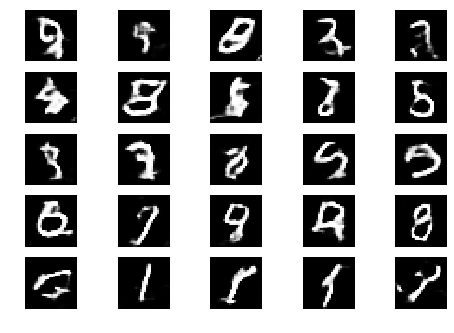

Epoch 2 Batch 401/937 [D loss: 0.650277, acc.: 59.38%] [G loss: 0.000000]
Epoch 2 Batch 402/937 [D loss: 0.011783, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 403/937 [D loss: 0.067751, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 404/937 [D loss: 0.520028, acc.: 71.88%] [G loss: 0.000001]


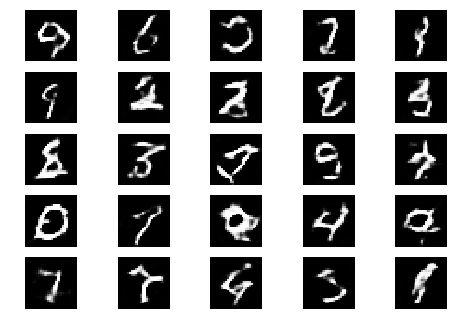

Epoch 2 Batch 405/937 [D loss: 0.199490, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 406/937 [D loss: 0.153471, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 407/937 [D loss: 1.491894, acc.: 53.12%] [G loss: 0.000001]
Epoch 2 Batch 408/937 [D loss: 0.357387, acc.: 71.88%] [G loss: 0.000002]


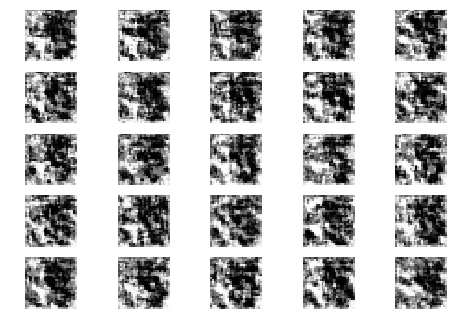

Epoch 2 Batch 409/937 [D loss: 0.576101, acc.: 71.88%] [G loss: 0.000002]
Epoch 2 Batch 410/937 [D loss: 0.673588, acc.: 68.75%] [G loss: 0.000007]
Epoch 2 Batch 411/937 [D loss: 0.194298, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 412/937 [D loss: 0.134431, acc.: 96.88%] [G loss: 0.000002]
Epoch 2 Batch 413/937 [D loss: 0.687733, acc.: 59.38%] [G loss: 0.000000]
Epoch 2 Batch 414/937 [D loss: 0.358050, acc.: 87.50%] [G loss: 0.000002]
Epoch 2 Batch 415/937 [D loss: 0.244671, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 416/937 [D loss: 0.043447, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 417/937 [D loss: 0.767124, acc.: 65.62%] [G loss: 0.000001]
Epoch 2 Batch 418/937 [D loss: 0.548188, acc.: 71.88%] [G loss: 0.000003]
Epoch 2 Batch 419/937 [D loss: 0.062042, acc.: 100.00%] [G loss: 0.000002]
Epoch 2 Batch 420/937 [D loss: 0.028900, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 421/937 [D loss: 0.195595, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 422/937 [D loss: 0.62

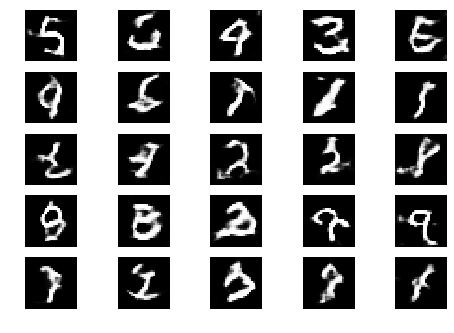

Epoch 2 Batch 501/937 [D loss: 0.410124, acc.: 75.00%] [G loss: 0.000002]
Epoch 2 Batch 502/937 [D loss: 0.304412, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 503/937 [D loss: 0.092049, acc.: 100.00%] [G loss: 0.000006]
Epoch 2 Batch 504/937 [D loss: 0.275868, acc.: 93.75%] [G loss: 0.000002]
Epoch 2 Batch 505/937 [D loss: 0.117855, acc.: 96.88%] [G loss: 0.000001]


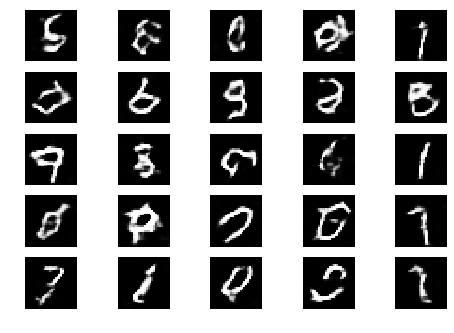

Epoch 2 Batch 506/937 [D loss: 0.064955, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 507/937 [D loss: 0.259302, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 508/937 [D loss: 0.421518, acc.: 75.00%] [G loss: 0.000001]
Epoch 2 Batch 509/937 [D loss: 0.147522, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 510/937 [D loss: 0.036928, acc.: 100.00%] [G loss: 0.000001]


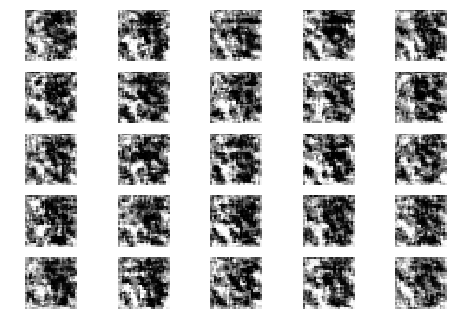

Epoch 2 Batch 511/937 [D loss: 0.593414, acc.: 68.75%] [G loss: 0.000001]
Epoch 2 Batch 512/937 [D loss: 0.152892, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 513/937 [D loss: 0.427367, acc.: 81.25%] [G loss: 0.000002]
Epoch 2 Batch 514/937 [D loss: 0.197242, acc.: 93.75%] [G loss: 0.000003]
Epoch 2 Batch 515/937 [D loss: 0.413546, acc.: 78.12%] [G loss: 0.000001]
Epoch 2 Batch 516/937 [D loss: 0.125639, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 517/937 [D loss: 0.319659, acc.: 78.12%] [G loss: 0.000003]
Epoch 2 Batch 518/937 [D loss: 0.543283, acc.: 65.62%] [G loss: 0.000003]
Epoch 2 Batch 519/937 [D loss: 0.032449, acc.: 100.00%] [G loss: 0.000002]
Epoch 2 Batch 520/937 [D loss: 0.391052, acc.: 75.00%] [G loss: 0.000001]
Epoch 2 Batch 521/937 [D loss: 0.342433, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 522/937 [D loss: 0.434769, acc.: 78.12%] [G loss: 0.000001]
Epoch 2 Batch 523/937 [D loss: 0.226849, acc.: 90.62%] [G loss: 0.000003]
Epoch 2 Batch 524/937 [D loss: 0.127

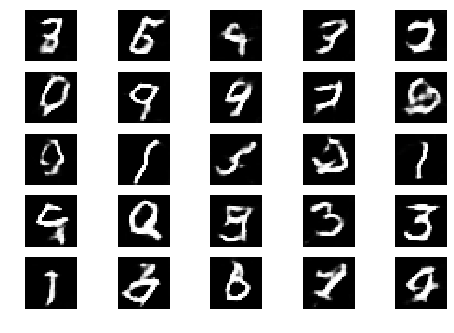

Epoch 2 Batch 601/937 [D loss: 0.254358, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 602/937 [D loss: 0.093078, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 603/937 [D loss: 0.353494, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 604/937 [D loss: 0.388563, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 605/937 [D loss: 0.535930, acc.: 78.12%] [G loss: 0.000001]
Epoch 2 Batch 606/937 [D loss: 0.566219, acc.: 68.75%] [G loss: 0.000000]


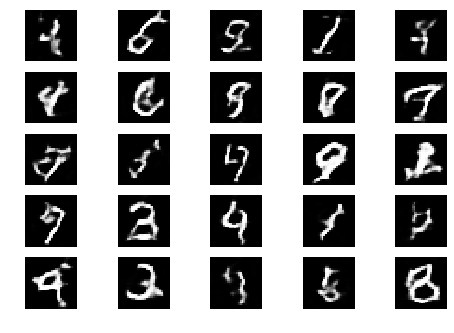

Epoch 2 Batch 607/937 [D loss: 0.712315, acc.: 65.62%] [G loss: 0.000000]
Epoch 2 Batch 608/937 [D loss: 0.109109, acc.: 100.00%] [G loss: 0.000002]
Epoch 2 Batch 609/937 [D loss: 0.276129, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 610/937 [D loss: 0.309299, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 611/937 [D loss: 0.338069, acc.: 84.38%] [G loss: 0.000001]
Epoch 2 Batch 612/937 [D loss: 0.100463, acc.: 96.88%] [G loss: 0.000000]


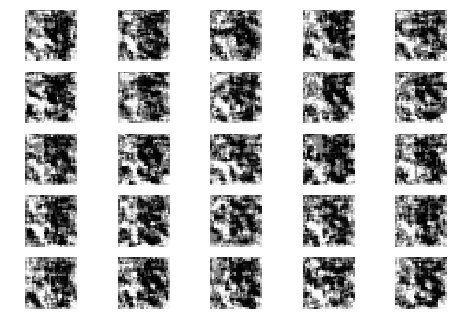

Epoch 2 Batch 613/937 [D loss: 0.134733, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 614/937 [D loss: 0.314380, acc.: 84.38%] [G loss: 0.000001]
Epoch 2 Batch 615/937 [D loss: 0.116088, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 616/937 [D loss: 0.465208, acc.: 65.62%] [G loss: 0.000001]
Epoch 2 Batch 617/937 [D loss: 0.076323, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 618/937 [D loss: 0.054649, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 619/937 [D loss: 0.037976, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 620/937 [D loss: 0.627767, acc.: 81.25%] [G loss: 0.000002]
Epoch 2 Batch 621/937 [D loss: 0.164601, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 622/937 [D loss: 0.209740, acc.: 90.62%] [G loss: 0.000002]
Epoch 2 Batch 623/937 [D loss: 0.043756, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 624/937 [D loss: 0.137306, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 625/937 [D loss: 0.767373, acc.: 53.12%] [G loss: 0.000000]
Epoch 2 Batch 626/937 [D loss: 1.40

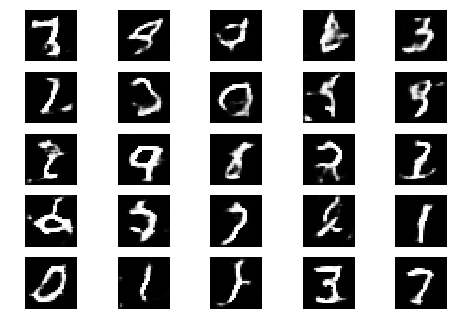

Epoch 2 Batch 701/937 [D loss: 0.177494, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 702/937 [D loss: 0.652540, acc.: 71.88%] [G loss: 0.000002]
Epoch 2 Batch 703/937 [D loss: 0.048142, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 704/937 [D loss: 0.075575, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 705/937 [D loss: 0.078390, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 706/937 [D loss: 0.348310, acc.: 78.12%] [G loss: 0.000000]
Epoch 2 Batch 707/937 [D loss: 0.031439, acc.: 100.00%] [G loss: 0.000001]


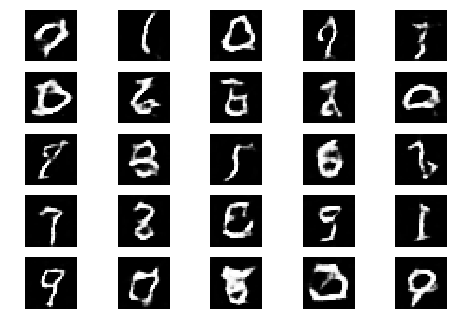

Epoch 2 Batch 708/937 [D loss: 0.329297, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 709/937 [D loss: 0.593942, acc.: 71.88%] [G loss: 0.000001]
Epoch 2 Batch 710/937 [D loss: 0.215445, acc.: 93.75%] [G loss: 0.000002]
Epoch 2 Batch 711/937 [D loss: 0.062763, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 712/937 [D loss: 0.446096, acc.: 78.12%] [G loss: 0.000001]
Epoch 2 Batch 713/937 [D loss: 0.486968, acc.: 71.88%] [G loss: 0.000000]
Epoch 2 Batch 714/937 [D loss: 0.225571, acc.: 90.62%] [G loss: 0.000002]


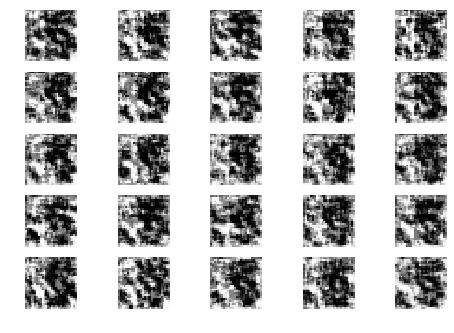

Epoch 2 Batch 715/937 [D loss: 0.310211, acc.: 84.38%] [G loss: 0.000001]
Epoch 2 Batch 716/937 [D loss: 0.053079, acc.: 100.00%] [G loss: 0.000003]
Epoch 2 Batch 717/937 [D loss: 0.400963, acc.: 78.12%] [G loss: 0.000001]
Epoch 2 Batch 718/937 [D loss: 0.094013, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 719/937 [D loss: 0.216574, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 720/937 [D loss: 0.030846, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 721/937 [D loss: 0.043917, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 722/937 [D loss: 0.279902, acc.: 87.50%] [G loss: 0.000001]
Epoch 2 Batch 723/937 [D loss: 0.074825, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 724/937 [D loss: 0.063916, acc.: 100.00%] [G loss: 0.000009]
Epoch 2 Batch 725/937 [D loss: 0.116771, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 726/937 [D loss: 0.043864, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 727/937 [D loss: 0.262024, acc.: 93.75%] [G loss: 0.000003]
Epoch 2 Batch 728/937 [D loss: 0

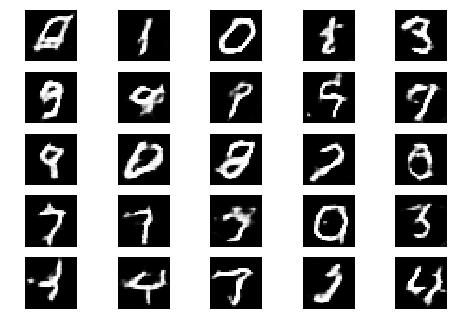

Epoch 2 Batch 801/937 [D loss: 1.560639, acc.: 28.12%] [G loss: 0.000000]
Epoch 2 Batch 802/937 [D loss: 0.049249, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 803/937 [D loss: 0.635913, acc.: 68.75%] [G loss: 0.000001]
Epoch 2 Batch 804/937 [D loss: 0.043124, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 805/937 [D loss: 0.603341, acc.: 65.62%] [G loss: 0.000000]
Epoch 2 Batch 806/937 [D loss: 0.174431, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 807/937 [D loss: 0.046887, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 808/937 [D loss: 0.054154, acc.: 100.00%] [G loss: 0.000000]


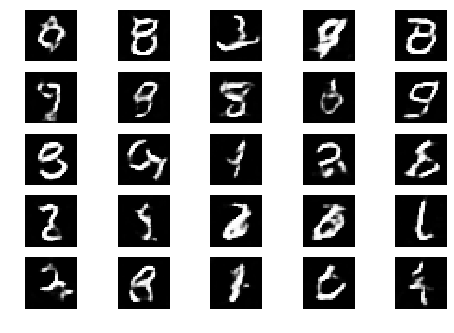

Epoch 2 Batch 809/937 [D loss: 0.084520, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 810/937 [D loss: 0.047595, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 811/937 [D loss: 0.177062, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 812/937 [D loss: 0.046744, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 813/937 [D loss: 0.074405, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 814/937 [D loss: 1.092557, acc.: 40.62%] [G loss: 0.000003]
Epoch 2 Batch 815/937 [D loss: 0.208023, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 816/937 [D loss: 0.771268, acc.: 56.25%] [G loss: 0.000001]


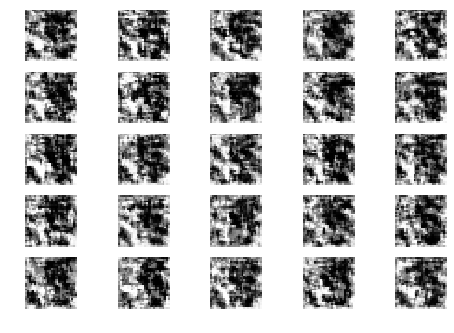

Epoch 2 Batch 817/937 [D loss: 0.160575, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 818/937 [D loss: 0.286762, acc.: 87.50%] [G loss: 0.000001]
Epoch 2 Batch 819/937 [D loss: 0.490544, acc.: 84.38%] [G loss: 0.000000]
Epoch 2 Batch 820/937 [D loss: 0.017494, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 821/937 [D loss: 0.636707, acc.: 75.00%] [G loss: 0.000000]
Epoch 2 Batch 822/937 [D loss: 0.472017, acc.: 81.25%] [G loss: 0.000001]
Epoch 2 Batch 823/937 [D loss: 0.414775, acc.: 84.38%] [G loss: 0.000000]
Epoch 2 Batch 824/937 [D loss: 0.165986, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 825/937 [D loss: 0.237773, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 826/937 [D loss: 0.286243, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 827/937 [D loss: 0.100966, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 828/937 [D loss: 0.168882, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 829/937 [D loss: 0.183002, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 830/937 [D loss: 0.32

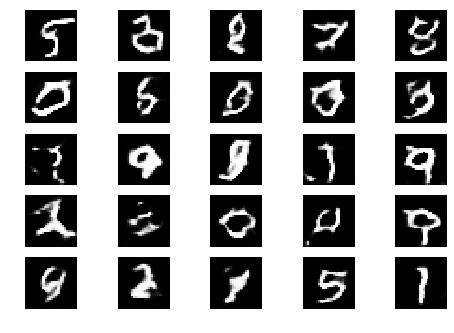

Epoch 2 Batch 901/937 [D loss: 0.117952, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 902/937 [D loss: 0.014742, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 903/937 [D loss: 0.760264, acc.: 59.38%] [G loss: 0.000001]
Epoch 2 Batch 904/937 [D loss: 0.265666, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 905/937 [D loss: 0.480569, acc.: 87.50%] [G loss: 0.000001]
Epoch 2 Batch 906/937 [D loss: 0.144865, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 907/937 [D loss: 0.010521, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 908/937 [D loss: 0.302988, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 909/937 [D loss: 0.031942, acc.: 100.00%] [G loss: 0.000000]


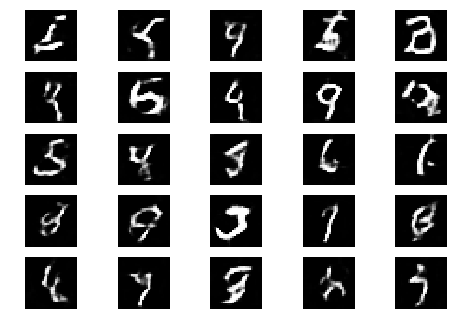

Epoch 2 Batch 910/937 [D loss: 0.615658, acc.: 68.75%] [G loss: 0.000000]
Epoch 2 Batch 911/937 [D loss: 0.154195, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 912/937 [D loss: 0.075257, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 913/937 [D loss: 0.072135, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 914/937 [D loss: 0.104111, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 915/937 [D loss: 0.037340, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 916/937 [D loss: 0.010754, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 917/937 [D loss: 0.091566, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 918/937 [D loss: 0.677534, acc.: 59.38%] [G loss: 0.000000]


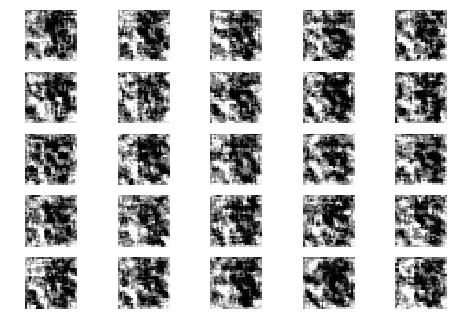

Epoch 2 Batch 919/937 [D loss: 0.125900, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 920/937 [D loss: 0.666603, acc.: 65.62%] [G loss: 0.000000]
Epoch 2 Batch 921/937 [D loss: 0.068945, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 922/937 [D loss: 0.059653, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 923/937 [D loss: 0.336062, acc.: 78.12%] [G loss: 0.000000]
Epoch 2 Batch 924/937 [D loss: 0.061983, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 925/937 [D loss: 0.029359, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 926/937 [D loss: 0.538093, acc.: 75.00%] [G loss: 0.000001]
Epoch 2 Batch 927/937 [D loss: 0.246086, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 928/937 [D loss: 0.078927, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 929/937 [D loss: 0.024401, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 930/937 [D loss: 0.336842, acc.: 87.50%] [G loss: 0.000001]
Epoch 2 Batch 931/937 [D loss: 0.168271, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 932/937 [D loss: 1.

In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1, modeltotrain=1)

Number of examples:  30000.0
Number of Batches:  937
Number of epochs:  2
G1 output numpy array shape
(16, 28, 28, 1)
G1+G2 appended numpy array shape
(16, 28, 28, 1)
Epoch 0 Batch 0/937 [D loss: 2.196767, acc.: 46.88%] [G loss: 0.000002]


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


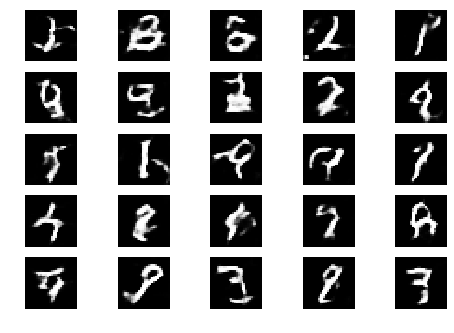

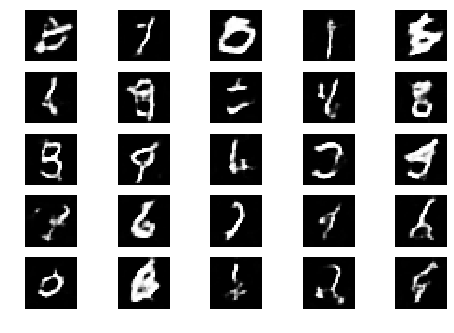

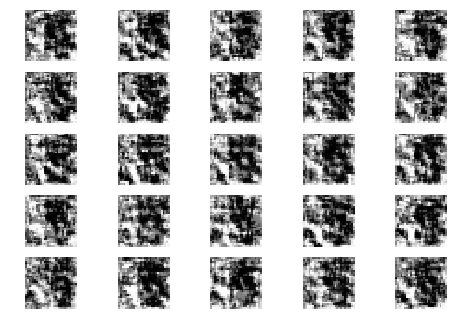

Epoch 0 Batch 1/937 [D loss: 1.423516, acc.: 43.75%] [G loss: 0.000010]
Epoch 0 Batch 2/937 [D loss: 2.379556, acc.: 43.75%] [G loss: 0.000008]
Epoch 0 Batch 3/937 [D loss: 1.818019, acc.: 25.00%] [G loss: 0.000011]
Epoch 0 Batch 4/937 [D loss: 2.402425, acc.: 12.50%] [G loss: 0.000017]
Epoch 0 Batch 5/937 [D loss: 0.834357, acc.: 46.88%] [G loss: 0.000023]
Epoch 0 Batch 6/937 [D loss: 1.111985, acc.: 43.75%] [G loss: 0.000024]
Epoch 0 Batch 7/937 [D loss: 1.028779, acc.: 28.12%] [G loss: 0.000017]
Epoch 0 Batch 8/937 [D loss: 1.507115, acc.: 21.88%] [G loss: 0.000032]
Epoch 0 Batch 9/937 [D loss: 1.069728, acc.: 59.38%] [G loss: 0.000033]
Epoch 0 Batch 10/937 [D loss: 1.342172, acc.: 43.75%] [G loss: 0.000014]
Epoch 0 Batch 11/937 [D loss: 1.456095, acc.: 34.38%] [G loss: 0.000097]
Epoch 0 Batch 12/937 [D loss: 0.752836, acc.: 53.12%] [G loss: 0.000321]
Epoch 0 Batch 13/937 [D loss: 0.767049, acc.: 62.50%] [G loss: 0.000071]
Epoch 0 Batch 14/937 [D loss: 1.114378, acc.: 43.75%] [G los

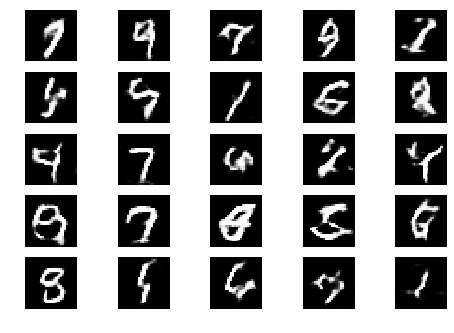

Epoch 0 Batch 101/937 [D loss: 1.082215, acc.: 28.12%] [G loss: 0.000402]


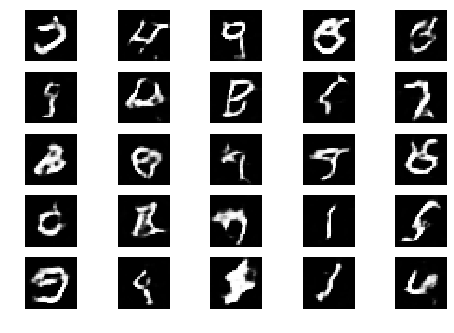

Epoch 0 Batch 102/937 [D loss: 0.522694, acc.: 75.00%] [G loss: 0.000657]


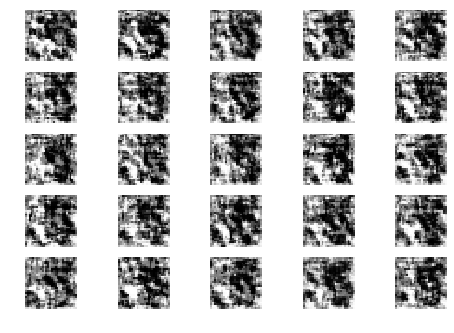

Epoch 0 Batch 103/937 [D loss: 0.389833, acc.: 87.50%] [G loss: 0.000444]
Epoch 0 Batch 104/937 [D loss: 0.463325, acc.: 78.12%] [G loss: 0.000433]
Epoch 0 Batch 105/937 [D loss: 0.352896, acc.: 87.50%] [G loss: 0.000121]
Epoch 0 Batch 106/937 [D loss: 0.250240, acc.: 93.75%] [G loss: 0.000241]
Epoch 0 Batch 107/937 [D loss: 0.709474, acc.: 59.38%] [G loss: 0.000140]
Epoch 0 Batch 108/937 [D loss: 0.337032, acc.: 90.62%] [G loss: 0.001554]
Epoch 0 Batch 109/937 [D loss: 1.062336, acc.: 46.88%] [G loss: 0.000286]
Epoch 0 Batch 110/937 [D loss: 0.491488, acc.: 78.12%] [G loss: 0.000193]
Epoch 0 Batch 111/937 [D loss: 0.117364, acc.: 100.00%] [G loss: 0.000437]
Epoch 0 Batch 112/937 [D loss: 0.644620, acc.: 68.75%] [G loss: 0.000351]
Epoch 0 Batch 113/937 [D loss: 0.426862, acc.: 78.12%] [G loss: 0.000399]
Epoch 0 Batch 114/937 [D loss: 0.166048, acc.: 96.88%] [G loss: 0.000328]
Epoch 0 Batch 115/937 [D loss: 0.688501, acc.: 56.25%] [G loss: 0.000285]
Epoch 0 Batch 116/937 [D loss: 0.3264

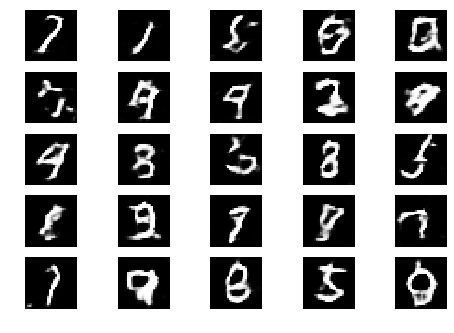

Epoch 0 Batch 201/937 [D loss: 0.188646, acc.: 96.88%] [G loss: 0.000181]
Epoch 0 Batch 202/937 [D loss: 0.223414, acc.: 96.88%] [G loss: 0.000062]


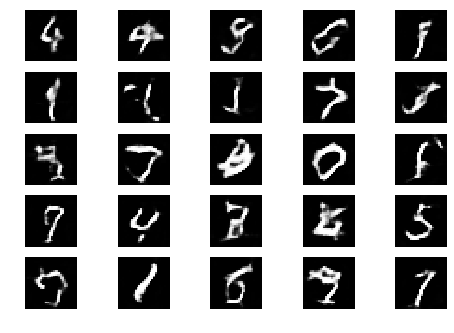

Epoch 0 Batch 203/937 [D loss: 0.716889, acc.: 56.25%] [G loss: 0.000124]
Epoch 0 Batch 204/937 [D loss: 0.272966, acc.: 90.62%] [G loss: 0.000056]


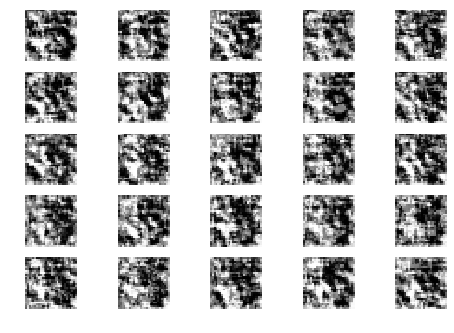

Epoch 0 Batch 205/937 [D loss: 0.568769, acc.: 71.88%] [G loss: 0.000053]
Epoch 0 Batch 206/937 [D loss: 0.922151, acc.: 53.12%] [G loss: 0.000079]
Epoch 0 Batch 207/937 [D loss: 0.293056, acc.: 90.62%] [G loss: 0.000054]
Epoch 0 Batch 208/937 [D loss: 0.275260, acc.: 87.50%] [G loss: 0.000088]
Epoch 0 Batch 209/937 [D loss: 0.340443, acc.: 87.50%] [G loss: 0.000117]
Epoch 0 Batch 210/937 [D loss: 1.090199, acc.: 46.88%] [G loss: 0.000059]
Epoch 0 Batch 211/937 [D loss: 0.469685, acc.: 68.75%] [G loss: 0.000077]
Epoch 0 Batch 212/937 [D loss: 0.470571, acc.: 78.12%] [G loss: 0.000103]
Epoch 0 Batch 213/937 [D loss: 0.192819, acc.: 93.75%] [G loss: 0.000056]
Epoch 0 Batch 214/937 [D loss: 0.221173, acc.: 96.88%] [G loss: 0.000054]
Epoch 0 Batch 215/937 [D loss: 0.308885, acc.: 84.38%] [G loss: 0.000075]
Epoch 0 Batch 216/937 [D loss: 0.291701, acc.: 96.88%] [G loss: 0.000046]
Epoch 0 Batch 217/937 [D loss: 0.833423, acc.: 59.38%] [G loss: 0.000040]
Epoch 0 Batch 218/937 [D loss: 0.21434

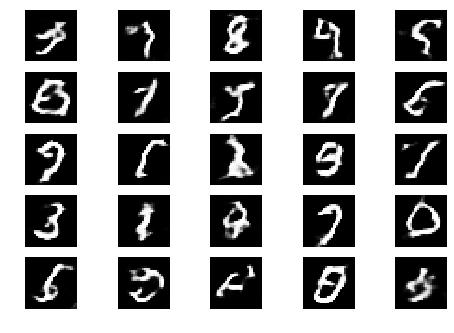

Epoch 0 Batch 301/937 [D loss: 0.122478, acc.: 100.00%] [G loss: 0.000111]
Epoch 0 Batch 302/937 [D loss: 0.153992, acc.: 96.88%] [G loss: 0.000050]
Epoch 0 Batch 303/937 [D loss: 0.391264, acc.: 78.12%] [G loss: 0.000035]


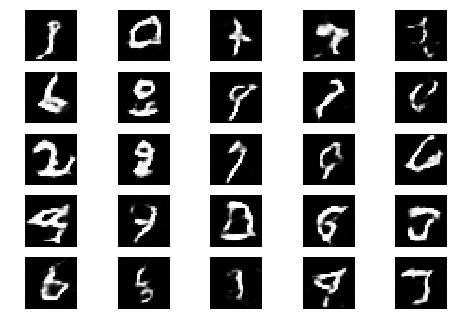

Epoch 0 Batch 304/937 [D loss: 0.941525, acc.: 50.00%] [G loss: 0.000058]
Epoch 0 Batch 305/937 [D loss: 0.358954, acc.: 84.38%] [G loss: 0.000141]
Epoch 0 Batch 306/937 [D loss: 0.488709, acc.: 68.75%] [G loss: 0.000113]


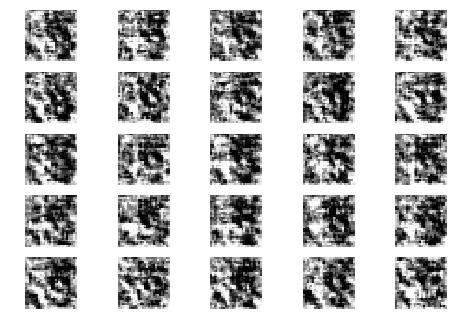

Epoch 0 Batch 307/937 [D loss: 0.396502, acc.: 84.38%] [G loss: 0.000035]
Epoch 0 Batch 308/937 [D loss: 0.470529, acc.: 87.50%] [G loss: 0.000057]
Epoch 0 Batch 309/937 [D loss: 0.325462, acc.: 90.62%] [G loss: 0.000079]
Epoch 0 Batch 310/937 [D loss: 0.984753, acc.: 53.12%] [G loss: 0.000027]
Epoch 0 Batch 311/937 [D loss: 0.357861, acc.: 90.62%] [G loss: 0.000014]
Epoch 0 Batch 312/937 [D loss: 0.834078, acc.: 59.38%] [G loss: 0.000037]
Epoch 0 Batch 313/937 [D loss: 0.288180, acc.: 96.88%] [G loss: 0.000055]
Epoch 0 Batch 314/937 [D loss: 0.126947, acc.: 96.88%] [G loss: 0.000101]
Epoch 0 Batch 315/937 [D loss: 0.766872, acc.: 53.12%] [G loss: 0.000042]
Epoch 0 Batch 316/937 [D loss: 0.851571, acc.: 50.00%] [G loss: 0.000075]
Epoch 0 Batch 317/937 [D loss: 0.102801, acc.: 100.00%] [G loss: 0.000100]
Epoch 0 Batch 318/937 [D loss: 1.029611, acc.: 40.62%] [G loss: 0.000220]
Epoch 0 Batch 319/937 [D loss: 0.083665, acc.: 100.00%] [G loss: 0.000143]
Epoch 0 Batch 320/937 [D loss: 0.566

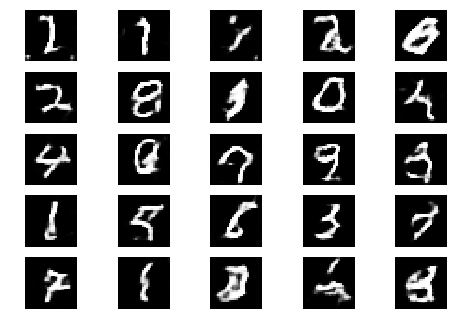

Epoch 0 Batch 401/937 [D loss: 0.382244, acc.: 81.25%] [G loss: 0.000009]
Epoch 0 Batch 402/937 [D loss: 0.330516, acc.: 78.12%] [G loss: 0.000015]
Epoch 0 Batch 403/937 [D loss: 0.307627, acc.: 90.62%] [G loss: 0.000020]
Epoch 0 Batch 404/937 [D loss: 0.225830, acc.: 93.75%] [G loss: 0.000022]


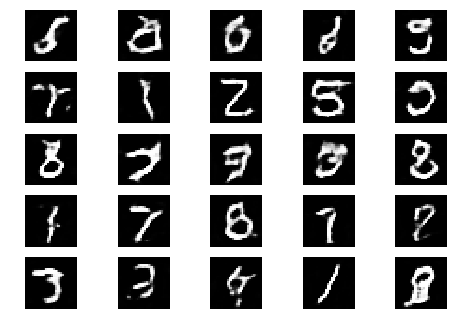

Epoch 0 Batch 405/937 [D loss: 0.087143, acc.: 100.00%] [G loss: 0.000010]
Epoch 0 Batch 406/937 [D loss: 0.394845, acc.: 78.12%] [G loss: 0.000016]
Epoch 0 Batch 407/937 [D loss: 0.078495, acc.: 100.00%] [G loss: 0.000011]
Epoch 0 Batch 408/937 [D loss: 0.878078, acc.: 46.88%] [G loss: 0.000018]


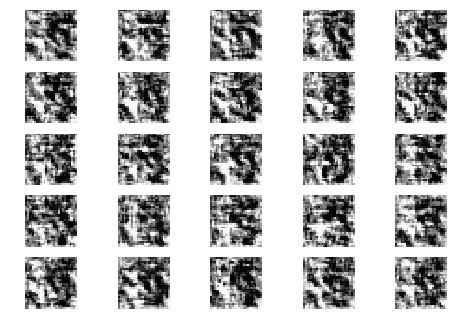

Epoch 0 Batch 409/937 [D loss: 0.512640, acc.: 78.12%] [G loss: 0.000018]
Epoch 0 Batch 410/937 [D loss: 0.103842, acc.: 100.00%] [G loss: 0.000011]
Epoch 0 Batch 411/937 [D loss: 0.208811, acc.: 96.88%] [G loss: 0.000043]
Epoch 0 Batch 412/937 [D loss: 0.634873, acc.: 62.50%] [G loss: 0.000008]
Epoch 0 Batch 413/937 [D loss: 0.546731, acc.: 68.75%] [G loss: 0.000111]
Epoch 0 Batch 414/937 [D loss: 0.119285, acc.: 100.00%] [G loss: 0.000005]
Epoch 0 Batch 415/937 [D loss: 0.066931, acc.: 100.00%] [G loss: 0.000035]
Epoch 0 Batch 416/937 [D loss: 0.486482, acc.: 78.12%] [G loss: 0.000014]
Epoch 0 Batch 417/937 [D loss: 0.276932, acc.: 90.62%] [G loss: 0.000020]
Epoch 0 Batch 418/937 [D loss: 1.319081, acc.: 50.00%] [G loss: 0.000017]
Epoch 0 Batch 419/937 [D loss: 0.558344, acc.: 68.75%] [G loss: 0.000028]
Epoch 0 Batch 420/937 [D loss: 0.438322, acc.: 84.38%] [G loss: 0.000041]
Epoch 0 Batch 421/937 [D loss: 0.224893, acc.: 93.75%] [G loss: 0.000022]
Epoch 0 Batch 422/937 [D loss: 0.15

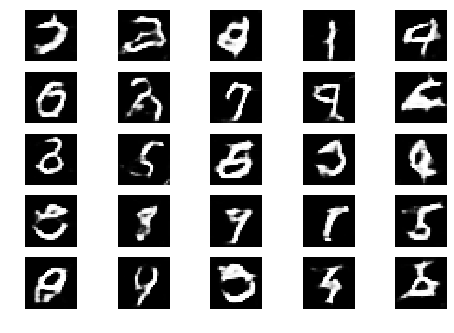

Epoch 0 Batch 501/937 [D loss: 0.173578, acc.: 96.88%] [G loss: 0.000006]
Epoch 0 Batch 502/937 [D loss: 0.293152, acc.: 84.38%] [G loss: 0.000008]
Epoch 0 Batch 503/937 [D loss: 0.639253, acc.: 59.38%] [G loss: 0.000020]
Epoch 0 Batch 504/937 [D loss: 0.078853, acc.: 100.00%] [G loss: 0.000022]
Epoch 0 Batch 505/937 [D loss: 0.195091, acc.: 100.00%] [G loss: 0.000019]


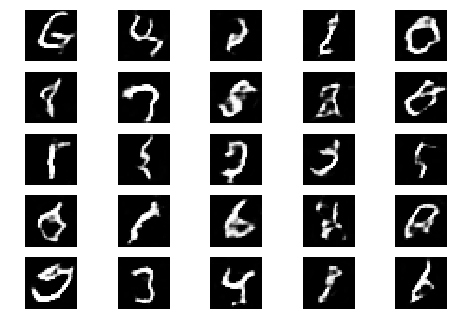

Epoch 0 Batch 506/937 [D loss: 0.560096, acc.: 71.88%] [G loss: 0.000013]
Epoch 0 Batch 507/937 [D loss: 0.284957, acc.: 93.75%] [G loss: 0.000010]
Epoch 0 Batch 508/937 [D loss: 0.339338, acc.: 87.50%] [G loss: 0.000017]
Epoch 0 Batch 509/937 [D loss: 0.598733, acc.: 62.50%] [G loss: 0.000009]
Epoch 0 Batch 510/937 [D loss: 0.746798, acc.: 53.12%] [G loss: 0.000010]


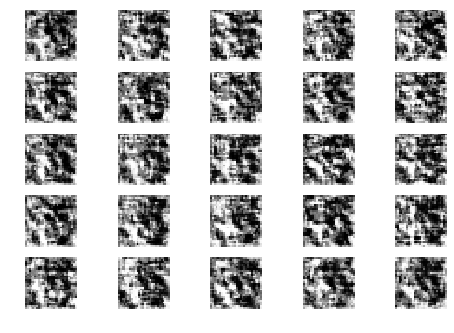

Epoch 0 Batch 511/937 [D loss: 0.514631, acc.: 68.75%] [G loss: 0.000022]
Epoch 0 Batch 512/937 [D loss: 0.387032, acc.: 78.12%] [G loss: 0.000037]
Epoch 0 Batch 513/937 [D loss: 0.738024, acc.: 59.38%] [G loss: 0.000027]
Epoch 0 Batch 514/937 [D loss: 0.115161, acc.: 100.00%] [G loss: 0.000010]
Epoch 0 Batch 515/937 [D loss: 1.457083, acc.: 37.50%] [G loss: 0.000012]
Epoch 0 Batch 516/937 [D loss: 0.223739, acc.: 93.75%] [G loss: 0.000022]
Epoch 0 Batch 517/937 [D loss: 0.178674, acc.: 96.88%] [G loss: 0.000018]
Epoch 0 Batch 518/937 [D loss: 0.555201, acc.: 68.75%] [G loss: 0.000015]
Epoch 0 Batch 519/937 [D loss: 0.201123, acc.: 93.75%] [G loss: 0.000021]
Epoch 0 Batch 520/937 [D loss: 0.126334, acc.: 100.00%] [G loss: 0.000030]
Epoch 0 Batch 521/937 [D loss: 0.151830, acc.: 96.88%] [G loss: 0.000153]
Epoch 0 Batch 522/937 [D loss: 0.273380, acc.: 93.75%] [G loss: 0.000011]
Epoch 0 Batch 523/937 [D loss: 0.245547, acc.: 93.75%] [G loss: 0.000026]
Epoch 0 Batch 524/937 [D loss: 0.130

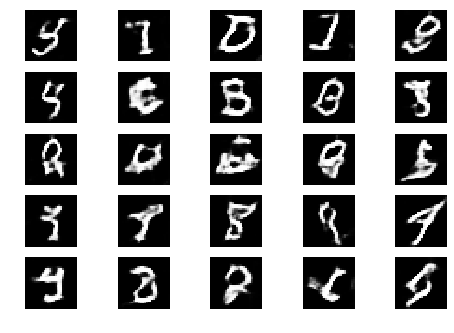

Epoch 0 Batch 601/937 [D loss: 0.183684, acc.: 90.62%] [G loss: 0.000017]
Epoch 0 Batch 602/937 [D loss: 0.165285, acc.: 96.88%] [G loss: 0.000020]
Epoch 0 Batch 603/937 [D loss: 0.343027, acc.: 81.25%] [G loss: 0.000008]
Epoch 0 Batch 604/937 [D loss: 1.137633, acc.: 53.12%] [G loss: 0.000006]
Epoch 0 Batch 605/937 [D loss: 0.149673, acc.: 96.88%] [G loss: 0.000020]
Epoch 0 Batch 606/937 [D loss: 0.079308, acc.: 96.88%] [G loss: 0.000023]


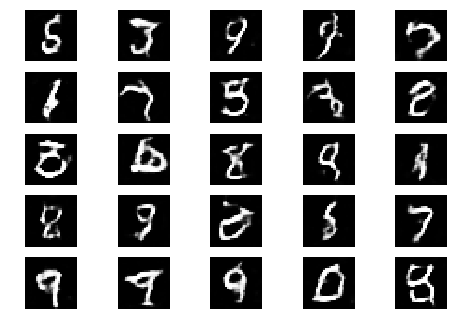

Epoch 0 Batch 607/937 [D loss: 0.135552, acc.: 96.88%] [G loss: 0.000020]
Epoch 0 Batch 608/937 [D loss: 1.169359, acc.: 40.62%] [G loss: 0.000005]
Epoch 0 Batch 609/937 [D loss: 0.098028, acc.: 100.00%] [G loss: 0.000013]
Epoch 0 Batch 610/937 [D loss: 0.085143, acc.: 100.00%] [G loss: 0.000015]
Epoch 0 Batch 611/937 [D loss: 0.090743, acc.: 96.88%] [G loss: 0.000036]
Epoch 0 Batch 612/937 [D loss: 0.849517, acc.: 46.88%] [G loss: 0.000006]


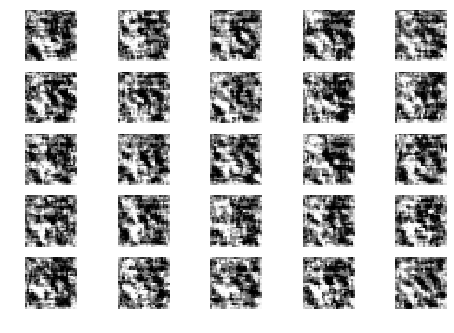

Epoch 0 Batch 613/937 [D loss: 0.211592, acc.: 90.62%] [G loss: 0.000050]
Epoch 0 Batch 614/937 [D loss: 0.282187, acc.: 84.38%] [G loss: 0.000005]
Epoch 0 Batch 615/937 [D loss: 0.652914, acc.: 65.62%] [G loss: 0.000010]
Epoch 0 Batch 616/937 [D loss: 0.139231, acc.: 96.88%] [G loss: 0.000016]
Epoch 0 Batch 617/937 [D loss: 0.075385, acc.: 100.00%] [G loss: 0.000012]
Epoch 0 Batch 618/937 [D loss: 0.020385, acc.: 100.00%] [G loss: 0.000013]
Epoch 0 Batch 619/937 [D loss: 0.173717, acc.: 93.75%] [G loss: 0.000005]
Epoch 0 Batch 620/937 [D loss: 1.002153, acc.: 53.12%] [G loss: 0.000005]
Epoch 0 Batch 621/937 [D loss: 0.055915, acc.: 100.00%] [G loss: 0.000003]
Epoch 0 Batch 622/937 [D loss: 0.201006, acc.: 93.75%] [G loss: 0.000013]
Epoch 0 Batch 623/937 [D loss: 0.275882, acc.: 84.38%] [G loss: 0.000011]
Epoch 0 Batch 624/937 [D loss: 0.176976, acc.: 93.75%] [G loss: 0.000007]
Epoch 0 Batch 625/937 [D loss: 0.007350, acc.: 100.00%] [G loss: 0.000007]
Epoch 0 Batch 626/937 [D loss: 0.1

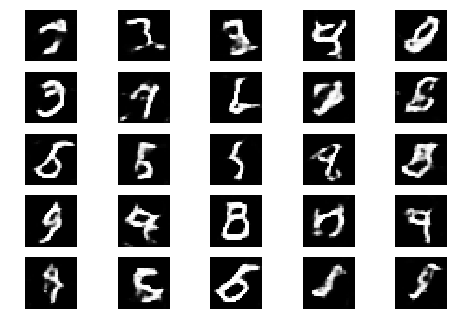

Epoch 0 Batch 701/937 [D loss: 0.238226, acc.: 81.25%] [G loss: 0.000006]
Epoch 0 Batch 702/937 [D loss: 0.831275, acc.: 62.50%] [G loss: 0.000007]
Epoch 0 Batch 703/937 [D loss: 0.442275, acc.: 84.38%] [G loss: 0.000006]
Epoch 0 Batch 704/937 [D loss: 1.153641, acc.: 50.00%] [G loss: 0.000010]
Epoch 0 Batch 705/937 [D loss: 0.035947, acc.: 100.00%] [G loss: 0.000037]
Epoch 0 Batch 706/937 [D loss: 0.121015, acc.: 100.00%] [G loss: 0.000022]
Epoch 0 Batch 707/937 [D loss: 0.859680, acc.: 56.25%] [G loss: 0.000005]


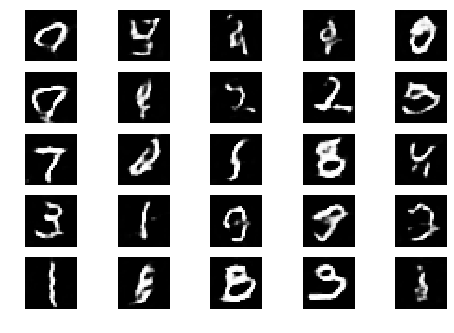

Epoch 0 Batch 708/937 [D loss: 0.100418, acc.: 100.00%] [G loss: 0.000017]
Epoch 0 Batch 709/937 [D loss: 0.059392, acc.: 100.00%] [G loss: 0.000011]
Epoch 0 Batch 710/937 [D loss: 0.067092, acc.: 100.00%] [G loss: 0.000007]
Epoch 0 Batch 711/937 [D loss: 0.074580, acc.: 100.00%] [G loss: 0.000027]
Epoch 0 Batch 712/937 [D loss: 0.355190, acc.: 87.50%] [G loss: 0.000009]
Epoch 0 Batch 713/937 [D loss: 0.159769, acc.: 96.88%] [G loss: 0.000016]
Epoch 0 Batch 714/937 [D loss: 0.665229, acc.: 68.75%] [G loss: 0.000021]


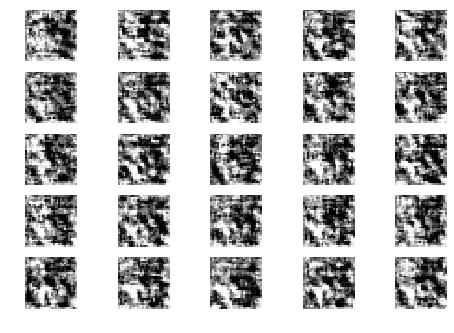

Epoch 0 Batch 715/937 [D loss: 0.227335, acc.: 87.50%] [G loss: 0.000007]
Epoch 0 Batch 716/937 [D loss: 0.056356, acc.: 100.00%] [G loss: 0.000058]
Epoch 0 Batch 717/937 [D loss: 0.268372, acc.: 93.75%] [G loss: 0.000020]
Epoch 0 Batch 718/937 [D loss: 1.146339, acc.: 40.62%] [G loss: 0.000026]
Epoch 0 Batch 719/937 [D loss: 0.488632, acc.: 84.38%] [G loss: 0.000017]
Epoch 0 Batch 720/937 [D loss: 0.108982, acc.: 100.00%] [G loss: 0.000008]
Epoch 0 Batch 721/937 [D loss: 0.217408, acc.: 96.88%] [G loss: 0.000008]
Epoch 0 Batch 722/937 [D loss: 0.628738, acc.: 59.38%] [G loss: 0.000026]
Epoch 0 Batch 723/937 [D loss: 0.136111, acc.: 96.88%] [G loss: 0.000030]
Epoch 0 Batch 724/937 [D loss: 0.129341, acc.: 100.00%] [G loss: 0.000015]
Epoch 0 Batch 725/937 [D loss: 0.052013, acc.: 100.00%] [G loss: 0.000013]
Epoch 0 Batch 726/937 [D loss: 0.485708, acc.: 68.75%] [G loss: 0.000030]
Epoch 0 Batch 727/937 [D loss: 0.419744, acc.: 71.88%] [G loss: 0.000041]
Epoch 0 Batch 728/937 [D loss: 0.2

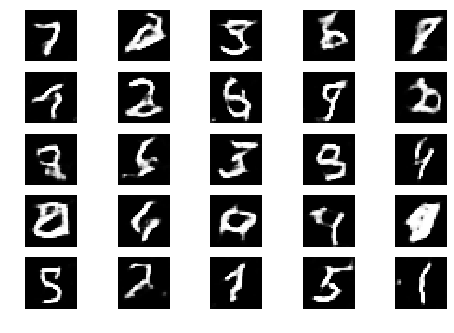

Epoch 0 Batch 801/937 [D loss: 0.323951, acc.: 90.62%] [G loss: 0.000007]
Epoch 0 Batch 802/937 [D loss: 0.259579, acc.: 96.88%] [G loss: 0.000017]
Epoch 0 Batch 803/937 [D loss: 0.269628, acc.: 81.25%] [G loss: 0.000010]
Epoch 0 Batch 804/937 [D loss: 0.093750, acc.: 100.00%] [G loss: 0.000009]
Epoch 0 Batch 805/937 [D loss: 0.029965, acc.: 100.00%] [G loss: 0.000004]
Epoch 0 Batch 806/937 [D loss: 0.261122, acc.: 96.88%] [G loss: 0.000005]
Epoch 0 Batch 807/937 [D loss: 0.248138, acc.: 90.62%] [G loss: 0.000003]
Epoch 0 Batch 808/937 [D loss: 0.010952, acc.: 100.00%] [G loss: 0.000003]


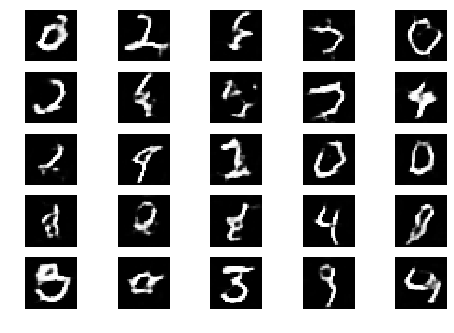

Epoch 0 Batch 809/937 [D loss: 0.524473, acc.: 71.88%] [G loss: 0.000001]
Epoch 0 Batch 810/937 [D loss: 0.218486, acc.: 93.75%] [G loss: 0.000003]
Epoch 0 Batch 811/937 [D loss: 0.790668, acc.: 59.38%] [G loss: 0.000017]
Epoch 0 Batch 812/937 [D loss: 0.437771, acc.: 78.12%] [G loss: 0.000021]
Epoch 0 Batch 813/937 [D loss: 0.189358, acc.: 93.75%] [G loss: 0.000005]
Epoch 0 Batch 814/937 [D loss: 0.564233, acc.: 62.50%] [G loss: 0.000006]
Epoch 0 Batch 815/937 [D loss: 0.018759, acc.: 100.00%] [G loss: 0.000012]
Epoch 0 Batch 816/937 [D loss: 0.150948, acc.: 93.75%] [G loss: 0.000007]


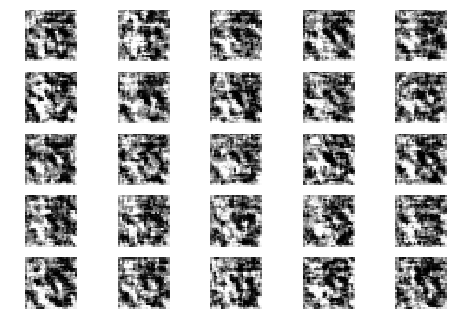

Epoch 0 Batch 817/937 [D loss: 0.997275, acc.: 28.12%] [G loss: 0.000007]
Epoch 0 Batch 818/937 [D loss: 0.318074, acc.: 81.25%] [G loss: 0.000003]
Epoch 0 Batch 819/937 [D loss: 0.186875, acc.: 93.75%] [G loss: 0.000002]
Epoch 0 Batch 820/937 [D loss: 0.058756, acc.: 100.00%] [G loss: 0.000003]
Epoch 0 Batch 821/937 [D loss: 0.692632, acc.: 62.50%] [G loss: 0.000005]
Epoch 0 Batch 822/937 [D loss: 0.427945, acc.: 78.12%] [G loss: 0.000005]
Epoch 0 Batch 823/937 [D loss: 0.072041, acc.: 100.00%] [G loss: 0.000005]
Epoch 0 Batch 824/937 [D loss: 1.227468, acc.: 53.12%] [G loss: 0.000004]
Epoch 0 Batch 825/937 [D loss: 0.235195, acc.: 93.75%] [G loss: 0.000002]
Epoch 0 Batch 826/937 [D loss: 0.440877, acc.: 78.12%] [G loss: 0.000002]
Epoch 0 Batch 827/937 [D loss: 0.112870, acc.: 96.88%] [G loss: 0.000003]
Epoch 0 Batch 828/937 [D loss: 0.065199, acc.: 100.00%] [G loss: 0.000017]
Epoch 0 Batch 829/937 [D loss: 0.114652, acc.: 100.00%] [G loss: 0.000006]
Epoch 0 Batch 830/937 [D loss: 1.4

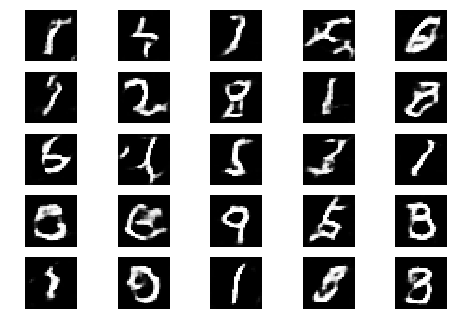

Epoch 0 Batch 901/937 [D loss: 0.059783, acc.: 100.00%] [G loss: 0.000018]
Epoch 0 Batch 902/937 [D loss: 0.022406, acc.: 100.00%] [G loss: 0.000006]
Epoch 0 Batch 903/937 [D loss: 0.680352, acc.: 56.25%] [G loss: 0.000004]
Epoch 0 Batch 904/937 [D loss: 0.208658, acc.: 96.88%] [G loss: 0.000010]
Epoch 0 Batch 905/937 [D loss: 0.220020, acc.: 90.62%] [G loss: 0.000004]
Epoch 0 Batch 906/937 [D loss: 0.109226, acc.: 96.88%] [G loss: 0.000010]
Epoch 0 Batch 907/937 [D loss: 0.063878, acc.: 100.00%] [G loss: 0.000002]
Epoch 0 Batch 908/937 [D loss: 0.208798, acc.: 93.75%] [G loss: 0.000014]
Epoch 0 Batch 909/937 [D loss: 0.101879, acc.: 93.75%] [G loss: 0.000033]


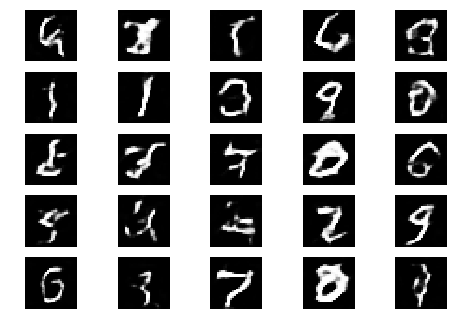

Epoch 0 Batch 910/937 [D loss: 0.149189, acc.: 93.75%] [G loss: 0.000017]
Epoch 0 Batch 911/937 [D loss: 0.698652, acc.: 62.50%] [G loss: 0.000031]
Epoch 0 Batch 912/937 [D loss: 0.570490, acc.: 59.38%] [G loss: 0.000011]
Epoch 0 Batch 913/937 [D loss: 0.404338, acc.: 81.25%] [G loss: 0.000002]
Epoch 0 Batch 914/937 [D loss: 0.086408, acc.: 100.00%] [G loss: 0.000012]
Epoch 0 Batch 915/937 [D loss: 0.451537, acc.: 84.38%] [G loss: 0.000008]
Epoch 0 Batch 916/937 [D loss: 0.091259, acc.: 96.88%] [G loss: 0.000003]
Epoch 0 Batch 917/937 [D loss: 0.058530, acc.: 100.00%] [G loss: 0.000010]
Epoch 0 Batch 918/937 [D loss: 0.536063, acc.: 71.88%] [G loss: 0.000006]


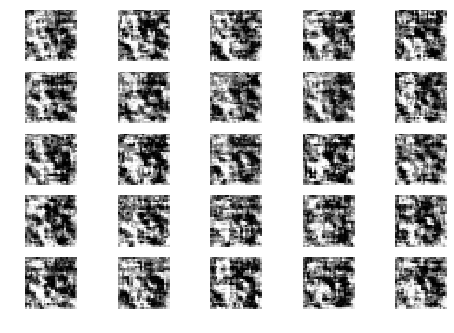

Epoch 0 Batch 919/937 [D loss: 0.027207, acc.: 100.00%] [G loss: 0.000006]
Epoch 0 Batch 920/937 [D loss: 0.059461, acc.: 100.00%] [G loss: 0.000015]
Epoch 0 Batch 921/937 [D loss: 0.064259, acc.: 100.00%] [G loss: 0.000023]
Epoch 0 Batch 922/937 [D loss: 0.513078, acc.: 68.75%] [G loss: 0.000003]
Epoch 0 Batch 923/937 [D loss: 0.182089, acc.: 93.75%] [G loss: 0.000002]
Epoch 0 Batch 924/937 [D loss: 0.036177, acc.: 100.00%] [G loss: 0.000002]
Epoch 0 Batch 925/937 [D loss: 0.946713, acc.: 56.25%] [G loss: 0.000006]
Epoch 0 Batch 926/937 [D loss: 0.039140, acc.: 100.00%] [G loss: 0.000006]
Epoch 0 Batch 927/937 [D loss: 0.788434, acc.: 62.50%] [G loss: 0.000010]
Epoch 0 Batch 928/937 [D loss: 0.085049, acc.: 100.00%] [G loss: 0.000006]
Epoch 0 Batch 929/937 [D loss: 0.073205, acc.: 100.00%] [G loss: 0.000011]
Epoch 0 Batch 930/937 [D loss: 0.214092, acc.: 93.75%] [G loss: 0.000009]
Epoch 0 Batch 931/937 [D loss: 0.120518, acc.: 93.75%] [G loss: 0.000007]
Epoch 0 Batch 932/937 [D loss: 

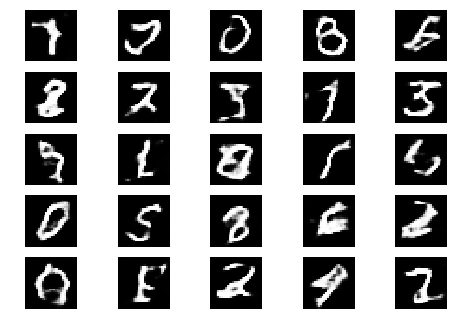

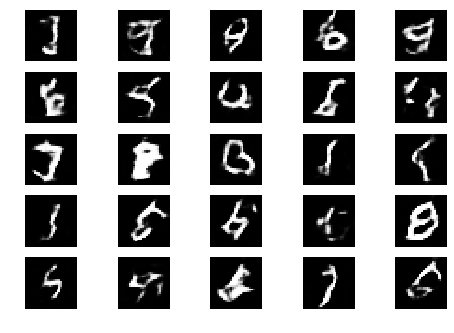

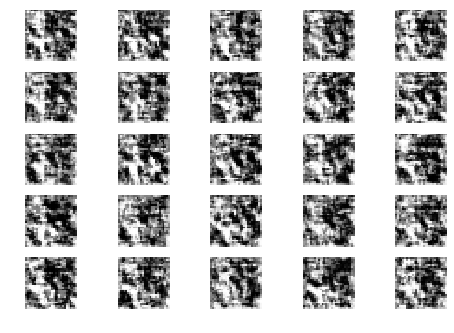

Epoch 1 Batch 1/937 [D loss: 0.050618, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 2/937 [D loss: 0.024119, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 3/937 [D loss: 0.077430, acc.: 96.88%] [G loss: 0.000003]
Epoch 1 Batch 4/937 [D loss: 0.147739, acc.: 96.88%] [G loss: 0.000008]
Epoch 1 Batch 5/937 [D loss: 0.015756, acc.: 100.00%] [G loss: 0.000008]
Epoch 1 Batch 6/937 [D loss: 1.133565, acc.: 53.12%] [G loss: 0.000003]
Epoch 1 Batch 7/937 [D loss: 0.250951, acc.: 87.50%] [G loss: 0.000004]
Epoch 1 Batch 8/937 [D loss: 1.852700, acc.: 50.00%] [G loss: 0.000014]
Epoch 1 Batch 9/937 [D loss: 0.166316, acc.: 100.00%] [G loss: 0.000022]
Epoch 1 Batch 10/937 [D loss: 0.669372, acc.: 68.75%] [G loss: 0.000004]
Epoch 1 Batch 11/937 [D loss: 0.041103, acc.: 100.00%] [G loss: 0.000010]
Epoch 1 Batch 12/937 [D loss: 0.082469, acc.: 100.00%] [G loss: 0.000016]
Epoch 1 Batch 13/937 [D loss: 0.044487, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 14/937 [D loss: 0.011047, acc.: 100.00%

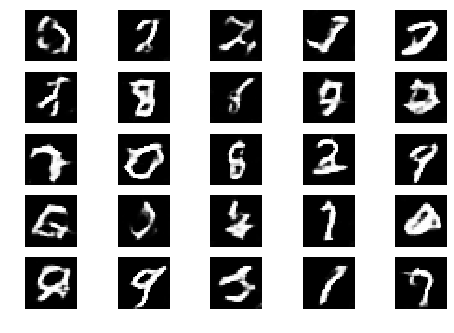

Epoch 1 Batch 101/937 [D loss: 0.206784, acc.: 96.88%] [G loss: 0.000025]


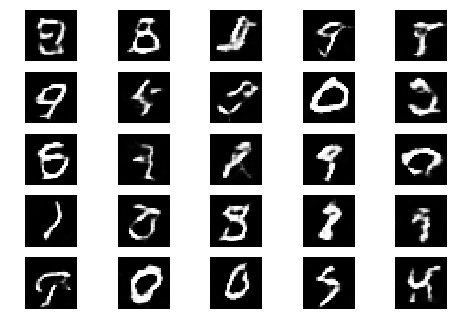

Epoch 1 Batch 102/937 [D loss: 0.096658, acc.: 100.00%] [G loss: 0.000007]


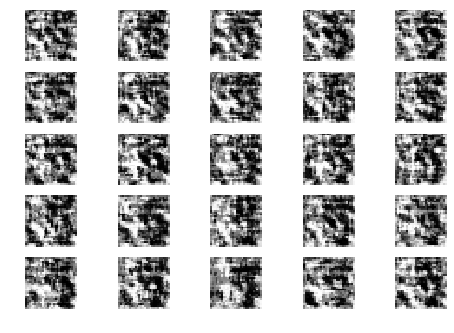

Epoch 1 Batch 103/937 [D loss: 0.621382, acc.: 62.50%] [G loss: 0.000004]
Epoch 1 Batch 104/937 [D loss: 0.172566, acc.: 93.75%] [G loss: 0.000004]
Epoch 1 Batch 105/937 [D loss: 0.086176, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 106/937 [D loss: 0.644750, acc.: 65.62%] [G loss: 0.000104]
Epoch 1 Batch 107/937 [D loss: 0.163474, acc.: 100.00%] [G loss: 0.000018]
Epoch 1 Batch 108/937 [D loss: 0.055156, acc.: 100.00%] [G loss: 0.000018]
Epoch 1 Batch 109/937 [D loss: 0.136393, acc.: 100.00%] [G loss: 0.000020]
Epoch 1 Batch 110/937 [D loss: 0.021336, acc.: 100.00%] [G loss: 0.000008]
Epoch 1 Batch 111/937 [D loss: 0.022005, acc.: 100.00%] [G loss: 0.000020]
Epoch 1 Batch 112/937 [D loss: 0.050969, acc.: 100.00%] [G loss: 0.000005]
Epoch 1 Batch 113/937 [D loss: 0.003673, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 114/937 [D loss: 0.483879, acc.: 75.00%] [G loss: 0.000010]
Epoch 1 Batch 115/937 [D loss: 0.231860, acc.: 90.62%] [G loss: 0.000007]
Epoch 1 Batch 116/937 [D loss:

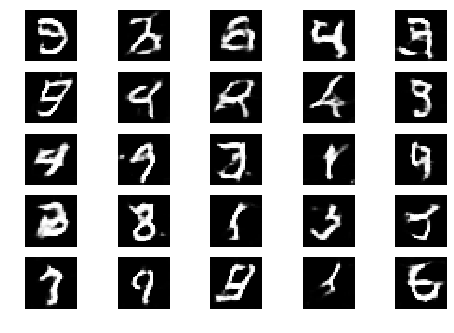

Epoch 1 Batch 201/937 [D loss: 0.349518, acc.: 84.38%] [G loss: 0.000007]
Epoch 1 Batch 202/937 [D loss: 0.039638, acc.: 100.00%] [G loss: 0.000012]


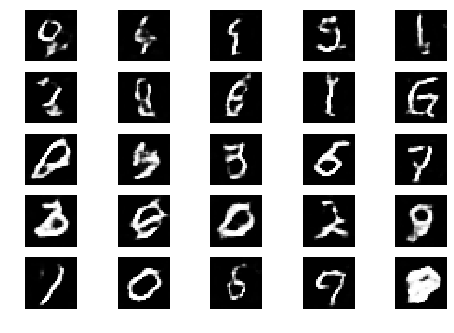

Epoch 1 Batch 203/937 [D loss: 0.036788, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 204/937 [D loss: 0.110694, acc.: 100.00%] [G loss: 0.000012]


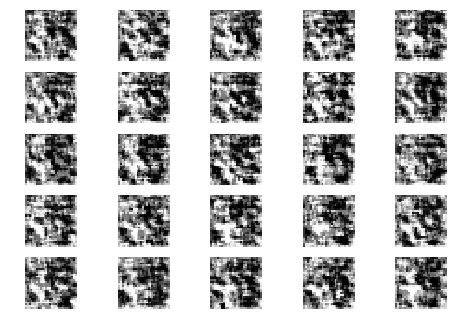

Epoch 1 Batch 205/937 [D loss: 0.355140, acc.: 84.38%] [G loss: 0.000002]
Epoch 1 Batch 206/937 [D loss: 0.075633, acc.: 100.00%] [G loss: 0.000005]
Epoch 1 Batch 207/937 [D loss: 0.469676, acc.: 71.88%] [G loss: 0.000001]
Epoch 1 Batch 208/937 [D loss: 0.781160, acc.: 59.38%] [G loss: 0.000003]
Epoch 1 Batch 209/937 [D loss: 0.105815, acc.: 96.88%] [G loss: 0.000008]
Epoch 1 Batch 210/937 [D loss: 0.080079, acc.: 100.00%] [G loss: 0.000025]
Epoch 1 Batch 211/937 [D loss: 0.156325, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 212/937 [D loss: 0.041547, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 213/937 [D loss: 0.083398, acc.: 96.88%] [G loss: 0.000005]
Epoch 1 Batch 214/937 [D loss: 0.082881, acc.: 96.88%] [G loss: 0.000007]
Epoch 1 Batch 215/937 [D loss: 0.126425, acc.: 96.88%] [G loss: 0.000024]
Epoch 1 Batch 216/937 [D loss: 0.703584, acc.: 65.62%] [G loss: 0.000003]
Epoch 1 Batch 217/937 [D loss: 0.115247, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 218/937 [D loss: 0.1

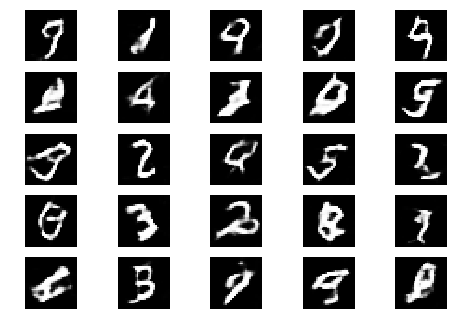

Epoch 1 Batch 301/937 [D loss: 0.156630, acc.: 93.75%] [G loss: 0.000033]
Epoch 1 Batch 302/937 [D loss: 0.216699, acc.: 93.75%] [G loss: 0.000005]
Epoch 1 Batch 303/937 [D loss: 0.022278, acc.: 100.00%] [G loss: 0.000008]


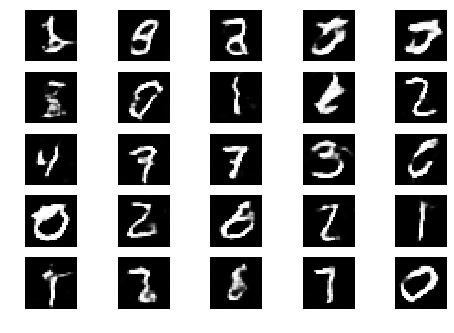

Epoch 1 Batch 304/937 [D loss: 0.458307, acc.: 81.25%] [G loss: 0.000049]
Epoch 1 Batch 305/937 [D loss: 0.041124, acc.: 100.00%] [G loss: 0.000008]
Epoch 1 Batch 306/937 [D loss: 0.156980, acc.: 100.00%] [G loss: 0.000005]


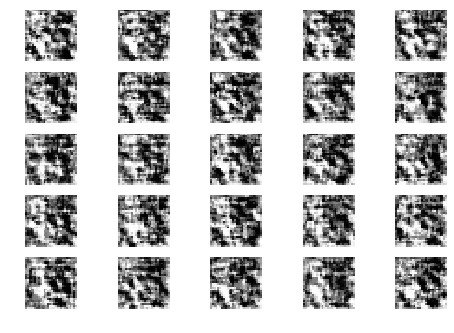

Epoch 1 Batch 307/937 [D loss: 0.076209, acc.: 100.00%] [G loss: 0.000045]
Epoch 1 Batch 308/937 [D loss: 0.049334, acc.: 100.00%] [G loss: 0.000015]
Epoch 1 Batch 309/937 [D loss: 0.450966, acc.: 78.12%] [G loss: 0.000008]
Epoch 1 Batch 310/937 [D loss: 0.007555, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 311/937 [D loss: 0.145445, acc.: 93.75%] [G loss: 0.000020]
Epoch 1 Batch 312/937 [D loss: 0.497144, acc.: 81.25%] [G loss: 0.000018]
Epoch 1 Batch 313/937 [D loss: 0.010873, acc.: 100.00%] [G loss: 0.000014]
Epoch 1 Batch 314/937 [D loss: 0.361159, acc.: 78.12%] [G loss: 0.000007]
Epoch 1 Batch 315/937 [D loss: 0.529279, acc.: 75.00%] [G loss: 0.000023]
Epoch 1 Batch 316/937 [D loss: 0.044033, acc.: 96.88%] [G loss: 0.000006]
Epoch 1 Batch 317/937 [D loss: 0.029419, acc.: 100.00%] [G loss: 0.000030]
Epoch 1 Batch 318/937 [D loss: 0.248309, acc.: 87.50%] [G loss: 0.000009]
Epoch 1 Batch 319/937 [D loss: 0.110686, acc.: 100.00%] [G loss: 0.000013]
Epoch 1 Batch 320/937 [D loss: 0

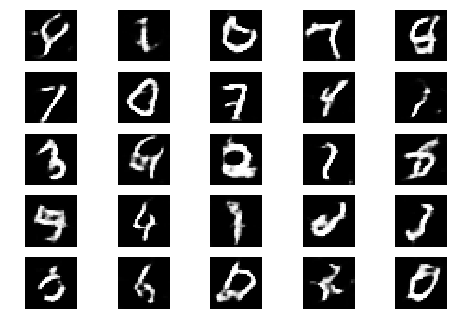

Epoch 1 Batch 401/937 [D loss: 0.101536, acc.: 96.88%] [G loss: 0.000007]
Epoch 1 Batch 402/937 [D loss: 0.146355, acc.: 93.75%] [G loss: 0.000224]
Epoch 1 Batch 403/937 [D loss: 0.036171, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 404/937 [D loss: 0.096285, acc.: 96.88%] [G loss: 0.000001]


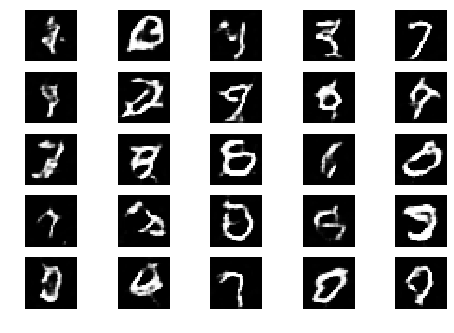

Epoch 1 Batch 405/937 [D loss: 0.111771, acc.: 100.00%] [G loss: 0.000010]
Epoch 1 Batch 406/937 [D loss: 0.508813, acc.: 75.00%] [G loss: 0.000002]
Epoch 1 Batch 407/937 [D loss: 0.336170, acc.: 78.12%] [G loss: 0.000001]
Epoch 1 Batch 408/937 [D loss: 0.020882, acc.: 100.00%] [G loss: 0.000007]


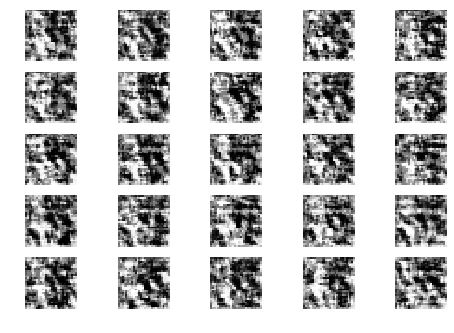

Epoch 1 Batch 409/937 [D loss: 0.027210, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 410/937 [D loss: 0.021915, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 411/937 [D loss: 0.450411, acc.: 71.88%] [G loss: 0.000010]
Epoch 1 Batch 412/937 [D loss: 0.187801, acc.: 93.75%] [G loss: 0.000006]
Epoch 1 Batch 413/937 [D loss: 0.041107, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 414/937 [D loss: 0.168844, acc.: 93.75%] [G loss: 0.000002]
Epoch 1 Batch 415/937 [D loss: 0.031466, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 416/937 [D loss: 0.002641, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 417/937 [D loss: 0.189614, acc.: 90.62%] [G loss: 0.000013]
Epoch 1 Batch 418/937 [D loss: 0.073022, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 419/937 [D loss: 0.113890, acc.: 96.88%] [G loss: 0.000004]
Epoch 1 Batch 420/937 [D loss: 0.010040, acc.: 100.00%] [G loss: 0.000015]
Epoch 1 Batch 421/937 [D loss: 0.100383, acc.: 96.88%] [G loss: 0.000004]
Epoch 1 Batch 422/937 [D loss: 

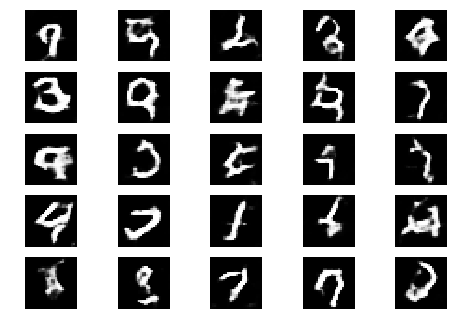

Epoch 1 Batch 501/937 [D loss: 0.415522, acc.: 81.25%] [G loss: 0.000003]
Epoch 1 Batch 502/937 [D loss: 0.014282, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 503/937 [D loss: 0.054640, acc.: 100.00%] [G loss: 0.000032]
Epoch 1 Batch 504/937 [D loss: 0.008156, acc.: 100.00%] [G loss: 0.000007]
Epoch 1 Batch 505/937 [D loss: 0.706596, acc.: 62.50%] [G loss: 0.000003]


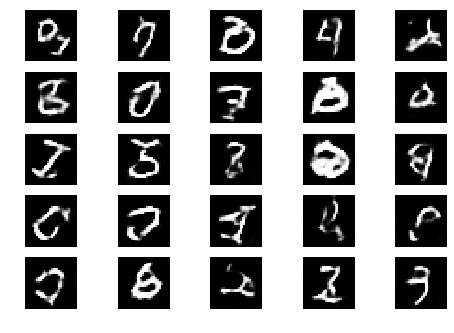

Epoch 1 Batch 506/937 [D loss: 0.051717, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 507/937 [D loss: 0.052551, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 508/937 [D loss: 0.007005, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 509/937 [D loss: 0.139087, acc.: 93.75%] [G loss: 0.000004]
Epoch 1 Batch 510/937 [D loss: 0.223265, acc.: 93.75%] [G loss: 0.000006]


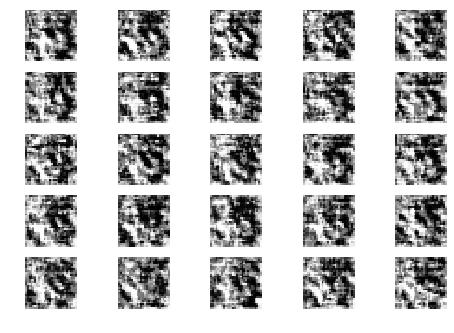

Epoch 1 Batch 511/937 [D loss: 0.008071, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 512/937 [D loss: 0.215908, acc.: 90.62%] [G loss: 0.000001]
Epoch 1 Batch 513/937 [D loss: 0.005373, acc.: 100.00%] [G loss: 0.000006]
Epoch 1 Batch 514/937 [D loss: 0.776940, acc.: 59.38%] [G loss: 0.000004]
Epoch 1 Batch 515/937 [D loss: 0.028348, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 516/937 [D loss: 0.317564, acc.: 84.38%] [G loss: 0.000003]
Epoch 1 Batch 517/937 [D loss: 0.066073, acc.: 100.00%] [G loss: 0.000008]
Epoch 1 Batch 518/937 [D loss: 0.340756, acc.: 78.12%] [G loss: 0.000004]
Epoch 1 Batch 519/937 [D loss: 0.683541, acc.: 65.62%] [G loss: 0.000000]
Epoch 1 Batch 520/937 [D loss: 0.403134, acc.: 78.12%] [G loss: 0.000003]
Epoch 1 Batch 521/937 [D loss: 0.197822, acc.: 87.50%] [G loss: 0.000009]
Epoch 1 Batch 522/937 [D loss: 0.010311, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 523/937 [D loss: 0.095918, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 524/937 [D loss: 0

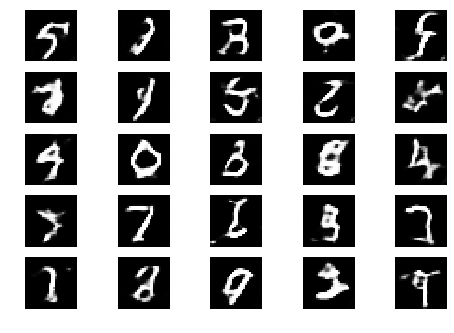

Epoch 1 Batch 601/937 [D loss: 0.020173, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 602/937 [D loss: 0.004273, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 603/937 [D loss: 0.061028, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 604/937 [D loss: 0.029295, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 605/937 [D loss: 0.106504, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 606/937 [D loss: 0.279549, acc.: 87.50%] [G loss: 0.000001]


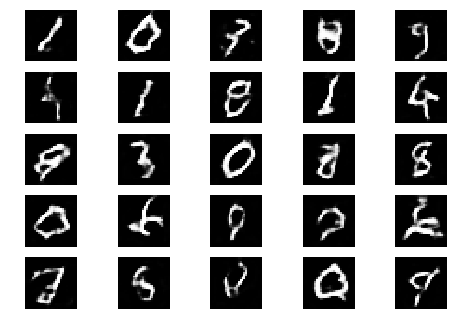

Epoch 1 Batch 607/937 [D loss: 0.000400, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 608/937 [D loss: 0.455135, acc.: 75.00%] [G loss: 0.000003]
Epoch 1 Batch 609/937 [D loss: 0.006165, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 610/937 [D loss: 0.428181, acc.: 81.25%] [G loss: 0.000001]
Epoch 1 Batch 611/937 [D loss: 0.095394, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 612/937 [D loss: 0.595403, acc.: 65.62%] [G loss: 0.000001]


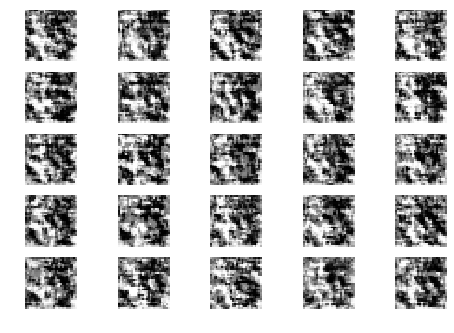

Epoch 1 Batch 613/937 [D loss: 0.005053, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 614/937 [D loss: 0.003408, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 615/937 [D loss: 0.001969, acc.: 100.00%] [G loss: 0.000011]
Epoch 1 Batch 616/937 [D loss: 0.042655, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 617/937 [D loss: 0.010808, acc.: 100.00%] [G loss: 0.000009]
Epoch 1 Batch 618/937 [D loss: 0.251325, acc.: 90.62%] [G loss: 0.000002]
Epoch 1 Batch 619/937 [D loss: 0.018558, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 620/937 [D loss: 0.204779, acc.: 93.75%] [G loss: 0.000001]
Epoch 1 Batch 621/937 [D loss: 0.004748, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 622/937 [D loss: 0.061973, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 623/937 [D loss: 0.035100, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 624/937 [D loss: 0.107176, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 625/937 [D loss: 0.076865, acc.: 96.88%] [G loss: 0.000000]
Epoch 1 Batch 626/937 [D los

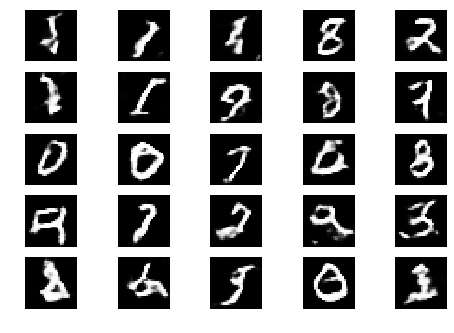

Epoch 1 Batch 701/937 [D loss: 0.318660, acc.: 90.62%] [G loss: 0.000003]
Epoch 1 Batch 702/937 [D loss: 0.084327, acc.: 100.00%] [G loss: 0.000008]
Epoch 1 Batch 703/937 [D loss: 0.081797, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 704/937 [D loss: 0.093092, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 705/937 [D loss: 0.010721, acc.: 100.00%] [G loss: 0.000006]
Epoch 1 Batch 706/937 [D loss: 0.203312, acc.: 93.75%] [G loss: 0.000007]
Epoch 1 Batch 707/937 [D loss: 0.247687, acc.: 90.62%] [G loss: 0.000002]


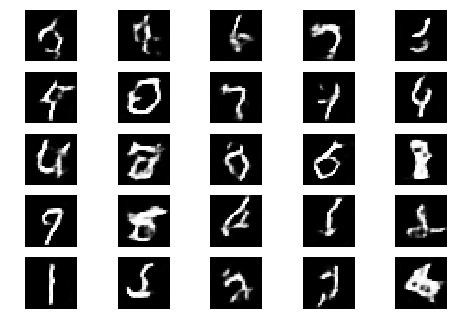

Epoch 1 Batch 708/937 [D loss: 0.118327, acc.: 96.88%] [G loss: 0.000002]
Epoch 1 Batch 709/937 [D loss: 0.259156, acc.: 90.62%] [G loss: 0.000006]
Epoch 1 Batch 710/937 [D loss: 0.165541, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 711/937 [D loss: 0.086486, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 712/937 [D loss: 0.017829, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 713/937 [D loss: 0.269938, acc.: 90.62%] [G loss: 0.000002]
Epoch 1 Batch 714/937 [D loss: 0.341555, acc.: 81.25%] [G loss: 0.000001]


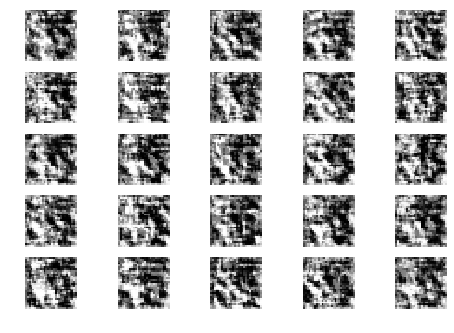

Epoch 1 Batch 715/937 [D loss: 0.172931, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 716/937 [D loss: 0.500510, acc.: 75.00%] [G loss: 0.000001]
Epoch 1 Batch 717/937 [D loss: 0.018770, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 718/937 [D loss: 0.064466, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 719/937 [D loss: 0.143424, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 720/937 [D loss: 0.097609, acc.: 96.88%] [G loss: 0.000005]
Epoch 1 Batch 721/937 [D loss: 0.068012, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 722/937 [D loss: 0.020568, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 723/937 [D loss: 0.004436, acc.: 100.00%] [G loss: 0.000005]
Epoch 1 Batch 724/937 [D loss: 0.036491, acc.: 100.00%] [G loss: 0.000018]
Epoch 1 Batch 725/937 [D loss: 0.053065, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 726/937 [D loss: 0.268785, acc.: 90.62%] [G loss: 0.000001]
Epoch 1 Batch 727/937 [D loss: 0.015563, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 728/937 [D loss:

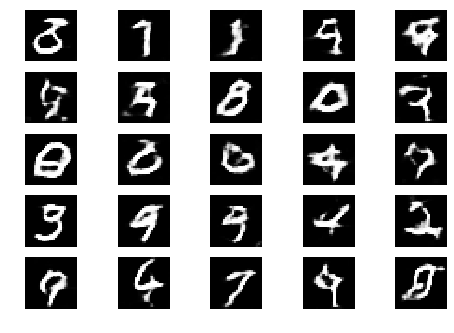

Epoch 1 Batch 801/937 [D loss: 0.243293, acc.: 84.38%] [G loss: 0.000000]
Epoch 1 Batch 802/937 [D loss: 0.028406, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 803/937 [D loss: 0.034275, acc.: 100.00%] [G loss: 0.000005]
Epoch 1 Batch 804/937 [D loss: 0.056136, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 805/937 [D loss: 0.105596, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 806/937 [D loss: 0.172128, acc.: 96.88%] [G loss: 0.000002]
Epoch 1 Batch 807/937 [D loss: 0.069226, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 808/937 [D loss: 0.751829, acc.: 59.38%] [G loss: 0.000001]


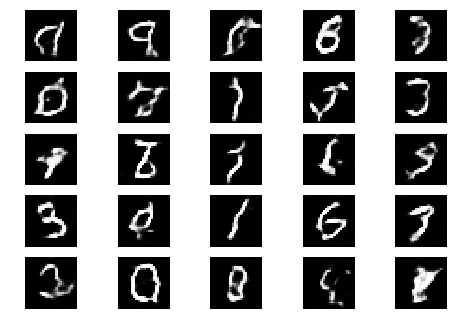

Epoch 1 Batch 809/937 [D loss: 0.005870, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 810/937 [D loss: 0.062154, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 811/937 [D loss: 0.044131, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 812/937 [D loss: 0.203627, acc.: 87.50%] [G loss: 0.000002]
Epoch 1 Batch 813/937 [D loss: 0.023380, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 814/937 [D loss: 0.017453, acc.: 100.00%] [G loss: 0.000029]
Epoch 1 Batch 815/937 [D loss: 0.798046, acc.: 62.50%] [G loss: 0.000000]
Epoch 1 Batch 816/937 [D loss: 0.019184, acc.: 100.00%] [G loss: 0.000000]


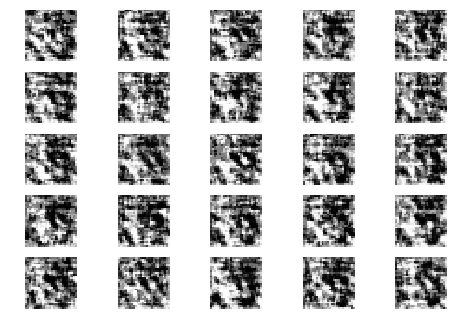

Epoch 1 Batch 817/937 [D loss: 0.234658, acc.: 90.62%] [G loss: 0.000000]
Epoch 1 Batch 818/937 [D loss: 0.029583, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 819/937 [D loss: 0.003435, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 820/937 [D loss: 0.119178, acc.: 93.75%] [G loss: 0.000007]
Epoch 1 Batch 821/937 [D loss: 0.042024, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 822/937 [D loss: 0.367518, acc.: 78.12%] [G loss: 0.000001]
Epoch 1 Batch 823/937 [D loss: 0.002069, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 824/937 [D loss: 0.396247, acc.: 75.00%] [G loss: 0.000000]
Epoch 1 Batch 825/937 [D loss: 0.004882, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 826/937 [D loss: 0.116748, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 827/937 [D loss: 0.004686, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 828/937 [D loss: 1.168171, acc.: 56.25%] [G loss: 0.000001]
Epoch 1 Batch 829/937 [D loss: 0.022509, acc.: 100.00%] [G loss: 0.000022]
Epoch 1 Batch 830/937 [D loss: 

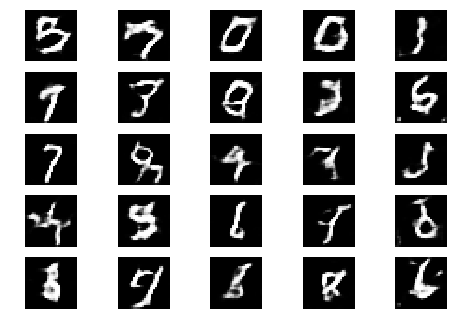

Epoch 1 Batch 901/937 [D loss: 0.728736, acc.: 56.25%] [G loss: 0.000002]
Epoch 1 Batch 902/937 [D loss: 0.119472, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 903/937 [D loss: 0.024101, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 904/937 [D loss: 0.002018, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 905/937 [D loss: 0.004229, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 906/937 [D loss: 0.008271, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 907/937 [D loss: 0.016288, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 908/937 [D loss: 0.624442, acc.: 62.50%] [G loss: 0.000001]
Epoch 1 Batch 909/937 [D loss: 0.064861, acc.: 100.00%] [G loss: 0.000003]


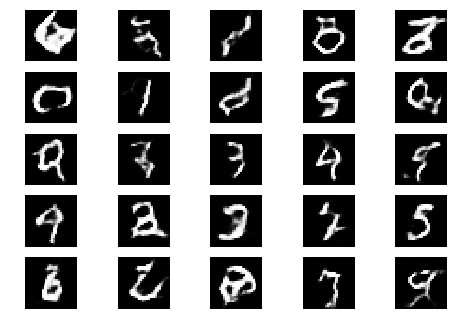

Epoch 1 Batch 910/937 [D loss: 0.088154, acc.: 96.88%] [G loss: 0.000004]
Epoch 1 Batch 911/937 [D loss: 0.016717, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 912/937 [D loss: 0.076729, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 913/937 [D loss: 0.033488, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 914/937 [D loss: 0.148738, acc.: 90.62%] [G loss: 0.000001]
Epoch 1 Batch 915/937 [D loss: 0.045013, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 916/937 [D loss: 0.022500, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 917/937 [D loss: 0.105700, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 918/937 [D loss: 0.550421, acc.: 75.00%] [G loss: 0.000003]


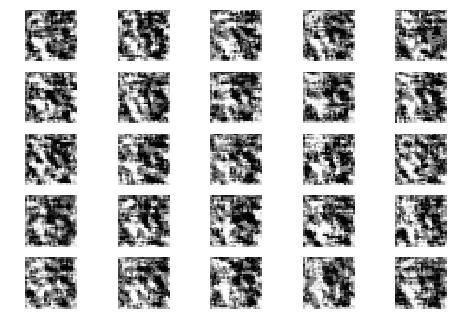

Epoch 1 Batch 919/937 [D loss: 0.120392, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 920/937 [D loss: 0.011957, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 921/937 [D loss: 0.040818, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 922/937 [D loss: 0.016035, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 923/937 [D loss: 0.604345, acc.: 62.50%] [G loss: 0.000001]
Epoch 1 Batch 924/937 [D loss: 0.072759, acc.: 96.88%] [G loss: 0.000000]
Epoch 1 Batch 925/937 [D loss: 0.962700, acc.: 46.88%] [G loss: 0.000000]
Epoch 1 Batch 926/937 [D loss: 0.009871, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 927/937 [D loss: 0.054250, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 928/937 [D loss: 0.007154, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 929/937 [D loss: 0.077783, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 930/937 [D loss: 0.049288, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 931/937 [D loss: 0.163782, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 932/937 [D loss:

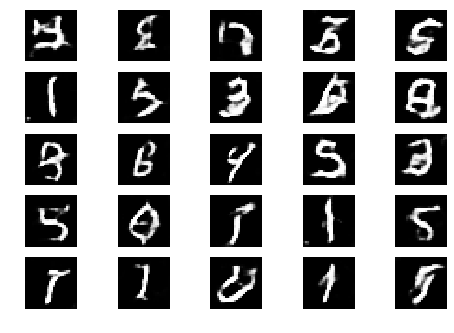

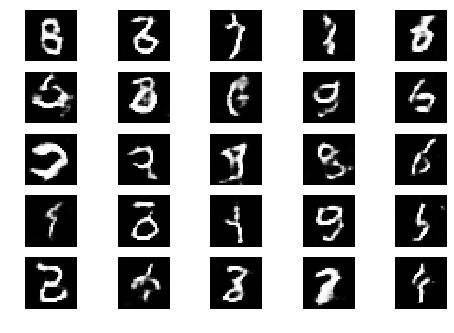

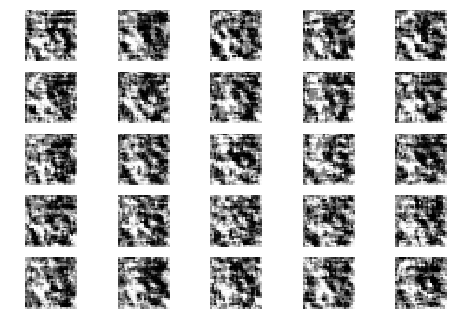

Epoch 2 Batch 1/937 [D loss: 0.723989, acc.: 56.25%] [G loss: 0.000014]
Epoch 2 Batch 2/937 [D loss: 0.289520, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 3/937 [D loss: 0.159260, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 4/937 [D loss: 0.002675, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 5/937 [D loss: 0.178043, acc.: 90.62%] [G loss: 0.000002]
Epoch 2 Batch 6/937 [D loss: 0.162672, acc.: 96.88%] [G loss: 0.000002]
Epoch 2 Batch 7/937 [D loss: 0.368610, acc.: 84.38%] [G loss: 0.000001]
Epoch 2 Batch 8/937 [D loss: 0.010372, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 9/937 [D loss: 0.110043, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 10/937 [D loss: 0.036124, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 11/937 [D loss: 0.011083, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 12/937 [D loss: 0.011078, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 13/937 [D loss: 0.000959, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 14/937 [D loss: 0.008165, acc.: 100.00%]

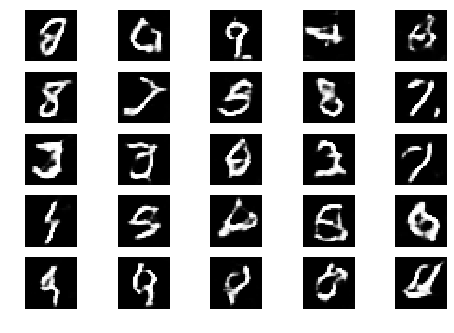

Epoch 2 Batch 101/937 [D loss: 0.433929, acc.: 75.00%] [G loss: 0.000003]


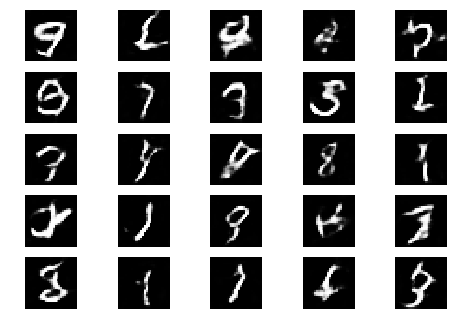

Epoch 2 Batch 102/937 [D loss: 0.058520, acc.: 96.88%] [G loss: 0.000001]


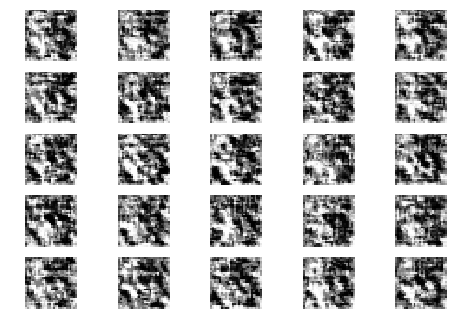

Epoch 2 Batch 103/937 [D loss: 0.053671, acc.: 96.88%] [G loss: 0.000002]
Epoch 2 Batch 104/937 [D loss: 0.036537, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 105/937 [D loss: 0.019639, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 106/937 [D loss: 0.010328, acc.: 100.00%] [G loss: 0.000002]
Epoch 2 Batch 107/937 [D loss: 0.038284, acc.: 100.00%] [G loss: 0.000003]
Epoch 2 Batch 108/937 [D loss: 0.147203, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 109/937 [D loss: 0.010534, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 110/937 [D loss: 0.031480, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 111/937 [D loss: 1.068129, acc.: 50.00%] [G loss: 0.000001]
Epoch 2 Batch 112/937 [D loss: 0.267465, acc.: 84.38%] [G loss: 0.000009]
Epoch 2 Batch 113/937 [D loss: 1.003501, acc.: 53.12%] [G loss: 0.000001]
Epoch 2 Batch 114/937 [D loss: 0.140682, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 115/937 [D loss: 0.180131, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 116/937 [D loss: 0

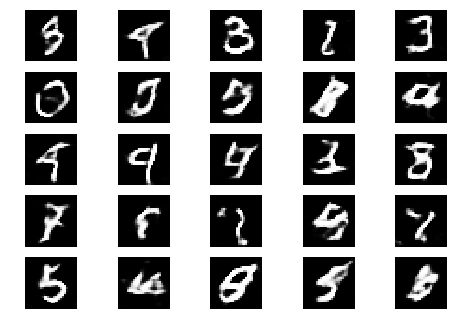

Epoch 2 Batch 201/937 [D loss: 0.012095, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 202/937 [D loss: 0.206591, acc.: 93.75%] [G loss: 0.000000]


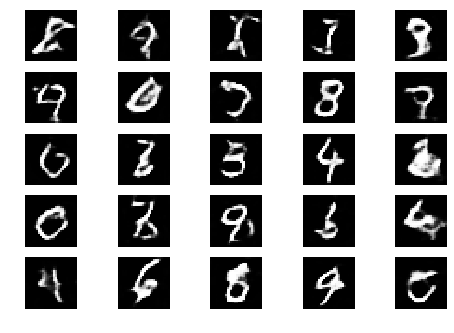

Epoch 2 Batch 203/937 [D loss: 0.005231, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 204/937 [D loss: 0.014744, acc.: 100.00%] [G loss: 0.000001]


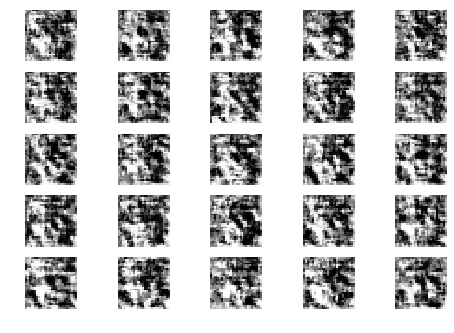

Epoch 2 Batch 205/937 [D loss: 1.370234, acc.: 53.12%] [G loss: 0.000001]
Epoch 2 Batch 206/937 [D loss: 0.052070, acc.: 100.00%] [G loss: 0.000008]
Epoch 2 Batch 207/937 [D loss: 0.799282, acc.: 65.62%] [G loss: 0.000001]
Epoch 2 Batch 208/937 [D loss: 0.039757, acc.: 100.00%] [G loss: 0.000005]
Epoch 2 Batch 209/937 [D loss: 0.475684, acc.: 75.00%] [G loss: 0.000001]
Epoch 2 Batch 210/937 [D loss: 0.013527, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 211/937 [D loss: 0.724762, acc.: 62.50%] [G loss: 0.000000]
Epoch 2 Batch 212/937 [D loss: 0.138760, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 213/937 [D loss: 0.025822, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 214/937 [D loss: 0.046528, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 215/937 [D loss: 0.028271, acc.: 100.00%] [G loss: 0.000006]
Epoch 2 Batch 216/937 [D loss: 0.160673, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 217/937 [D loss: 0.451572, acc.: 75.00%] [G loss: 0.000006]
Epoch 2 Batch 218/937 [D loss: 

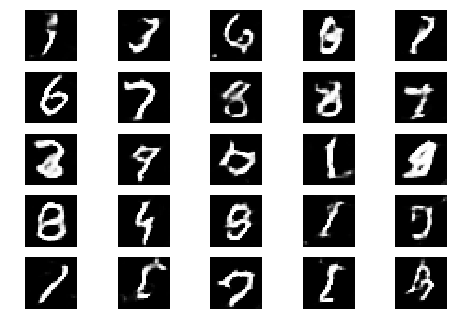

Epoch 2 Batch 301/937 [D loss: 0.089345, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 302/937 [D loss: 0.019771, acc.: 100.00%] [G loss: 0.000011]
Epoch 2 Batch 303/937 [D loss: 0.012344, acc.: 100.00%] [G loss: 0.000014]


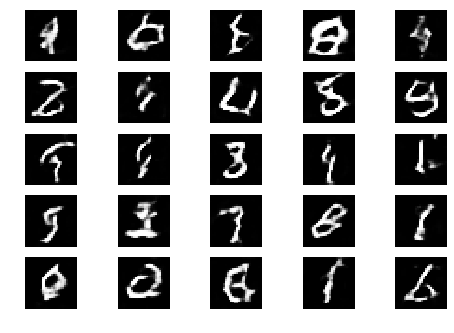

Epoch 2 Batch 304/937 [D loss: 0.046411, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 305/937 [D loss: 0.001679, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 306/937 [D loss: 0.279399, acc.: 84.38%] [G loss: 0.000001]


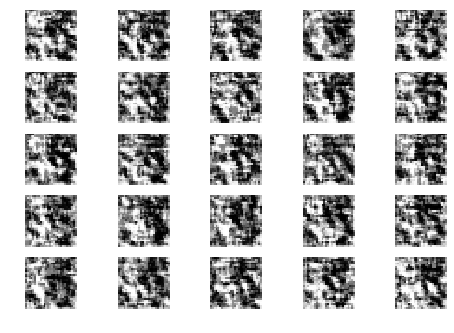

Epoch 2 Batch 307/937 [D loss: 0.009320, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 308/937 [D loss: 0.391409, acc.: 71.88%] [G loss: 0.000000]
Epoch 2 Batch 309/937 [D loss: 0.148616, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 310/937 [D loss: 0.224804, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 311/937 [D loss: 0.012192, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 312/937 [D loss: 0.006806, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 313/937 [D loss: 0.010404, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 314/937 [D loss: 0.170719, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 315/937 [D loss: 0.280144, acc.: 90.62%] [G loss: 0.000003]
Epoch 2 Batch 316/937 [D loss: 0.134194, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 317/937 [D loss: 0.166581, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 318/937 [D loss: 0.382524, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 319/937 [D loss: 0.314757, acc.: 84.38%] [G loss: 0.000001]
Epoch 2 Batch 320/937 [D loss: 0.0

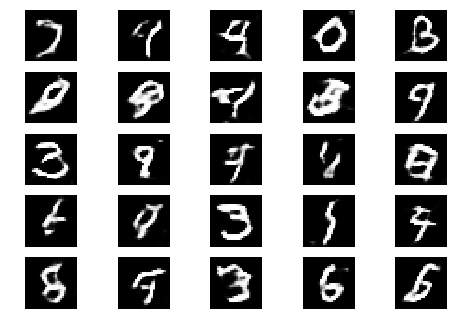

Epoch 2 Batch 401/937 [D loss: 0.039455, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 402/937 [D loss: 0.056676, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 403/937 [D loss: 0.055330, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 404/937 [D loss: 0.017612, acc.: 100.00%] [G loss: 0.000000]


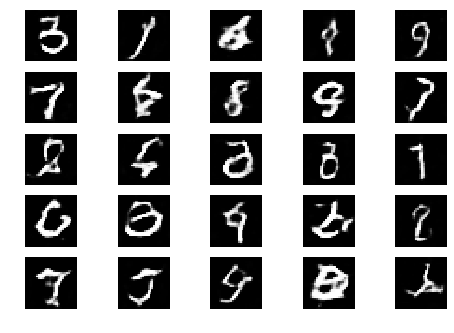

Epoch 2 Batch 405/937 [D loss: 0.022503, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 406/937 [D loss: 0.006030, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 407/937 [D loss: 0.008332, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 408/937 [D loss: 0.002874, acc.: 100.00%] [G loss: 0.000000]


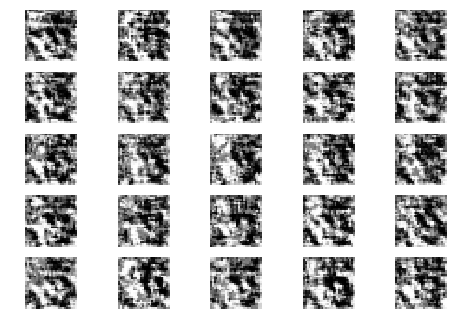

Epoch 2 Batch 409/937 [D loss: 0.000616, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 410/937 [D loss: 0.003885, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 411/937 [D loss: 0.008572, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 412/937 [D loss: 0.035603, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 413/937 [D loss: 0.050854, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 414/937 [D loss: 0.003089, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 415/937 [D loss: 0.004473, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 416/937 [D loss: 0.042256, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 417/937 [D loss: 0.060483, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 418/937 [D loss: 0.007114, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 419/937 [D loss: 0.077246, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 420/937 [D loss: 0.045917, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 421/937 [D loss: 0.004465, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 422/937 [D l

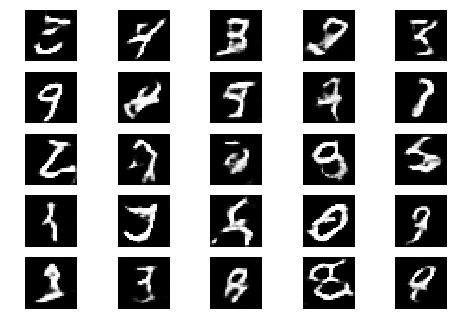

Epoch 2 Batch 501/937 [D loss: 0.211676, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 502/937 [D loss: 0.000118, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 503/937 [D loss: 0.082240, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 504/937 [D loss: 0.637018, acc.: 71.88%] [G loss: 0.000000]
Epoch 2 Batch 505/937 [D loss: 0.010602, acc.: 100.00%] [G loss: 0.000000]


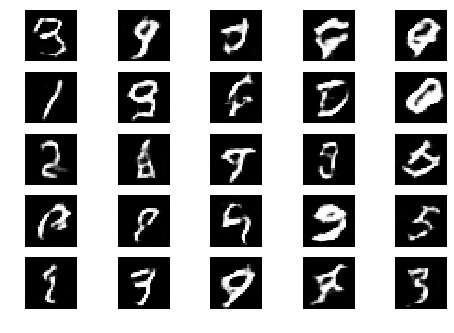

Epoch 2 Batch 506/937 [D loss: 0.001262, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 507/937 [D loss: 0.016427, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 508/937 [D loss: 0.000898, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 509/937 [D loss: 0.000512, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 510/937 [D loss: 0.003035, acc.: 100.00%] [G loss: 0.000000]


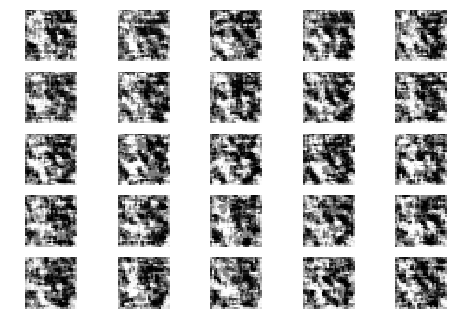

Epoch 2 Batch 511/937 [D loss: 0.256571, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 512/937 [D loss: 0.019236, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 513/937 [D loss: 0.000843, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 514/937 [D loss: 0.040435, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 515/937 [D loss: 0.128942, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 516/937 [D loss: 0.000460, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 517/937 [D loss: 0.016207, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 518/937 [D loss: 0.003594, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 519/937 [D loss: 0.250346, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 520/937 [D loss: 0.014790, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 521/937 [D loss: 0.164155, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 522/937 [D loss: 0.020159, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 523/937 [D loss: 0.031317, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 524/937 [D loss

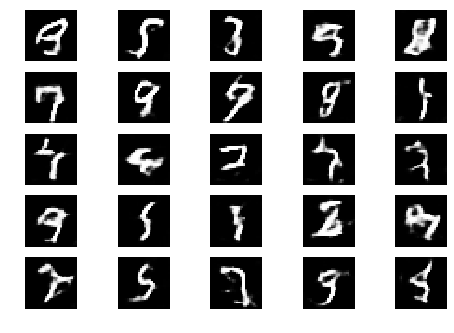

Epoch 2 Batch 601/937 [D loss: 0.003325, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 602/937 [D loss: 0.012570, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 603/937 [D loss: 0.153871, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 604/937 [D loss: 0.642723, acc.: 71.88%] [G loss: 0.000000]
Epoch 2 Batch 605/937 [D loss: 0.049394, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 606/937 [D loss: 0.020999, acc.: 100.00%] [G loss: 0.000000]


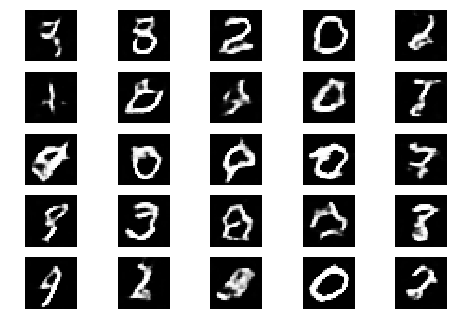

Epoch 2 Batch 607/937 [D loss: 0.360973, acc.: 75.00%] [G loss: 0.000000]
Epoch 2 Batch 608/937 [D loss: 0.252900, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 609/937 [D loss: 0.046070, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 610/937 [D loss: 0.016369, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 611/937 [D loss: 0.007943, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 612/937 [D loss: 0.026437, acc.: 100.00%] [G loss: 0.000000]


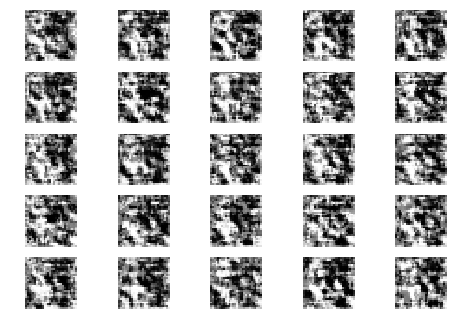

Epoch 2 Batch 613/937 [D loss: 0.002870, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 614/937 [D loss: 0.001612, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 615/937 [D loss: 0.004054, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 616/937 [D loss: 0.072576, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 617/937 [D loss: 0.047880, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 618/937 [D loss: 0.429459, acc.: 81.25%] [G loss: 0.000001]
Epoch 2 Batch 619/937 [D loss: 0.008796, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 620/937 [D loss: 0.389112, acc.: 75.00%] [G loss: 0.000000]
Epoch 2 Batch 621/937 [D loss: 0.008305, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 622/937 [D loss: 0.001345, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 623/937 [D loss: 0.018498, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 624/937 [D loss: 0.001293, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 625/937 [D loss: 0.311463, acc.: 84.38%] [G loss: 0.000000]
Epoch 2 Batch 626/937 [D los

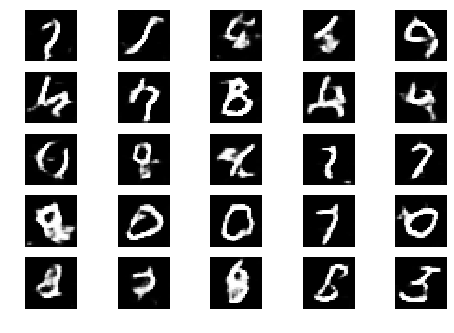

Epoch 2 Batch 701/937 [D loss: 0.002911, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 702/937 [D loss: 0.249996, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 703/937 [D loss: 0.006231, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 704/937 [D loss: 0.173363, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 705/937 [D loss: 0.006376, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 706/937 [D loss: 0.052315, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 707/937 [D loss: 0.018432, acc.: 100.00%] [G loss: 0.000000]


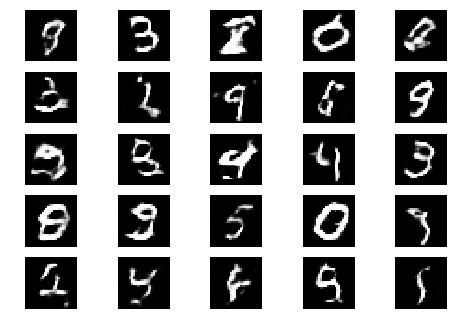

Epoch 2 Batch 708/937 [D loss: 0.002107, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 709/937 [D loss: 0.016197, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 710/937 [D loss: 0.095874, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 711/937 [D loss: 0.053360, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 712/937 [D loss: 0.119530, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 713/937 [D loss: 0.008628, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 714/937 [D loss: 0.002449, acc.: 100.00%] [G loss: 0.000000]


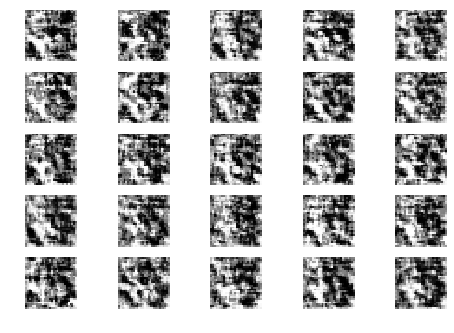

Epoch 2 Batch 715/937 [D loss: 0.204751, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 716/937 [D loss: 0.066162, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 717/937 [D loss: 0.037406, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 718/937 [D loss: 0.203615, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 719/937 [D loss: 0.144616, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 720/937 [D loss: 0.210803, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 721/937 [D loss: 0.324318, acc.: 84.38%] [G loss: 0.000000]
Epoch 2 Batch 722/937 [D loss: 0.002954, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 723/937 [D loss: 0.015599, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 724/937 [D loss: 0.301403, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 725/937 [D loss: 0.093178, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 726/937 [D loss: 0.138387, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 727/937 [D loss: 0.017588, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 728/937 [D loss: 0.

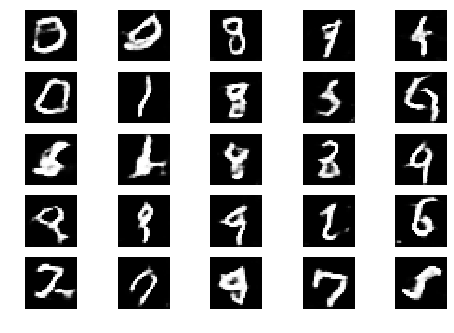

Epoch 2 Batch 801/937 [D loss: 0.733097, acc.: 62.50%] [G loss: 0.000000]
Epoch 2 Batch 802/937 [D loss: 0.021568, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 803/937 [D loss: 0.000040, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 804/937 [D loss: 0.001487, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 805/937 [D loss: 0.144301, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 806/937 [D loss: 0.019270, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 807/937 [D loss: 0.002164, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 808/937 [D loss: 0.067217, acc.: 100.00%] [G loss: 0.000000]


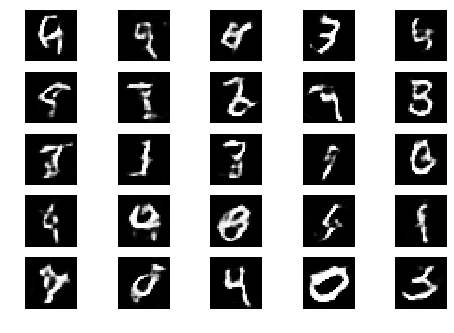

Epoch 2 Batch 809/937 [D loss: 0.000800, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 810/937 [D loss: 0.049602, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 811/937 [D loss: 0.329645, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 812/937 [D loss: 0.001483, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 813/937 [D loss: 0.049456, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 814/937 [D loss: 0.022254, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 815/937 [D loss: 0.018640, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 816/937 [D loss: 0.029567, acc.: 100.00%] [G loss: 0.000000]


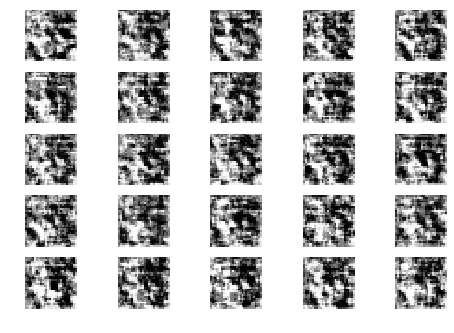

Epoch 2 Batch 817/937 [D loss: 0.036139, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 818/937 [D loss: 0.371546, acc.: 84.38%] [G loss: 0.000000]
Epoch 2 Batch 819/937 [D loss: 0.349774, acc.: 78.12%] [G loss: 0.000000]
Epoch 2 Batch 820/937 [D loss: 0.160733, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 821/937 [D loss: 0.007509, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 822/937 [D loss: 0.001592, acc.: 100.00%] [G loss: 0.000004]
Epoch 2 Batch 823/937 [D loss: 0.001120, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 824/937 [D loss: 0.174867, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 825/937 [D loss: 0.009051, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 826/937 [D loss: 0.001048, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 827/937 [D loss: 0.149758, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 828/937 [D loss: 0.062500, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 829/937 [D loss: 0.012605, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 830/937 [D loss:

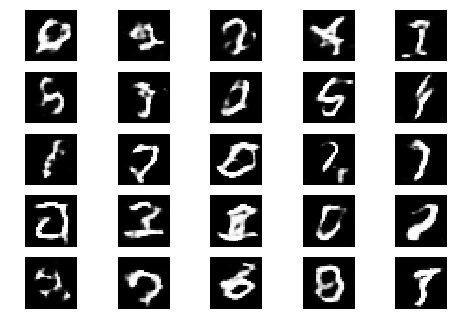

Epoch 2 Batch 901/937 [D loss: 0.015353, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 902/937 [D loss: 1.703911, acc.: 50.00%] [G loss: 0.000000]
Epoch 2 Batch 903/937 [D loss: 0.012675, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 904/937 [D loss: 0.183825, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 905/937 [D loss: 0.031233, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 906/937 [D loss: 0.000203, acc.: 100.00%] [G loss: 0.000004]
Epoch 2 Batch 907/937 [D loss: 0.003847, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 908/937 [D loss: 0.002740, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 909/937 [D loss: 0.001299, acc.: 100.00%] [G loss: 0.000000]


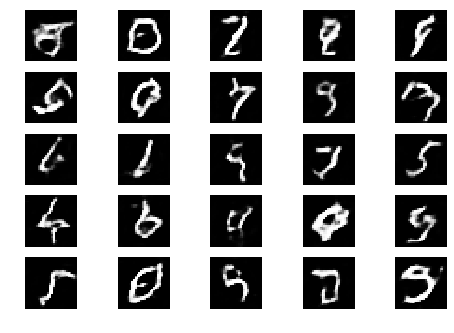

Epoch 2 Batch 910/937 [D loss: 0.002169, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 911/937 [D loss: 0.032981, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 912/937 [D loss: 0.526933, acc.: 68.75%] [G loss: 0.000001]
Epoch 2 Batch 913/937 [D loss: 0.003910, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 914/937 [D loss: 0.420792, acc.: 68.75%] [G loss: 0.000000]
Epoch 2 Batch 915/937 [D loss: 0.059918, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 916/937 [D loss: 0.351834, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 917/937 [D loss: 0.002148, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 918/937 [D loss: 0.713732, acc.: 65.62%] [G loss: 0.000000]


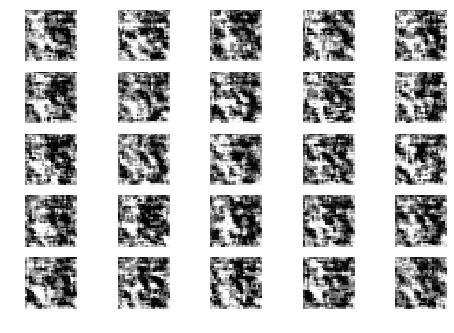

Epoch 2 Batch 919/937 [D loss: 1.271104, acc.: 53.12%] [G loss: 0.000000]
Epoch 2 Batch 920/937 [D loss: 0.009388, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 921/937 [D loss: 0.013341, acc.: 100.00%] [G loss: 0.000005]
Epoch 2 Batch 922/937 [D loss: 0.007951, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 923/937 [D loss: 0.001935, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 924/937 [D loss: 0.010269, acc.: 100.00%] [G loss: 0.000003]
Epoch 2 Batch 925/937 [D loss: 0.006256, acc.: 100.00%] [G loss: 0.000003]
Epoch 2 Batch 926/937 [D loss: 0.006555, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 927/937 [D loss: 0.006597, acc.: 100.00%] [G loss: 0.000002]
Epoch 2 Batch 928/937 [D loss: 0.389254, acc.: 75.00%] [G loss: 0.000000]
Epoch 2 Batch 929/937 [D loss: 0.422591, acc.: 75.00%] [G loss: 0.000000]
Epoch 2 Batch 930/937 [D loss: 0.097462, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 931/937 [D loss: 0.236342, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 932/937 [D loss

In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1, modeltotrain=2)

In [0]:
generator1, generator2, discriminator, combined , mergedmodel = build_modelsNEW( averagemode = 3 ,  loadpretrainedweights=True)


-- Discriminator -- 
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_18 (InputLayer)        (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_87 (Conv2D)           (None, 14, 14, 32)        320       
_________________________________________________________________
leaky_re_lu_33 (LeakyReLU)   (None, 14, 14, 32)        0         
_________________________________________________________________
dropout_33 (Dropout)         (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_88 (Conv2D)           (None, 7, 7, 64)          18496     
_________________________________________________________________
zero_padding2d_9 (ZeroPaddin (None, 8, 8, 64)          0         
_________________________________________________________________
leaky_re_lu_34 (LeakyReLU)   (None, 8, 8, 64)          

Number of examples:  30000.0
Number of Batches:  937
Number of epochs:  2
G1 output numpy array shape
(16, 28, 28, 1)
G1+G2 appended numpy array shape
(16, 28, 28, 1)


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch 0 Batch 0/937 [D loss: 0.853567, acc.: 46.88%] [G loss: 0.362638]


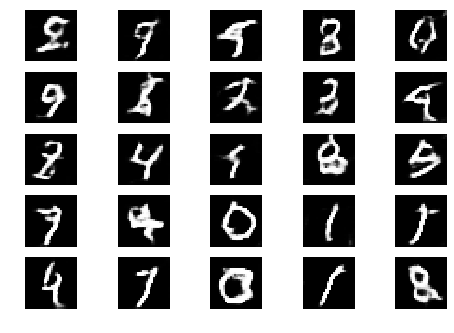

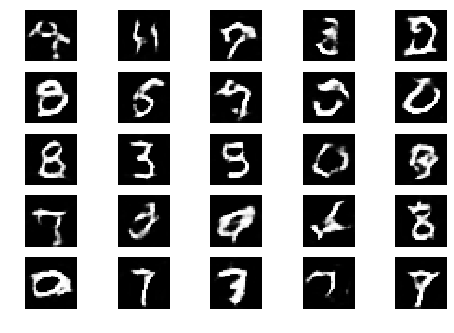

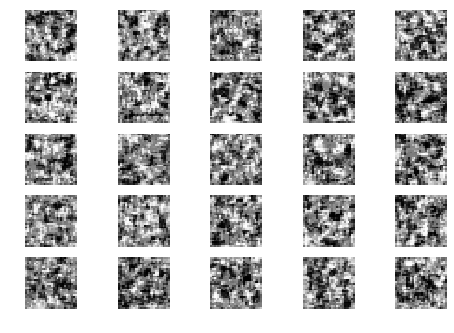

Epoch 0 Batch 1/937 [D loss: 0.772092, acc.: 56.25%] [G loss: 0.666439]
Epoch 0 Batch 2/937 [D loss: 0.566477, acc.: 62.50%] [G loss: 0.751613]
Epoch 0 Batch 3/937 [D loss: 0.569288, acc.: 71.88%] [G loss: 0.927672]
Epoch 0 Batch 4/937 [D loss: 0.376140, acc.: 81.25%] [G loss: 1.175600]
Epoch 0 Batch 5/937 [D loss: 0.491268, acc.: 78.12%] [G loss: 1.003709]
Epoch 0 Batch 6/937 [D loss: 0.284104, acc.: 93.75%] [G loss: 1.349136]
Epoch 0 Batch 7/937 [D loss: 0.341286, acc.: 90.62%] [G loss: 1.539799]
Epoch 0 Batch 8/937 [D loss: 0.366947, acc.: 84.38%] [G loss: 1.392815]
Epoch 0 Batch 9/937 [D loss: 0.291518, acc.: 93.75%] [G loss: 1.484884]
Epoch 0 Batch 10/937 [D loss: 0.399763, acc.: 81.25%] [G loss: 1.365540]
Epoch 0 Batch 11/937 [D loss: 0.284469, acc.: 100.00%] [G loss: 1.424732]
Epoch 0 Batch 12/937 [D loss: 0.440933, acc.: 75.00%] [G loss: 1.732619]
Epoch 0 Batch 13/937 [D loss: 0.286046, acc.: 96.88%] [G loss: 1.824622]
Epoch 0 Batch 14/937 [D loss: 0.197749, acc.: 96.88%] [G lo

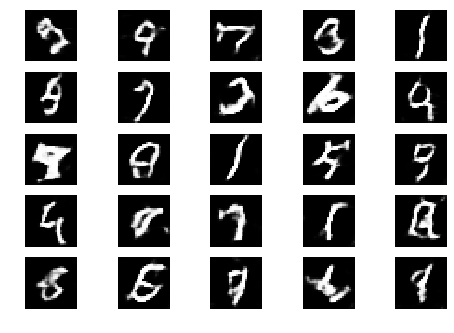

Epoch 0 Batch 101/937 [D loss: 0.393128, acc.: 78.12%] [G loss: 3.022180]


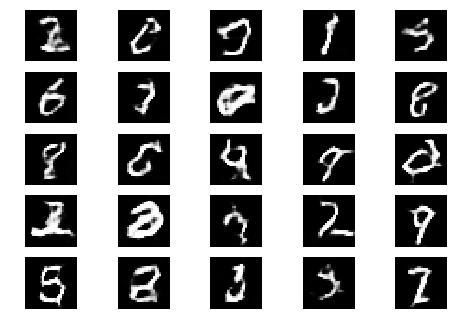

Epoch 0 Batch 102/937 [D loss: 0.333233, acc.: 87.50%] [G loss: 2.607483]


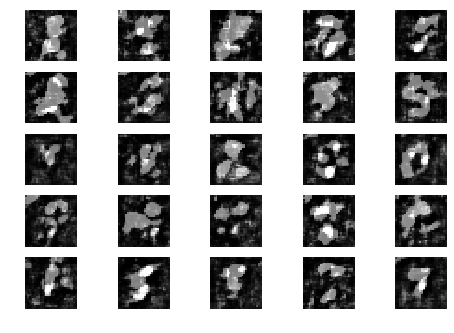

Epoch 0 Batch 103/937 [D loss: 0.473947, acc.: 75.00%] [G loss: 3.352985]
Epoch 0 Batch 104/937 [D loss: 0.276412, acc.: 90.62%] [G loss: 2.968996]
Epoch 0 Batch 105/937 [D loss: 0.694509, acc.: 56.25%] [G loss: 3.353695]
Epoch 0 Batch 106/937 [D loss: 0.323621, acc.: 87.50%] [G loss: 4.750237]
Epoch 0 Batch 107/937 [D loss: 0.641373, acc.: 78.12%] [G loss: 2.024354]
Epoch 0 Batch 108/937 [D loss: 0.328758, acc.: 87.50%] [G loss: 3.511693]
Epoch 0 Batch 109/937 [D loss: 0.257803, acc.: 90.62%] [G loss: 2.996171]
Epoch 0 Batch 110/937 [D loss: 0.923991, acc.: 50.00%] [G loss: 4.888375]
Epoch 0 Batch 111/937 [D loss: 0.443777, acc.: 84.38%] [G loss: 3.063087]
Epoch 0 Batch 112/937 [D loss: 0.352286, acc.: 87.50%] [G loss: 2.945454]
Epoch 0 Batch 113/937 [D loss: 0.390004, acc.: 71.88%] [G loss: 2.847213]
Epoch 0 Batch 114/937 [D loss: 0.168320, acc.: 100.00%] [G loss: 2.973771]
Epoch 0 Batch 115/937 [D loss: 0.378616, acc.: 81.25%] [G loss: 2.567851]
Epoch 0 Batch 116/937 [D loss: 0.3019

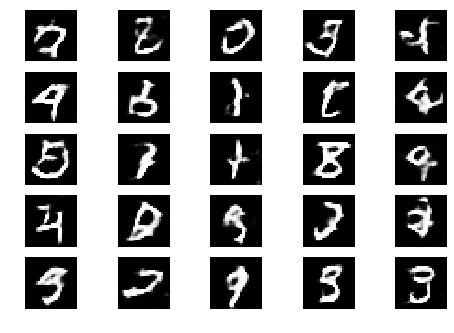

Epoch 0 Batch 201/937 [D loss: 0.755530, acc.: 62.50%] [G loss: 3.336841]
Epoch 0 Batch 202/937 [D loss: 0.948013, acc.: 56.25%] [G loss: 2.094341]


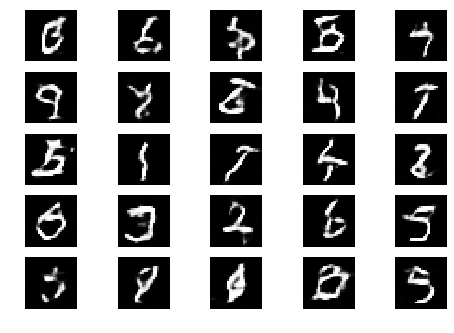

Epoch 0 Batch 203/937 [D loss: 0.772406, acc.: 59.38%] [G loss: 3.076865]
Epoch 0 Batch 204/937 [D loss: 0.645507, acc.: 59.38%] [G loss: 2.425471]


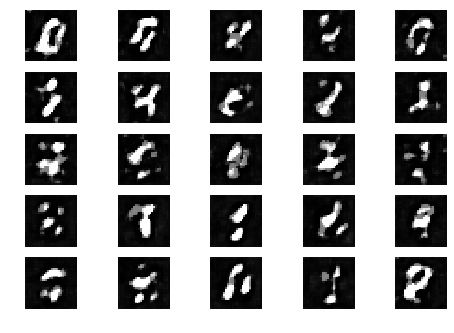

Epoch 0 Batch 205/937 [D loss: 0.472535, acc.: 84.38%] [G loss: 3.128786]
Epoch 0 Batch 206/937 [D loss: 0.858381, acc.: 53.12%] [G loss: 2.442334]
Epoch 0 Batch 207/937 [D loss: 0.530630, acc.: 71.88%] [G loss: 2.592144]
Epoch 0 Batch 208/937 [D loss: 0.331186, acc.: 87.50%] [G loss: 2.349319]
Epoch 0 Batch 209/937 [D loss: 0.483916, acc.: 75.00%] [G loss: 2.454062]
Epoch 0 Batch 210/937 [D loss: 0.754413, acc.: 53.12%] [G loss: 2.011128]
Epoch 0 Batch 211/937 [D loss: 0.561490, acc.: 75.00%] [G loss: 1.897390]
Epoch 0 Batch 212/937 [D loss: 0.610622, acc.: 68.75%] [G loss: 2.739788]
Epoch 0 Batch 213/937 [D loss: 0.472975, acc.: 78.12%] [G loss: 2.820243]
Epoch 0 Batch 214/937 [D loss: 0.963826, acc.: 40.62%] [G loss: 2.645597]
Epoch 0 Batch 215/937 [D loss: 0.449380, acc.: 78.12%] [G loss: 2.420053]
Epoch 0 Batch 216/937 [D loss: 0.370554, acc.: 81.25%] [G loss: 2.342643]
Epoch 0 Batch 217/937 [D loss: 0.279436, acc.: 90.62%] [G loss: 2.622653]
Epoch 0 Batch 218/937 [D loss: 0.63377

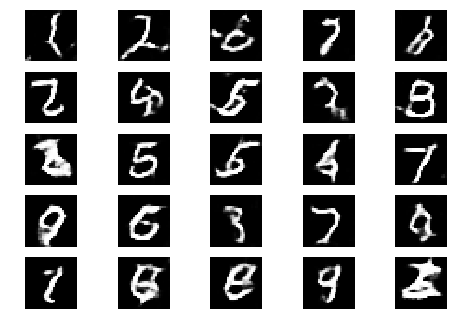

Epoch 0 Batch 301/937 [D loss: 0.844588, acc.: 53.12%] [G loss: 1.306883]
Epoch 0 Batch 302/937 [D loss: 0.951450, acc.: 43.75%] [G loss: 2.280949]
Epoch 0 Batch 303/937 [D loss: 0.744740, acc.: 62.50%] [G loss: 1.704727]


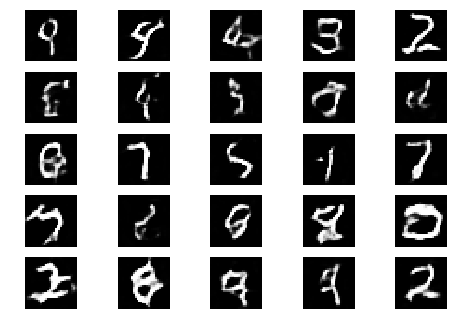

Epoch 0 Batch 304/937 [D loss: 0.711870, acc.: 62.50%] [G loss: 2.081131]
Epoch 0 Batch 305/937 [D loss: 0.528377, acc.: 71.88%] [G loss: 1.806240]
Epoch 0 Batch 306/937 [D loss: 0.659017, acc.: 65.62%] [G loss: 1.648390]


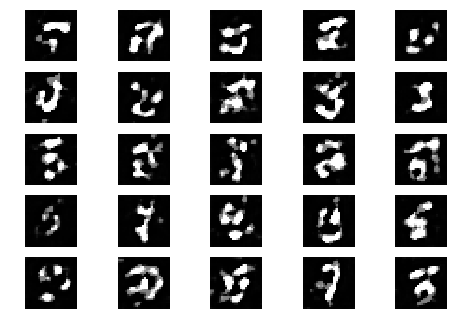

Epoch 0 Batch 307/937 [D loss: 0.436514, acc.: 81.25%] [G loss: 1.899569]
Epoch 0 Batch 308/937 [D loss: 0.665604, acc.: 62.50%] [G loss: 1.737213]
Epoch 0 Batch 309/937 [D loss: 0.412912, acc.: 84.38%] [G loss: 2.382999]
Epoch 0 Batch 310/937 [D loss: 0.567027, acc.: 71.88%] [G loss: 2.297290]
Epoch 0 Batch 311/937 [D loss: 0.812153, acc.: 62.50%] [G loss: 1.429997]
Epoch 0 Batch 312/937 [D loss: 0.409778, acc.: 78.12%] [G loss: 2.348565]
Epoch 0 Batch 313/937 [D loss: 1.135645, acc.: 43.75%] [G loss: 1.128203]
Epoch 0 Batch 314/937 [D loss: 0.587044, acc.: 59.38%] [G loss: 1.892693]
Epoch 0 Batch 315/937 [D loss: 0.701021, acc.: 65.62%] [G loss: 1.859846]
Epoch 0 Batch 316/937 [D loss: 0.702945, acc.: 59.38%] [G loss: 1.630836]
Epoch 0 Batch 317/937 [D loss: 0.979734, acc.: 37.50%] [G loss: 1.361022]
Epoch 0 Batch 318/937 [D loss: 0.381988, acc.: 84.38%] [G loss: 1.754936]
Epoch 0 Batch 319/937 [D loss: 0.856749, acc.: 53.12%] [G loss: 1.506071]
Epoch 0 Batch 320/937 [D loss: 0.49805

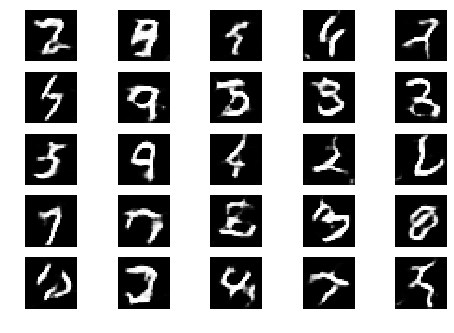

Epoch 0 Batch 401/937 [D loss: 0.417087, acc.: 81.25%] [G loss: 1.639170]
Epoch 0 Batch 402/937 [D loss: 0.727175, acc.: 62.50%] [G loss: 1.465600]
Epoch 0 Batch 403/937 [D loss: 0.290068, acc.: 87.50%] [G loss: 1.767971]
Epoch 0 Batch 404/937 [D loss: 0.938412, acc.: 40.62%] [G loss: 1.921358]


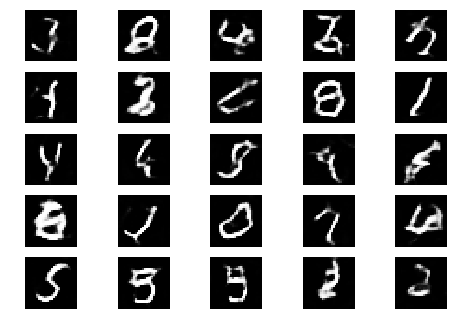

Epoch 0 Batch 405/937 [D loss: 0.519352, acc.: 81.25%] [G loss: 1.895124]
Epoch 0 Batch 406/937 [D loss: 0.623368, acc.: 59.38%] [G loss: 1.586911]
Epoch 0 Batch 407/937 [D loss: 0.657284, acc.: 71.88%] [G loss: 1.630970]
Epoch 0 Batch 408/937 [D loss: 0.587544, acc.: 68.75%] [G loss: 1.750880]


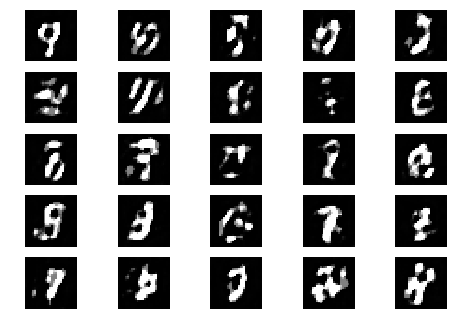

Epoch 0 Batch 409/937 [D loss: 0.534721, acc.: 71.88%] [G loss: 1.668328]
Epoch 0 Batch 410/937 [D loss: 0.612923, acc.: 75.00%] [G loss: 1.489755]
Epoch 0 Batch 411/937 [D loss: 0.589501, acc.: 75.00%] [G loss: 1.772468]
Epoch 0 Batch 412/937 [D loss: 0.916237, acc.: 56.25%] [G loss: 1.301024]
Epoch 0 Batch 413/937 [D loss: 0.874508, acc.: 46.88%] [G loss: 1.586452]
Epoch 0 Batch 414/937 [D loss: 0.321116, acc.: 87.50%] [G loss: 2.170317]
Epoch 0 Batch 415/937 [D loss: 0.762241, acc.: 53.12%] [G loss: 1.861878]
Epoch 0 Batch 416/937 [D loss: 0.429639, acc.: 78.12%] [G loss: 2.613665]
Epoch 0 Batch 417/937 [D loss: 1.236317, acc.: 31.25%] [G loss: 2.091899]
Epoch 0 Batch 418/937 [D loss: 1.297236, acc.: 34.38%] [G loss: 1.383992]
Epoch 0 Batch 419/937 [D loss: 0.423260, acc.: 78.12%] [G loss: 2.181602]
Epoch 0 Batch 420/937 [D loss: 0.471614, acc.: 75.00%] [G loss: 2.225605]
Epoch 0 Batch 421/937 [D loss: 0.702484, acc.: 56.25%] [G loss: 1.224987]
Epoch 0 Batch 422/937 [D loss: 1.04715

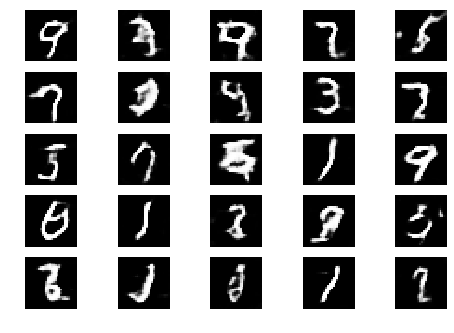

Epoch 0 Batch 501/937 [D loss: 0.491770, acc.: 71.88%] [G loss: 1.142655]
Epoch 0 Batch 502/937 [D loss: 0.767465, acc.: 59.38%] [G loss: 2.167009]
Epoch 0 Batch 503/937 [D loss: 0.432203, acc.: 81.25%] [G loss: 1.891830]
Epoch 0 Batch 504/937 [D loss: 0.601206, acc.: 65.62%] [G loss: 1.696038]
Epoch 0 Batch 505/937 [D loss: 0.994334, acc.: 46.88%] [G loss: 1.502386]


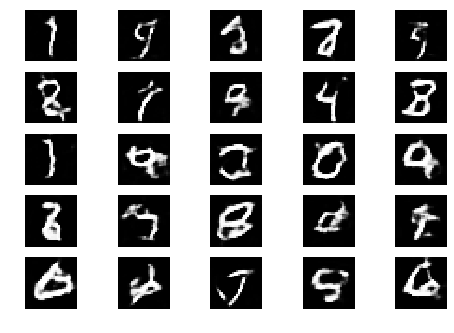

Epoch 0 Batch 506/937 [D loss: 0.473839, acc.: 75.00%] [G loss: 2.204270]
Epoch 0 Batch 507/937 [D loss: 0.885468, acc.: 50.00%] [G loss: 2.170424]
Epoch 0 Batch 508/937 [D loss: 0.535906, acc.: 68.75%] [G loss: 1.725788]
Epoch 0 Batch 509/937 [D loss: 0.845788, acc.: 46.88%] [G loss: 1.329790]
Epoch 0 Batch 510/937 [D loss: 0.435827, acc.: 81.25%] [G loss: 1.766274]


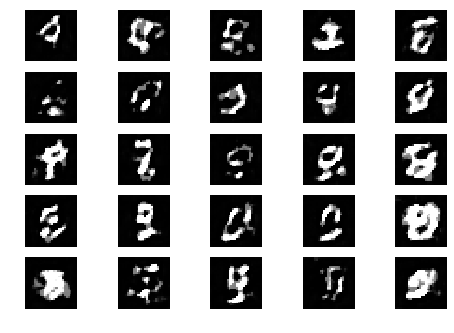

Epoch 0 Batch 511/937 [D loss: 0.471975, acc.: 75.00%] [G loss: 1.929873]
Epoch 0 Batch 512/937 [D loss: 0.594244, acc.: 65.62%] [G loss: 1.980843]
Epoch 0 Batch 513/937 [D loss: 0.648243, acc.: 65.62%] [G loss: 1.787536]
Epoch 0 Batch 514/937 [D loss: 1.128330, acc.: 34.38%] [G loss: 1.780549]
Epoch 0 Batch 515/937 [D loss: 0.598050, acc.: 65.62%] [G loss: 1.852631]
Epoch 0 Batch 516/937 [D loss: 0.544274, acc.: 75.00%] [G loss: 1.522754]
Epoch 0 Batch 517/937 [D loss: 0.785279, acc.: 59.38%] [G loss: 1.565295]
Epoch 0 Batch 518/937 [D loss: 0.478755, acc.: 71.88%] [G loss: 1.515407]
Epoch 0 Batch 519/937 [D loss: 0.793009, acc.: 56.25%] [G loss: 2.114517]
Epoch 0 Batch 520/937 [D loss: 0.522266, acc.: 75.00%] [G loss: 1.752020]
Epoch 0 Batch 521/937 [D loss: 0.478389, acc.: 78.12%] [G loss: 2.224700]
Epoch 0 Batch 522/937 [D loss: 0.525859, acc.: 68.75%] [G loss: 1.485398]
Epoch 0 Batch 523/937 [D loss: 0.688183, acc.: 65.62%] [G loss: 1.437147]
Epoch 0 Batch 524/937 [D loss: 0.88793

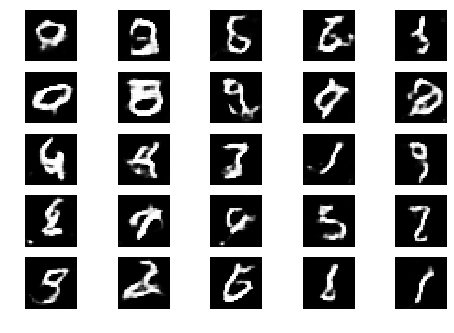

Epoch 0 Batch 601/937 [D loss: 0.702466, acc.: 59.38%] [G loss: 1.460308]
Epoch 0 Batch 602/937 [D loss: 0.682877, acc.: 50.00%] [G loss: 1.504814]
Epoch 0 Batch 603/937 [D loss: 0.597969, acc.: 62.50%] [G loss: 1.827363]
Epoch 0 Batch 604/937 [D loss: 0.530597, acc.: 71.88%] [G loss: 1.608694]
Epoch 0 Batch 605/937 [D loss: 0.745164, acc.: 50.00%] [G loss: 1.940425]
Epoch 0 Batch 606/937 [D loss: 0.683502, acc.: 62.50%] [G loss: 2.334534]


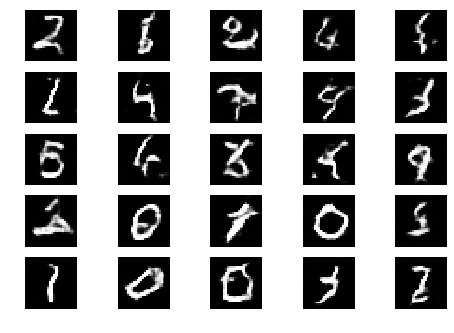

Epoch 0 Batch 607/937 [D loss: 0.593449, acc.: 68.75%] [G loss: 1.820505]
Epoch 0 Batch 608/937 [D loss: 0.355382, acc.: 84.38%] [G loss: 1.850460]
Epoch 0 Batch 609/937 [D loss: 0.478459, acc.: 81.25%] [G loss: 1.819171]
Epoch 0 Batch 610/937 [D loss: 0.491205, acc.: 71.88%] [G loss: 1.461476]
Epoch 0 Batch 611/937 [D loss: 0.602961, acc.: 68.75%] [G loss: 1.532606]
Epoch 0 Batch 612/937 [D loss: 0.691555, acc.: 68.75%] [G loss: 1.877218]


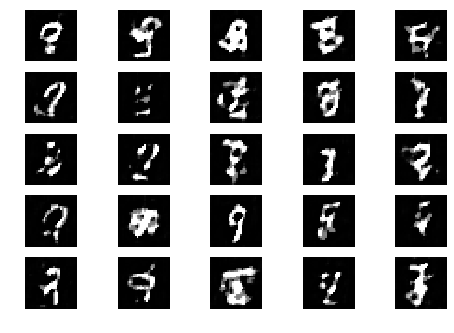

Epoch 0 Batch 613/937 [D loss: 0.532676, acc.: 71.88%] [G loss: 1.884203]
Epoch 0 Batch 614/937 [D loss: 0.536468, acc.: 78.12%] [G loss: 1.437877]
Epoch 0 Batch 615/937 [D loss: 0.756875, acc.: 59.38%] [G loss: 1.468728]
Epoch 0 Batch 616/937 [D loss: 0.596701, acc.: 78.12%] [G loss: 1.446238]
Epoch 0 Batch 617/937 [D loss: 0.476084, acc.: 75.00%] [G loss: 1.603403]
Epoch 0 Batch 618/937 [D loss: 0.588684, acc.: 65.62%] [G loss: 1.639905]
Epoch 0 Batch 619/937 [D loss: 0.558240, acc.: 65.62%] [G loss: 1.983528]
Epoch 0 Batch 620/937 [D loss: 0.660402, acc.: 68.75%] [G loss: 2.767152]
Epoch 0 Batch 621/937 [D loss: 1.008173, acc.: 40.62%] [G loss: 1.671873]
Epoch 0 Batch 622/937 [D loss: 0.757332, acc.: 59.38%] [G loss: 1.628342]
Epoch 0 Batch 623/937 [D loss: 0.518563, acc.: 71.88%] [G loss: 2.200317]
Epoch 0 Batch 624/937 [D loss: 0.739441, acc.: 53.12%] [G loss: 2.062150]
Epoch 0 Batch 625/937 [D loss: 0.443246, acc.: 75.00%] [G loss: 1.806328]
Epoch 0 Batch 626/937 [D loss: 0.69510

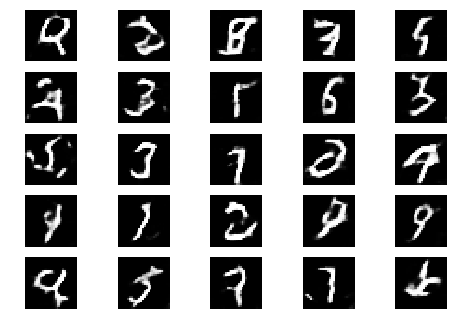

Epoch 0 Batch 701/937 [D loss: 0.703173, acc.: 68.75%] [G loss: 1.398821]
Epoch 0 Batch 702/937 [D loss: 0.785566, acc.: 56.25%] [G loss: 1.639555]
Epoch 0 Batch 703/937 [D loss: 0.334807, acc.: 87.50%] [G loss: 1.892247]
Epoch 0 Batch 704/937 [D loss: 0.778272, acc.: 50.00%] [G loss: 1.879964]
Epoch 0 Batch 705/937 [D loss: 0.521516, acc.: 65.62%] [G loss: 2.104282]
Epoch 0 Batch 706/937 [D loss: 0.858064, acc.: 53.12%] [G loss: 1.722213]
Epoch 0 Batch 707/937 [D loss: 0.960954, acc.: 43.75%] [G loss: 1.169001]


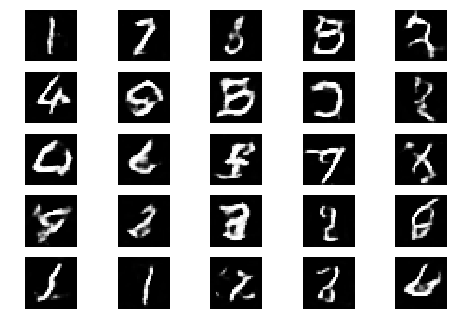

Epoch 0 Batch 708/937 [D loss: 0.245391, acc.: 93.75%] [G loss: 1.738608]
Epoch 0 Batch 709/937 [D loss: 0.393157, acc.: 87.50%] [G loss: 1.691112]
Epoch 0 Batch 710/937 [D loss: 0.482904, acc.: 78.12%] [G loss: 2.198136]
Epoch 0 Batch 711/937 [D loss: 0.679450, acc.: 62.50%] [G loss: 1.546627]
Epoch 0 Batch 712/937 [D loss: 0.467824, acc.: 81.25%] [G loss: 1.806661]
Epoch 0 Batch 713/937 [D loss: 0.760310, acc.: 62.50%] [G loss: 1.715302]
Epoch 0 Batch 714/937 [D loss: 0.444114, acc.: 84.38%] [G loss: 1.869088]


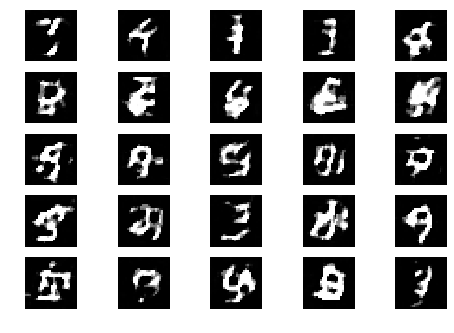

Epoch 0 Batch 715/937 [D loss: 0.649636, acc.: 65.62%] [G loss: 1.938724]
Epoch 0 Batch 716/937 [D loss: 0.646278, acc.: 65.62%] [G loss: 1.340121]
Epoch 0 Batch 717/937 [D loss: 0.589736, acc.: 71.88%] [G loss: 1.340015]
Epoch 0 Batch 718/937 [D loss: 0.703807, acc.: 65.62%] [G loss: 1.504869]
Epoch 0 Batch 719/937 [D loss: 0.665855, acc.: 53.12%] [G loss: 2.466027]
Epoch 0 Batch 720/937 [D loss: 0.790731, acc.: 56.25%] [G loss: 1.749231]
Epoch 0 Batch 721/937 [D loss: 0.500845, acc.: 75.00%] [G loss: 1.199725]
Epoch 0 Batch 722/937 [D loss: 0.571996, acc.: 71.88%] [G loss: 1.662500]
Epoch 0 Batch 723/937 [D loss: 0.782119, acc.: 43.75%] [G loss: 1.609902]
Epoch 0 Batch 724/937 [D loss: 0.723636, acc.: 62.50%] [G loss: 1.498509]
Epoch 0 Batch 725/937 [D loss: 0.721787, acc.: 59.38%] [G loss: 1.175099]
Epoch 0 Batch 726/937 [D loss: 0.412853, acc.: 78.12%] [G loss: 2.265287]
Epoch 0 Batch 727/937 [D loss: 0.428594, acc.: 84.38%] [G loss: 1.289411]
Epoch 0 Batch 728/937 [D loss: 0.49502

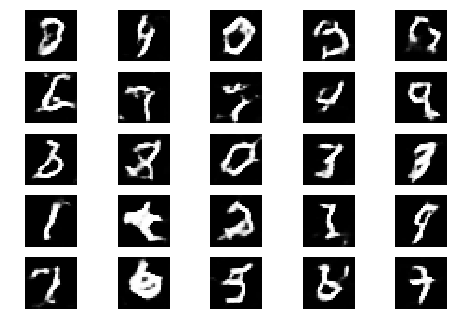

Epoch 0 Batch 801/937 [D loss: 0.743112, acc.: 53.12%] [G loss: 1.175642]
Epoch 0 Batch 802/937 [D loss: 0.420465, acc.: 75.00%] [G loss: 1.030610]
Epoch 0 Batch 803/937 [D loss: 0.667915, acc.: 56.25%] [G loss: 1.087801]
Epoch 0 Batch 804/937 [D loss: 0.851840, acc.: 53.12%] [G loss: 1.163682]
Epoch 0 Batch 805/937 [D loss: 0.606476, acc.: 62.50%] [G loss: 1.683559]
Epoch 0 Batch 806/937 [D loss: 0.660146, acc.: 65.62%] [G loss: 1.856476]
Epoch 0 Batch 807/937 [D loss: 0.429218, acc.: 81.25%] [G loss: 1.332948]
Epoch 0 Batch 808/937 [D loss: 0.486405, acc.: 78.12%] [G loss: 0.797881]


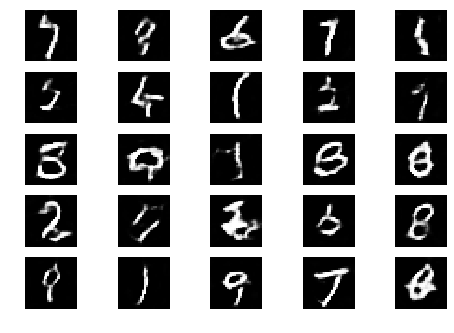

Epoch 0 Batch 809/937 [D loss: 0.726973, acc.: 59.38%] [G loss: 1.960589]
Epoch 0 Batch 810/937 [D loss: 0.431926, acc.: 78.12%] [G loss: 1.546984]
Epoch 0 Batch 811/937 [D loss: 0.869967, acc.: 40.62%] [G loss: 1.674997]
Epoch 0 Batch 812/937 [D loss: 0.668075, acc.: 59.38%] [G loss: 1.659614]
Epoch 0 Batch 813/937 [D loss: 0.465989, acc.: 75.00%] [G loss: 1.642802]
Epoch 0 Batch 814/937 [D loss: 0.669541, acc.: 65.62%] [G loss: 1.261654]
Epoch 0 Batch 815/937 [D loss: 0.757443, acc.: 59.38%] [G loss: 1.215268]
Epoch 0 Batch 816/937 [D loss: 0.417380, acc.: 81.25%] [G loss: 1.440841]


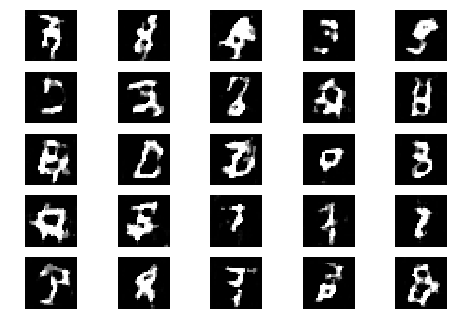

Epoch 0 Batch 817/937 [D loss: 0.731185, acc.: 56.25%] [G loss: 1.534754]
Epoch 0 Batch 818/937 [D loss: 0.529393, acc.: 75.00%] [G loss: 1.741585]
Epoch 0 Batch 819/937 [D loss: 0.598741, acc.: 62.50%] [G loss: 1.867796]
Epoch 0 Batch 820/937 [D loss: 0.880293, acc.: 59.38%] [G loss: 2.058012]
Epoch 0 Batch 821/937 [D loss: 0.866773, acc.: 53.12%] [G loss: 1.203946]
Epoch 0 Batch 822/937 [D loss: 0.648138, acc.: 68.75%] [G loss: 1.398583]
Epoch 0 Batch 823/937 [D loss: 0.880507, acc.: 43.75%] [G loss: 2.394281]
Epoch 0 Batch 824/937 [D loss: 0.674928, acc.: 53.12%] [G loss: 1.809470]
Epoch 0 Batch 825/937 [D loss: 0.518698, acc.: 71.88%] [G loss: 1.409452]
Epoch 0 Batch 826/937 [D loss: 0.672122, acc.: 53.12%] [G loss: 1.185106]
Epoch 0 Batch 827/937 [D loss: 1.044921, acc.: 40.62%] [G loss: 0.872500]
Epoch 0 Batch 828/937 [D loss: 0.574353, acc.: 65.62%] [G loss: 1.478935]
Epoch 0 Batch 829/937 [D loss: 0.658561, acc.: 62.50%] [G loss: 1.885039]
Epoch 0 Batch 830/937 [D loss: 0.49489

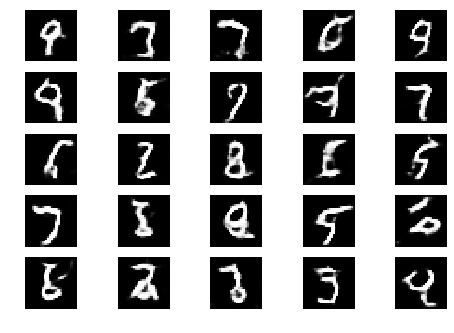

Epoch 0 Batch 901/937 [D loss: 0.660306, acc.: 65.62%] [G loss: 1.441368]
Epoch 0 Batch 902/937 [D loss: 0.458920, acc.: 71.88%] [G loss: 1.438859]
Epoch 0 Batch 903/937 [D loss: 0.812873, acc.: 46.88%] [G loss: 1.366033]
Epoch 0 Batch 904/937 [D loss: 0.754812, acc.: 50.00%] [G loss: 1.709086]
Epoch 0 Batch 905/937 [D loss: 0.401428, acc.: 78.12%] [G loss: 1.523557]
Epoch 0 Batch 906/937 [D loss: 0.725231, acc.: 65.62%] [G loss: 1.226568]
Epoch 0 Batch 907/937 [D loss: 0.401937, acc.: 81.25%] [G loss: 1.252724]
Epoch 0 Batch 908/937 [D loss: 0.502608, acc.: 71.88%] [G loss: 1.703652]
Epoch 0 Batch 909/937 [D loss: 0.522541, acc.: 75.00%] [G loss: 1.132644]


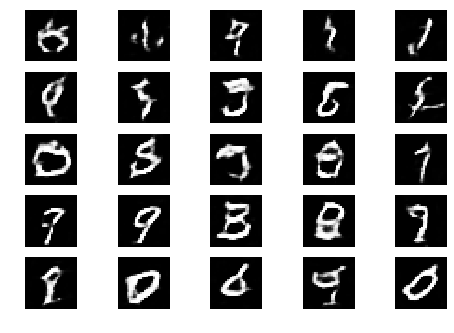

Epoch 0 Batch 910/937 [D loss: 0.677508, acc.: 71.88%] [G loss: 1.462487]
Epoch 0 Batch 911/937 [D loss: 0.770331, acc.: 53.12%] [G loss: 1.013188]
Epoch 0 Batch 912/937 [D loss: 0.812277, acc.: 46.88%] [G loss: 1.043712]
Epoch 0 Batch 913/937 [D loss: 0.501166, acc.: 78.12%] [G loss: 1.348879]
Epoch 0 Batch 914/937 [D loss: 0.421619, acc.: 75.00%] [G loss: 1.256417]
Epoch 0 Batch 915/937 [D loss: 0.459134, acc.: 75.00%] [G loss: 1.287875]
Epoch 0 Batch 916/937 [D loss: 0.356635, acc.: 84.38%] [G loss: 1.900451]
Epoch 0 Batch 917/937 [D loss: 0.601239, acc.: 68.75%] [G loss: 1.347273]
Epoch 0 Batch 918/937 [D loss: 0.535173, acc.: 75.00%] [G loss: 1.956175]


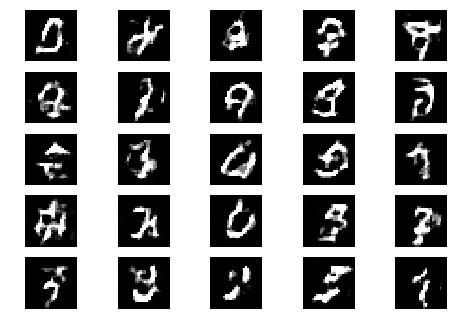

Epoch 0 Batch 919/937 [D loss: 0.769448, acc.: 43.75%] [G loss: 1.313211]
Epoch 0 Batch 920/937 [D loss: 0.501513, acc.: 75.00%] [G loss: 1.728944]
Epoch 0 Batch 921/937 [D loss: 0.432544, acc.: 87.50%] [G loss: 1.702173]
Epoch 0 Batch 922/937 [D loss: 0.563379, acc.: 71.88%] [G loss: 1.329116]
Epoch 0 Batch 923/937 [D loss: 0.737437, acc.: 53.12%] [G loss: 1.083590]
Epoch 0 Batch 924/937 [D loss: 0.591878, acc.: 75.00%] [G loss: 1.219477]
Epoch 0 Batch 925/937 [D loss: 0.802906, acc.: 53.12%] [G loss: 1.241404]
Epoch 0 Batch 926/937 [D loss: 0.627552, acc.: 62.50%] [G loss: 1.064672]
Epoch 0 Batch 927/937 [D loss: 0.665879, acc.: 65.62%] [G loss: 1.313625]
Epoch 0 Batch 928/937 [D loss: 0.688196, acc.: 59.38%] [G loss: 0.960921]
Epoch 0 Batch 929/937 [D loss: 0.761876, acc.: 50.00%] [G loss: 1.614633]
Epoch 0 Batch 930/937 [D loss: 0.554327, acc.: 75.00%] [G loss: 1.618508]
Epoch 0 Batch 931/937 [D loss: 0.626472, acc.: 65.62%] [G loss: 1.201527]
Epoch 0 Batch 932/937 [D loss: 0.72048

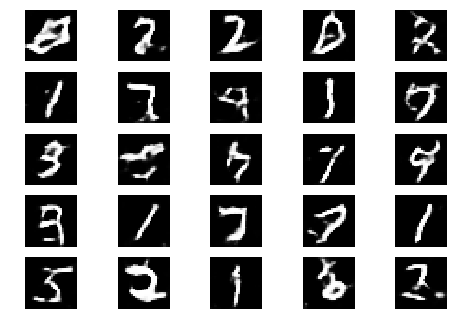

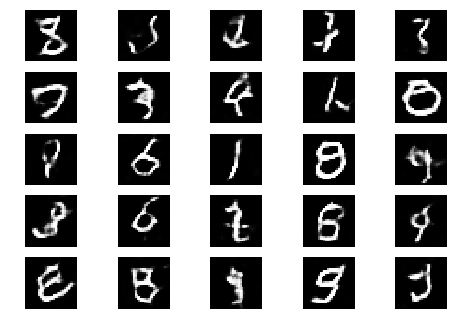

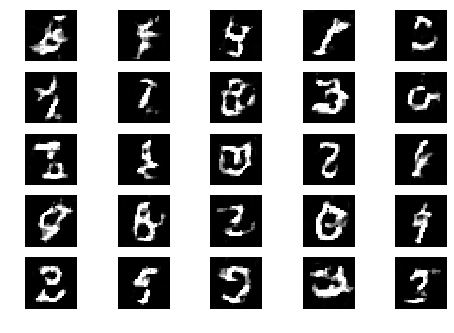

Epoch 1 Batch 1/937 [D loss: 1.099623, acc.: 28.12%] [G loss: 1.479689]
Epoch 1 Batch 2/937 [D loss: 0.739435, acc.: 59.38%] [G loss: 1.492066]
Epoch 1 Batch 3/937 [D loss: 0.700641, acc.: 56.25%] [G loss: 1.043984]
Epoch 1 Batch 4/937 [D loss: 0.611588, acc.: 59.38%] [G loss: 1.224346]
Epoch 1 Batch 5/937 [D loss: 0.932393, acc.: 43.75%] [G loss: 1.603295]
Epoch 1 Batch 6/937 [D loss: 0.687440, acc.: 59.38%] [G loss: 1.461462]
Epoch 1 Batch 7/937 [D loss: 0.627207, acc.: 68.75%] [G loss: 1.296869]
Epoch 1 Batch 8/937 [D loss: 0.478845, acc.: 78.12%] [G loss: 0.977906]
Epoch 1 Batch 9/937 [D loss: 0.619710, acc.: 68.75%] [G loss: 1.248723]
Epoch 1 Batch 10/937 [D loss: 0.846232, acc.: 43.75%] [G loss: 1.721153]
Epoch 1 Batch 11/937 [D loss: 0.476572, acc.: 78.12%] [G loss: 1.719367]
Epoch 1 Batch 12/937 [D loss: 0.875625, acc.: 53.12%] [G loss: 1.344024]
Epoch 1 Batch 13/937 [D loss: 0.518148, acc.: 81.25%] [G loss: 1.735623]
Epoch 1 Batch 14/937 [D loss: 0.484024, acc.: 78.12%] [G los

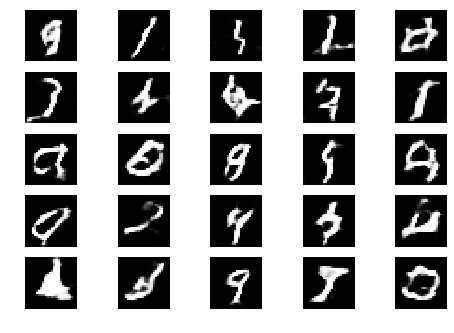

Epoch 1 Batch 101/937 [D loss: 0.777865, acc.: 59.38%] [G loss: 1.293580]


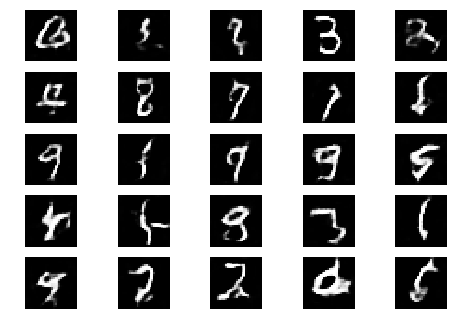

Epoch 1 Batch 102/937 [D loss: 0.562770, acc.: 68.75%] [G loss: 1.288747]


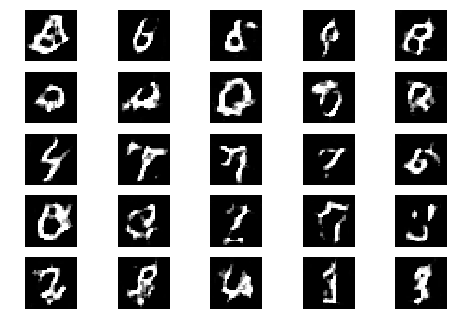

Epoch 1 Batch 103/937 [D loss: 0.886414, acc.: 37.50%] [G loss: 0.864503]
Epoch 1 Batch 104/937 [D loss: 0.915569, acc.: 40.62%] [G loss: 0.929366]
Epoch 1 Batch 105/937 [D loss: 0.598486, acc.: 75.00%] [G loss: 1.771724]
Epoch 1 Batch 106/937 [D loss: 0.608489, acc.: 65.62%] [G loss: 1.660717]
Epoch 1 Batch 107/937 [D loss: 0.654312, acc.: 65.62%] [G loss: 1.381047]
Epoch 1 Batch 108/937 [D loss: 0.689343, acc.: 50.00%] [G loss: 1.338326]
Epoch 1 Batch 109/937 [D loss: 0.723455, acc.: 56.25%] [G loss: 1.184876]
Epoch 1 Batch 110/937 [D loss: 0.651694, acc.: 62.50%] [G loss: 1.270580]
Epoch 1 Batch 111/937 [D loss: 0.479231, acc.: 81.25%] [G loss: 1.463038]
Epoch 1 Batch 112/937 [D loss: 0.698667, acc.: 62.50%] [G loss: 0.940039]
Epoch 1 Batch 113/937 [D loss: 0.818013, acc.: 50.00%] [G loss: 1.099909]
Epoch 1 Batch 114/937 [D loss: 0.722739, acc.: 65.62%] [G loss: 1.171905]
Epoch 1 Batch 115/937 [D loss: 0.453110, acc.: 84.38%] [G loss: 1.453369]
Epoch 1 Batch 116/937 [D loss: 0.61358

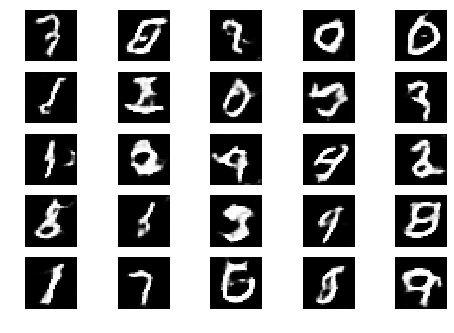

Epoch 1 Batch 201/937 [D loss: 0.822824, acc.: 62.50%] [G loss: 0.991065]
Epoch 1 Batch 202/937 [D loss: 0.701187, acc.: 62.50%] [G loss: 1.180142]


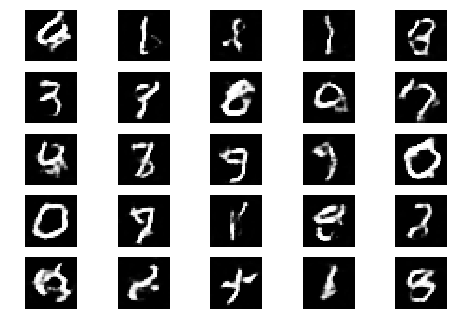

Epoch 1 Batch 203/937 [D loss: 0.467707, acc.: 84.38%] [G loss: 1.800283]
Epoch 1 Batch 204/937 [D loss: 0.760540, acc.: 53.12%] [G loss: 1.373942]


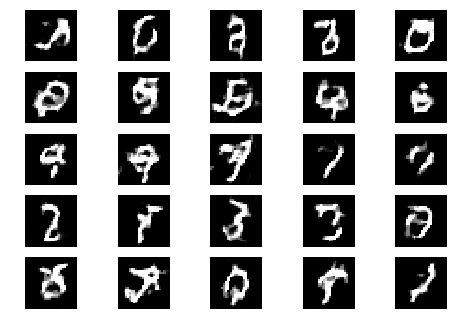

Epoch 1 Batch 205/937 [D loss: 0.723641, acc.: 56.25%] [G loss: 1.657294]
Epoch 1 Batch 206/937 [D loss: 0.434372, acc.: 84.38%] [G loss: 1.299735]
Epoch 1 Batch 207/937 [D loss: 0.632242, acc.: 59.38%] [G loss: 1.723129]
Epoch 1 Batch 208/937 [D loss: 0.784127, acc.: 43.75%] [G loss: 1.197320]
Epoch 1 Batch 209/937 [D loss: 0.586663, acc.: 68.75%] [G loss: 1.168265]
Epoch 1 Batch 210/937 [D loss: 0.934237, acc.: 46.88%] [G loss: 1.085050]
Epoch 1 Batch 211/937 [D loss: 0.487716, acc.: 78.12%] [G loss: 1.070580]
Epoch 1 Batch 212/937 [D loss: 0.680235, acc.: 68.75%] [G loss: 1.683623]
Epoch 1 Batch 213/937 [D loss: 0.649956, acc.: 71.88%] [G loss: 1.486174]
Epoch 1 Batch 214/937 [D loss: 0.493343, acc.: 71.88%] [G loss: 1.518024]
Epoch 1 Batch 215/937 [D loss: 0.628743, acc.: 65.62%] [G loss: 1.185275]
Epoch 1 Batch 216/937 [D loss: 0.641751, acc.: 65.62%] [G loss: 1.251703]
Epoch 1 Batch 217/937 [D loss: 0.682423, acc.: 53.12%] [G loss: 0.975961]
Epoch 1 Batch 218/937 [D loss: 0.38919

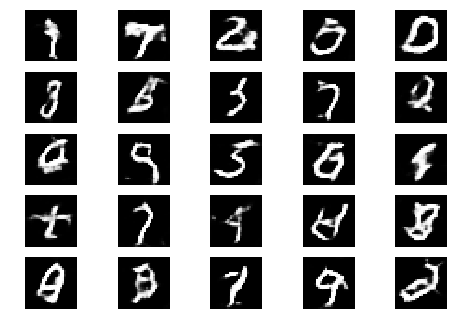

Epoch 1 Batch 301/937 [D loss: 0.432476, acc.: 81.25%] [G loss: 1.259401]
Epoch 1 Batch 302/937 [D loss: 0.448456, acc.: 81.25%] [G loss: 1.041115]
Epoch 1 Batch 303/937 [D loss: 0.489608, acc.: 75.00%] [G loss: 1.285697]


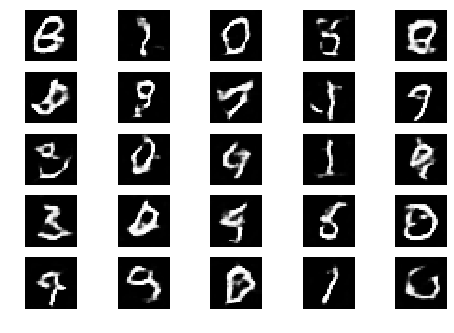

Epoch 1 Batch 304/937 [D loss: 0.741357, acc.: 59.38%] [G loss: 0.965601]
Epoch 1 Batch 305/937 [D loss: 0.720348, acc.: 62.50%] [G loss: 1.245603]
Epoch 1 Batch 306/937 [D loss: 0.555247, acc.: 71.88%] [G loss: 1.367567]


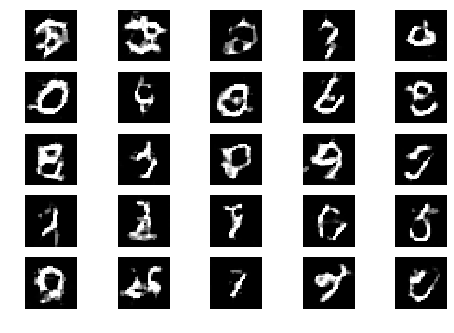

Epoch 1 Batch 307/937 [D loss: 0.515233, acc.: 78.12%] [G loss: 0.969167]
Epoch 1 Batch 308/937 [D loss: 0.566529, acc.: 71.88%] [G loss: 1.119991]
Epoch 1 Batch 309/937 [D loss: 0.701929, acc.: 59.38%] [G loss: 1.198987]
Epoch 1 Batch 310/937 [D loss: 0.768157, acc.: 56.25%] [G loss: 0.827041]
Epoch 1 Batch 311/937 [D loss: 0.629872, acc.: 65.62%] [G loss: 1.263685]
Epoch 1 Batch 312/937 [D loss: 0.626949, acc.: 68.75%] [G loss: 1.365150]
Epoch 1 Batch 313/937 [D loss: 0.782707, acc.: 53.12%] [G loss: 0.936790]
Epoch 1 Batch 314/937 [D loss: 0.843947, acc.: 50.00%] [G loss: 0.913018]
Epoch 1 Batch 315/937 [D loss: 0.648402, acc.: 62.50%] [G loss: 1.203093]
Epoch 1 Batch 316/937 [D loss: 0.607092, acc.: 68.75%] [G loss: 1.111800]
Epoch 1 Batch 317/937 [D loss: 0.822368, acc.: 43.75%] [G loss: 1.113635]
Epoch 1 Batch 318/937 [D loss: 0.616880, acc.: 65.62%] [G loss: 0.751427]
Epoch 1 Batch 319/937 [D loss: 0.596706, acc.: 68.75%] [G loss: 1.064604]
Epoch 1 Batch 320/937 [D loss: 0.58993

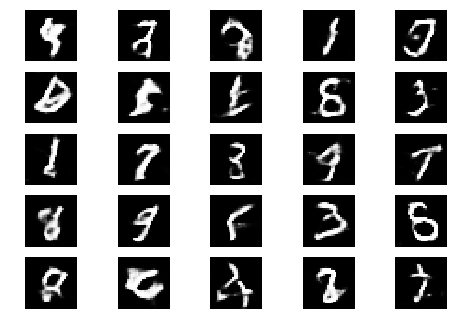

Epoch 1 Batch 401/937 [D loss: 0.732461, acc.: 56.25%] [G loss: 0.868147]
Epoch 1 Batch 402/937 [D loss: 0.586593, acc.: 75.00%] [G loss: 1.348872]
Epoch 1 Batch 403/937 [D loss: 0.717785, acc.: 53.12%] [G loss: 1.110377]
Epoch 1 Batch 404/937 [D loss: 0.643917, acc.: 56.25%] [G loss: 1.288249]


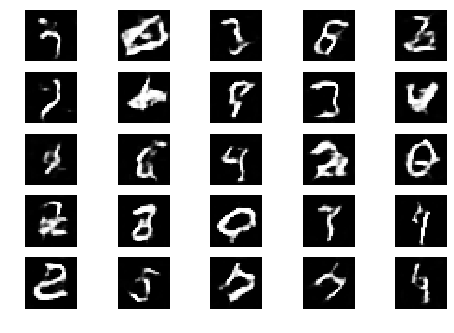

Epoch 1 Batch 405/937 [D loss: 0.827368, acc.: 59.38%] [G loss: 1.175715]
Epoch 1 Batch 406/937 [D loss: 0.636870, acc.: 53.12%] [G loss: 1.144275]
Epoch 1 Batch 407/937 [D loss: 0.509870, acc.: 81.25%] [G loss: 0.956474]
Epoch 1 Batch 408/937 [D loss: 0.740164, acc.: 56.25%] [G loss: 1.342650]


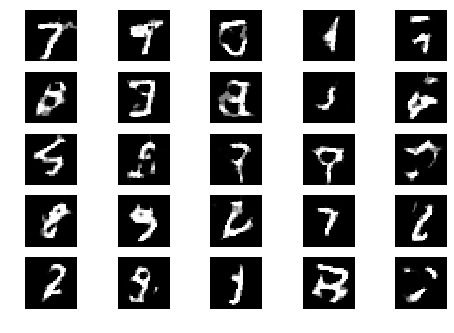

Epoch 1 Batch 409/937 [D loss: 0.546625, acc.: 65.62%] [G loss: 1.208410]
Epoch 1 Batch 410/937 [D loss: 0.771356, acc.: 53.12%] [G loss: 1.374292]
Epoch 1 Batch 411/937 [D loss: 0.656233, acc.: 50.00%] [G loss: 1.153283]
Epoch 1 Batch 412/937 [D loss: 0.736022, acc.: 43.75%] [G loss: 1.426378]
Epoch 1 Batch 413/937 [D loss: 0.808945, acc.: 46.88%] [G loss: 1.175965]
Epoch 1 Batch 414/937 [D loss: 0.591926, acc.: 65.62%] [G loss: 1.045429]
Epoch 1 Batch 415/937 [D loss: 0.554880, acc.: 68.75%] [G loss: 1.134494]
Epoch 1 Batch 416/937 [D loss: 0.555213, acc.: 65.62%] [G loss: 0.794724]
Epoch 1 Batch 417/937 [D loss: 1.008626, acc.: 40.62%] [G loss: 0.936761]
Epoch 1 Batch 418/937 [D loss: 0.620036, acc.: 65.62%] [G loss: 1.336439]
Epoch 1 Batch 419/937 [D loss: 0.702538, acc.: 62.50%] [G loss: 1.135213]
Epoch 1 Batch 420/937 [D loss: 0.739594, acc.: 62.50%] [G loss: 1.279278]
Epoch 1 Batch 421/937 [D loss: 0.825339, acc.: 50.00%] [G loss: 1.161328]
Epoch 1 Batch 422/937 [D loss: 0.50427

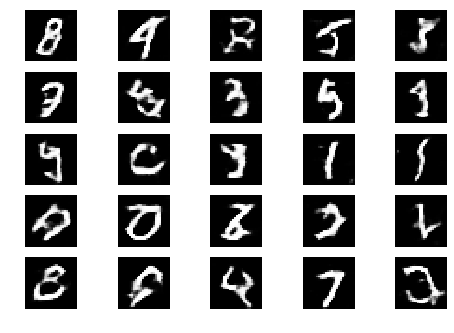

Epoch 1 Batch 501/937 [D loss: 0.702038, acc.: 50.00%] [G loss: 1.161824]
Epoch 1 Batch 502/937 [D loss: 0.461589, acc.: 81.25%] [G loss: 1.423176]
Epoch 1 Batch 503/937 [D loss: 0.794653, acc.: 50.00%] [G loss: 1.180976]
Epoch 1 Batch 504/937 [D loss: 0.642724, acc.: 56.25%] [G loss: 1.517444]
Epoch 1 Batch 505/937 [D loss: 0.810190, acc.: 50.00%] [G loss: 1.259491]


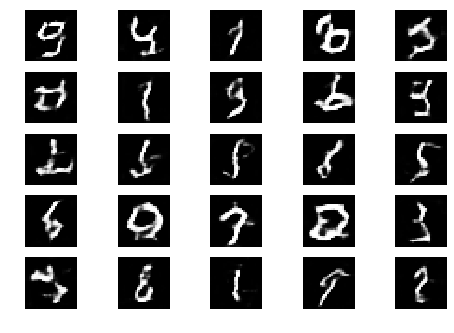

Epoch 1 Batch 506/937 [D loss: 0.592912, acc.: 65.62%] [G loss: 1.296746]
Epoch 1 Batch 507/937 [D loss: 0.816308, acc.: 53.12%] [G loss: 1.225332]
Epoch 1 Batch 508/937 [D loss: 0.764500, acc.: 59.38%] [G loss: 1.290968]
Epoch 1 Batch 509/937 [D loss: 0.863522, acc.: 40.62%] [G loss: 1.110228]
Epoch 1 Batch 510/937 [D loss: 0.803191, acc.: 50.00%] [G loss: 1.070531]


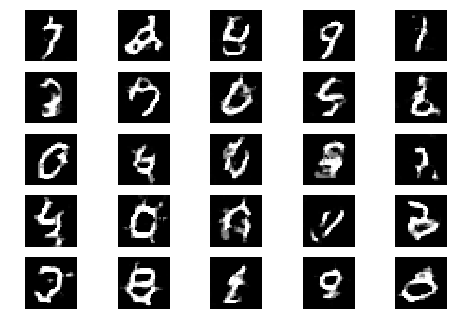

Epoch 1 Batch 511/937 [D loss: 0.620575, acc.: 65.62%] [G loss: 1.430198]
Epoch 1 Batch 512/937 [D loss: 0.873284, acc.: 43.75%] [G loss: 1.422773]
Epoch 1 Batch 513/937 [D loss: 0.743894, acc.: 59.38%] [G loss: 1.288955]
Epoch 1 Batch 514/937 [D loss: 0.536977, acc.: 75.00%] [G loss: 1.514865]
Epoch 1 Batch 515/937 [D loss: 0.675429, acc.: 59.38%] [G loss: 1.185147]
Epoch 1 Batch 516/937 [D loss: 0.729766, acc.: 53.12%] [G loss: 1.022286]
Epoch 1 Batch 517/937 [D loss: 0.689551, acc.: 62.50%] [G loss: 0.975451]
Epoch 1 Batch 518/937 [D loss: 0.650822, acc.: 59.38%] [G loss: 1.282517]
Epoch 1 Batch 519/937 [D loss: 0.718945, acc.: 62.50%] [G loss: 1.220879]
Epoch 1 Batch 520/937 [D loss: 0.723572, acc.: 59.38%] [G loss: 0.978228]
Epoch 1 Batch 521/937 [D loss: 0.579391, acc.: 78.12%] [G loss: 1.322371]
Epoch 1 Batch 522/937 [D loss: 0.766981, acc.: 50.00%] [G loss: 1.401797]
Epoch 1 Batch 523/937 [D loss: 0.701419, acc.: 53.12%] [G loss: 1.075383]
Epoch 1 Batch 524/937 [D loss: 0.72955

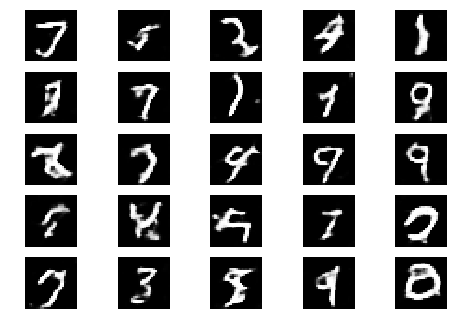

Epoch 1 Batch 601/937 [D loss: 0.867596, acc.: 40.62%] [G loss: 1.165439]
Epoch 1 Batch 602/937 [D loss: 0.561041, acc.: 62.50%] [G loss: 1.558576]
Epoch 1 Batch 603/937 [D loss: 0.672622, acc.: 59.38%] [G loss: 1.154965]
Epoch 1 Batch 604/937 [D loss: 0.835024, acc.: 53.12%] [G loss: 1.112650]
Epoch 1 Batch 605/937 [D loss: 0.568113, acc.: 78.12%] [G loss: 0.907790]
Epoch 1 Batch 606/937 [D loss: 0.712125, acc.: 53.12%] [G loss: 1.306034]


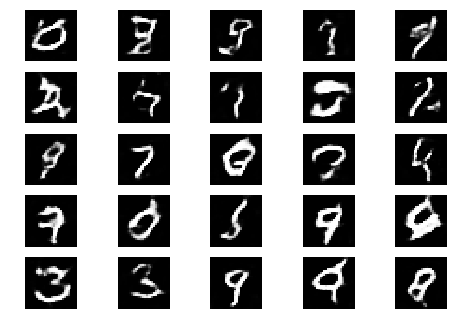

Epoch 1 Batch 607/937 [D loss: 0.651905, acc.: 68.75%] [G loss: 1.214706]
Epoch 1 Batch 608/937 [D loss: 0.811551, acc.: 59.38%] [G loss: 1.151845]
Epoch 1 Batch 609/937 [D loss: 0.478675, acc.: 84.38%] [G loss: 1.458887]
Epoch 1 Batch 610/937 [D loss: 0.677175, acc.: 65.62%] [G loss: 1.090880]
Epoch 1 Batch 611/937 [D loss: 0.597850, acc.: 81.25%] [G loss: 0.989619]
Epoch 1 Batch 612/937 [D loss: 0.389512, acc.: 93.75%] [G loss: 1.220349]


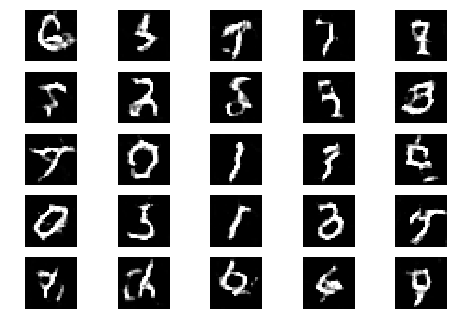

Epoch 1 Batch 613/937 [D loss: 0.625135, acc.: 65.62%] [G loss: 0.832016]
Epoch 1 Batch 614/937 [D loss: 0.828914, acc.: 43.75%] [G loss: 0.936855]
Epoch 1 Batch 615/937 [D loss: 0.565871, acc.: 81.25%] [G loss: 1.151609]
Epoch 1 Batch 616/937 [D loss: 0.754556, acc.: 59.38%] [G loss: 1.302996]
Epoch 1 Batch 617/937 [D loss: 0.557589, acc.: 71.88%] [G loss: 1.199867]
Epoch 1 Batch 618/937 [D loss: 0.668325, acc.: 68.75%] [G loss: 0.928871]
Epoch 1 Batch 619/937 [D loss: 0.437717, acc.: 78.12%] [G loss: 0.911252]
Epoch 1 Batch 620/937 [D loss: 0.631489, acc.: 62.50%] [G loss: 1.132256]
Epoch 1 Batch 621/937 [D loss: 0.951224, acc.: 40.62%] [G loss: 1.108232]
Epoch 1 Batch 622/937 [D loss: 0.633349, acc.: 59.38%] [G loss: 1.366538]
Epoch 1 Batch 623/937 [D loss: 0.743437, acc.: 46.88%] [G loss: 1.144405]
Epoch 1 Batch 624/937 [D loss: 0.680279, acc.: 62.50%] [G loss: 0.881231]
Epoch 1 Batch 625/937 [D loss: 0.656743, acc.: 62.50%] [G loss: 0.952091]
Epoch 1 Batch 626/937 [D loss: 1.04069

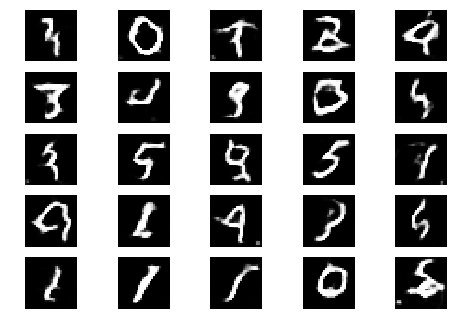

Epoch 1 Batch 701/937 [D loss: 0.777859, acc.: 50.00%] [G loss: 1.300326]
Epoch 1 Batch 702/937 [D loss: 0.620908, acc.: 68.75%] [G loss: 1.414918]
Epoch 1 Batch 703/937 [D loss: 0.886254, acc.: 43.75%] [G loss: 1.494623]
Epoch 1 Batch 704/937 [D loss: 0.599851, acc.: 65.62%] [G loss: 1.304669]
Epoch 1 Batch 705/937 [D loss: 0.575842, acc.: 65.62%] [G loss: 1.207716]
Epoch 1 Batch 706/937 [D loss: 0.863616, acc.: 40.62%] [G loss: 1.019452]
Epoch 1 Batch 707/937 [D loss: 0.763202, acc.: 56.25%] [G loss: 1.030529]


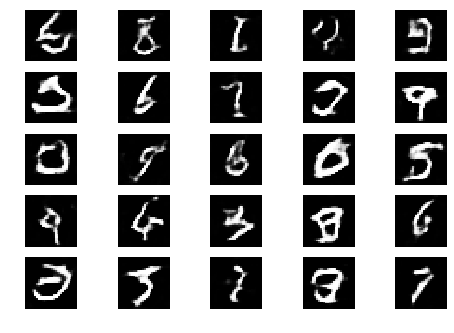

Epoch 1 Batch 708/937 [D loss: 0.687368, acc.: 59.38%] [G loss: 1.330193]
Epoch 1 Batch 709/937 [D loss: 0.552498, acc.: 71.88%] [G loss: 1.414200]
Epoch 1 Batch 710/937 [D loss: 0.743059, acc.: 56.25%] [G loss: 1.196687]
Epoch 1 Batch 711/937 [D loss: 0.715270, acc.: 56.25%] [G loss: 1.242686]
Epoch 1 Batch 712/937 [D loss: 0.595252, acc.: 71.88%] [G loss: 1.016821]
Epoch 1 Batch 713/937 [D loss: 0.596912, acc.: 68.75%] [G loss: 1.168751]
Epoch 1 Batch 714/937 [D loss: 0.915597, acc.: 46.88%] [G loss: 0.968811]


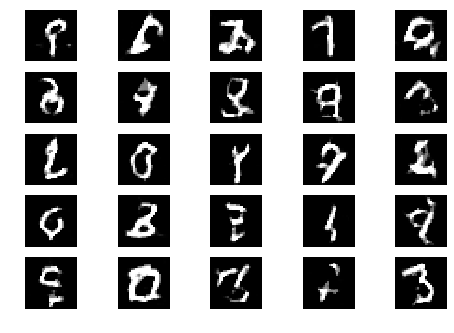

Epoch 1 Batch 715/937 [D loss: 0.677006, acc.: 53.12%] [G loss: 1.152231]
Epoch 1 Batch 716/937 [D loss: 0.639389, acc.: 56.25%] [G loss: 1.183322]
Epoch 1 Batch 717/937 [D loss: 0.835510, acc.: 53.12%] [G loss: 1.034550]
Epoch 1 Batch 718/937 [D loss: 0.431381, acc.: 87.50%] [G loss: 1.035030]
Epoch 1 Batch 719/937 [D loss: 0.553568, acc.: 75.00%] [G loss: 1.161098]
Epoch 1 Batch 720/937 [D loss: 0.746015, acc.: 53.12%] [G loss: 1.206151]
Epoch 1 Batch 721/937 [D loss: 0.539179, acc.: 81.25%] [G loss: 0.838444]
Epoch 1 Batch 722/937 [D loss: 0.594051, acc.: 68.75%] [G loss: 1.080920]
Epoch 1 Batch 723/937 [D loss: 0.610847, acc.: 65.62%] [G loss: 1.265361]
Epoch 1 Batch 724/937 [D loss: 0.640539, acc.: 53.12%] [G loss: 1.347105]
Epoch 1 Batch 725/937 [D loss: 0.801029, acc.: 53.12%] [G loss: 1.294251]
Epoch 1 Batch 726/937 [D loss: 0.430821, acc.: 84.38%] [G loss: 1.228709]
Epoch 1 Batch 727/937 [D loss: 0.475318, acc.: 71.88%] [G loss: 0.946710]
Epoch 1 Batch 728/937 [D loss: 0.80546

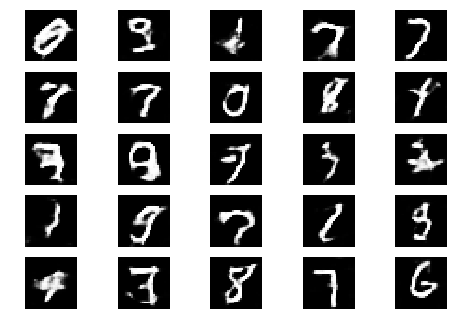

Epoch 1 Batch 801/937 [D loss: 0.854994, acc.: 40.62%] [G loss: 1.317468]
Epoch 1 Batch 802/937 [D loss: 0.483242, acc.: 84.38%] [G loss: 1.287769]
Epoch 1 Batch 803/937 [D loss: 0.616783, acc.: 62.50%] [G loss: 1.548183]
Epoch 1 Batch 804/937 [D loss: 0.576057, acc.: 68.75%] [G loss: 1.561984]
Epoch 1 Batch 805/937 [D loss: 0.635901, acc.: 65.62%] [G loss: 1.223906]
Epoch 1 Batch 806/937 [D loss: 0.512189, acc.: 78.12%] [G loss: 1.074780]
Epoch 1 Batch 807/937 [D loss: 0.732192, acc.: 59.38%] [G loss: 1.185398]
Epoch 1 Batch 808/937 [D loss: 0.578895, acc.: 71.88%] [G loss: 0.936188]


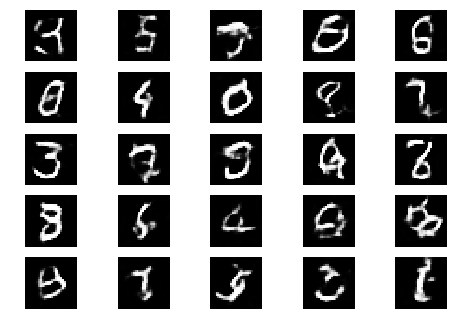

Epoch 1 Batch 809/937 [D loss: 0.824596, acc.: 40.62%] [G loss: 1.261604]
Epoch 1 Batch 810/937 [D loss: 0.574511, acc.: 71.88%] [G loss: 1.371646]
Epoch 1 Batch 811/937 [D loss: 0.911658, acc.: 40.62%] [G loss: 1.180669]
Epoch 1 Batch 812/937 [D loss: 0.777952, acc.: 43.75%] [G loss: 1.065827]
Epoch 1 Batch 813/937 [D loss: 0.726008, acc.: 56.25%] [G loss: 1.216017]
Epoch 1 Batch 814/937 [D loss: 0.970455, acc.: 28.12%] [G loss: 1.003343]
Epoch 1 Batch 815/937 [D loss: 0.682336, acc.: 65.62%] [G loss: 0.766294]
Epoch 1 Batch 816/937 [D loss: 0.663949, acc.: 59.38%] [G loss: 1.095352]


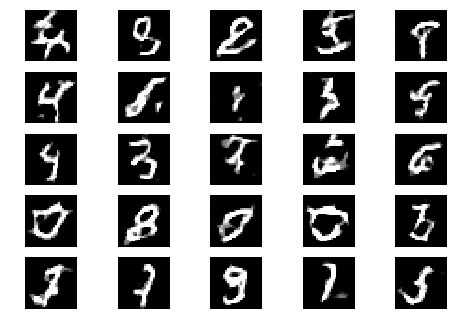

Epoch 1 Batch 817/937 [D loss: 0.604355, acc.: 59.38%] [G loss: 1.315569]
Epoch 1 Batch 818/937 [D loss: 0.713196, acc.: 40.62%] [G loss: 0.970198]
Epoch 1 Batch 819/937 [D loss: 0.737318, acc.: 62.50%] [G loss: 1.256648]
Epoch 1 Batch 820/937 [D loss: 0.501055, acc.: 75.00%] [G loss: 1.069072]
Epoch 1 Batch 821/937 [D loss: 0.662395, acc.: 65.62%] [G loss: 0.950738]
Epoch 1 Batch 822/937 [D loss: 0.759967, acc.: 53.12%] [G loss: 0.928347]
Epoch 1 Batch 823/937 [D loss: 0.659858, acc.: 62.50%] [G loss: 1.087825]
Epoch 1 Batch 824/937 [D loss: 0.668124, acc.: 65.62%] [G loss: 0.771730]
Epoch 1 Batch 825/937 [D loss: 0.623076, acc.: 75.00%] [G loss: 0.844750]
Epoch 1 Batch 826/937 [D loss: 0.574467, acc.: 71.88%] [G loss: 1.468610]
Epoch 1 Batch 827/937 [D loss: 0.585850, acc.: 65.62%] [G loss: 1.055211]
Epoch 1 Batch 828/937 [D loss: 0.624734, acc.: 59.38%] [G loss: 1.139637]
Epoch 1 Batch 829/937 [D loss: 0.619980, acc.: 65.62%] [G loss: 1.281618]
Epoch 1 Batch 830/937 [D loss: 0.60584

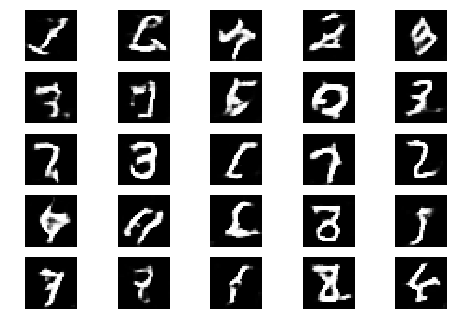

Epoch 1 Batch 901/937 [D loss: 0.706921, acc.: 53.12%] [G loss: 1.157211]
Epoch 1 Batch 902/937 [D loss: 0.579161, acc.: 65.62%] [G loss: 1.222916]
Epoch 1 Batch 903/937 [D loss: 0.575763, acc.: 68.75%] [G loss: 1.114634]
Epoch 1 Batch 904/937 [D loss: 0.742517, acc.: 59.38%] [G loss: 1.347330]
Epoch 1 Batch 905/937 [D loss: 0.590246, acc.: 68.75%] [G loss: 1.268252]
Epoch 1 Batch 906/937 [D loss: 0.549323, acc.: 62.50%] [G loss: 1.047050]
Epoch 1 Batch 907/937 [D loss: 0.542709, acc.: 71.88%] [G loss: 1.177667]
Epoch 1 Batch 908/937 [D loss: 0.737099, acc.: 62.50%] [G loss: 1.013615]
Epoch 1 Batch 909/937 [D loss: 0.567160, acc.: 71.88%] [G loss: 1.088802]


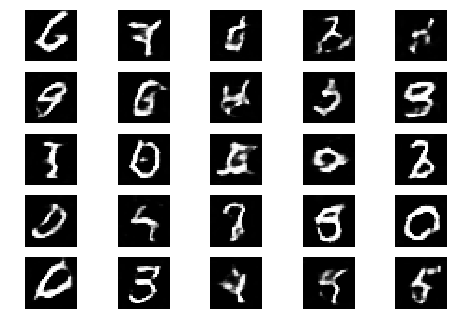

Epoch 1 Batch 910/937 [D loss: 0.512317, acc.: 84.38%] [G loss: 1.035225]
Epoch 1 Batch 911/937 [D loss: 0.950648, acc.: 37.50%] [G loss: 0.993756]
Epoch 1 Batch 912/937 [D loss: 0.738967, acc.: 50.00%] [G loss: 1.038781]
Epoch 1 Batch 913/937 [D loss: 0.601919, acc.: 71.88%] [G loss: 1.056554]
Epoch 1 Batch 914/937 [D loss: 0.637890, acc.: 65.62%] [G loss: 0.849542]
Epoch 1 Batch 915/937 [D loss: 0.577693, acc.: 68.75%] [G loss: 1.322514]
Epoch 1 Batch 916/937 [D loss: 0.436031, acc.: 84.38%] [G loss: 1.248103]
Epoch 1 Batch 917/937 [D loss: 0.701908, acc.: 53.12%] [G loss: 1.114440]
Epoch 1 Batch 918/937 [D loss: 0.581994, acc.: 68.75%] [G loss: 1.070438]


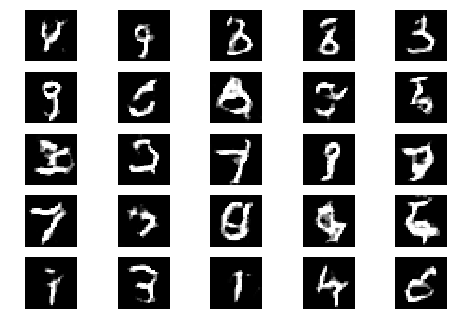

Epoch 1 Batch 919/937 [D loss: 0.630493, acc.: 62.50%] [G loss: 1.201851]
Epoch 1 Batch 920/937 [D loss: 0.838286, acc.: 43.75%] [G loss: 1.159222]
Epoch 1 Batch 921/937 [D loss: 0.699746, acc.: 62.50%] [G loss: 1.062186]
Epoch 1 Batch 922/937 [D loss: 0.754253, acc.: 65.62%] [G loss: 1.205999]
Epoch 1 Batch 923/937 [D loss: 0.682047, acc.: 68.75%] [G loss: 1.085044]
Epoch 1 Batch 924/937 [D loss: 0.614213, acc.: 65.62%] [G loss: 0.889150]
Epoch 1 Batch 925/937 [D loss: 0.641790, acc.: 62.50%] [G loss: 0.696199]
Epoch 1 Batch 926/937 [D loss: 0.718970, acc.: 65.62%] [G loss: 0.754288]
Epoch 1 Batch 927/937 [D loss: 0.605990, acc.: 75.00%] [G loss: 1.148225]
Epoch 1 Batch 928/937 [D loss: 0.497077, acc.: 78.12%] [G loss: 1.126367]
Epoch 1 Batch 929/937 [D loss: 0.738051, acc.: 59.38%] [G loss: 0.743852]
Epoch 1 Batch 930/937 [D loss: 0.657625, acc.: 62.50%] [G loss: 0.973267]
Epoch 1 Batch 931/937 [D loss: 0.528874, acc.: 81.25%] [G loss: 1.174005]
Epoch 1 Batch 932/937 [D loss: 0.91989

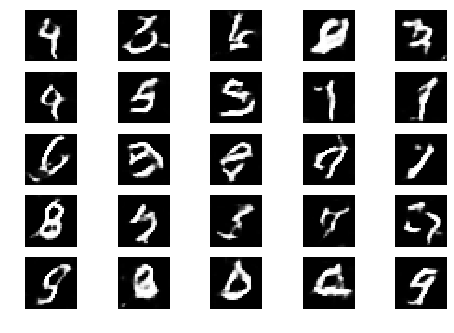

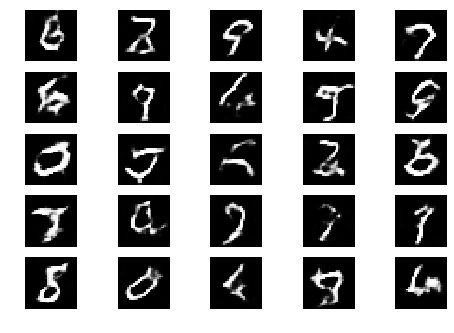

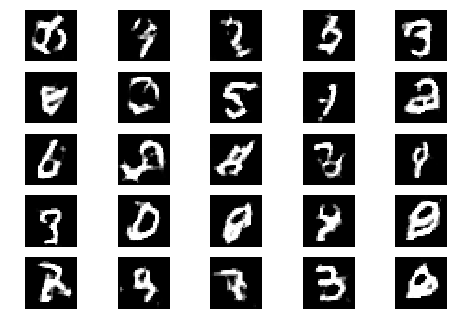

Epoch 2 Batch 1/937 [D loss: 0.549797, acc.: 71.88%] [G loss: 1.226511]
Epoch 2 Batch 2/937 [D loss: 0.693431, acc.: 68.75%] [G loss: 0.753205]
Epoch 2 Batch 3/937 [D loss: 0.740937, acc.: 59.38%] [G loss: 0.994356]
Epoch 2 Batch 4/937 [D loss: 0.716019, acc.: 59.38%] [G loss: 1.368449]
Epoch 2 Batch 5/937 [D loss: 0.667944, acc.: 65.62%] [G loss: 1.403636]
Epoch 2 Batch 6/937 [D loss: 0.696583, acc.: 59.38%] [G loss: 1.329318]
Epoch 2 Batch 7/937 [D loss: 0.798204, acc.: 59.38%] [G loss: 1.469843]
Epoch 2 Batch 8/937 [D loss: 0.585148, acc.: 56.25%] [G loss: 1.378893]
Epoch 2 Batch 9/937 [D loss: 0.591883, acc.: 65.62%] [G loss: 1.266230]
Epoch 2 Batch 10/937 [D loss: 0.638558, acc.: 59.38%] [G loss: 1.369346]
Epoch 2 Batch 11/937 [D loss: 0.527091, acc.: 81.25%] [G loss: 1.135935]
Epoch 2 Batch 12/937 [D loss: 0.723735, acc.: 59.38%] [G loss: 1.099395]
Epoch 2 Batch 13/937 [D loss: 0.642527, acc.: 62.50%] [G loss: 1.104119]
Epoch 2 Batch 14/937 [D loss: 0.749035, acc.: 53.12%] [G los

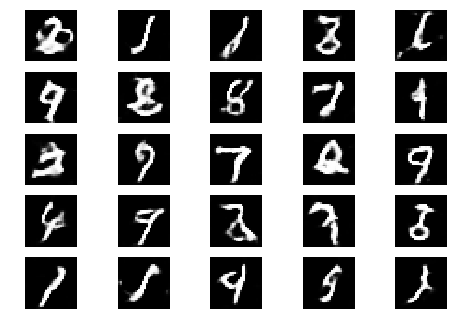

Epoch 2 Batch 101/937 [D loss: 0.560571, acc.: 75.00%] [G loss: 1.088213]


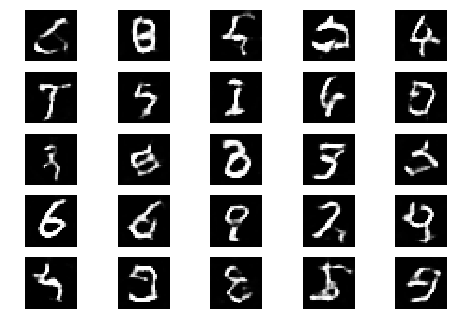

Epoch 2 Batch 102/937 [D loss: 0.845571, acc.: 40.62%] [G loss: 1.487721]


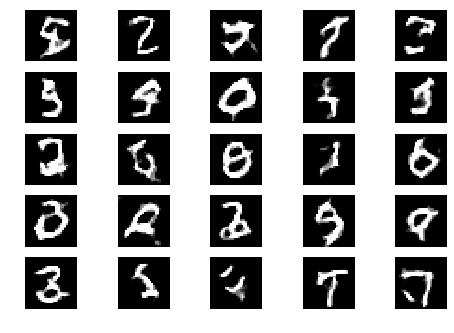

Epoch 2 Batch 103/937 [D loss: 0.601697, acc.: 62.50%] [G loss: 1.577172]
Epoch 2 Batch 104/937 [D loss: 0.769027, acc.: 50.00%] [G loss: 1.089512]
Epoch 2 Batch 105/937 [D loss: 0.516329, acc.: 68.75%] [G loss: 1.083508]
Epoch 2 Batch 106/937 [D loss: 0.568067, acc.: 62.50%] [G loss: 1.165022]
Epoch 2 Batch 107/937 [D loss: 0.768456, acc.: 43.75%] [G loss: 1.198793]
Epoch 2 Batch 108/937 [D loss: 0.548264, acc.: 75.00%] [G loss: 0.994823]
Epoch 2 Batch 109/937 [D loss: 0.680629, acc.: 65.62%] [G loss: 1.210213]
Epoch 2 Batch 110/937 [D loss: 0.915473, acc.: 40.62%] [G loss: 0.974186]
Epoch 2 Batch 111/937 [D loss: 0.774696, acc.: 62.50%] [G loss: 0.794903]
Epoch 2 Batch 112/937 [D loss: 0.888831, acc.: 50.00%] [G loss: 1.209719]
Epoch 2 Batch 113/937 [D loss: 0.481117, acc.: 81.25%] [G loss: 1.382296]
Epoch 2 Batch 114/937 [D loss: 0.775440, acc.: 53.12%] [G loss: 1.146935]
Epoch 2 Batch 115/937 [D loss: 1.062838, acc.: 25.00%] [G loss: 0.974010]
Epoch 2 Batch 116/937 [D loss: 0.74468

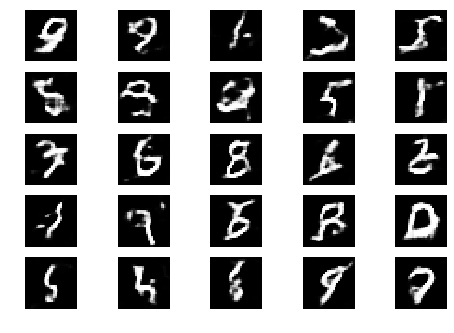

Epoch 2 Batch 201/937 [D loss: 0.744563, acc.: 53.12%] [G loss: 0.979226]
Epoch 2 Batch 202/937 [D loss: 0.628950, acc.: 59.38%] [G loss: 0.915797]


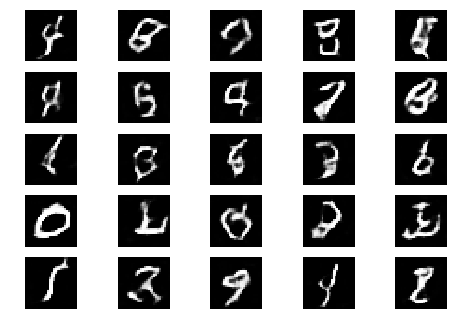

Epoch 2 Batch 203/937 [D loss: 0.441523, acc.: 84.38%] [G loss: 1.260795]
Epoch 2 Batch 204/937 [D loss: 0.639957, acc.: 62.50%] [G loss: 1.125988]


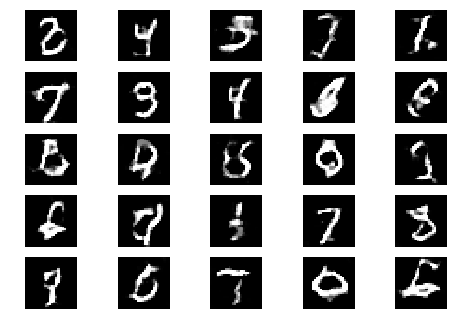

Epoch 2 Batch 205/937 [D loss: 0.726512, acc.: 68.75%] [G loss: 0.852141]
Epoch 2 Batch 206/937 [D loss: 0.611310, acc.: 62.50%] [G loss: 1.233175]
Epoch 2 Batch 207/937 [D loss: 0.551847, acc.: 75.00%] [G loss: 0.976111]
Epoch 2 Batch 208/937 [D loss: 0.625345, acc.: 68.75%] [G loss: 1.098260]
Epoch 2 Batch 209/937 [D loss: 0.581510, acc.: 68.75%] [G loss: 1.197732]
Epoch 2 Batch 210/937 [D loss: 0.703638, acc.: 50.00%] [G loss: 1.268826]
Epoch 2 Batch 211/937 [D loss: 0.564358, acc.: 68.75%] [G loss: 1.119118]
Epoch 2 Batch 212/937 [D loss: 0.718152, acc.: 53.12%] [G loss: 1.184293]
Epoch 2 Batch 213/937 [D loss: 0.726837, acc.: 50.00%] [G loss: 1.069332]
Epoch 2 Batch 214/937 [D loss: 0.582912, acc.: 71.88%] [G loss: 1.264355]
Epoch 2 Batch 215/937 [D loss: 0.762072, acc.: 50.00%] [G loss: 1.081243]
Epoch 2 Batch 216/937 [D loss: 0.635593, acc.: 65.62%] [G loss: 0.925843]
Epoch 2 Batch 217/937 [D loss: 0.706557, acc.: 50.00%] [G loss: 0.983526]
Epoch 2 Batch 218/937 [D loss: 0.62672

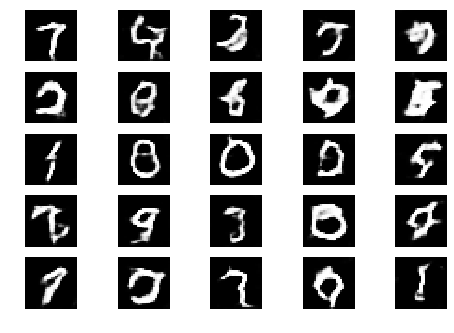

Epoch 2 Batch 301/937 [D loss: 0.689205, acc.: 62.50%] [G loss: 1.040271]
Epoch 2 Batch 302/937 [D loss: 0.670350, acc.: 56.25%] [G loss: 1.047743]
Epoch 2 Batch 303/937 [D loss: 0.734132, acc.: 59.38%] [G loss: 1.299033]


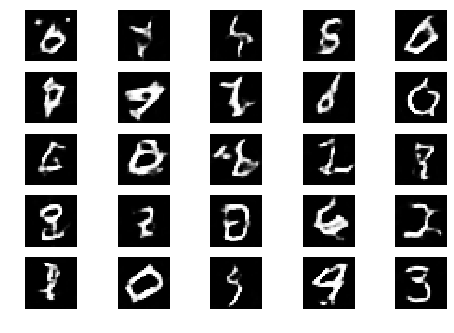

Epoch 2 Batch 304/937 [D loss: 0.658160, acc.: 59.38%] [G loss: 0.988468]
Epoch 2 Batch 305/937 [D loss: 0.651569, acc.: 65.62%] [G loss: 1.033749]
Epoch 2 Batch 306/937 [D loss: 0.494648, acc.: 71.88%] [G loss: 1.067055]


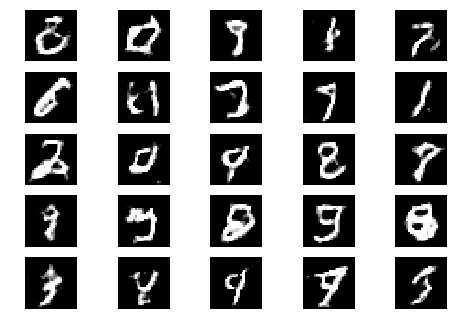

Epoch 2 Batch 307/937 [D loss: 0.781473, acc.: 43.75%] [G loss: 0.936982]
Epoch 2 Batch 308/937 [D loss: 0.639993, acc.: 59.38%] [G loss: 1.285694]
Epoch 2 Batch 309/937 [D loss: 0.661337, acc.: 68.75%] [G loss: 1.136879]
Epoch 2 Batch 310/937 [D loss: 0.723970, acc.: 62.50%] [G loss: 1.194241]
Epoch 2 Batch 311/937 [D loss: 0.647223, acc.: 62.50%] [G loss: 1.134213]
Epoch 2 Batch 312/937 [D loss: 0.746405, acc.: 59.38%] [G loss: 0.865076]
Epoch 2 Batch 313/937 [D loss: 0.465298, acc.: 78.12%] [G loss: 1.120527]
Epoch 2 Batch 314/937 [D loss: 0.789729, acc.: 53.12%] [G loss: 1.143796]
Epoch 2 Batch 315/937 [D loss: 0.675921, acc.: 62.50%] [G loss: 1.368071]
Epoch 2 Batch 316/937 [D loss: 0.646525, acc.: 59.38%] [G loss: 1.037432]
Epoch 2 Batch 317/937 [D loss: 0.716556, acc.: 53.12%] [G loss: 1.225770]
Epoch 2 Batch 318/937 [D loss: 0.666889, acc.: 50.00%] [G loss: 0.894920]
Epoch 2 Batch 319/937 [D loss: 0.601877, acc.: 71.88%] [G loss: 0.968275]
Epoch 2 Batch 320/937 [D loss: 0.77136

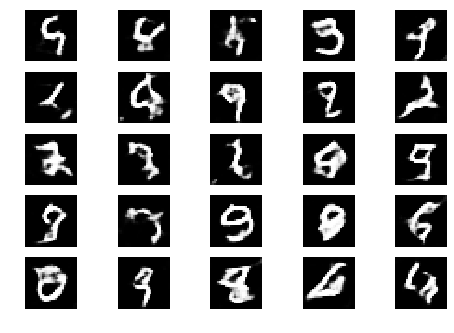

Epoch 2 Batch 401/937 [D loss: 0.580084, acc.: 65.62%] [G loss: 0.930577]
Epoch 2 Batch 402/937 [D loss: 0.748628, acc.: 46.88%] [G loss: 0.997849]
Epoch 2 Batch 403/937 [D loss: 0.680015, acc.: 56.25%] [G loss: 0.970367]
Epoch 2 Batch 404/937 [D loss: 0.707548, acc.: 59.38%] [G loss: 1.210112]


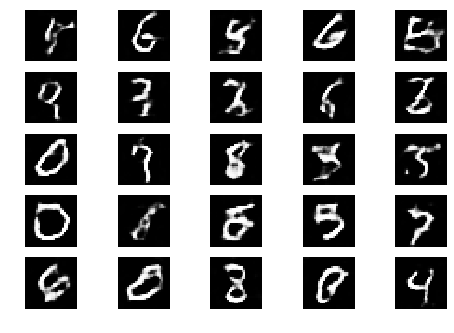

Epoch 2 Batch 405/937 [D loss: 0.674364, acc.: 62.50%] [G loss: 1.082879]
Epoch 2 Batch 406/937 [D loss: 0.636613, acc.: 65.62%] [G loss: 0.959363]
Epoch 2 Batch 407/937 [D loss: 0.594856, acc.: 62.50%] [G loss: 1.020736]
Epoch 2 Batch 408/937 [D loss: 0.637785, acc.: 56.25%] [G loss: 1.007282]


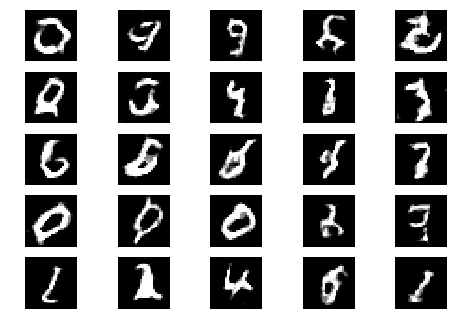

Epoch 2 Batch 409/937 [D loss: 0.636571, acc.: 65.62%] [G loss: 0.948841]
Epoch 2 Batch 410/937 [D loss: 0.630635, acc.: 62.50%] [G loss: 1.127327]
Epoch 2 Batch 411/937 [D loss: 0.817504, acc.: 46.88%] [G loss: 0.828132]
Epoch 2 Batch 412/937 [D loss: 0.633451, acc.: 56.25%] [G loss: 1.144276]
Epoch 2 Batch 413/937 [D loss: 0.654919, acc.: 75.00%] [G loss: 1.287951]
Epoch 2 Batch 414/937 [D loss: 0.794258, acc.: 50.00%] [G loss: 1.257221]
Epoch 2 Batch 415/937 [D loss: 0.734770, acc.: 50.00%] [G loss: 1.423063]
Epoch 2 Batch 416/937 [D loss: 0.651139, acc.: 65.62%] [G loss: 1.173959]
Epoch 2 Batch 417/937 [D loss: 0.584949, acc.: 59.38%] [G loss: 1.157706]
Epoch 2 Batch 418/937 [D loss: 0.763140, acc.: 56.25%] [G loss: 1.136406]
Epoch 2 Batch 419/937 [D loss: 0.812135, acc.: 50.00%] [G loss: 1.212103]
Epoch 2 Batch 420/937 [D loss: 0.524206, acc.: 71.88%] [G loss: 1.094446]
Epoch 2 Batch 421/937 [D loss: 0.624087, acc.: 62.50%] [G loss: 0.755931]
Epoch 2 Batch 422/937 [D loss: 0.67000

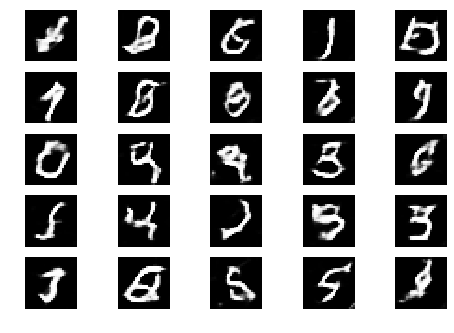

Epoch 2 Batch 501/937 [D loss: 0.754699, acc.: 56.25%] [G loss: 0.972683]
Epoch 2 Batch 502/937 [D loss: 0.614855, acc.: 62.50%] [G loss: 1.186699]
Epoch 2 Batch 503/937 [D loss: 0.765699, acc.: 59.38%] [G loss: 1.003988]
Epoch 2 Batch 504/937 [D loss: 0.744805, acc.: 43.75%] [G loss: 1.090832]
Epoch 2 Batch 505/937 [D loss: 0.629548, acc.: 59.38%] [G loss: 0.915587]


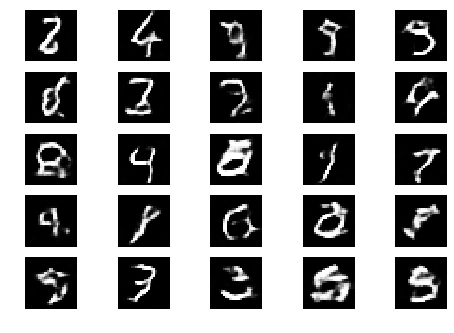

Epoch 2 Batch 506/937 [D loss: 0.698773, acc.: 50.00%] [G loss: 1.037910]
Epoch 2 Batch 507/937 [D loss: 0.623707, acc.: 62.50%] [G loss: 0.842237]
Epoch 2 Batch 508/937 [D loss: 0.595910, acc.: 71.88%] [G loss: 1.161860]
Epoch 2 Batch 509/937 [D loss: 0.490075, acc.: 71.88%] [G loss: 1.068794]
Epoch 2 Batch 510/937 [D loss: 0.695540, acc.: 56.25%] [G loss: 1.063917]


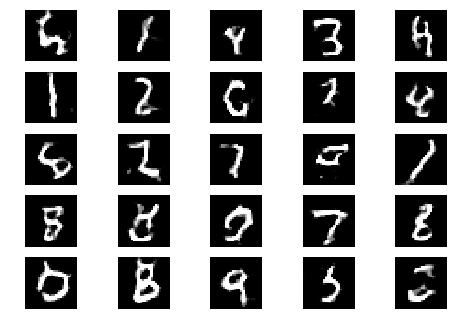

Epoch 2 Batch 511/937 [D loss: 0.457619, acc.: 84.38%] [G loss: 1.099492]
Epoch 2 Batch 512/937 [D loss: 0.704362, acc.: 46.88%] [G loss: 0.944921]
Epoch 2 Batch 513/937 [D loss: 0.807577, acc.: 34.38%] [G loss: 0.993827]
Epoch 2 Batch 514/937 [D loss: 0.709338, acc.: 56.25%] [G loss: 1.251482]
Epoch 2 Batch 515/937 [D loss: 0.676291, acc.: 53.12%] [G loss: 0.944848]
Epoch 2 Batch 516/937 [D loss: 0.619056, acc.: 56.25%] [G loss: 1.236993]
Epoch 2 Batch 517/937 [D loss: 0.523574, acc.: 68.75%] [G loss: 1.161648]
Epoch 2 Batch 518/937 [D loss: 0.898883, acc.: 40.62%] [G loss: 0.942958]
Epoch 2 Batch 519/937 [D loss: 0.709608, acc.: 50.00%] [G loss: 1.264089]
Epoch 2 Batch 520/937 [D loss: 0.636059, acc.: 56.25%] [G loss: 1.337190]
Epoch 2 Batch 521/937 [D loss: 0.667074, acc.: 59.38%] [G loss: 0.954290]
Epoch 2 Batch 522/937 [D loss: 0.585068, acc.: 68.75%] [G loss: 1.148604]
Epoch 2 Batch 523/937 [D loss: 0.877436, acc.: 43.75%] [G loss: 1.158867]
Epoch 2 Batch 524/937 [D loss: 0.56550

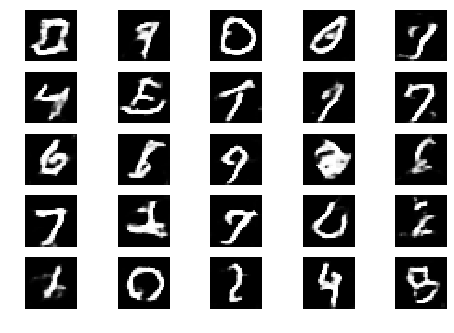

Epoch 2 Batch 601/937 [D loss: 0.828682, acc.: 53.12%] [G loss: 1.004060]
Epoch 2 Batch 602/937 [D loss: 0.712846, acc.: 65.62%] [G loss: 0.890955]
Epoch 2 Batch 603/937 [D loss: 0.685052, acc.: 56.25%] [G loss: 0.860973]
Epoch 2 Batch 604/937 [D loss: 0.571678, acc.: 71.88%] [G loss: 0.797499]
Epoch 2 Batch 605/937 [D loss: 0.685013, acc.: 56.25%] [G loss: 0.824870]
Epoch 2 Batch 606/937 [D loss: 0.631152, acc.: 75.00%] [G loss: 1.083289]


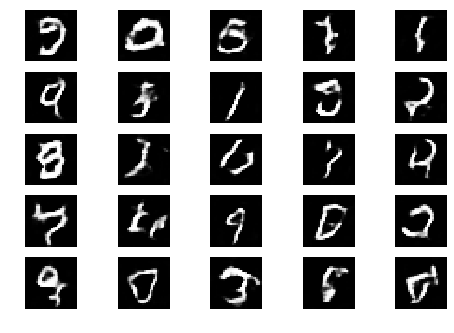

Epoch 2 Batch 607/937 [D loss: 0.808097, acc.: 46.88%] [G loss: 0.946956]
Epoch 2 Batch 608/937 [D loss: 0.611538, acc.: 71.88%] [G loss: 1.059685]
Epoch 2 Batch 609/937 [D loss: 0.755171, acc.: 53.12%] [G loss: 1.107175]
Epoch 2 Batch 610/937 [D loss: 0.594018, acc.: 65.62%] [G loss: 0.966603]
Epoch 2 Batch 611/937 [D loss: 0.694937, acc.: 56.25%] [G loss: 1.062859]
Epoch 2 Batch 612/937 [D loss: 0.563507, acc.: 71.88%] [G loss: 1.074726]


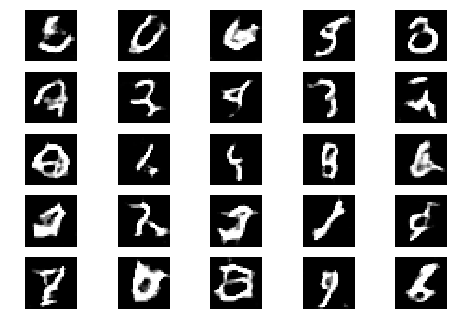

Epoch 2 Batch 613/937 [D loss: 0.618724, acc.: 59.38%] [G loss: 1.002196]
Epoch 2 Batch 614/937 [D loss: 0.653796, acc.: 71.88%] [G loss: 1.206511]
Epoch 2 Batch 615/937 [D loss: 0.601046, acc.: 65.62%] [G loss: 1.114372]
Epoch 2 Batch 616/937 [D loss: 0.766887, acc.: 46.88%] [G loss: 0.824970]
Epoch 2 Batch 617/937 [D loss: 0.625380, acc.: 53.12%] [G loss: 1.105075]
Epoch 2 Batch 618/937 [D loss: 0.557093, acc.: 62.50%] [G loss: 0.977545]
Epoch 2 Batch 619/937 [D loss: 0.501562, acc.: 75.00%] [G loss: 0.974790]
Epoch 2 Batch 620/937 [D loss: 0.523285, acc.: 78.12%] [G loss: 1.019165]
Epoch 2 Batch 621/937 [D loss: 0.529180, acc.: 78.12%] [G loss: 0.964007]
Epoch 2 Batch 622/937 [D loss: 0.685040, acc.: 56.25%] [G loss: 0.913877]
Epoch 2 Batch 623/937 [D loss: 0.699386, acc.: 65.62%] [G loss: 1.195091]
Epoch 2 Batch 624/937 [D loss: 0.587207, acc.: 59.38%] [G loss: 0.906472]
Epoch 2 Batch 625/937 [D loss: 0.606749, acc.: 59.38%] [G loss: 1.197658]
Epoch 2 Batch 626/937 [D loss: 0.57762

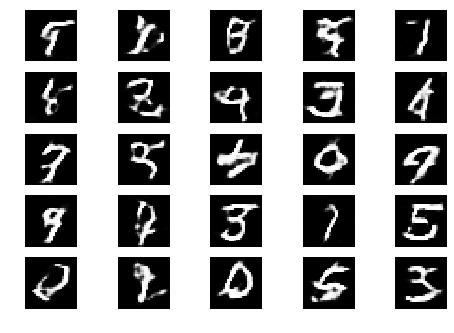

Epoch 2 Batch 701/937 [D loss: 0.749614, acc.: 56.25%] [G loss: 1.178918]
Epoch 2 Batch 702/937 [D loss: 0.624551, acc.: 68.75%] [G loss: 1.354568]
Epoch 2 Batch 703/937 [D loss: 0.663422, acc.: 53.12%] [G loss: 1.113464]
Epoch 2 Batch 704/937 [D loss: 0.505720, acc.: 71.88%] [G loss: 1.053248]
Epoch 2 Batch 705/937 [D loss: 0.763630, acc.: 46.88%] [G loss: 0.945289]
Epoch 2 Batch 706/937 [D loss: 0.751239, acc.: 53.12%] [G loss: 0.834602]
Epoch 2 Batch 707/937 [D loss: 0.792266, acc.: 43.75%] [G loss: 1.115906]


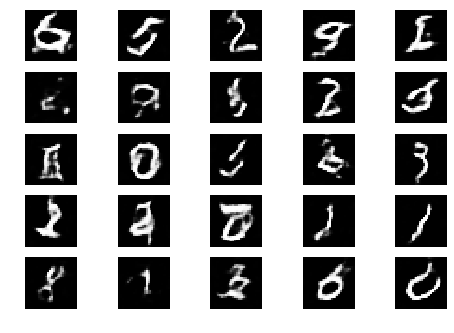

Epoch 2 Batch 708/937 [D loss: 0.884640, acc.: 37.50%] [G loss: 0.942739]
Epoch 2 Batch 709/937 [D loss: 0.646431, acc.: 68.75%] [G loss: 0.911295]
Epoch 2 Batch 710/937 [D loss: 0.548019, acc.: 81.25%] [G loss: 0.875280]
Epoch 2 Batch 711/937 [D loss: 0.729532, acc.: 59.38%] [G loss: 0.875460]
Epoch 2 Batch 712/937 [D loss: 0.689541, acc.: 50.00%] [G loss: 0.982070]
Epoch 2 Batch 713/937 [D loss: 0.793763, acc.: 53.12%] [G loss: 1.000042]
Epoch 2 Batch 714/937 [D loss: 0.678451, acc.: 56.25%] [G loss: 0.999447]


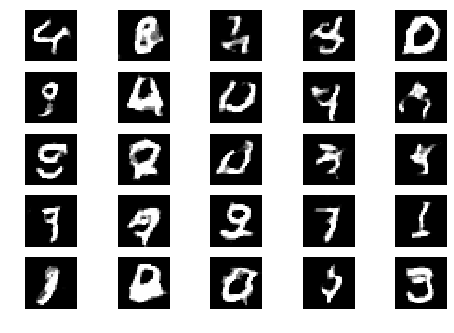

Epoch 2 Batch 715/937 [D loss: 0.776398, acc.: 53.12%] [G loss: 1.130328]
Epoch 2 Batch 716/937 [D loss: 0.745925, acc.: 56.25%] [G loss: 1.072805]
Epoch 2 Batch 717/937 [D loss: 0.703024, acc.: 56.25%] [G loss: 1.107239]
Epoch 2 Batch 718/937 [D loss: 0.602669, acc.: 62.50%] [G loss: 1.227522]
Epoch 2 Batch 719/937 [D loss: 0.627665, acc.: 59.38%] [G loss: 0.940058]
Epoch 2 Batch 720/937 [D loss: 0.599064, acc.: 62.50%] [G loss: 0.942050]
Epoch 2 Batch 721/937 [D loss: 0.761539, acc.: 53.12%] [G loss: 1.277937]
Epoch 2 Batch 722/937 [D loss: 0.506358, acc.: 78.12%] [G loss: 1.202214]
Epoch 2 Batch 723/937 [D loss: 0.583431, acc.: 71.88%] [G loss: 1.072608]
Epoch 2 Batch 724/937 [D loss: 0.561370, acc.: 75.00%] [G loss: 0.892445]
Epoch 2 Batch 725/937 [D loss: 0.610621, acc.: 71.88%] [G loss: 1.162767]
Epoch 2 Batch 726/937 [D loss: 0.706648, acc.: 53.12%] [G loss: 0.896862]
Epoch 2 Batch 727/937 [D loss: 0.673675, acc.: 62.50%] [G loss: 0.983565]
Epoch 2 Batch 728/937 [D loss: 0.62317

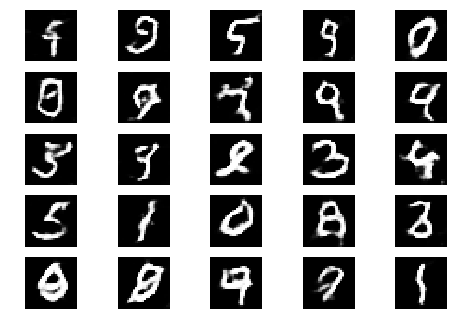

Epoch 2 Batch 801/937 [D loss: 0.565808, acc.: 65.62%] [G loss: 0.777110]
Epoch 2 Batch 802/937 [D loss: 0.555291, acc.: 78.12%] [G loss: 1.131425]
Epoch 2 Batch 803/937 [D loss: 0.634665, acc.: 68.75%] [G loss: 1.008831]
Epoch 2 Batch 804/937 [D loss: 0.671707, acc.: 56.25%] [G loss: 1.094710]
Epoch 2 Batch 805/937 [D loss: 0.597852, acc.: 62.50%] [G loss: 1.015177]
Epoch 2 Batch 806/937 [D loss: 0.566622, acc.: 71.88%] [G loss: 1.157431]
Epoch 2 Batch 807/937 [D loss: 0.582396, acc.: 65.62%] [G loss: 1.040327]
Epoch 2 Batch 808/937 [D loss: 0.602098, acc.: 68.75%] [G loss: 0.918263]


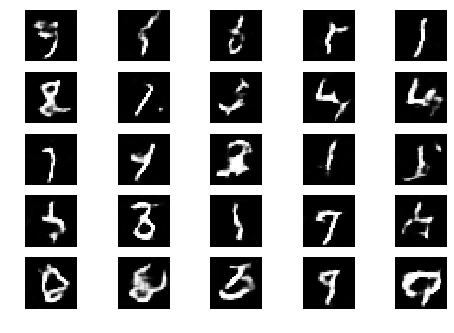

Epoch 2 Batch 809/937 [D loss: 0.747663, acc.: 50.00%] [G loss: 0.940548]
Epoch 2 Batch 810/937 [D loss: 0.685542, acc.: 62.50%] [G loss: 1.247823]
Epoch 2 Batch 811/937 [D loss: 0.716730, acc.: 53.12%] [G loss: 1.029998]
Epoch 2 Batch 812/937 [D loss: 0.659619, acc.: 56.25%] [G loss: 1.077687]
Epoch 2 Batch 813/937 [D loss: 0.587858, acc.: 62.50%] [G loss: 1.183193]
Epoch 2 Batch 814/937 [D loss: 0.871314, acc.: 37.50%] [G loss: 0.865915]
Epoch 2 Batch 815/937 [D loss: 0.607755, acc.: 71.88%] [G loss: 0.936131]
Epoch 2 Batch 816/937 [D loss: 0.693455, acc.: 59.38%] [G loss: 0.867397]


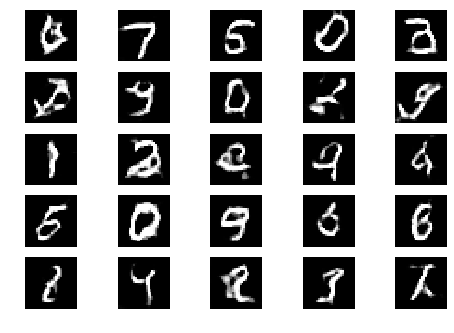

Epoch 2 Batch 817/937 [D loss: 0.639355, acc.: 68.75%] [G loss: 0.894086]
Epoch 2 Batch 818/937 [D loss: 0.580657, acc.: 71.88%] [G loss: 1.097762]
Epoch 2 Batch 819/937 [D loss: 0.667834, acc.: 62.50%] [G loss: 1.179749]
Epoch 2 Batch 820/937 [D loss: 0.545338, acc.: 75.00%] [G loss: 0.891184]
Epoch 2 Batch 821/937 [D loss: 0.716064, acc.: 50.00%] [G loss: 1.109319]
Epoch 2 Batch 822/937 [D loss: 0.528187, acc.: 81.25%] [G loss: 1.086542]
Epoch 2 Batch 823/937 [D loss: 0.767587, acc.: 43.75%] [G loss: 0.976451]
Epoch 2 Batch 824/937 [D loss: 0.502270, acc.: 78.12%] [G loss: 0.780210]
Epoch 2 Batch 825/937 [D loss: 0.667230, acc.: 56.25%] [G loss: 0.862573]
Epoch 2 Batch 826/937 [D loss: 0.552921, acc.: 75.00%] [G loss: 1.044285]
Epoch 2 Batch 827/937 [D loss: 0.583229, acc.: 71.88%] [G loss: 0.984780]
Epoch 2 Batch 828/937 [D loss: 0.536386, acc.: 75.00%] [G loss: 0.920118]
Epoch 2 Batch 829/937 [D loss: 0.538033, acc.: 75.00%] [G loss: 1.098166]
Epoch 2 Batch 830/937 [D loss: 0.72760

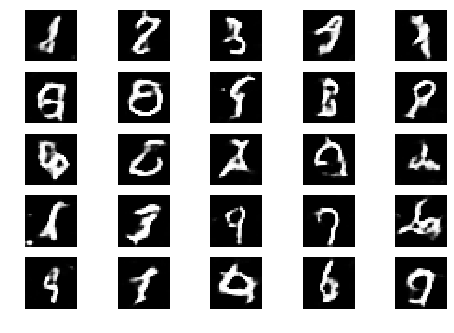

Epoch 2 Batch 901/937 [D loss: 0.653074, acc.: 62.50%] [G loss: 1.110637]
Epoch 2 Batch 902/937 [D loss: 0.485935, acc.: 84.38%] [G loss: 1.139663]
Epoch 2 Batch 903/937 [D loss: 0.484760, acc.: 87.50%] [G loss: 1.006473]
Epoch 2 Batch 904/937 [D loss: 0.682639, acc.: 56.25%] [G loss: 0.964791]
Epoch 2 Batch 905/937 [D loss: 0.787908, acc.: 43.75%] [G loss: 0.821218]
Epoch 2 Batch 906/937 [D loss: 0.779630, acc.: 50.00%] [G loss: 0.823681]
Epoch 2 Batch 907/937 [D loss: 0.528535, acc.: 75.00%] [G loss: 0.928770]
Epoch 2 Batch 908/937 [D loss: 0.732629, acc.: 53.12%] [G loss: 1.018813]
Epoch 2 Batch 909/937 [D loss: 0.587897, acc.: 68.75%] [G loss: 1.149026]


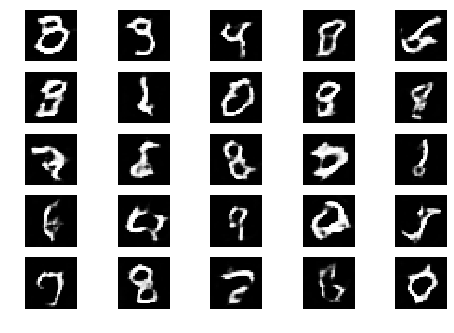

Epoch 2 Batch 910/937 [D loss: 0.673241, acc.: 56.25%] [G loss: 1.014200]
Epoch 2 Batch 911/937 [D loss: 0.639678, acc.: 62.50%] [G loss: 1.078249]
Epoch 2 Batch 912/937 [D loss: 0.673368, acc.: 59.38%] [G loss: 1.052020]
Epoch 2 Batch 913/937 [D loss: 0.655722, acc.: 62.50%] [G loss: 0.873365]
Epoch 2 Batch 914/937 [D loss: 0.639998, acc.: 68.75%] [G loss: 1.166343]
Epoch 2 Batch 915/937 [D loss: 0.854197, acc.: 46.88%] [G loss: 1.115657]
Epoch 2 Batch 916/937 [D loss: 0.627725, acc.: 68.75%] [G loss: 0.880248]
Epoch 2 Batch 917/937 [D loss: 0.581250, acc.: 68.75%] [G loss: 0.926769]
Epoch 2 Batch 918/937 [D loss: 0.876015, acc.: 46.88%] [G loss: 1.061120]


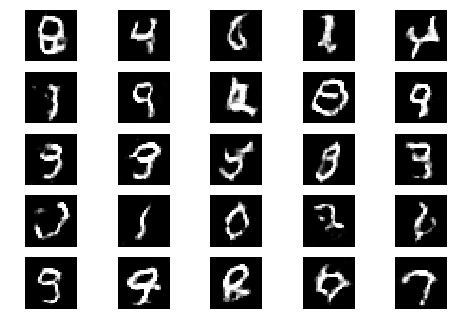

Epoch 2 Batch 919/937 [D loss: 0.826880, acc.: 40.62%] [G loss: 1.056222]
Epoch 2 Batch 920/937 [D loss: 0.638162, acc.: 65.62%] [G loss: 1.115731]
Epoch 2 Batch 921/937 [D loss: 0.705158, acc.: 59.38%] [G loss: 1.013129]
Epoch 2 Batch 922/937 [D loss: 0.516684, acc.: 81.25%] [G loss: 1.219567]
Epoch 2 Batch 923/937 [D loss: 0.546301, acc.: 78.12%] [G loss: 1.345021]
Epoch 2 Batch 924/937 [D loss: 0.635468, acc.: 62.50%] [G loss: 1.239247]
Epoch 2 Batch 925/937 [D loss: 0.575687, acc.: 68.75%] [G loss: 0.908987]
Epoch 2 Batch 926/937 [D loss: 0.772963, acc.: 46.88%] [G loss: 1.025301]
Epoch 2 Batch 927/937 [D loss: 0.629585, acc.: 65.62%] [G loss: 0.997199]
Epoch 2 Batch 928/937 [D loss: 0.735748, acc.: 53.12%] [G loss: 0.956054]
Epoch 2 Batch 929/937 [D loss: 0.744047, acc.: 50.00%] [G loss: 1.194574]
Epoch 2 Batch 930/937 [D loss: 0.679463, acc.: 62.50%] [G loss: 1.128681]
Epoch 2 Batch 931/937 [D loss: 0.629711, acc.: 68.75%] [G loss: 1.185453]
Epoch 2 Batch 932/937 [D loss: 0.62636

In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1, modeltotrain=3)

Number of examples:  30000.0
Number of Batches:  937
Number of epochs:  2
G1 output numpy array shape
(16, 28, 28, 1)
G1+G2 appended numpy array shape
(16, 28, 28, 1)
Epoch 0 Batch 0/937 [D loss: 0.641576, acc.: 59.38%] [G loss: 1.066556]


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


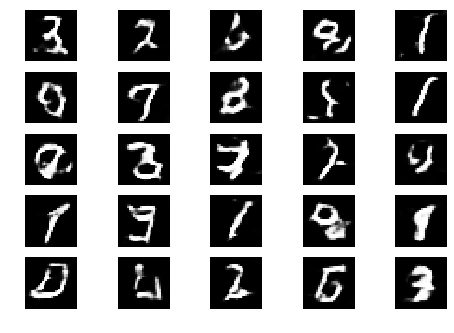

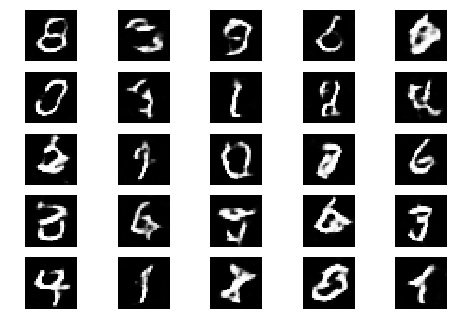

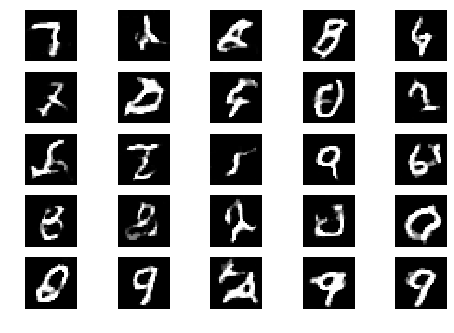

Epoch 0 Batch 1/937 [D loss: 0.605106, acc.: 68.75%] [G loss: 1.255728]
Epoch 0 Batch 2/937 [D loss: 0.715125, acc.: 50.00%] [G loss: 1.165997]
Epoch 0 Batch 3/937 [D loss: 0.680169, acc.: 56.25%] [G loss: 1.086628]
Epoch 0 Batch 4/937 [D loss: 0.607520, acc.: 65.62%] [G loss: 0.907899]
Epoch 0 Batch 5/937 [D loss: 0.715737, acc.: 46.88%] [G loss: 0.859222]
Epoch 0 Batch 6/937 [D loss: 0.816598, acc.: 37.50%] [G loss: 1.157387]
Epoch 0 Batch 7/937 [D loss: 0.721879, acc.: 53.12%] [G loss: 1.409874]
Epoch 0 Batch 8/937 [D loss: 0.860135, acc.: 43.75%] [G loss: 0.947138]
Epoch 0 Batch 9/937 [D loss: 0.554536, acc.: 71.88%] [G loss: 1.125279]
Epoch 0 Batch 10/937 [D loss: 0.539509, acc.: 78.12%] [G loss: 0.967536]
Epoch 0 Batch 11/937 [D loss: 0.586589, acc.: 68.75%] [G loss: 1.182476]
Epoch 0 Batch 12/937 [D loss: 0.671053, acc.: 68.75%] [G loss: 0.898186]
Epoch 0 Batch 13/937 [D loss: 0.560713, acc.: 75.00%] [G loss: 1.000826]
Epoch 0 Batch 14/937 [D loss: 0.644920, acc.: 65.62%] [G los

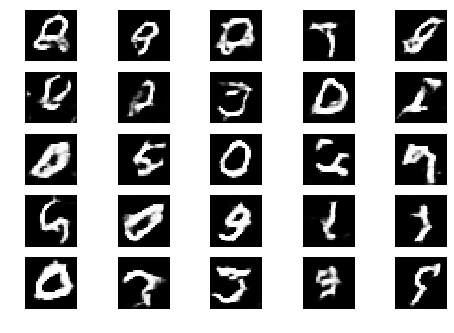

Epoch 0 Batch 101/937 [D loss: 0.843327, acc.: 43.75%] [G loss: 0.997229]


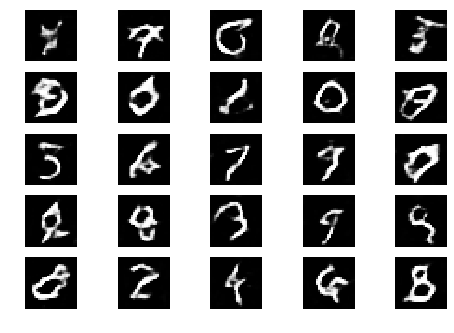

Epoch 0 Batch 102/937 [D loss: 0.773473, acc.: 56.25%] [G loss: 0.894332]


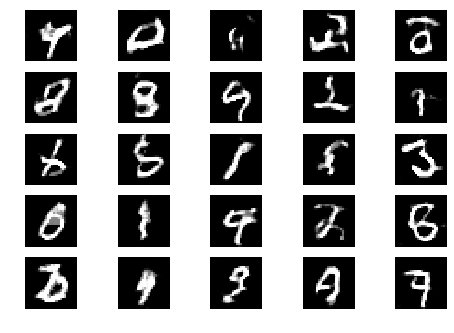

Epoch 0 Batch 103/937 [D loss: 0.646428, acc.: 59.38%] [G loss: 0.809015]
Epoch 0 Batch 104/937 [D loss: 0.533856, acc.: 71.88%] [G loss: 0.873288]
Epoch 0 Batch 105/937 [D loss: 0.697727, acc.: 53.12%] [G loss: 1.086187]
Epoch 0 Batch 106/937 [D loss: 0.681737, acc.: 56.25%] [G loss: 1.049533]
Epoch 0 Batch 107/937 [D loss: 0.560351, acc.: 75.00%] [G loss: 0.982485]
Epoch 0 Batch 108/937 [D loss: 0.633453, acc.: 68.75%] [G loss: 1.163286]
Epoch 0 Batch 109/937 [D loss: 0.745515, acc.: 40.62%] [G loss: 0.829073]
Epoch 0 Batch 110/937 [D loss: 0.758750, acc.: 56.25%] [G loss: 1.003521]
Epoch 0 Batch 111/937 [D loss: 0.730672, acc.: 59.38%] [G loss: 0.912855]
Epoch 0 Batch 112/937 [D loss: 0.655583, acc.: 59.38%] [G loss: 1.208894]
Epoch 0 Batch 113/937 [D loss: 0.615818, acc.: 62.50%] [G loss: 1.188780]
Epoch 0 Batch 114/937 [D loss: 0.614419, acc.: 68.75%] [G loss: 0.952455]
Epoch 0 Batch 115/937 [D loss: 0.605816, acc.: 75.00%] [G loss: 1.039176]
Epoch 0 Batch 116/937 [D loss: 0.67820

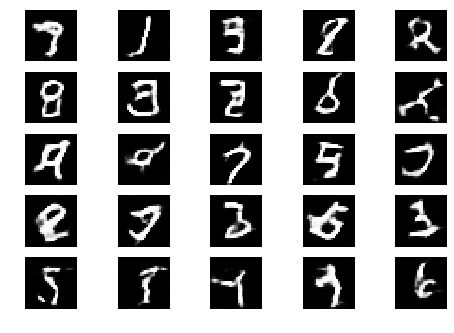

Epoch 0 Batch 201/937 [D loss: 0.693374, acc.: 56.25%] [G loss: 1.078140]
Epoch 0 Batch 202/937 [D loss: 0.644042, acc.: 56.25%] [G loss: 1.069490]


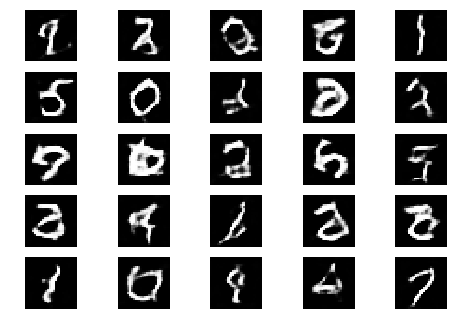

Epoch 0 Batch 203/937 [D loss: 0.656847, acc.: 65.62%] [G loss: 1.299408]
Epoch 0 Batch 204/937 [D loss: 0.547435, acc.: 75.00%] [G loss: 0.887894]


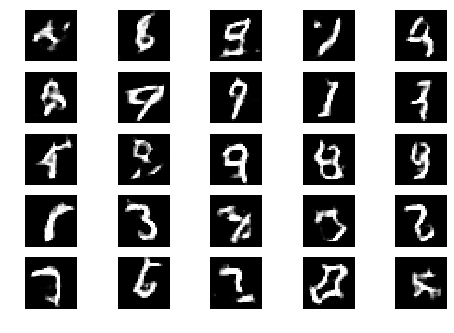

Epoch 0 Batch 205/937 [D loss: 0.626900, acc.: 56.25%] [G loss: 0.824317]
Epoch 0 Batch 206/937 [D loss: 0.664563, acc.: 56.25%] [G loss: 1.081519]
Epoch 0 Batch 207/937 [D loss: 0.719653, acc.: 56.25%] [G loss: 0.955091]
Epoch 0 Batch 208/937 [D loss: 0.465296, acc.: 81.25%] [G loss: 0.987202]
Epoch 0 Batch 209/937 [D loss: 0.668128, acc.: 46.88%] [G loss: 1.176617]
Epoch 0 Batch 210/937 [D loss: 0.593824, acc.: 68.75%] [G loss: 0.878972]
Epoch 0 Batch 211/937 [D loss: 0.681004, acc.: 56.25%] [G loss: 1.231806]
Epoch 0 Batch 212/937 [D loss: 0.830094, acc.: 46.88%] [G loss: 0.960153]
Epoch 0 Batch 213/937 [D loss: 0.571313, acc.: 75.00%] [G loss: 0.933060]
Epoch 0 Batch 214/937 [D loss: 0.591878, acc.: 59.38%] [G loss: 1.040140]
Epoch 0 Batch 215/937 [D loss: 0.725009, acc.: 50.00%] [G loss: 1.083063]
Epoch 0 Batch 216/937 [D loss: 0.739127, acc.: 65.62%] [G loss: 0.897394]
Epoch 0 Batch 217/937 [D loss: 0.514867, acc.: 81.25%] [G loss: 0.912953]
Epoch 0 Batch 218/937 [D loss: 0.58936

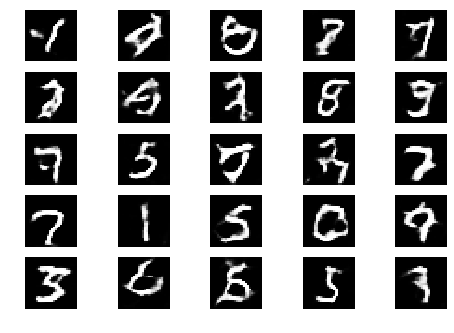

Epoch 0 Batch 301/937 [D loss: 0.613181, acc.: 78.12%] [G loss: 1.054769]
Epoch 0 Batch 302/937 [D loss: 0.698221, acc.: 50.00%] [G loss: 1.038360]
Epoch 0 Batch 303/937 [D loss: 0.639671, acc.: 59.38%] [G loss: 0.859477]


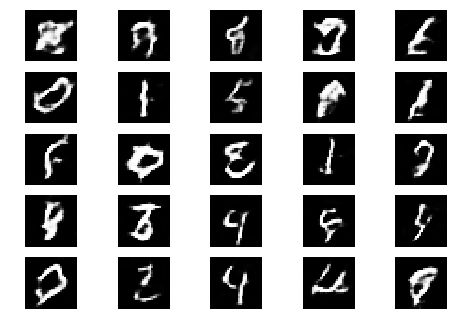

Epoch 0 Batch 304/937 [D loss: 0.619562, acc.: 62.50%] [G loss: 0.955252]
Epoch 0 Batch 305/937 [D loss: 0.808861, acc.: 46.88%] [G loss: 1.009975]
Epoch 0 Batch 306/937 [D loss: 0.575394, acc.: 68.75%] [G loss: 1.007268]


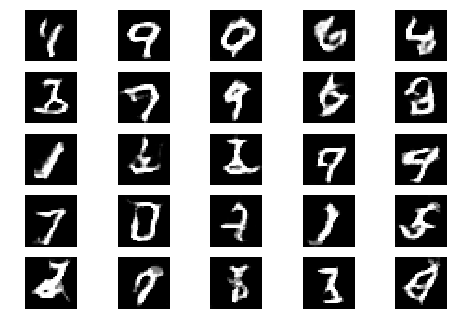

Epoch 0 Batch 307/937 [D loss: 0.743369, acc.: 40.62%] [G loss: 1.087162]
Epoch 0 Batch 308/937 [D loss: 0.733901, acc.: 59.38%] [G loss: 0.948947]
Epoch 0 Batch 309/937 [D loss: 0.717192, acc.: 53.12%] [G loss: 0.938900]
Epoch 0 Batch 310/937 [D loss: 0.626297, acc.: 65.62%] [G loss: 0.830876]
Epoch 0 Batch 311/937 [D loss: 0.919145, acc.: 34.38%] [G loss: 0.881392]
Epoch 0 Batch 312/937 [D loss: 0.666267, acc.: 59.38%] [G loss: 0.831567]
Epoch 0 Batch 313/937 [D loss: 0.575641, acc.: 65.62%] [G loss: 1.018391]
Epoch 0 Batch 314/937 [D loss: 0.738553, acc.: 62.50%] [G loss: 1.059840]
Epoch 0 Batch 315/937 [D loss: 0.541443, acc.: 71.88%] [G loss: 1.144606]
Epoch 0 Batch 316/937 [D loss: 0.615447, acc.: 59.38%] [G loss: 0.992571]
Epoch 0 Batch 317/937 [D loss: 0.708040, acc.: 65.62%] [G loss: 1.031709]
Epoch 0 Batch 318/937 [D loss: 0.671747, acc.: 53.12%] [G loss: 1.251356]
Epoch 0 Batch 319/937 [D loss: 0.599971, acc.: 68.75%] [G loss: 0.927251]
Epoch 0 Batch 320/937 [D loss: 0.78590

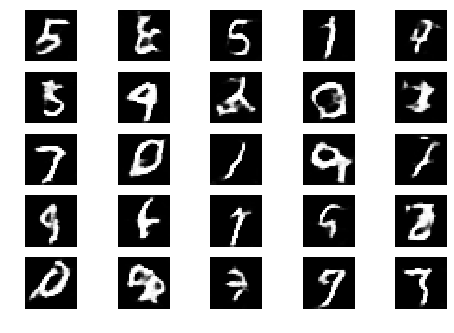

Epoch 0 Batch 401/937 [D loss: 0.501704, acc.: 78.12%] [G loss: 1.065283]
Epoch 0 Batch 402/937 [D loss: 0.634874, acc.: 68.75%] [G loss: 0.900989]
Epoch 0 Batch 403/937 [D loss: 0.684980, acc.: 59.38%] [G loss: 0.686639]
Epoch 0 Batch 404/937 [D loss: 0.605994, acc.: 59.38%] [G loss: 1.311248]


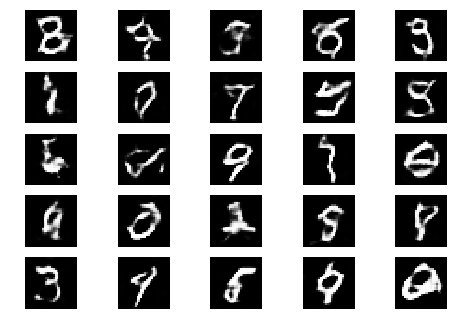

Epoch 0 Batch 405/937 [D loss: 0.765772, acc.: 53.12%] [G loss: 0.892029]
Epoch 0 Batch 406/937 [D loss: 0.756448, acc.: 53.12%] [G loss: 0.942175]
Epoch 0 Batch 407/937 [D loss: 0.904732, acc.: 40.62%] [G loss: 0.905320]
Epoch 0 Batch 408/937 [D loss: 0.673225, acc.: 59.38%] [G loss: 0.931585]


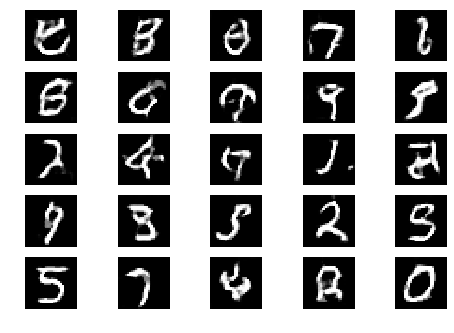

Epoch 0 Batch 409/937 [D loss: 0.572252, acc.: 78.12%] [G loss: 0.902193]
Epoch 0 Batch 410/937 [D loss: 0.604932, acc.: 62.50%] [G loss: 1.042549]
Epoch 0 Batch 411/937 [D loss: 0.526467, acc.: 71.88%] [G loss: 0.976323]
Epoch 0 Batch 412/937 [D loss: 0.624987, acc.: 68.75%] [G loss: 1.135093]
Epoch 0 Batch 413/937 [D loss: 0.475958, acc.: 68.75%] [G loss: 1.046162]
Epoch 0 Batch 414/937 [D loss: 0.582742, acc.: 75.00%] [G loss: 1.072953]
Epoch 0 Batch 415/937 [D loss: 0.540897, acc.: 71.88%] [G loss: 1.146154]
Epoch 0 Batch 416/937 [D loss: 0.714540, acc.: 56.25%] [G loss: 1.104160]
Epoch 0 Batch 417/937 [D loss: 0.614272, acc.: 65.62%] [G loss: 1.037343]
Epoch 0 Batch 418/937 [D loss: 0.742068, acc.: 56.25%] [G loss: 0.981554]
Epoch 0 Batch 419/937 [D loss: 0.539323, acc.: 78.12%] [G loss: 1.054819]
Epoch 0 Batch 420/937 [D loss: 0.801858, acc.: 59.38%] [G loss: 0.935302]
Epoch 0 Batch 421/937 [D loss: 0.613163, acc.: 65.62%] [G loss: 1.232316]
Epoch 0 Batch 422/937 [D loss: 0.61910

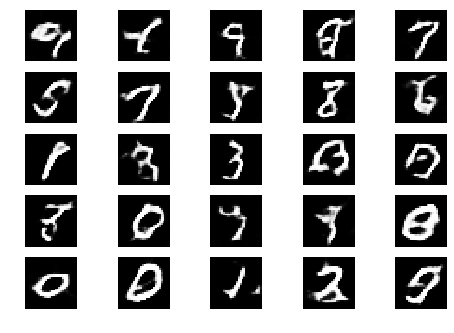

Epoch 0 Batch 501/937 [D loss: 0.650892, acc.: 62.50%] [G loss: 0.880043]
Epoch 0 Batch 502/937 [D loss: 0.717589, acc.: 59.38%] [G loss: 1.090952]
Epoch 0 Batch 503/937 [D loss: 0.644865, acc.: 62.50%] [G loss: 1.045998]
Epoch 0 Batch 504/937 [D loss: 0.618785, acc.: 62.50%] [G loss: 1.273389]
Epoch 0 Batch 505/937 [D loss: 0.565019, acc.: 75.00%] [G loss: 1.113064]


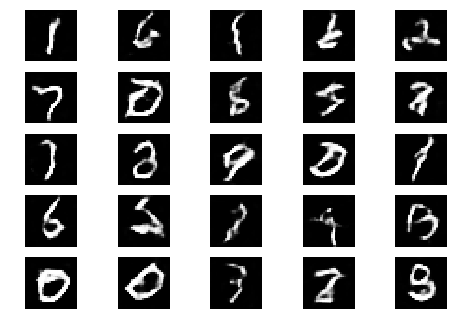

Epoch 0 Batch 506/937 [D loss: 0.566650, acc.: 65.62%] [G loss: 1.139622]
Epoch 0 Batch 507/937 [D loss: 0.641697, acc.: 59.38%] [G loss: 1.052539]
Epoch 0 Batch 508/937 [D loss: 0.684755, acc.: 71.88%] [G loss: 0.872566]
Epoch 0 Batch 509/937 [D loss: 0.572537, acc.: 65.62%] [G loss: 0.850506]
Epoch 0 Batch 510/937 [D loss: 0.615156, acc.: 68.75%] [G loss: 0.848274]


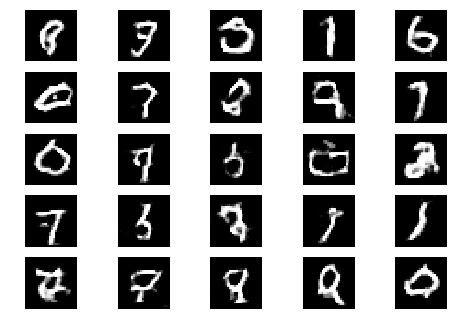

Epoch 0 Batch 511/937 [D loss: 0.552097, acc.: 78.12%] [G loss: 0.904096]
Epoch 0 Batch 512/937 [D loss: 0.809702, acc.: 46.88%] [G loss: 0.890328]
Epoch 0 Batch 513/937 [D loss: 0.732926, acc.: 40.62%] [G loss: 1.081311]
Epoch 0 Batch 514/937 [D loss: 0.745869, acc.: 46.88%] [G loss: 0.999630]
Epoch 0 Batch 515/937 [D loss: 0.560093, acc.: 68.75%] [G loss: 0.844638]
Epoch 0 Batch 516/937 [D loss: 0.786654, acc.: 43.75%] [G loss: 0.696913]
Epoch 0 Batch 517/937 [D loss: 0.637588, acc.: 68.75%] [G loss: 0.989616]
Epoch 0 Batch 518/937 [D loss: 0.681512, acc.: 65.62%] [G loss: 1.240755]
Epoch 0 Batch 519/937 [D loss: 0.602471, acc.: 75.00%] [G loss: 0.852968]
Epoch 0 Batch 520/937 [D loss: 0.653840, acc.: 53.12%] [G loss: 0.906950]
Epoch 0 Batch 521/937 [D loss: 0.610856, acc.: 62.50%] [G loss: 1.376469]
Epoch 0 Batch 522/937 [D loss: 0.600367, acc.: 68.75%] [G loss: 1.150445]
Epoch 0 Batch 523/937 [D loss: 0.577736, acc.: 71.88%] [G loss: 0.921561]
Epoch 0 Batch 524/937 [D loss: 0.67767

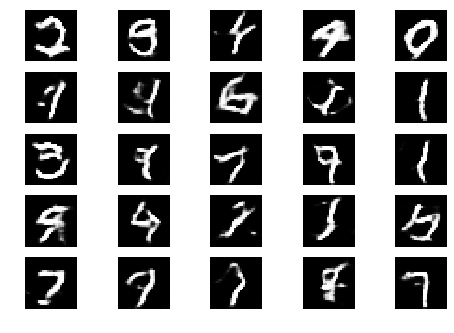

Epoch 0 Batch 601/937 [D loss: 0.781322, acc.: 50.00%] [G loss: 0.976388]
Epoch 0 Batch 602/937 [D loss: 0.540519, acc.: 68.75%] [G loss: 0.971821]
Epoch 0 Batch 603/937 [D loss: 0.591007, acc.: 59.38%] [G loss: 1.050040]
Epoch 0 Batch 604/937 [D loss: 0.903408, acc.: 43.75%] [G loss: 1.003135]
Epoch 0 Batch 605/937 [D loss: 0.687107, acc.: 56.25%] [G loss: 0.867315]
Epoch 0 Batch 606/937 [D loss: 0.663092, acc.: 59.38%] [G loss: 1.056998]


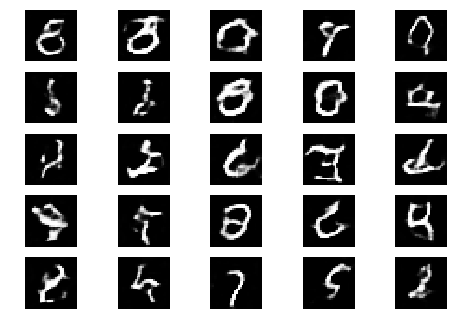

Epoch 0 Batch 607/937 [D loss: 0.541477, acc.: 84.38%] [G loss: 1.196067]
Epoch 0 Batch 608/937 [D loss: 0.841030, acc.: 34.38%] [G loss: 1.053824]
Epoch 0 Batch 609/937 [D loss: 0.649202, acc.: 56.25%] [G loss: 0.857571]
Epoch 0 Batch 610/937 [D loss: 0.410848, acc.: 90.62%] [G loss: 0.972761]
Epoch 0 Batch 611/937 [D loss: 0.685718, acc.: 53.12%] [G loss: 1.082958]
Epoch 0 Batch 612/937 [D loss: 0.535473, acc.: 81.25%] [G loss: 1.027977]


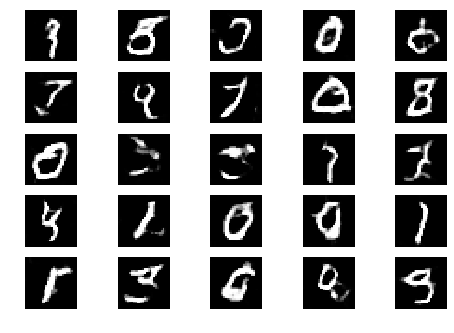

Epoch 0 Batch 613/937 [D loss: 0.628997, acc.: 65.62%] [G loss: 0.948869]
Epoch 0 Batch 614/937 [D loss: 0.591183, acc.: 62.50%] [G loss: 0.887582]
Epoch 0 Batch 615/937 [D loss: 0.707769, acc.: 53.12%] [G loss: 0.970164]
Epoch 0 Batch 616/937 [D loss: 0.679896, acc.: 56.25%] [G loss: 1.046642]
Epoch 0 Batch 617/937 [D loss: 0.933820, acc.: 40.62%] [G loss: 0.913111]
Epoch 0 Batch 618/937 [D loss: 0.758551, acc.: 43.75%] [G loss: 1.248031]
Epoch 0 Batch 619/937 [D loss: 0.628704, acc.: 62.50%] [G loss: 1.074056]
Epoch 0 Batch 620/937 [D loss: 0.687102, acc.: 53.12%] [G loss: 1.263255]
Epoch 0 Batch 621/937 [D loss: 0.737437, acc.: 56.25%] [G loss: 1.100883]
Epoch 0 Batch 622/937 [D loss: 0.566743, acc.: 75.00%] [G loss: 0.964932]
Epoch 0 Batch 623/937 [D loss: 0.695806, acc.: 53.12%] [G loss: 0.920263]
Epoch 0 Batch 624/937 [D loss: 0.687295, acc.: 65.62%] [G loss: 1.006356]
Epoch 0 Batch 625/937 [D loss: 0.664749, acc.: 65.62%] [G loss: 1.063372]
Epoch 0 Batch 626/937 [D loss: 0.69216

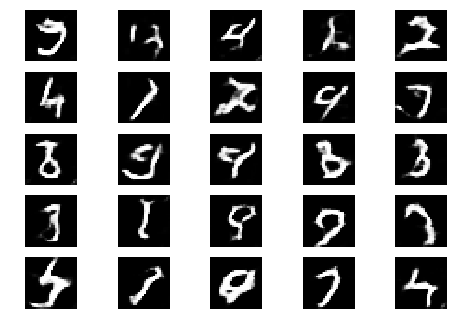

Epoch 0 Batch 701/937 [D loss: 0.765621, acc.: 50.00%] [G loss: 0.915999]
Epoch 0 Batch 702/937 [D loss: 0.711831, acc.: 46.88%] [G loss: 1.007743]
Epoch 0 Batch 703/937 [D loss: 0.575361, acc.: 65.62%] [G loss: 1.211091]
Epoch 0 Batch 704/937 [D loss: 0.648632, acc.: 65.62%] [G loss: 0.977103]
Epoch 0 Batch 705/937 [D loss: 0.599676, acc.: 59.38%] [G loss: 0.942828]
Epoch 0 Batch 706/937 [D loss: 0.687197, acc.: 65.62%] [G loss: 0.715040]
Epoch 0 Batch 707/937 [D loss: 0.619464, acc.: 68.75%] [G loss: 1.040620]


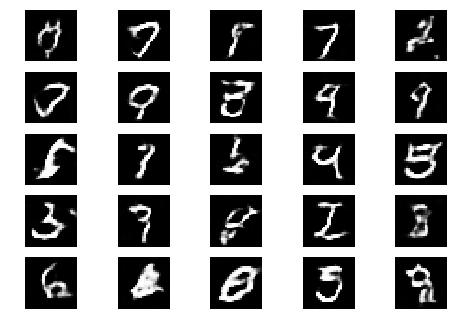

Epoch 0 Batch 708/937 [D loss: 0.608777, acc.: 65.62%] [G loss: 1.129842]
Epoch 0 Batch 709/937 [D loss: 0.637602, acc.: 65.62%] [G loss: 1.023559]
Epoch 0 Batch 710/937 [D loss: 0.511511, acc.: 81.25%] [G loss: 1.180608]
Epoch 0 Batch 711/937 [D loss: 0.605963, acc.: 56.25%] [G loss: 0.925156]
Epoch 0 Batch 712/937 [D loss: 0.663457, acc.: 56.25%] [G loss: 0.878322]
Epoch 0 Batch 713/937 [D loss: 0.671741, acc.: 65.62%] [G loss: 1.053747]
Epoch 0 Batch 714/937 [D loss: 0.661346, acc.: 56.25%] [G loss: 1.269505]


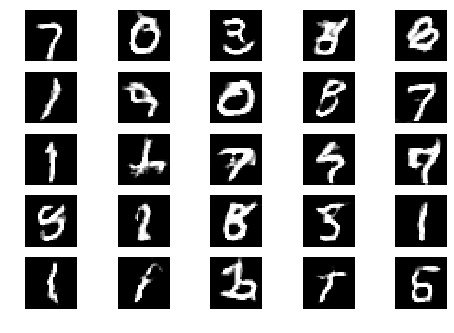

Epoch 0 Batch 715/937 [D loss: 0.622650, acc.: 68.75%] [G loss: 0.990930]
Epoch 0 Batch 716/937 [D loss: 0.760200, acc.: 56.25%] [G loss: 0.873333]
Epoch 0 Batch 717/937 [D loss: 0.457915, acc.: 78.12%] [G loss: 1.137265]
Epoch 0 Batch 718/937 [D loss: 0.805430, acc.: 40.62%] [G loss: 1.020123]
Epoch 0 Batch 719/937 [D loss: 0.678284, acc.: 59.38%] [G loss: 1.101931]
Epoch 0 Batch 720/937 [D loss: 0.536041, acc.: 78.12%] [G loss: 1.013775]
Epoch 0 Batch 721/937 [D loss: 0.738780, acc.: 53.12%] [G loss: 1.168333]
Epoch 0 Batch 722/937 [D loss: 0.532605, acc.: 68.75%] [G loss: 1.000125]
Epoch 0 Batch 723/937 [D loss: 0.720741, acc.: 56.25%] [G loss: 1.231530]
Epoch 0 Batch 724/937 [D loss: 0.767259, acc.: 43.75%] [G loss: 1.262452]
Epoch 0 Batch 725/937 [D loss: 0.809389, acc.: 34.38%] [G loss: 0.881454]
Epoch 0 Batch 726/937 [D loss: 0.785367, acc.: 46.88%] [G loss: 1.091509]
Epoch 0 Batch 727/937 [D loss: 0.682248, acc.: 50.00%] [G loss: 1.002890]
Epoch 0 Batch 728/937 [D loss: 0.59720

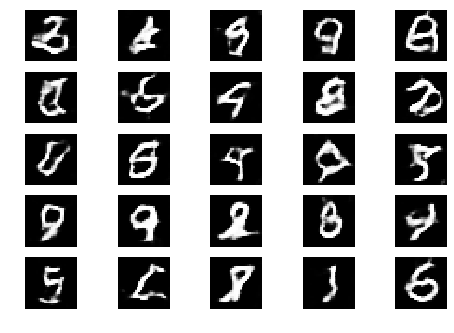

Epoch 0 Batch 801/937 [D loss: 0.578110, acc.: 71.88%] [G loss: 1.092077]
Epoch 0 Batch 802/937 [D loss: 0.544910, acc.: 65.62%] [G loss: 1.145047]
Epoch 0 Batch 803/937 [D loss: 0.586117, acc.: 65.62%] [G loss: 1.026647]
Epoch 0 Batch 804/937 [D loss: 0.609065, acc.: 71.88%] [G loss: 1.133801]
Epoch 0 Batch 805/937 [D loss: 0.760145, acc.: 53.12%] [G loss: 1.080664]
Epoch 0 Batch 806/937 [D loss: 0.597096, acc.: 71.88%] [G loss: 0.874722]
Epoch 0 Batch 807/937 [D loss: 0.691177, acc.: 68.75%] [G loss: 1.003693]
Epoch 0 Batch 808/937 [D loss: 0.662215, acc.: 71.88%] [G loss: 1.230407]


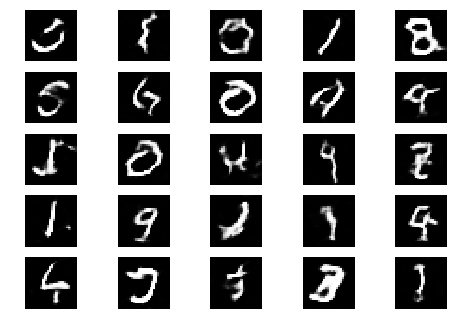

Epoch 0 Batch 809/937 [D loss: 0.589378, acc.: 68.75%] [G loss: 1.126317]
Epoch 0 Batch 810/937 [D loss: 0.666527, acc.: 62.50%] [G loss: 1.158877]
Epoch 0 Batch 811/937 [D loss: 0.609409, acc.: 68.75%] [G loss: 1.030166]
Epoch 0 Batch 812/937 [D loss: 0.664443, acc.: 59.38%] [G loss: 0.915978]
Epoch 0 Batch 813/937 [D loss: 0.518446, acc.: 81.25%] [G loss: 1.049763]
Epoch 0 Batch 814/937 [D loss: 0.713484, acc.: 46.88%] [G loss: 1.213537]
Epoch 0 Batch 815/937 [D loss: 0.831072, acc.: 43.75%] [G loss: 0.869198]
Epoch 0 Batch 816/937 [D loss: 0.602600, acc.: 68.75%] [G loss: 1.301631]


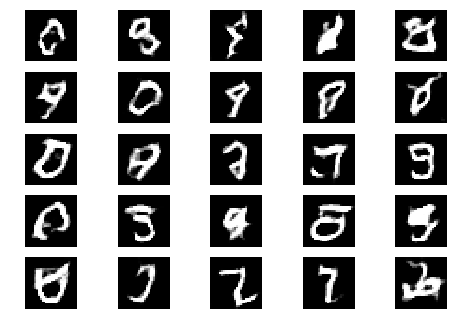

Epoch 0 Batch 817/937 [D loss: 0.563217, acc.: 65.62%] [G loss: 1.312209]
Epoch 0 Batch 818/937 [D loss: 0.587828, acc.: 65.62%] [G loss: 1.178574]
Epoch 0 Batch 819/937 [D loss: 0.609364, acc.: 65.62%] [G loss: 1.040705]
Epoch 0 Batch 820/937 [D loss: 0.589174, acc.: 75.00%] [G loss: 0.967247]
Epoch 0 Batch 821/937 [D loss: 0.635789, acc.: 62.50%] [G loss: 0.920779]
Epoch 0 Batch 822/937 [D loss: 0.554645, acc.: 71.88%] [G loss: 0.913841]
Epoch 0 Batch 823/937 [D loss: 0.661650, acc.: 59.38%] [G loss: 1.016374]
Epoch 0 Batch 824/937 [D loss: 0.640936, acc.: 65.62%] [G loss: 0.985728]
Epoch 0 Batch 825/937 [D loss: 0.512125, acc.: 75.00%] [G loss: 1.175148]
Epoch 0 Batch 826/937 [D loss: 0.687468, acc.: 53.12%] [G loss: 0.958525]
Epoch 0 Batch 827/937 [D loss: 0.665301, acc.: 56.25%] [G loss: 1.073063]
Epoch 0 Batch 828/937 [D loss: 0.669216, acc.: 68.75%] [G loss: 1.174878]
Epoch 0 Batch 829/937 [D loss: 0.477866, acc.: 84.38%] [G loss: 1.164982]
Epoch 0 Batch 830/937 [D loss: 0.62582

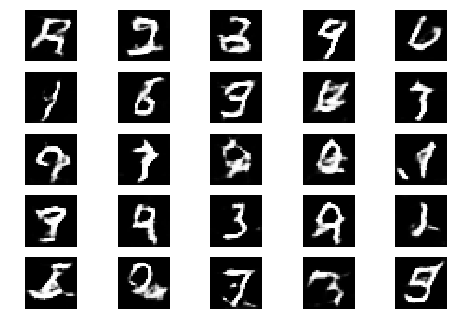

Epoch 0 Batch 901/937 [D loss: 0.755439, acc.: 46.88%] [G loss: 0.814219]
Epoch 0 Batch 902/937 [D loss: 0.652188, acc.: 65.62%] [G loss: 0.804149]
Epoch 0 Batch 903/937 [D loss: 0.699559, acc.: 53.12%] [G loss: 0.955052]
Epoch 0 Batch 904/937 [D loss: 0.516605, acc.: 71.88%] [G loss: 0.949873]
Epoch 0 Batch 905/937 [D loss: 0.592934, acc.: 68.75%] [G loss: 0.955149]
Epoch 0 Batch 906/937 [D loss: 0.640414, acc.: 75.00%] [G loss: 0.987954]
Epoch 0 Batch 907/937 [D loss: 0.584308, acc.: 71.88%] [G loss: 0.915696]
Epoch 0 Batch 908/937 [D loss: 0.513973, acc.: 81.25%] [G loss: 1.192088]
Epoch 0 Batch 909/937 [D loss: 0.818210, acc.: 53.12%] [G loss: 0.817147]


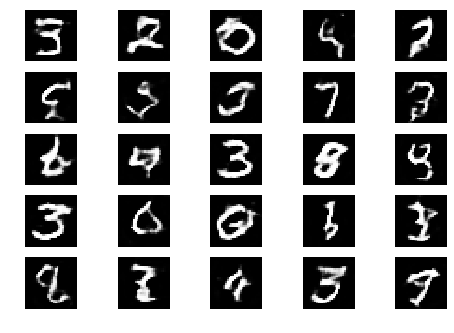

Epoch 0 Batch 910/937 [D loss: 0.652130, acc.: 62.50%] [G loss: 0.768832]
Epoch 0 Batch 911/937 [D loss: 0.734178, acc.: 43.75%] [G loss: 0.943554]
Epoch 0 Batch 912/937 [D loss: 0.512961, acc.: 78.12%] [G loss: 1.272078]
Epoch 0 Batch 913/937 [D loss: 0.598722, acc.: 65.62%] [G loss: 1.104780]
Epoch 0 Batch 914/937 [D loss: 0.820869, acc.: 56.25%] [G loss: 1.055119]
Epoch 0 Batch 915/937 [D loss: 0.511773, acc.: 81.25%] [G loss: 1.008453]
Epoch 0 Batch 916/937 [D loss: 0.554280, acc.: 68.75%] [G loss: 1.080598]
Epoch 0 Batch 917/937 [D loss: 0.750683, acc.: 50.00%] [G loss: 1.366010]
Epoch 0 Batch 918/937 [D loss: 0.600278, acc.: 65.62%] [G loss: 1.018154]


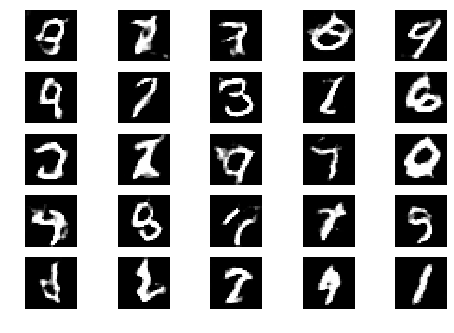

Epoch 0 Batch 919/937 [D loss: 0.684146, acc.: 65.62%] [G loss: 0.886215]
Epoch 0 Batch 920/937 [D loss: 0.683418, acc.: 65.62%] [G loss: 1.162035]
Epoch 0 Batch 921/937 [D loss: 0.822952, acc.: 40.62%] [G loss: 1.093146]
Epoch 0 Batch 922/937 [D loss: 0.602504, acc.: 71.88%] [G loss: 1.212234]
Epoch 0 Batch 923/937 [D loss: 0.962077, acc.: 34.38%] [G loss: 1.106579]
Epoch 0 Batch 924/937 [D loss: 0.613005, acc.: 71.88%] [G loss: 1.157935]
Epoch 0 Batch 925/937 [D loss: 0.634352, acc.: 59.38%] [G loss: 1.084960]
Epoch 0 Batch 926/937 [D loss: 0.509569, acc.: 84.38%] [G loss: 1.102838]
Epoch 0 Batch 927/937 [D loss: 0.555606, acc.: 71.88%] [G loss: 1.192313]
Epoch 0 Batch 928/937 [D loss: 0.556135, acc.: 71.88%] [G loss: 1.010347]
Epoch 0 Batch 929/937 [D loss: 0.575497, acc.: 65.62%] [G loss: 0.937565]
Epoch 0 Batch 930/937 [D loss: 0.628753, acc.: 65.62%] [G loss: 1.231013]
Epoch 0 Batch 931/937 [D loss: 0.728341, acc.: 46.88%] [G loss: 0.983466]
Epoch 0 Batch 932/937 [D loss: 0.69385

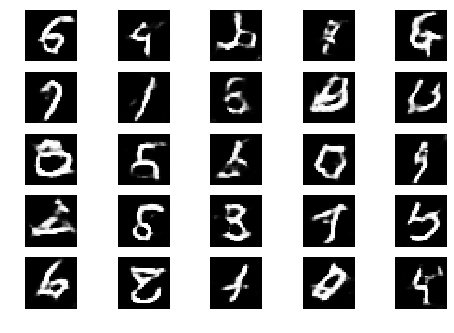

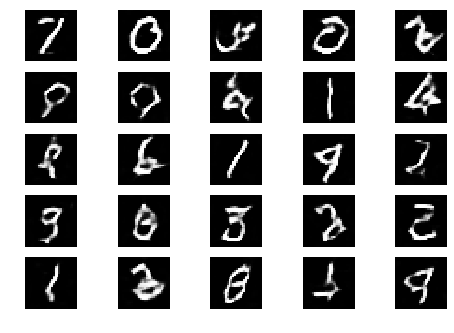

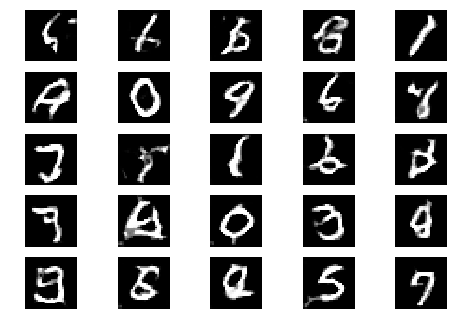

Epoch 1 Batch 1/937 [D loss: 0.630470, acc.: 68.75%] [G loss: 1.202999]
Epoch 1 Batch 2/937 [D loss: 0.616633, acc.: 68.75%] [G loss: 1.148127]
Epoch 1 Batch 3/937 [D loss: 0.719179, acc.: 53.12%] [G loss: 1.155885]
Epoch 1 Batch 4/937 [D loss: 0.753494, acc.: 50.00%] [G loss: 1.259425]
Epoch 1 Batch 5/937 [D loss: 0.532544, acc.: 71.88%] [G loss: 1.186513]
Epoch 1 Batch 6/937 [D loss: 0.547738, acc.: 75.00%] [G loss: 1.040099]
Epoch 1 Batch 7/937 [D loss: 0.774548, acc.: 46.88%] [G loss: 0.946967]
Epoch 1 Batch 8/937 [D loss: 0.556343, acc.: 62.50%] [G loss: 1.086563]
Epoch 1 Batch 9/937 [D loss: 0.752206, acc.: 46.88%] [G loss: 1.104012]
Epoch 1 Batch 10/937 [D loss: 0.767303, acc.: 40.62%] [G loss: 1.108628]
Epoch 1 Batch 11/937 [D loss: 0.657766, acc.: 56.25%] [G loss: 1.105138]
Epoch 1 Batch 12/937 [D loss: 0.752604, acc.: 43.75%] [G loss: 1.105778]
Epoch 1 Batch 13/937 [D loss: 0.513739, acc.: 78.12%] [G loss: 0.945426]
Epoch 1 Batch 14/937 [D loss: 0.780810, acc.: 50.00%] [G los

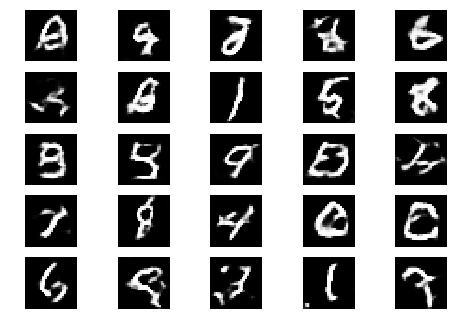

Epoch 1 Batch 101/937 [D loss: 0.664086, acc.: 53.12%] [G loss: 0.979248]


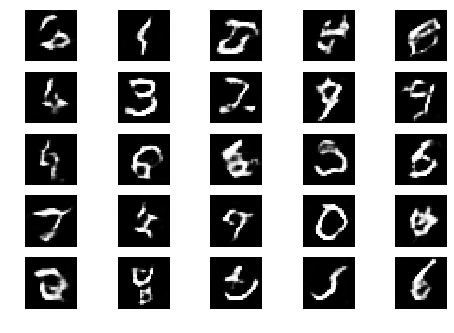

Epoch 1 Batch 102/937 [D loss: 0.657464, acc.: 62.50%] [G loss: 1.021304]


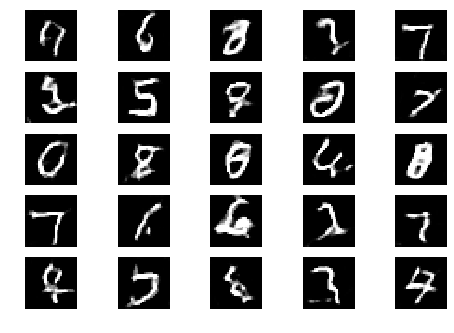

Epoch 1 Batch 103/937 [D loss: 0.678225, acc.: 62.50%] [G loss: 1.033856]
Epoch 1 Batch 104/937 [D loss: 0.539486, acc.: 71.88%] [G loss: 1.066697]
Epoch 1 Batch 105/937 [D loss: 0.542034, acc.: 71.88%] [G loss: 0.743983]
Epoch 1 Batch 106/937 [D loss: 0.566155, acc.: 75.00%] [G loss: 1.105034]
Epoch 1 Batch 107/937 [D loss: 0.518458, acc.: 75.00%] [G loss: 1.150158]
Epoch 1 Batch 108/937 [D loss: 0.736715, acc.: 59.38%] [G loss: 1.126945]
Epoch 1 Batch 109/937 [D loss: 0.822021, acc.: 50.00%] [G loss: 0.915642]
Epoch 1 Batch 110/937 [D loss: 0.553418, acc.: 65.62%] [G loss: 0.918466]
Epoch 1 Batch 111/937 [D loss: 0.447920, acc.: 87.50%] [G loss: 0.874998]
Epoch 1 Batch 112/937 [D loss: 0.608229, acc.: 68.75%] [G loss: 1.142382]
Epoch 1 Batch 113/937 [D loss: 0.710768, acc.: 56.25%] [G loss: 0.972851]
Epoch 1 Batch 114/937 [D loss: 0.657216, acc.: 56.25%] [G loss: 1.002725]
Epoch 1 Batch 115/937 [D loss: 0.670172, acc.: 68.75%] [G loss: 0.756185]
Epoch 1 Batch 116/937 [D loss: 0.50142

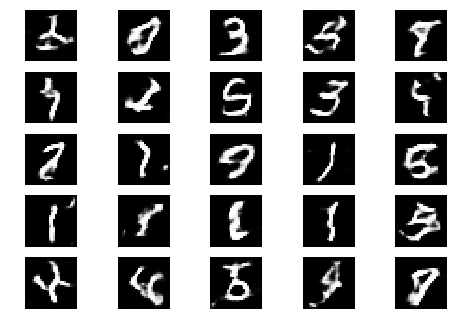

Epoch 1 Batch 201/937 [D loss: 0.728372, acc.: 59.38%] [G loss: 1.209890]
Epoch 1 Batch 202/937 [D loss: 0.646563, acc.: 59.38%] [G loss: 1.222829]


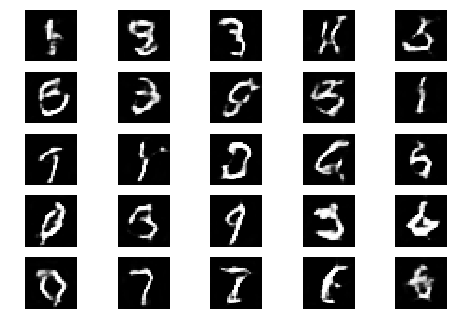

Epoch 1 Batch 203/937 [D loss: 0.861395, acc.: 43.75%] [G loss: 1.062690]
Epoch 1 Batch 204/937 [D loss: 0.620713, acc.: 62.50%] [G loss: 1.264866]


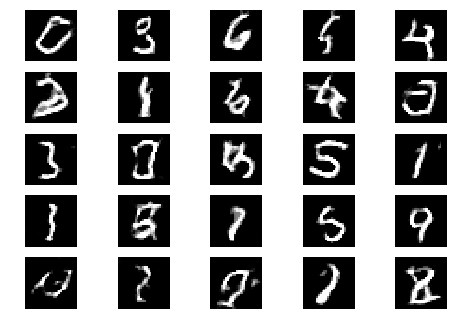

Epoch 1 Batch 205/937 [D loss: 0.673548, acc.: 68.75%] [G loss: 1.099958]
Epoch 1 Batch 206/937 [D loss: 0.827195, acc.: 50.00%] [G loss: 0.937045]
Epoch 1 Batch 207/937 [D loss: 0.721600, acc.: 53.12%] [G loss: 0.952269]
Epoch 1 Batch 208/937 [D loss: 0.712191, acc.: 53.12%] [G loss: 0.878324]
Epoch 1 Batch 209/937 [D loss: 0.624905, acc.: 71.88%] [G loss: 0.983849]
Epoch 1 Batch 210/937 [D loss: 0.696339, acc.: 50.00%] [G loss: 1.028341]
Epoch 1 Batch 211/937 [D loss: 0.633415, acc.: 65.62%] [G loss: 1.110466]
Epoch 1 Batch 212/937 [D loss: 0.542393, acc.: 75.00%] [G loss: 1.313430]
Epoch 1 Batch 213/937 [D loss: 0.582504, acc.: 68.75%] [G loss: 1.394863]
Epoch 1 Batch 214/937 [D loss: 0.924652, acc.: 34.38%] [G loss: 1.295031]
Epoch 1 Batch 215/937 [D loss: 0.569392, acc.: 71.88%] [G loss: 0.949065]
Epoch 1 Batch 216/937 [D loss: 0.590962, acc.: 68.75%] [G loss: 1.271659]
Epoch 1 Batch 217/937 [D loss: 0.608054, acc.: 71.88%] [G loss: 1.011545]
Epoch 1 Batch 218/937 [D loss: 0.71094

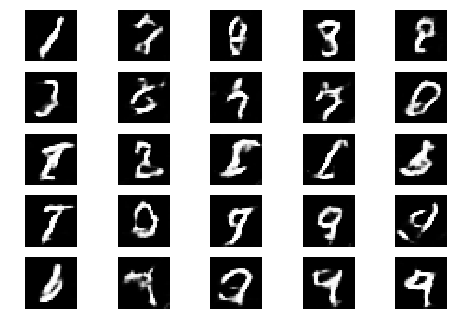

Epoch 1 Batch 301/937 [D loss: 0.708816, acc.: 53.12%] [G loss: 1.064794]
Epoch 1 Batch 302/937 [D loss: 0.657226, acc.: 71.88%] [G loss: 1.137261]
Epoch 1 Batch 303/937 [D loss: 0.606106, acc.: 65.62%] [G loss: 1.381121]


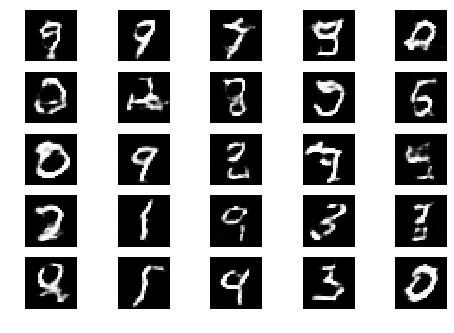

Epoch 1 Batch 304/937 [D loss: 0.642797, acc.: 59.38%] [G loss: 1.456632]
Epoch 1 Batch 305/937 [D loss: 0.636742, acc.: 62.50%] [G loss: 0.992896]
Epoch 1 Batch 306/937 [D loss: 0.784223, acc.: 50.00%] [G loss: 1.140781]


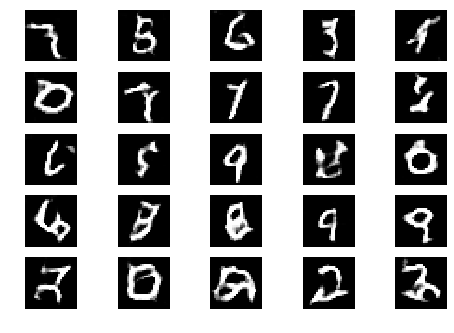

Epoch 1 Batch 307/937 [D loss: 0.750796, acc.: 50.00%] [G loss: 0.999242]
Epoch 1 Batch 308/937 [D loss: 0.559439, acc.: 65.62%] [G loss: 0.939557]
Epoch 1 Batch 309/937 [D loss: 0.575832, acc.: 81.25%] [G loss: 0.960641]
Epoch 1 Batch 310/937 [D loss: 0.794701, acc.: 56.25%] [G loss: 0.847204]
Epoch 1 Batch 311/937 [D loss: 0.697546, acc.: 62.50%] [G loss: 0.916271]
Epoch 1 Batch 312/937 [D loss: 0.706284, acc.: 62.50%] [G loss: 1.011311]
Epoch 1 Batch 313/937 [D loss: 0.621173, acc.: 71.88%] [G loss: 1.034204]
Epoch 1 Batch 314/937 [D loss: 0.531398, acc.: 81.25%] [G loss: 1.151832]
Epoch 1 Batch 315/937 [D loss: 0.515179, acc.: 84.38%] [G loss: 1.219925]
Epoch 1 Batch 316/937 [D loss: 0.581605, acc.: 75.00%] [G loss: 0.911401]
Epoch 1 Batch 317/937 [D loss: 0.532004, acc.: 71.88%] [G loss: 1.116041]
Epoch 1 Batch 318/937 [D loss: 0.708808, acc.: 59.38%] [G loss: 1.188198]
Epoch 1 Batch 319/937 [D loss: 0.578435, acc.: 59.38%] [G loss: 0.783288]
Epoch 1 Batch 320/937 [D loss: 0.76948

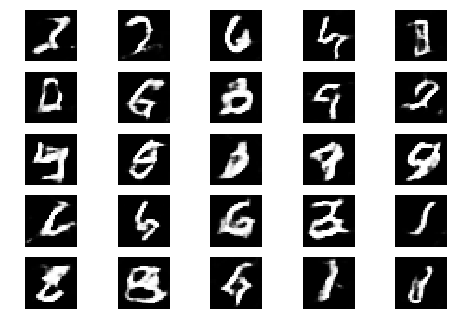

Epoch 1 Batch 401/937 [D loss: 0.558030, acc.: 71.88%] [G loss: 1.050384]
Epoch 1 Batch 402/937 [D loss: 0.623370, acc.: 65.62%] [G loss: 1.125375]
Epoch 1 Batch 403/937 [D loss: 0.561232, acc.: 71.88%] [G loss: 1.154963]
Epoch 1 Batch 404/937 [D loss: 0.478380, acc.: 81.25%] [G loss: 1.130475]


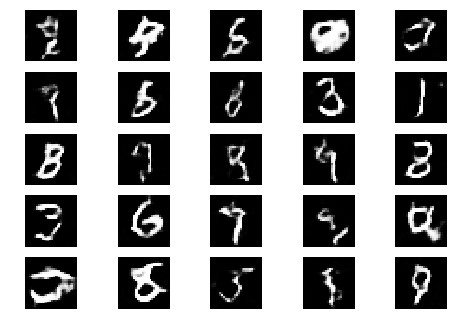

Epoch 1 Batch 405/937 [D loss: 0.797692, acc.: 53.12%] [G loss: 1.023873]
Epoch 1 Batch 406/937 [D loss: 0.515105, acc.: 78.12%] [G loss: 0.968502]
Epoch 1 Batch 407/937 [D loss: 0.914005, acc.: 37.50%] [G loss: 0.884306]
Epoch 1 Batch 408/937 [D loss: 0.591882, acc.: 65.62%] [G loss: 1.094239]


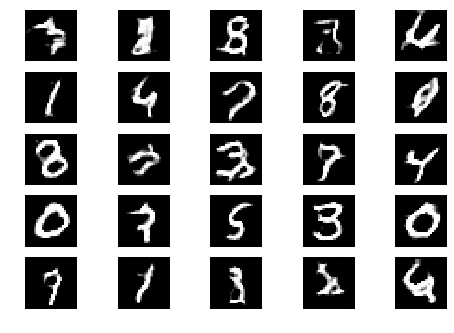

Epoch 1 Batch 409/937 [D loss: 0.612625, acc.: 62.50%] [G loss: 1.109070]
Epoch 1 Batch 410/937 [D loss: 0.560386, acc.: 68.75%] [G loss: 1.125532]
Epoch 1 Batch 411/937 [D loss: 0.571926, acc.: 65.62%] [G loss: 0.920132]
Epoch 1 Batch 412/937 [D loss: 0.551643, acc.: 75.00%] [G loss: 1.081479]
Epoch 1 Batch 413/937 [D loss: 0.744840, acc.: 59.38%] [G loss: 0.907482]
Epoch 1 Batch 414/937 [D loss: 0.720955, acc.: 50.00%] [G loss: 1.047863]
Epoch 1 Batch 415/937 [D loss: 0.599560, acc.: 65.62%] [G loss: 1.205421]
Epoch 1 Batch 416/937 [D loss: 0.595506, acc.: 59.38%] [G loss: 1.222720]
Epoch 1 Batch 417/937 [D loss: 0.589708, acc.: 65.62%] [G loss: 1.127004]
Epoch 1 Batch 418/937 [D loss: 0.500658, acc.: 78.12%] [G loss: 0.975259]
Epoch 1 Batch 419/937 [D loss: 0.706983, acc.: 53.12%] [G loss: 0.805276]
Epoch 1 Batch 420/937 [D loss: 0.629576, acc.: 68.75%] [G loss: 0.837532]
Epoch 1 Batch 421/937 [D loss: 0.745999, acc.: 43.75%] [G loss: 0.887099]
Epoch 1 Batch 422/937 [D loss: 0.56935

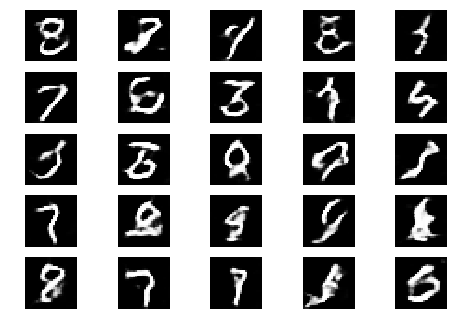

Epoch 1 Batch 501/937 [D loss: 0.684705, acc.: 56.25%] [G loss: 0.902829]
Epoch 1 Batch 502/937 [D loss: 0.768766, acc.: 56.25%] [G loss: 1.145643]
Epoch 1 Batch 503/937 [D loss: 0.676032, acc.: 59.38%] [G loss: 1.115753]
Epoch 1 Batch 504/937 [D loss: 0.604410, acc.: 65.62%] [G loss: 1.183425]
Epoch 1 Batch 505/937 [D loss: 0.584292, acc.: 65.62%] [G loss: 1.010468]


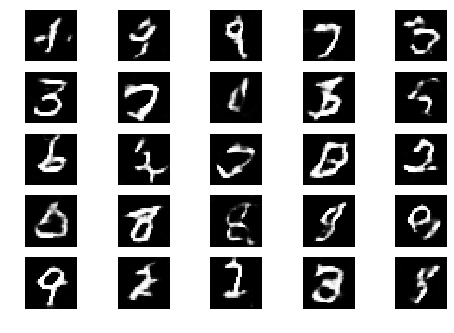

Epoch 1 Batch 506/937 [D loss: 0.689463, acc.: 40.62%] [G loss: 1.023051]
Epoch 1 Batch 507/937 [D loss: 0.513151, acc.: 62.50%] [G loss: 1.132168]
Epoch 1 Batch 508/937 [D loss: 0.520451, acc.: 84.38%] [G loss: 1.053652]
Epoch 1 Batch 509/937 [D loss: 0.520590, acc.: 78.12%] [G loss: 0.902121]
Epoch 1 Batch 510/937 [D loss: 0.574513, acc.: 68.75%] [G loss: 1.172688]


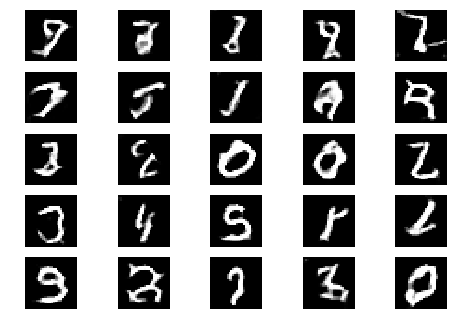

Epoch 1 Batch 511/937 [D loss: 0.644790, acc.: 65.62%] [G loss: 1.055468]
Epoch 1 Batch 512/937 [D loss: 0.662350, acc.: 56.25%] [G loss: 1.019553]
Epoch 1 Batch 513/937 [D loss: 0.742470, acc.: 59.38%] [G loss: 1.153929]
Epoch 1 Batch 514/937 [D loss: 0.602089, acc.: 65.62%] [G loss: 0.963081]
Epoch 1 Batch 515/937 [D loss: 0.608845, acc.: 68.75%] [G loss: 1.089239]
Epoch 1 Batch 516/937 [D loss: 0.788839, acc.: 53.12%] [G loss: 1.143268]
Epoch 1 Batch 517/937 [D loss: 0.620469, acc.: 46.88%] [G loss: 1.179292]
Epoch 1 Batch 518/937 [D loss: 0.751969, acc.: 53.12%] [G loss: 1.018102]
Epoch 1 Batch 519/937 [D loss: 0.658214, acc.: 56.25%] [G loss: 1.063543]
Epoch 1 Batch 520/937 [D loss: 0.800136, acc.: 46.88%] [G loss: 1.056488]
Epoch 1 Batch 521/937 [D loss: 0.476019, acc.: 87.50%] [G loss: 1.075656]
Epoch 1 Batch 522/937 [D loss: 0.652126, acc.: 59.38%] [G loss: 1.038213]
Epoch 1 Batch 523/937 [D loss: 0.782587, acc.: 43.75%] [G loss: 0.927701]
Epoch 1 Batch 524/937 [D loss: 0.53618

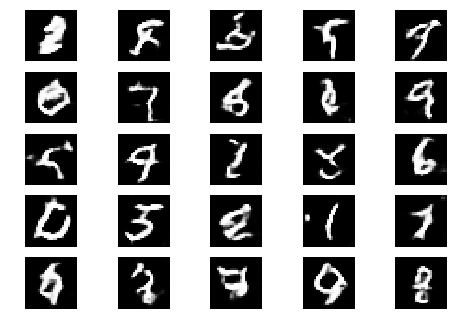

Epoch 1 Batch 601/937 [D loss: 0.653513, acc.: 65.62%] [G loss: 1.107076]
Epoch 1 Batch 602/937 [D loss: 0.729326, acc.: 59.38%] [G loss: 1.108817]
Epoch 1 Batch 603/937 [D loss: 0.850295, acc.: 31.25%] [G loss: 1.103000]
Epoch 1 Batch 604/937 [D loss: 0.579719, acc.: 71.88%] [G loss: 0.927562]
Epoch 1 Batch 605/937 [D loss: 0.591827, acc.: 75.00%] [G loss: 0.906374]
Epoch 1 Batch 606/937 [D loss: 0.707516, acc.: 56.25%] [G loss: 0.940719]


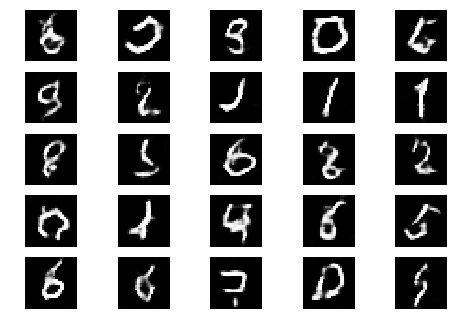

Epoch 1 Batch 607/937 [D loss: 0.678607, acc.: 62.50%] [G loss: 0.885803]
Epoch 1 Batch 608/937 [D loss: 0.722220, acc.: 56.25%] [G loss: 1.026804]
Epoch 1 Batch 609/937 [D loss: 0.582812, acc.: 68.75%] [G loss: 0.856149]
Epoch 1 Batch 610/937 [D loss: 0.549340, acc.: 75.00%] [G loss: 0.827382]
Epoch 1 Batch 611/937 [D loss: 0.790311, acc.: 56.25%] [G loss: 0.763015]
Epoch 1 Batch 612/937 [D loss: 0.611297, acc.: 56.25%] [G loss: 0.919122]


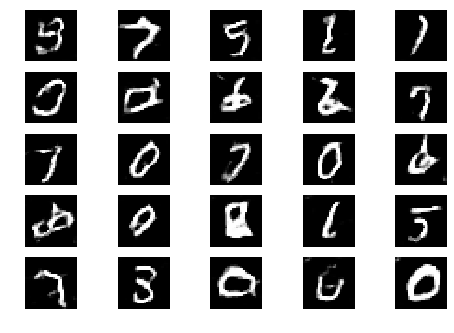

Epoch 1 Batch 613/937 [D loss: 0.609280, acc.: 65.62%] [G loss: 0.839127]
Epoch 1 Batch 614/937 [D loss: 0.555650, acc.: 68.75%] [G loss: 0.909886]
Epoch 1 Batch 615/937 [D loss: 0.582360, acc.: 65.62%] [G loss: 0.986310]
Epoch 1 Batch 616/937 [D loss: 0.602963, acc.: 65.62%] [G loss: 1.046356]
Epoch 1 Batch 617/937 [D loss: 0.660329, acc.: 65.62%] [G loss: 1.012582]
Epoch 1 Batch 618/937 [D loss: 0.666973, acc.: 59.38%] [G loss: 0.885852]
Epoch 1 Batch 619/937 [D loss: 0.628190, acc.: 62.50%] [G loss: 0.959120]
Epoch 1 Batch 620/937 [D loss: 0.772684, acc.: 50.00%] [G loss: 0.813892]
Epoch 1 Batch 621/937 [D loss: 0.752069, acc.: 62.50%] [G loss: 0.965223]
Epoch 1 Batch 622/937 [D loss: 0.608632, acc.: 65.62%] [G loss: 1.013541]
Epoch 1 Batch 623/937 [D loss: 0.739090, acc.: 50.00%] [G loss: 0.922049]
Epoch 1 Batch 624/937 [D loss: 0.611857, acc.: 65.62%] [G loss: 1.025315]
Epoch 1 Batch 625/937 [D loss: 0.629075, acc.: 65.62%] [G loss: 1.199375]
Epoch 1 Batch 626/937 [D loss: 0.59946

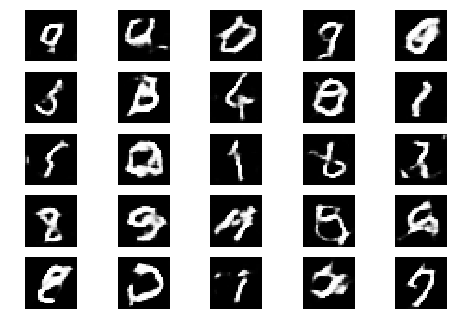

Epoch 1 Batch 701/937 [D loss: 0.798986, acc.: 43.75%] [G loss: 1.096301]
Epoch 1 Batch 702/937 [D loss: 0.600031, acc.: 62.50%] [G loss: 1.301409]
Epoch 1 Batch 703/937 [D loss: 0.680095, acc.: 62.50%] [G loss: 0.965217]
Epoch 1 Batch 704/937 [D loss: 0.674027, acc.: 59.38%] [G loss: 0.855606]
Epoch 1 Batch 705/937 [D loss: 0.749190, acc.: 59.38%] [G loss: 1.069557]
Epoch 1 Batch 706/937 [D loss: 0.671338, acc.: 59.38%] [G loss: 1.242519]
Epoch 1 Batch 707/937 [D loss: 0.581737, acc.: 65.62%] [G loss: 1.157834]


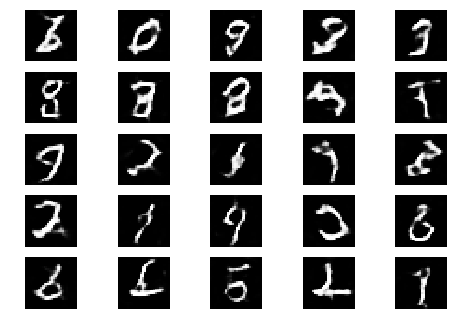

Epoch 1 Batch 708/937 [D loss: 0.524047, acc.: 71.88%] [G loss: 1.341411]
Epoch 1 Batch 709/937 [D loss: 0.551861, acc.: 71.88%] [G loss: 0.953590]
Epoch 1 Batch 710/937 [D loss: 0.531472, acc.: 75.00%] [G loss: 0.943724]
Epoch 1 Batch 711/937 [D loss: 0.615603, acc.: 59.38%] [G loss: 0.859918]
Epoch 1 Batch 712/937 [D loss: 0.642110, acc.: 56.25%] [G loss: 0.879410]
Epoch 1 Batch 713/937 [D loss: 0.648109, acc.: 62.50%] [G loss: 0.768192]
Epoch 1 Batch 714/937 [D loss: 0.573373, acc.: 71.88%] [G loss: 0.903219]


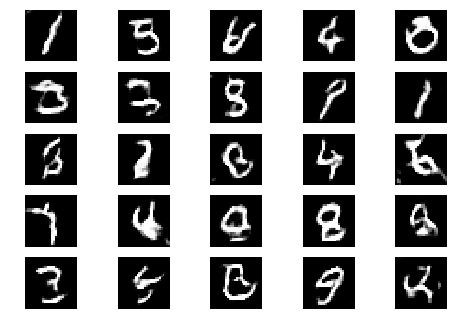

Epoch 1 Batch 715/937 [D loss: 0.580165, acc.: 65.62%] [G loss: 1.075651]
Epoch 1 Batch 716/937 [D loss: 0.589080, acc.: 68.75%] [G loss: 1.098954]
Epoch 1 Batch 717/937 [D loss: 0.714302, acc.: 56.25%] [G loss: 0.827617]
Epoch 1 Batch 718/937 [D loss: 0.766716, acc.: 50.00%] [G loss: 0.978069]
Epoch 1 Batch 719/937 [D loss: 0.621725, acc.: 68.75%] [G loss: 1.277935]
Epoch 1 Batch 720/937 [D loss: 0.570428, acc.: 65.62%] [G loss: 1.394535]
Epoch 1 Batch 721/937 [D loss: 0.679452, acc.: 59.38%] [G loss: 0.885444]
Epoch 1 Batch 722/937 [D loss: 0.686685, acc.: 65.62%] [G loss: 0.944345]
Epoch 1 Batch 723/937 [D loss: 0.565674, acc.: 71.88%] [G loss: 1.047470]
Epoch 1 Batch 724/937 [D loss: 0.891413, acc.: 43.75%] [G loss: 0.891999]
Epoch 1 Batch 725/937 [D loss: 0.700008, acc.: 50.00%] [G loss: 1.036359]
Epoch 1 Batch 726/937 [D loss: 0.652689, acc.: 53.12%] [G loss: 0.942718]
Epoch 1 Batch 727/937 [D loss: 0.460806, acc.: 90.62%] [G loss: 1.142236]
Epoch 1 Batch 728/937 [D loss: 0.69578

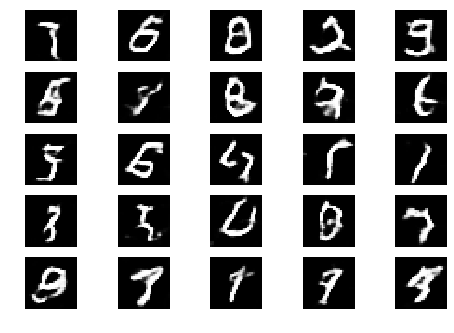

Epoch 1 Batch 801/937 [D loss: 0.464689, acc.: 81.25%] [G loss: 1.099093]
Epoch 1 Batch 802/937 [D loss: 0.641209, acc.: 59.38%] [G loss: 0.965694]
Epoch 1 Batch 803/937 [D loss: 0.670475, acc.: 59.38%] [G loss: 0.934025]
Epoch 1 Batch 804/937 [D loss: 0.646329, acc.: 56.25%] [G loss: 0.987342]
Epoch 1 Batch 805/937 [D loss: 0.552255, acc.: 68.75%] [G loss: 0.934754]
Epoch 1 Batch 806/937 [D loss: 0.584615, acc.: 68.75%] [G loss: 0.945735]
Epoch 1 Batch 807/937 [D loss: 0.693114, acc.: 59.38%] [G loss: 0.919271]
Epoch 1 Batch 808/937 [D loss: 0.731860, acc.: 59.38%] [G loss: 1.042434]


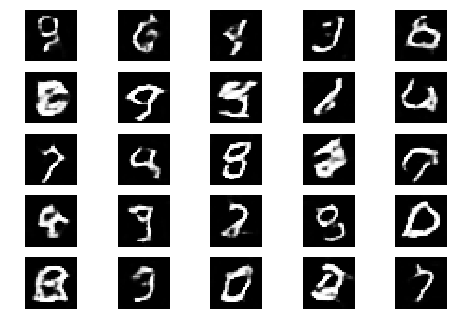

Epoch 1 Batch 809/937 [D loss: 0.477562, acc.: 87.50%] [G loss: 1.230670]
Epoch 1 Batch 810/937 [D loss: 0.692579, acc.: 53.12%] [G loss: 1.028286]
Epoch 1 Batch 811/937 [D loss: 0.834623, acc.: 43.75%] [G loss: 1.181495]
Epoch 1 Batch 812/937 [D loss: 0.633866, acc.: 59.38%] [G loss: 1.007071]
Epoch 1 Batch 813/937 [D loss: 0.544968, acc.: 71.88%] [G loss: 1.041450]
Epoch 1 Batch 814/937 [D loss: 0.640490, acc.: 65.62%] [G loss: 0.918415]
Epoch 1 Batch 815/937 [D loss: 0.638740, acc.: 62.50%] [G loss: 1.171251]
Epoch 1 Batch 816/937 [D loss: 0.525980, acc.: 75.00%] [G loss: 1.114281]


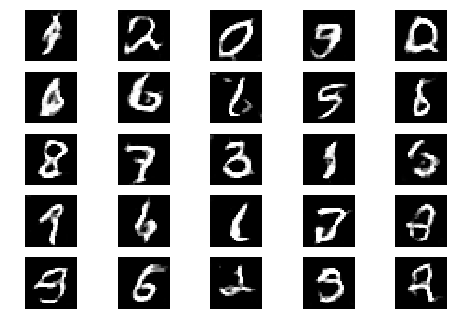

Epoch 1 Batch 817/937 [D loss: 0.548182, acc.: 84.38%] [G loss: 1.174996]
Epoch 1 Batch 818/937 [D loss: 0.721185, acc.: 56.25%] [G loss: 1.175413]
Epoch 1 Batch 819/937 [D loss: 0.588327, acc.: 75.00%] [G loss: 0.997636]
Epoch 1 Batch 820/937 [D loss: 0.647849, acc.: 59.38%] [G loss: 1.097709]
Epoch 1 Batch 821/937 [D loss: 0.475323, acc.: 81.25%] [G loss: 1.197819]
Epoch 1 Batch 822/937 [D loss: 0.810347, acc.: 37.50%] [G loss: 1.072162]
Epoch 1 Batch 823/937 [D loss: 0.594510, acc.: 71.88%] [G loss: 1.213713]
Epoch 1 Batch 824/937 [D loss: 0.591370, acc.: 68.75%] [G loss: 1.011400]
Epoch 1 Batch 825/937 [D loss: 0.732462, acc.: 53.12%] [G loss: 1.168189]
Epoch 1 Batch 826/937 [D loss: 0.501236, acc.: 71.88%] [G loss: 1.254712]
Epoch 1 Batch 827/937 [D loss: 0.604098, acc.: 59.38%] [G loss: 1.106920]
Epoch 1 Batch 828/937 [D loss: 0.686428, acc.: 59.38%] [G loss: 1.368205]
Epoch 1 Batch 829/937 [D loss: 0.658048, acc.: 59.38%] [G loss: 0.833047]
Epoch 1 Batch 830/937 [D loss: 0.79836

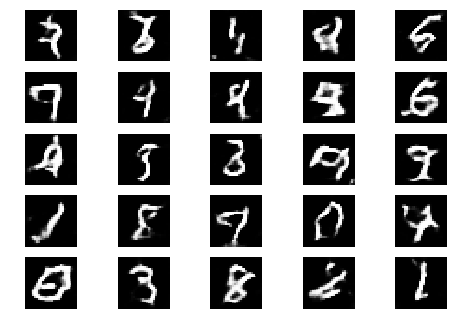

Epoch 1 Batch 901/937 [D loss: 0.636925, acc.: 68.75%] [G loss: 1.149947]
Epoch 1 Batch 902/937 [D loss: 0.528205, acc.: 78.12%] [G loss: 1.242959]
Epoch 1 Batch 903/937 [D loss: 0.752990, acc.: 46.88%] [G loss: 1.151096]
Epoch 1 Batch 904/937 [D loss: 0.776185, acc.: 53.12%] [G loss: 1.038480]
Epoch 1 Batch 905/937 [D loss: 0.548761, acc.: 81.25%] [G loss: 1.329130]
Epoch 1 Batch 906/937 [D loss: 0.732053, acc.: 53.12%] [G loss: 1.025082]
Epoch 1 Batch 907/937 [D loss: 0.651606, acc.: 59.38%] [G loss: 0.825028]
Epoch 1 Batch 908/937 [D loss: 0.594907, acc.: 68.75%] [G loss: 0.858075]
Epoch 1 Batch 909/937 [D loss: 0.659187, acc.: 50.00%] [G loss: 1.027494]


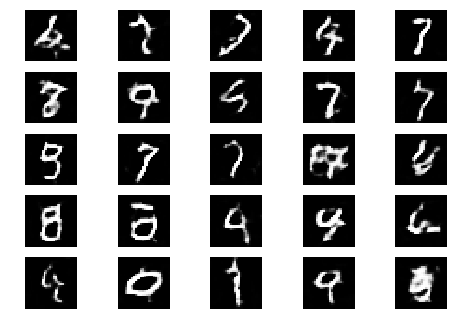

Epoch 1 Batch 910/937 [D loss: 0.539525, acc.: 75.00%] [G loss: 1.051072]
Epoch 1 Batch 911/937 [D loss: 0.711693, acc.: 62.50%] [G loss: 0.907077]
Epoch 1 Batch 912/937 [D loss: 0.786729, acc.: 50.00%] [G loss: 0.856021]
Epoch 1 Batch 913/937 [D loss: 0.718633, acc.: 53.12%] [G loss: 0.996429]
Epoch 1 Batch 914/937 [D loss: 0.684396, acc.: 50.00%] [G loss: 1.150823]
Epoch 1 Batch 915/937 [D loss: 0.599962, acc.: 68.75%] [G loss: 1.129957]
Epoch 1 Batch 916/937 [D loss: 0.560204, acc.: 71.88%] [G loss: 1.067134]
Epoch 1 Batch 917/937 [D loss: 0.472359, acc.: 78.12%] [G loss: 0.959410]
Epoch 1 Batch 918/937 [D loss: 0.651756, acc.: 59.38%] [G loss: 1.100955]


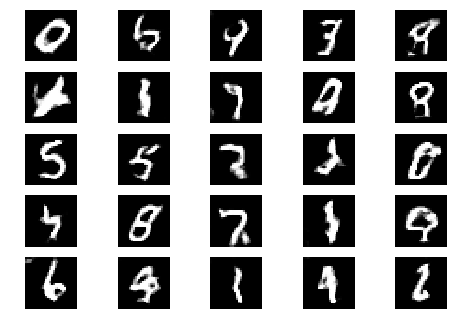

Epoch 1 Batch 919/937 [D loss: 0.543235, acc.: 68.75%] [G loss: 1.047497]
Epoch 1 Batch 920/937 [D loss: 0.654293, acc.: 56.25%] [G loss: 0.861084]
Epoch 1 Batch 921/937 [D loss: 0.553470, acc.: 78.12%] [G loss: 1.032923]
Epoch 1 Batch 922/937 [D loss: 0.562161, acc.: 75.00%] [G loss: 1.234864]
Epoch 1 Batch 923/937 [D loss: 0.510450, acc.: 68.75%] [G loss: 0.981377]
Epoch 1 Batch 924/937 [D loss: 0.761829, acc.: 59.38%] [G loss: 1.067533]
Epoch 1 Batch 925/937 [D loss: 0.503075, acc.: 81.25%] [G loss: 0.996326]
Epoch 1 Batch 926/937 [D loss: 0.692874, acc.: 62.50%] [G loss: 0.995275]
Epoch 1 Batch 927/937 [D loss: 0.700170, acc.: 59.38%] [G loss: 1.006051]
Epoch 1 Batch 928/937 [D loss: 0.568244, acc.: 71.88%] [G loss: 0.726967]
Epoch 1 Batch 929/937 [D loss: 0.660569, acc.: 59.38%] [G loss: 1.116612]
Epoch 1 Batch 930/937 [D loss: 0.681200, acc.: 53.12%] [G loss: 1.094904]
Epoch 1 Batch 931/937 [D loss: 0.586172, acc.: 68.75%] [G loss: 1.170430]
Epoch 1 Batch 932/937 [D loss: 0.83006

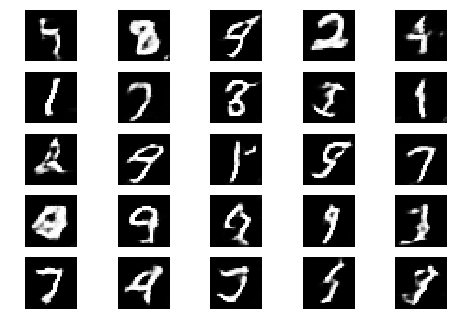

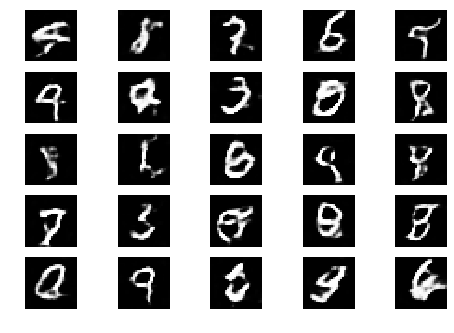

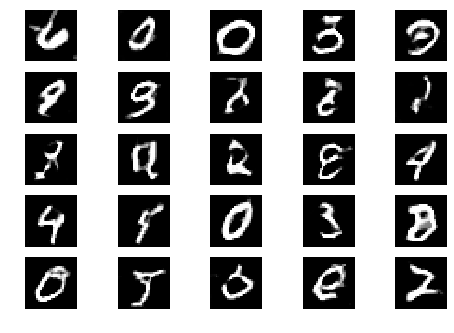

Epoch 2 Batch 1/937 [D loss: 0.658316, acc.: 56.25%] [G loss: 0.843434]
Epoch 2 Batch 2/937 [D loss: 0.621318, acc.: 62.50%] [G loss: 0.843675]
Epoch 2 Batch 3/937 [D loss: 0.690342, acc.: 62.50%] [G loss: 1.154464]
Epoch 2 Batch 4/937 [D loss: 0.903803, acc.: 40.62%] [G loss: 0.855967]
Epoch 2 Batch 5/937 [D loss: 0.728929, acc.: 46.88%] [G loss: 1.045826]
Epoch 2 Batch 6/937 [D loss: 0.584323, acc.: 71.88%] [G loss: 1.110826]
Epoch 2 Batch 7/937 [D loss: 0.579459, acc.: 75.00%] [G loss: 1.048477]
Epoch 2 Batch 8/937 [D loss: 0.549128, acc.: 71.88%] [G loss: 0.976062]
Epoch 2 Batch 9/937 [D loss: 0.541051, acc.: 78.12%] [G loss: 1.211041]
Epoch 2 Batch 10/937 [D loss: 0.551726, acc.: 75.00%] [G loss: 1.009182]
Epoch 2 Batch 11/937 [D loss: 0.501939, acc.: 81.25%] [G loss: 1.093017]
Epoch 2 Batch 12/937 [D loss: 0.616916, acc.: 62.50%] [G loss: 0.967971]
Epoch 2 Batch 13/937 [D loss: 0.562088, acc.: 68.75%] [G loss: 0.749510]
Epoch 2 Batch 14/937 [D loss: 0.548961, acc.: 71.88%] [G los

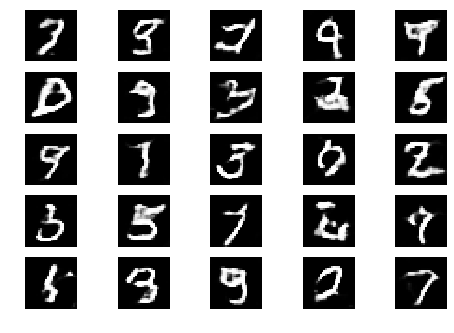

Epoch 2 Batch 101/937 [D loss: 0.518960, acc.: 75.00%] [G loss: 1.247638]


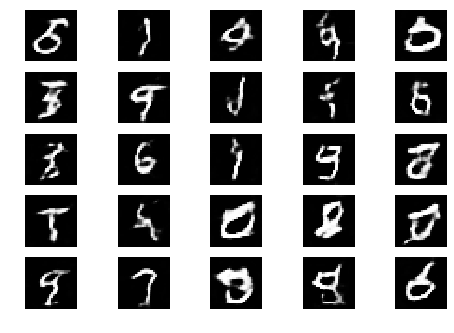

Epoch 2 Batch 102/937 [D loss: 0.717589, acc.: 50.00%] [G loss: 1.075017]


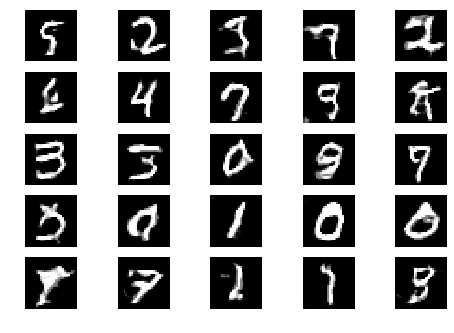

Epoch 2 Batch 103/937 [D loss: 0.494111, acc.: 81.25%] [G loss: 1.035070]
Epoch 2 Batch 104/937 [D loss: 0.551124, acc.: 62.50%] [G loss: 1.131893]
Epoch 2 Batch 105/937 [D loss: 0.686708, acc.: 62.50%] [G loss: 1.241764]
Epoch 2 Batch 106/937 [D loss: 0.765143, acc.: 53.12%] [G loss: 0.951732]
Epoch 2 Batch 107/937 [D loss: 0.616237, acc.: 75.00%] [G loss: 1.109204]
Epoch 2 Batch 108/937 [D loss: 0.661505, acc.: 59.38%] [G loss: 1.161751]
Epoch 2 Batch 109/937 [D loss: 0.751016, acc.: 50.00%] [G loss: 0.966299]
Epoch 2 Batch 110/937 [D loss: 0.726658, acc.: 59.38%] [G loss: 1.162730]
Epoch 2 Batch 111/937 [D loss: 0.693095, acc.: 62.50%] [G loss: 1.232020]
Epoch 2 Batch 112/937 [D loss: 0.617805, acc.: 71.88%] [G loss: 1.048746]
Epoch 2 Batch 113/937 [D loss: 0.707085, acc.: 56.25%] [G loss: 1.138346]
Epoch 2 Batch 114/937 [D loss: 0.524098, acc.: 68.75%] [G loss: 1.053713]
Epoch 2 Batch 115/937 [D loss: 1.017238, acc.: 28.12%] [G loss: 0.960353]
Epoch 2 Batch 116/937 [D loss: 0.64888

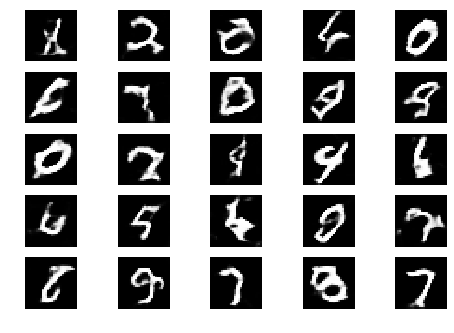

Epoch 2 Batch 201/937 [D loss: 0.579600, acc.: 65.62%] [G loss: 1.145103]
Epoch 2 Batch 202/937 [D loss: 0.581461, acc.: 68.75%] [G loss: 1.099496]


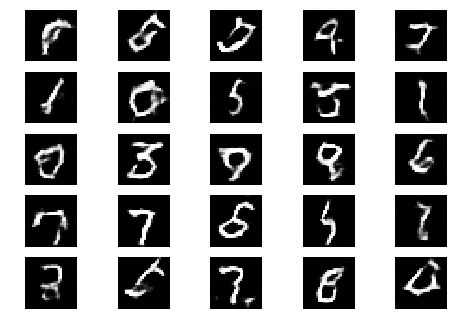

Epoch 2 Batch 203/937 [D loss: 0.727077, acc.: 50.00%] [G loss: 1.044789]
Epoch 2 Batch 204/937 [D loss: 0.748489, acc.: 50.00%] [G loss: 1.087734]


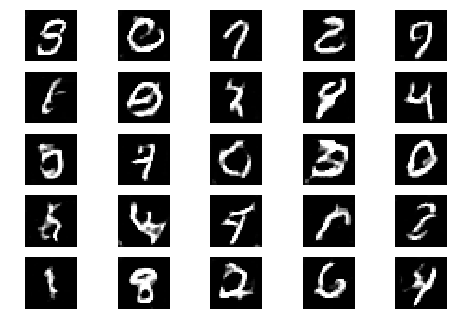

Epoch 2 Batch 205/937 [D loss: 0.607809, acc.: 68.75%] [G loss: 1.140454]
Epoch 2 Batch 206/937 [D loss: 0.697561, acc.: 50.00%] [G loss: 0.864200]
Epoch 2 Batch 207/937 [D loss: 0.542101, acc.: 75.00%] [G loss: 1.099100]
Epoch 2 Batch 208/937 [D loss: 0.480112, acc.: 81.25%] [G loss: 0.990242]
Epoch 2 Batch 209/937 [D loss: 0.644821, acc.: 59.38%] [G loss: 1.145404]
Epoch 2 Batch 210/937 [D loss: 0.588061, acc.: 68.75%] [G loss: 0.905771]
Epoch 2 Batch 211/937 [D loss: 0.682773, acc.: 62.50%] [G loss: 1.164026]
Epoch 2 Batch 212/937 [D loss: 0.691604, acc.: 62.50%] [G loss: 0.777117]
Epoch 2 Batch 213/937 [D loss: 0.667757, acc.: 46.88%] [G loss: 0.895474]
Epoch 2 Batch 214/937 [D loss: 0.630058, acc.: 68.75%] [G loss: 0.963343]
Epoch 2 Batch 215/937 [D loss: 0.627301, acc.: 65.62%] [G loss: 1.153547]
Epoch 2 Batch 216/937 [D loss: 0.610827, acc.: 68.75%] [G loss: 1.032941]
Epoch 2 Batch 217/937 [D loss: 0.732889, acc.: 43.75%] [G loss: 1.154457]
Epoch 2 Batch 218/937 [D loss: 0.59091

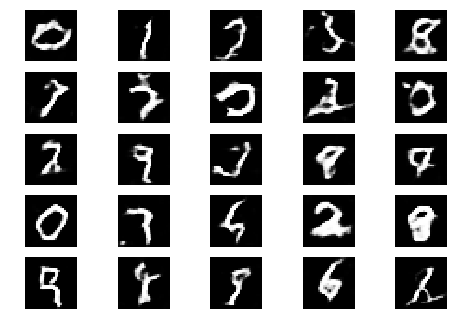

Epoch 2 Batch 301/937 [D loss: 0.602368, acc.: 65.62%] [G loss: 1.087301]
Epoch 2 Batch 302/937 [D loss: 0.666126, acc.: 62.50%] [G loss: 1.111924]
Epoch 2 Batch 303/937 [D loss: 0.626032, acc.: 59.38%] [G loss: 0.880217]


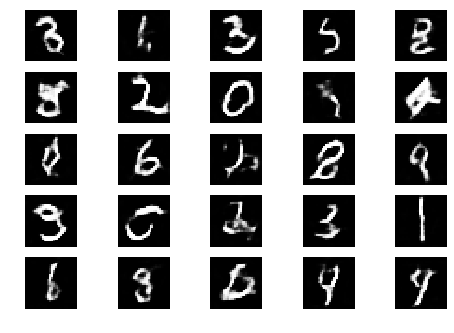

Epoch 2 Batch 304/937 [D loss: 0.543077, acc.: 78.12%] [G loss: 1.127363]
Epoch 2 Batch 305/937 [D loss: 0.772485, acc.: 37.50%] [G loss: 1.187785]
Epoch 2 Batch 306/937 [D loss: 0.718897, acc.: 62.50%] [G loss: 0.951968]


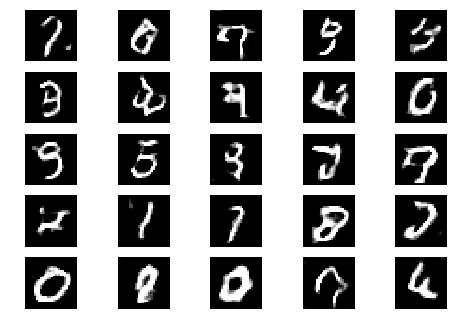

Epoch 2 Batch 307/937 [D loss: 0.520391, acc.: 75.00%] [G loss: 1.140172]
Epoch 2 Batch 308/937 [D loss: 0.682741, acc.: 56.25%] [G loss: 1.122766]
Epoch 2 Batch 309/937 [D loss: 0.707374, acc.: 59.38%] [G loss: 1.030826]
Epoch 2 Batch 310/937 [D loss: 0.749035, acc.: 53.12%] [G loss: 1.027622]
Epoch 2 Batch 311/937 [D loss: 0.467251, acc.: 78.12%] [G loss: 1.082955]
Epoch 2 Batch 312/937 [D loss: 0.646499, acc.: 59.38%] [G loss: 1.007659]
Epoch 2 Batch 313/937 [D loss: 0.674143, acc.: 62.50%] [G loss: 1.064292]
Epoch 2 Batch 314/937 [D loss: 0.654876, acc.: 62.50%] [G loss: 1.088385]
Epoch 2 Batch 315/937 [D loss: 0.617484, acc.: 68.75%] [G loss: 1.009186]
Epoch 2 Batch 316/937 [D loss: 0.623314, acc.: 62.50%] [G loss: 0.947822]
Epoch 2 Batch 317/937 [D loss: 0.640844, acc.: 68.75%] [G loss: 1.018913]
Epoch 2 Batch 318/937 [D loss: 0.707228, acc.: 62.50%] [G loss: 0.961822]
Epoch 2 Batch 319/937 [D loss: 0.711614, acc.: 50.00%] [G loss: 1.241005]
Epoch 2 Batch 320/937 [D loss: 0.52865

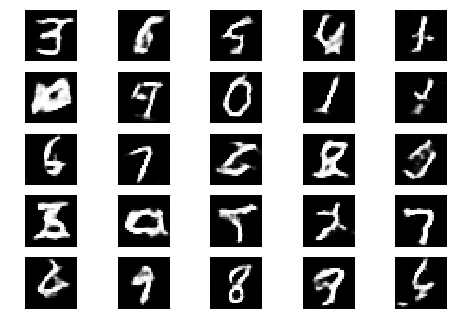

Epoch 2 Batch 401/937 [D loss: 0.649624, acc.: 68.75%] [G loss: 1.039139]
Epoch 2 Batch 402/937 [D loss: 0.528159, acc.: 75.00%] [G loss: 1.065826]
Epoch 2 Batch 403/937 [D loss: 0.649484, acc.: 62.50%] [G loss: 0.983494]
Epoch 2 Batch 404/937 [D loss: 0.726590, acc.: 56.25%] [G loss: 1.061948]


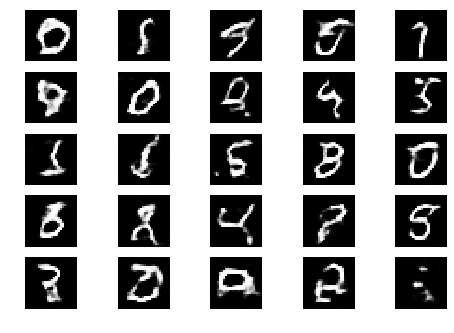

Epoch 2 Batch 405/937 [D loss: 0.577412, acc.: 71.88%] [G loss: 1.037019]
Epoch 2 Batch 406/937 [D loss: 0.607075, acc.: 71.88%] [G loss: 0.862416]
Epoch 2 Batch 407/937 [D loss: 0.488652, acc.: 84.38%] [G loss: 0.900799]
Epoch 2 Batch 408/937 [D loss: 0.789655, acc.: 53.12%] [G loss: 0.998625]


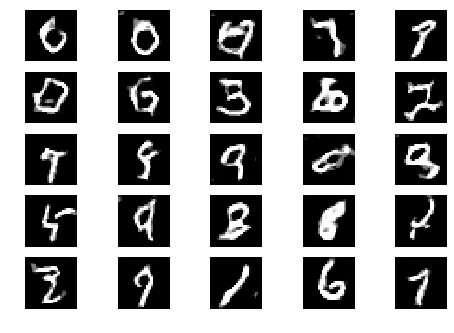

Epoch 2 Batch 409/937 [D loss: 0.615536, acc.: 68.75%] [G loss: 1.227407]
Epoch 2 Batch 410/937 [D loss: 0.619155, acc.: 65.62%] [G loss: 1.023188]
Epoch 2 Batch 411/937 [D loss: 0.683818, acc.: 59.38%] [G loss: 0.932802]
Epoch 2 Batch 412/937 [D loss: 0.667379, acc.: 56.25%] [G loss: 0.945361]
Epoch 2 Batch 413/937 [D loss: 0.675268, acc.: 65.62%] [G loss: 1.019608]
Epoch 2 Batch 414/937 [D loss: 0.763203, acc.: 56.25%] [G loss: 0.963127]
Epoch 2 Batch 415/937 [D loss: 0.739016, acc.: 56.25%] [G loss: 1.100680]
Epoch 2 Batch 416/937 [D loss: 0.546577, acc.: 78.12%] [G loss: 1.104261]
Epoch 2 Batch 417/937 [D loss: 0.712291, acc.: 46.88%] [G loss: 1.092516]
Epoch 2 Batch 418/937 [D loss: 0.732071, acc.: 56.25%] [G loss: 1.256670]
Epoch 2 Batch 419/937 [D loss: 0.443069, acc.: 81.25%] [G loss: 0.980121]
Epoch 2 Batch 420/937 [D loss: 0.745614, acc.: 50.00%] [G loss: 0.904198]
Epoch 2 Batch 421/937 [D loss: 0.495911, acc.: 75.00%] [G loss: 0.887876]
Epoch 2 Batch 422/937 [D loss: 0.76187

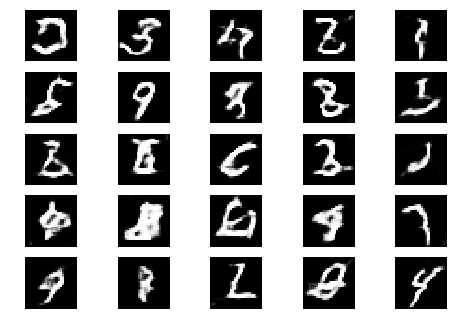

Epoch 2 Batch 501/937 [D loss: 0.590811, acc.: 65.62%] [G loss: 1.042461]
Epoch 2 Batch 502/937 [D loss: 0.764081, acc.: 43.75%] [G loss: 1.086868]
Epoch 2 Batch 503/937 [D loss: 0.782624, acc.: 46.88%] [G loss: 0.799123]
Epoch 2 Batch 504/937 [D loss: 0.445589, acc.: 87.50%] [G loss: 0.999864]
Epoch 2 Batch 505/937 [D loss: 0.673571, acc.: 62.50%] [G loss: 0.969680]


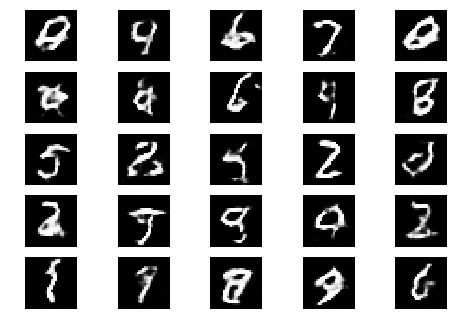

Epoch 2 Batch 506/937 [D loss: 0.628366, acc.: 71.88%] [G loss: 0.874422]
Epoch 2 Batch 507/937 [D loss: 0.771776, acc.: 50.00%] [G loss: 0.817382]
Epoch 2 Batch 508/937 [D loss: 0.572803, acc.: 75.00%] [G loss: 1.184092]
Epoch 2 Batch 509/937 [D loss: 0.739020, acc.: 50.00%] [G loss: 1.115621]
Epoch 2 Batch 510/937 [D loss: 0.822927, acc.: 53.12%] [G loss: 1.163480]


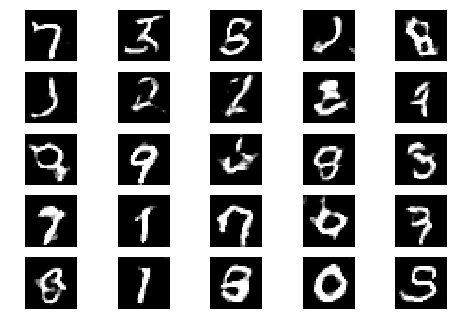

Epoch 2 Batch 511/937 [D loss: 0.570098, acc.: 71.88%] [G loss: 1.236315]
Epoch 2 Batch 512/937 [D loss: 0.602161, acc.: 68.75%] [G loss: 1.073228]
Epoch 2 Batch 513/937 [D loss: 0.783271, acc.: 62.50%] [G loss: 0.967183]
Epoch 2 Batch 514/937 [D loss: 0.643684, acc.: 62.50%] [G loss: 0.932812]
Epoch 2 Batch 515/937 [D loss: 0.735522, acc.: 59.38%] [G loss: 1.205730]
Epoch 2 Batch 516/937 [D loss: 0.620631, acc.: 56.25%] [G loss: 0.846655]
Epoch 2 Batch 517/937 [D loss: 0.675033, acc.: 62.50%] [G loss: 1.126914]
Epoch 2 Batch 518/937 [D loss: 0.553155, acc.: 75.00%] [G loss: 1.122861]
Epoch 2 Batch 519/937 [D loss: 0.652632, acc.: 59.38%] [G loss: 1.217418]
Epoch 2 Batch 520/937 [D loss: 0.582037, acc.: 75.00%] [G loss: 1.250232]
Epoch 2 Batch 521/937 [D loss: 0.594630, acc.: 62.50%] [G loss: 1.180609]
Epoch 2 Batch 522/937 [D loss: 0.625053, acc.: 59.38%] [G loss: 0.949644]
Epoch 2 Batch 523/937 [D loss: 0.832808, acc.: 43.75%] [G loss: 0.901737]
Epoch 2 Batch 524/937 [D loss: 0.74130

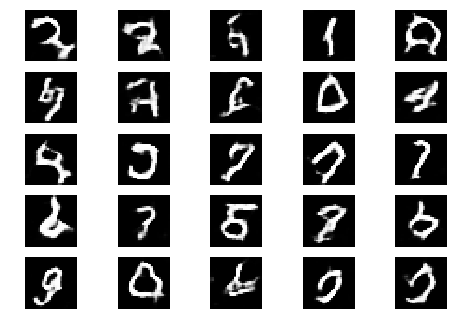

Epoch 2 Batch 601/937 [D loss: 0.542958, acc.: 71.88%] [G loss: 1.108004]
Epoch 2 Batch 602/937 [D loss: 0.543635, acc.: 78.12%] [G loss: 0.893549]
Epoch 2 Batch 603/937 [D loss: 0.761905, acc.: 46.88%] [G loss: 1.096141]
Epoch 2 Batch 604/937 [D loss: 0.649314, acc.: 65.62%] [G loss: 0.904782]
Epoch 2 Batch 605/937 [D loss: 0.566951, acc.: 71.88%] [G loss: 1.147109]
Epoch 2 Batch 606/937 [D loss: 0.647450, acc.: 56.25%] [G loss: 1.112930]


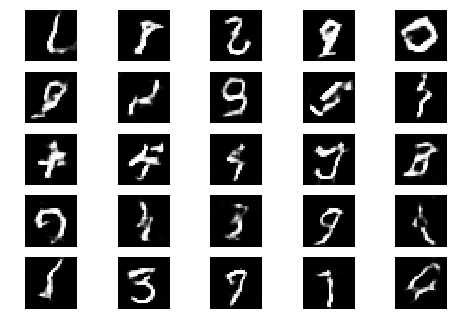

Epoch 2 Batch 607/937 [D loss: 0.689235, acc.: 56.25%] [G loss: 1.151330]
Epoch 2 Batch 608/937 [D loss: 0.680279, acc.: 56.25%] [G loss: 1.153481]
Epoch 2 Batch 609/937 [D loss: 0.965416, acc.: 40.62%] [G loss: 1.069579]
Epoch 2 Batch 610/937 [D loss: 0.662642, acc.: 53.12%] [G loss: 0.992754]
Epoch 2 Batch 611/937 [D loss: 0.677933, acc.: 65.62%] [G loss: 0.901179]
Epoch 2 Batch 612/937 [D loss: 0.459341, acc.: 81.25%] [G loss: 1.031254]


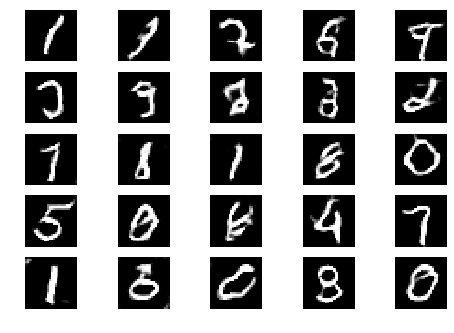

Epoch 2 Batch 613/937 [D loss: 0.624871, acc.: 62.50%] [G loss: 0.890971]
Epoch 2 Batch 614/937 [D loss: 0.590703, acc.: 75.00%] [G loss: 0.984785]
Epoch 2 Batch 615/937 [D loss: 0.536575, acc.: 78.12%] [G loss: 1.209174]
Epoch 2 Batch 616/937 [D loss: 0.823310, acc.: 46.88%] [G loss: 1.112408]
Epoch 2 Batch 617/937 [D loss: 0.692280, acc.: 59.38%] [G loss: 0.985917]
Epoch 2 Batch 618/937 [D loss: 0.672807, acc.: 62.50%] [G loss: 1.053029]
Epoch 2 Batch 619/937 [D loss: 0.528558, acc.: 78.12%] [G loss: 1.111067]
Epoch 2 Batch 620/937 [D loss: 0.692951, acc.: 56.25%] [G loss: 0.922465]
Epoch 2 Batch 621/937 [D loss: 0.686882, acc.: 59.38%] [G loss: 1.062348]
Epoch 2 Batch 622/937 [D loss: 0.517981, acc.: 75.00%] [G loss: 0.862827]
Epoch 2 Batch 623/937 [D loss: 0.684817, acc.: 59.38%] [G loss: 0.975783]
Epoch 2 Batch 624/937 [D loss: 0.628532, acc.: 68.75%] [G loss: 1.074521]
Epoch 2 Batch 625/937 [D loss: 0.644602, acc.: 56.25%] [G loss: 0.880868]
Epoch 2 Batch 626/937 [D loss: 0.59646

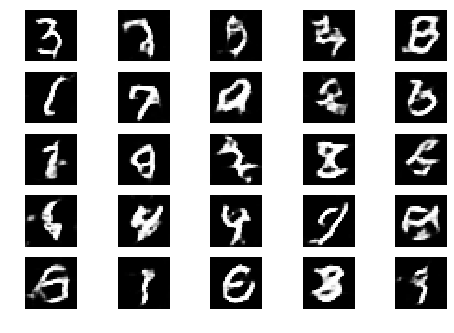

Epoch 2 Batch 701/937 [D loss: 0.506915, acc.: 78.12%] [G loss: 0.982008]
Epoch 2 Batch 702/937 [D loss: 0.697717, acc.: 53.12%] [G loss: 0.986527]
Epoch 2 Batch 703/937 [D loss: 0.622870, acc.: 65.62%] [G loss: 0.979936]
Epoch 2 Batch 704/937 [D loss: 0.498347, acc.: 75.00%] [G loss: 1.002675]
Epoch 2 Batch 705/937 [D loss: 0.588647, acc.: 68.75%] [G loss: 1.168880]
Epoch 2 Batch 706/937 [D loss: 0.722987, acc.: 56.25%] [G loss: 0.800876]
Epoch 2 Batch 707/937 [D loss: 0.557031, acc.: 75.00%] [G loss: 0.827368]


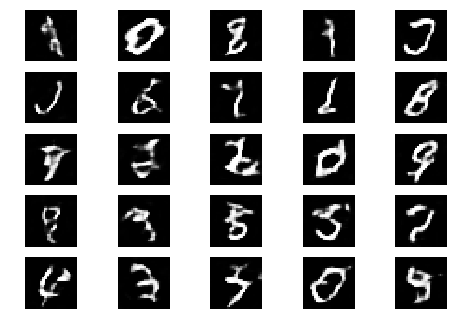

Epoch 2 Batch 708/937 [D loss: 0.668044, acc.: 59.38%] [G loss: 0.834547]
Epoch 2 Batch 709/937 [D loss: 0.650068, acc.: 62.50%] [G loss: 0.905709]
Epoch 2 Batch 710/937 [D loss: 0.585398, acc.: 68.75%] [G loss: 0.868776]
Epoch 2 Batch 711/937 [D loss: 0.537727, acc.: 78.12%] [G loss: 1.079640]
Epoch 2 Batch 712/937 [D loss: 0.603573, acc.: 62.50%] [G loss: 1.135817]
Epoch 2 Batch 713/937 [D loss: 0.526338, acc.: 68.75%] [G loss: 1.187536]
Epoch 2 Batch 714/937 [D loss: 0.826810, acc.: 56.25%] [G loss: 1.082477]


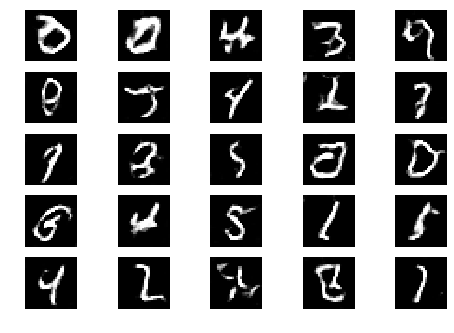

Epoch 2 Batch 715/937 [D loss: 0.367686, acc.: 93.75%] [G loss: 1.084819]
Epoch 2 Batch 716/937 [D loss: 0.683904, acc.: 56.25%] [G loss: 1.113668]
Epoch 2 Batch 717/937 [D loss: 0.557055, acc.: 65.62%] [G loss: 1.235789]
Epoch 2 Batch 718/937 [D loss: 0.694296, acc.: 56.25%] [G loss: 1.159595]
Epoch 2 Batch 719/937 [D loss: 0.704786, acc.: 59.38%] [G loss: 1.207938]
Epoch 2 Batch 720/937 [D loss: 0.668544, acc.: 59.38%] [G loss: 0.761526]
Epoch 2 Batch 721/937 [D loss: 0.715191, acc.: 59.38%] [G loss: 0.939227]
Epoch 2 Batch 722/937 [D loss: 0.484893, acc.: 78.12%] [G loss: 1.032291]
Epoch 2 Batch 723/937 [D loss: 0.618453, acc.: 75.00%] [G loss: 0.962780]
Epoch 2 Batch 724/937 [D loss: 0.747551, acc.: 59.38%] [G loss: 0.942454]
Epoch 2 Batch 725/937 [D loss: 0.661984, acc.: 62.50%] [G loss: 1.243986]
Epoch 2 Batch 726/937 [D loss: 0.585710, acc.: 65.62%] [G loss: 0.944113]
Epoch 2 Batch 727/937 [D loss: 0.581621, acc.: 65.62%] [G loss: 0.981246]
Epoch 2 Batch 728/937 [D loss: 0.65548

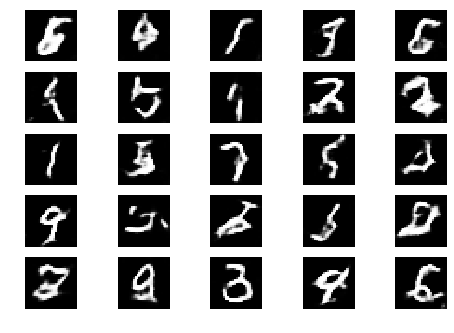

Epoch 2 Batch 801/937 [D loss: 0.629082, acc.: 71.88%] [G loss: 1.030274]
Epoch 2 Batch 802/937 [D loss: 0.628927, acc.: 65.62%] [G loss: 0.954461]
Epoch 2 Batch 803/937 [D loss: 0.708479, acc.: 53.12%] [G loss: 1.034785]
Epoch 2 Batch 804/937 [D loss: 0.665501, acc.: 65.62%] [G loss: 0.942517]
Epoch 2 Batch 805/937 [D loss: 0.644492, acc.: 62.50%] [G loss: 1.012765]
Epoch 2 Batch 806/937 [D loss: 0.720459, acc.: 53.12%] [G loss: 1.151367]
Epoch 2 Batch 807/937 [D loss: 0.732319, acc.: 56.25%] [G loss: 0.991675]
Epoch 2 Batch 808/937 [D loss: 0.570564, acc.: 65.62%] [G loss: 0.984632]


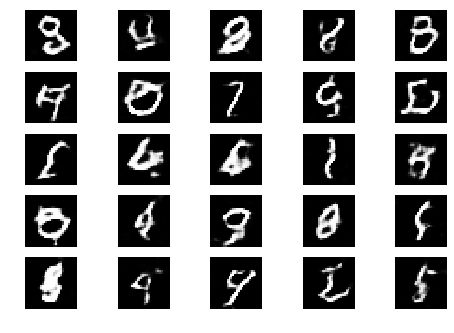

Epoch 2 Batch 809/937 [D loss: 0.751839, acc.: 53.12%] [G loss: 1.075310]
Epoch 2 Batch 810/937 [D loss: 0.680291, acc.: 59.38%] [G loss: 0.831344]
Epoch 2 Batch 811/937 [D loss: 0.662313, acc.: 62.50%] [G loss: 0.923764]
Epoch 2 Batch 812/937 [D loss: 0.526015, acc.: 78.12%] [G loss: 1.084580]
Epoch 2 Batch 813/937 [D loss: 0.675929, acc.: 50.00%] [G loss: 0.957635]
Epoch 2 Batch 814/937 [D loss: 0.601367, acc.: 65.62%] [G loss: 0.929988]
Epoch 2 Batch 815/937 [D loss: 0.624379, acc.: 65.62%] [G loss: 1.186548]
Epoch 2 Batch 816/937 [D loss: 0.761196, acc.: 56.25%] [G loss: 0.964025]


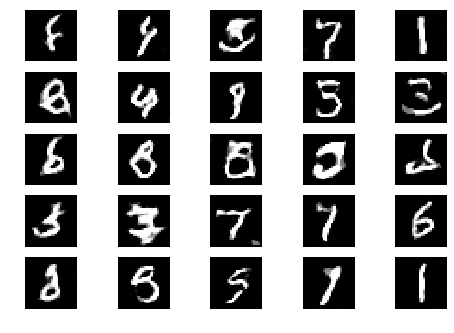

Epoch 2 Batch 817/937 [D loss: 0.686627, acc.: 62.50%] [G loss: 0.895771]
Epoch 2 Batch 818/937 [D loss: 0.759982, acc.: 40.62%] [G loss: 1.146012]
Epoch 2 Batch 819/937 [D loss: 0.723074, acc.: 56.25%] [G loss: 1.182896]
Epoch 2 Batch 820/937 [D loss: 0.565606, acc.: 81.25%] [G loss: 1.033172]
Epoch 2 Batch 821/937 [D loss: 0.583126, acc.: 68.75%] [G loss: 1.025605]
Epoch 2 Batch 822/937 [D loss: 0.740846, acc.: 56.25%] [G loss: 1.053246]
Epoch 2 Batch 823/937 [D loss: 0.808733, acc.: 56.25%] [G loss: 1.223008]
Epoch 2 Batch 824/937 [D loss: 0.517296, acc.: 71.88%] [G loss: 1.063794]
Epoch 2 Batch 825/937 [D loss: 0.695276, acc.: 62.50%] [G loss: 1.130469]
Epoch 2 Batch 826/937 [D loss: 0.502201, acc.: 78.12%] [G loss: 1.189574]
Epoch 2 Batch 827/937 [D loss: 0.698859, acc.: 59.38%] [G loss: 1.009089]
Epoch 2 Batch 828/937 [D loss: 0.726852, acc.: 50.00%] [G loss: 0.936108]
Epoch 2 Batch 829/937 [D loss: 0.742152, acc.: 59.38%] [G loss: 0.712015]
Epoch 2 Batch 830/937 [D loss: 0.74299

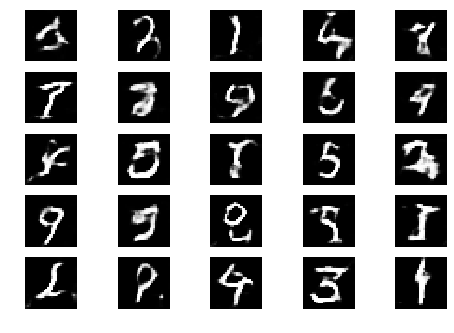

Epoch 2 Batch 901/937 [D loss: 0.741891, acc.: 50.00%] [G loss: 1.098461]
Epoch 2 Batch 902/937 [D loss: 0.534266, acc.: 75.00%] [G loss: 1.273124]
Epoch 2 Batch 903/937 [D loss: 0.527579, acc.: 71.88%] [G loss: 1.246564]
Epoch 2 Batch 904/937 [D loss: 0.795462, acc.: 50.00%] [G loss: 1.061905]
Epoch 2 Batch 905/937 [D loss: 0.538918, acc.: 78.12%] [G loss: 1.084973]
Epoch 2 Batch 906/937 [D loss: 0.672854, acc.: 59.38%] [G loss: 1.044260]
Epoch 2 Batch 907/937 [D loss: 0.592368, acc.: 59.38%] [G loss: 0.999323]
Epoch 2 Batch 908/937 [D loss: 0.443260, acc.: 81.25%] [G loss: 1.136523]
Epoch 2 Batch 909/937 [D loss: 0.666763, acc.: 59.38%] [G loss: 1.224310]


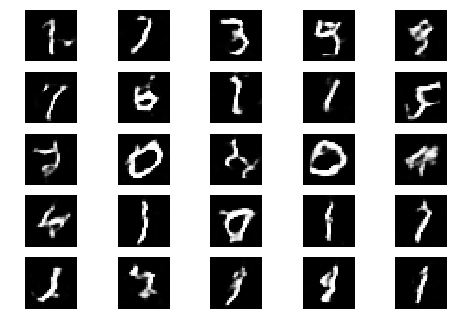

Epoch 2 Batch 910/937 [D loss: 0.653069, acc.: 68.75%] [G loss: 1.092756]
Epoch 2 Batch 911/937 [D loss: 0.547833, acc.: 68.75%] [G loss: 1.187886]
Epoch 2 Batch 912/937 [D loss: 0.668826, acc.: 59.38%] [G loss: 0.954473]
Epoch 2 Batch 913/937 [D loss: 0.621076, acc.: 65.62%] [G loss: 1.042199]
Epoch 2 Batch 914/937 [D loss: 0.708742, acc.: 59.38%] [G loss: 0.994820]
Epoch 2 Batch 915/937 [D loss: 0.568194, acc.: 81.25%] [G loss: 1.060315]
Epoch 2 Batch 916/937 [D loss: 0.630551, acc.: 65.62%] [G loss: 1.003361]
Epoch 2 Batch 917/937 [D loss: 0.547501, acc.: 81.25%] [G loss: 0.853608]
Epoch 2 Batch 918/937 [D loss: 0.828950, acc.: 40.62%] [G loss: 0.925597]


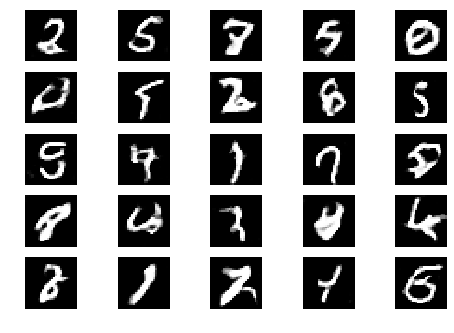

Epoch 2 Batch 919/937 [D loss: 0.650070, acc.: 59.38%] [G loss: 0.980521]
Epoch 2 Batch 920/937 [D loss: 0.728999, acc.: 59.38%] [G loss: 1.163245]
Epoch 2 Batch 921/937 [D loss: 0.500315, acc.: 87.50%] [G loss: 0.882137]
Epoch 2 Batch 922/937 [D loss: 0.774256, acc.: 56.25%] [G loss: 0.720166]
Epoch 2 Batch 923/937 [D loss: 0.528424, acc.: 75.00%] [G loss: 1.032409]
Epoch 2 Batch 924/937 [D loss: 0.610253, acc.: 71.88%] [G loss: 0.828205]
Epoch 2 Batch 925/937 [D loss: 0.622085, acc.: 71.88%] [G loss: 0.700024]
Epoch 2 Batch 926/937 [D loss: 0.630961, acc.: 62.50%] [G loss: 0.985898]
Epoch 2 Batch 927/937 [D loss: 0.553105, acc.: 75.00%] [G loss: 0.893946]
Epoch 2 Batch 928/937 [D loss: 0.562978, acc.: 68.75%] [G loss: 1.072698]
Epoch 2 Batch 929/937 [D loss: 0.740147, acc.: 53.12%] [G loss: 1.013349]
Epoch 2 Batch 930/937 [D loss: 0.725629, acc.: 68.75%] [G loss: 1.054283]
Epoch 2 Batch 931/937 [D loss: 0.653777, acc.: 56.25%] [G loss: 1.230436]
Epoch 2 Batch 932/937 [D loss: 0.55493

In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1, modeltotrain=3)

In [0]:
plotamodel(combined)
files.download('model.png')

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_17 (InputLayer)           (None, 100)          0                                            
__________________________________________________________________________________________________
dense_25 (Dense)                (None, 6272)         633472      input_17[0][0]                   
__________________________________________________________________________________________________
dense_26 (Dense)                (None, 6272)         633472      input_17[0][0]                   
__________________________________________________________________________________________________
reshape_17 (Reshape)            (None, 7, 7, 128)    0           dense_25[0][0]                   
__________________________________________________________________________________________________
reshape_18

In [0]:
!rm -rf generatorTrainedepoch2.h5

generator1.save('generator1fminst.h5')

!rm -rf generator2Trainedepoch2.h5

generator2.save('generator2fminst.h5')


In [0]:
generator1 = generator1.load_weights('generator1fmnist.h5')

In [0]:
generator2 = generator2.load_weights('generator2fmnist.h5')

In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1)

In [0]:
generator1.save('generatorTrained1epoch4.h5')

In [0]:
files.download('generatorTrainedepoch2.h5')

In [0]:
##files.download('discriminator1.h5')

In [0]:
##files.download('combined1.h5')

In [0]:
#generator1 = load_model('generator1.h5')
#discriminator1 = load_model('discriminator1.h5')
#combined1 = load_model('combined1.h5')

